In [1]:
# Use kernal 10x-processing

In [2]:
import sys
print(sys.executable)
print(sys.path)

/labs/Murphy/SharedCondaEnv/miniconda3/bin/python
['/labs/Murphy/SharedCondaEnv', '/labs/Murphy/SharedCondaEnv/miniconda3/lib/python310.zip', '/labs/Murphy/SharedCondaEnv/miniconda3/lib/python3.10', '/labs/Murphy/SharedCondaEnv/miniconda3/lib/python3.10/lib-dynload', '', '/labs/Murphy/SharedCondaEnv/miniconda3/lib/python3.10/site-packages', '/labs/Murphy/SharedCondaEnv/miniconda3/lib/python3.10/site-packages/setuptools/_vendor']


In [3]:
#pip install "numba<0.59"


In [4]:
import warnings
warnings.filterwarnings(
    "ignore",
    message=".*NumbaDeprecationWarning.*",
)

import scanpy as sc
import os
from pathlib import Path
import gseapy as gp
import pandas as pd
import numpy as np
import anndata as ad
import anndata2ri
import pegasus as pg
import scvi
import scrublet as scr
import decoupler as dc
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
import scipy.stats as stats
from scipy import stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")
from statannotations.Annotator import Annotator
import matplotlib as mpl 
import gc
import re


/labs/Murphy/SharedCondaEnv/miniconda3/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/labs/Murphy/SharedCondaEnv/miniconda3/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/labs/Murphy/SharedCondaEnv/miniconda3/lib/python3.10/site-pac

scanpy==1.10.3 anndata==0.8.0 umap==0.5.3 numpy==1.26.4 scipy==1.11.4 pandas==2.2.3 scikit-learn==1.5.2 statsmodels==0.14.0 igraph==0.10.4 pynndescent==0.5.10


In [5]:
from scipy.stats import spearmanr
from matplotlib.backends.backend_pdf import PdfPages

In [6]:
#import rpy2
#import rpy2.robjects as robjects
#from rpy2.robjects import numpy2ri
#from rpy2.robjects.packages import importr
#from rpy2.robjects import pandas2ri
#from rpy2.robjects.conversion import localconverter
#import pybiomart
#import gdown
#import MACA as maca
#import time
#import statsmodels.stats as sms
#print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

# Import h5ad files

In [6]:
# Biopsies will are 10x kit v3 and others v4, all run with Cell ranger 8 on our cluster (and genome)

#Sept 2022
#Sample 20
#Sample 21

#April 2025
#Biopsy1 = 1
#Biopsy2 = 2
#Biopsy3 = 3

#Note - initially thought the order was as provided to Bo, but realized the correct order should be:

#May 2025
#IVSDuke1 = 2025MayCITEseqCAVDukeUCLA1 = IVS-Duke1 (this one was correct) = May2025_IVSDuke1
#IVSDuke2 = 2025MayCITEseqCAVDukeUCLA2 = IVS-Duke2 (this one was correct) = May2025_IVSDuke2
#LADUCLA = 2025MayCITEseqCAVDukeUCLA3 = LAD-UCLA (this one was correct) = May2025_LADUCLA
#RVDuke1 = 2025MayCITEseqCAVDukeUCLA4 = RV-LV-UCLA (this one was NOT correct) = May2025_RVDuke1
#RVDuke2 = 2025MayCITEseqCAVDukeUCLA5 = RV-Duke1 (this one was NOT correct) = May2025_RVDuke2
#RVLVUCLA = 2025MayCITEseqCAVDukeUCLA6 = RV-Duke2 (this one was NOT correct) = May2025_RVLVUCLA

#Dec 2025
#Ran deeper protein analysis of my data, to add to prior cellbender count data for GEX

#10x cellranger files
Sept2022_Sample20_cellranger_h5 = '/home/FCAM/pmurphy/2022Sept_biopsy_UCLA/2022SeptCITEseqChrisBiopsy20_CellRang8/2022SeptCITEseqChrisBiopsy20_CellRang8/outs/filtered_feature_bc_matrix.h5'
Sept2022_Sample21_cellranger_h5 = '/home/FCAM/pmurphy/2022Sept_biopsy_UCLA/2022SeptCITEseqChrisBiopsy21_CellRang8/2022SeptCITEseqChrisBiopsy21_CellRang8/outs/filtered_feature_bc_matrix.h5'
April2025_Sample1_cellranger_h5 = '/home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy1_CellRang8/2025MayCITEseqUCLAbiopsy1/outs/filtered_feature_bc_matrix.h5'
April2025_Sample2_cellranger_h5 = '/home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy2_CellRang8/2025MayCITEseqUCLAbiopsy2/outs/filtered_feature_bc_matrix.h5'
April2025_Sample3_cellranger_h5 = '/home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy3_CellRang8/2025MayCITEseqUCLAbiopsy3/outs/filtered_feature_bc_matrix.h5'
May2025_IVSDuke1_cellranger_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025May_CAV_DukeUCLA_CellRangerDeeperAb/DeeperAbCSP1_filtered_feature_bc_matrix.h5'
May2025_IVSDuke2_cellranger_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025May_CAV_DukeUCLA_CellRangerDeeperAb/DeeperAbCSP2_filtered_feature_bc_matrix.h5'
May2025_LADUCLA_cellranger_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025May_CAV_DukeUCLA_CellRangerDeeperAb/DeeperAbCSP3_filtered_feature_bc_matrix.h5'
May2025_RVDuke1_cellranger_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025May_CAV_DukeUCLA_CellRangerDeeperAb/DeeperAbCSP4_filtered_feature_bc_matrix.h5'
May2025_RVDuke2_cellranger_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025May_CAV_DukeUCLA_CellRangerDeeperAb/DeeperAbCSP5_filtered_feature_bc_matrix.h5'
May2025_RVLVUCLA_cellranger_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025May_CAV_DukeUCLA_CellRangerDeeperAb/DeeperAbCSP6_filtered_feature_bc_matrix.h5'


#Cellbender files for cleaner analysis
Sept2022_Sample20_cellbender_h5 = '/home/FCAM/pmurphy/2022Sept_biopsy_UCLA/2022SeptCITEseqChrisBiopsy20_CellRang8/2022SeptCITEseqChrisBiopsy20_CellRang8/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
Sept2022_Sample21_cellbender_h5 = '/home/FCAM/pmurphy/2022Sept_biopsy_UCLA/2022SeptCITEseqChrisBiopsy21_CellRang8/2022SeptCITEseqChrisBiopsy21_CellRang8/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
April2025_Sample1_cellbender_h5 = '/home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy1_CellRang8/2025MayCITEseqUCLAbiopsy1/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
April2025_Sample2_cellbender_h5 = '/home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy2_CellRang8/2025MayCITEseqUCLAbiopsy2/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
April2025_Sample3_cellbender_h5 = '/home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy3_CellRang8/2025MayCITEseqUCLAbiopsy3/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
May2025_IVSDuke1_cellbender_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA1/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
May2025_IVSDuke2_cellbender_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA2/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
May2025_LADUCLA_cellbender_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA3/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
May2025_RVDuke1_cellbender_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA4/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
May2025_RVDuke2_cellbender_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA5/outs/raw_feature_bc_matrix.cellbender_filtered.h5'
May2025_RVLVUCLA_cellbender_h5 = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA6/outs/raw_feature_bc_matrix.cellbender_filtered.h5'


In [7]:
interactions = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_LADUCLA",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_RVLVUCLA"
]

for interaction in interactions:
    line = f"{interaction}_cellranger = sc.read_10x_h5({interaction}_cellranger_h5, gex_only=False)"
    print(line)
    print(f"{interaction}_cellranger.var_names_make_unique()")
    print()

Sept2022_Sample20_cellranger = sc.read_10x_h5(Sept2022_Sample20_cellranger_h5, gex_only=False)
Sept2022_Sample20_cellranger.var_names_make_unique()

Sept2022_Sample21_cellranger = sc.read_10x_h5(Sept2022_Sample21_cellranger_h5, gex_only=False)
Sept2022_Sample21_cellranger.var_names_make_unique()

April2025_Sample1_cellranger = sc.read_10x_h5(April2025_Sample1_cellranger_h5, gex_only=False)
April2025_Sample1_cellranger.var_names_make_unique()

April2025_Sample2_cellranger = sc.read_10x_h5(April2025_Sample2_cellranger_h5, gex_only=False)
April2025_Sample2_cellranger.var_names_make_unique()

April2025_Sample3_cellranger = sc.read_10x_h5(April2025_Sample3_cellranger_h5, gex_only=False)
April2025_Sample3_cellranger.var_names_make_unique()

May2025_IVSDuke1_cellranger = sc.read_10x_h5(May2025_IVSDuke1_cellranger_h5, gex_only=False)
May2025_IVSDuke1_cellranger.var_names_make_unique()

May2025_IVSDuke2_cellranger = sc.read_10x_h5(May2025_IVSDuke2_cellranger_h5, gex_only=False)
May2025_IVSDuke2

In [8]:
interactions = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_LADUCLA",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_RVLVUCLA"
]

for interaction in interactions:
    line = f"{interaction} = sc.read_10x_h5({interaction}_cellbender_h5, gex_only=False)"
    print(line)
    print(f"{interaction}.var_names_make_unique()")
    print()

Sept2022_Sample20 = sc.read_10x_h5(Sept2022_Sample20_cellbender_h5, gex_only=False)
Sept2022_Sample20.var_names_make_unique()

Sept2022_Sample21 = sc.read_10x_h5(Sept2022_Sample21_cellbender_h5, gex_only=False)
Sept2022_Sample21.var_names_make_unique()

April2025_Sample1 = sc.read_10x_h5(April2025_Sample1_cellbender_h5, gex_only=False)
April2025_Sample1.var_names_make_unique()

April2025_Sample2 = sc.read_10x_h5(April2025_Sample2_cellbender_h5, gex_only=False)
April2025_Sample2.var_names_make_unique()

April2025_Sample3 = sc.read_10x_h5(April2025_Sample3_cellbender_h5, gex_only=False)
April2025_Sample3.var_names_make_unique()

May2025_IVSDuke1 = sc.read_10x_h5(May2025_IVSDuke1_cellbender_h5, gex_only=False)
May2025_IVSDuke1.var_names_make_unique()

May2025_IVSDuke2 = sc.read_10x_h5(May2025_IVSDuke2_cellbender_h5, gex_only=False)
May2025_IVSDuke2.var_names_make_unique()

May2025_LADUCLA = sc.read_10x_h5(May2025_LADUCLA_cellbender_h5, gex_only=False)
May2025_LADUCLA.var_names_make_unique

In [9]:
#Cellranger for protein

Sept2022_Sample20_cellranger = sc.read_10x_h5(Sept2022_Sample20_cellranger_h5, gex_only=False)
Sept2022_Sample20_cellranger.var_names_make_unique()

Sept2022_Sample21_cellranger = sc.read_10x_h5(Sept2022_Sample21_cellranger_h5, gex_only=False)
Sept2022_Sample21_cellranger.var_names_make_unique()

April2025_Sample1_cellranger = sc.read_10x_h5(April2025_Sample1_cellranger_h5, gex_only=False)
April2025_Sample1_cellranger.var_names_make_unique()

April2025_Sample2_cellranger = sc.read_10x_h5(April2025_Sample2_cellranger_h5, gex_only=False)
April2025_Sample2_cellranger.var_names_make_unique()

April2025_Sample3_cellranger = sc.read_10x_h5(April2025_Sample3_cellranger_h5, gex_only=False)
April2025_Sample3_cellranger.var_names_make_unique()

May2025_IVSDuke1_cellranger = sc.read_10x_h5(May2025_IVSDuke1_cellranger_h5, gex_only=False)
May2025_IVSDuke1_cellranger.var_names_make_unique()

May2025_IVSDuke2_cellranger = sc.read_10x_h5(May2025_IVSDuke2_cellranger_h5, gex_only=False)
May2025_IVSDuke2_cellranger.var_names_make_unique()

May2025_LADUCLA_cellranger = sc.read_10x_h5(May2025_LADUCLA_cellranger_h5, gex_only=False)
May2025_LADUCLA_cellranger.var_names_make_unique()

May2025_RVDuke1_cellranger = sc.read_10x_h5(May2025_RVDuke1_cellranger_h5, gex_only=False)
May2025_RVDuke1_cellranger.var_names_make_unique()

May2025_RVDuke2_cellranger = sc.read_10x_h5(May2025_RVDuke2_cellranger_h5, gex_only=False)
May2025_RVDuke2_cellranger.var_names_make_unique()

May2025_RVLVUCLA_cellranger = sc.read_10x_h5(May2025_RVLVUCLA_cellranger_h5, gex_only=False)
May2025_RVLVUCLA_cellranger.var_names_make_unique()

reading /home/FCAM/pmurphy/2022Sept_biopsy_UCLA/2022SeptCITEseqChrisBiopsy20_CellRang8/2022SeptCITEseqChrisBiopsy20_CellRang8/outs/filtered_feature_bc_matrix.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2022Sept_biopsy_UCLA/2022SeptCITEseqChrisBiopsy21_CellRang8/2022SeptCITEseqChrisBiopsy21_CellRang8/outs/filtered_feature_bc_matrix.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy1_CellRang8/2025MayCITEseqUCLAbiopsy1/outs/filtered_feature_bc_matrix.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy2_CellRang8/2025MayCITEseqUCLAbiopsy2/outs/filtered_feature_bc_matrix.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy3_CellRang8/2025MayCITEseqUCLAbiopsy3/outs/filtered_feature_bc_matrix.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025May_CAV_DukeUCLA_CellRangerDeeperAb/DeeperAbCSP1_filtered_feature_bc_matrix.h5
 (0:00:03)
reading /home

In [10]:
#Cellbender - for GEX

Sept2022_Sample20_cellbender = sc.read_10x_h5(Sept2022_Sample20_cellbender_h5, gex_only=False)
Sept2022_Sample20_cellbender.var_names_make_unique()

Sept2022_Sample21_cellbender = sc.read_10x_h5(Sept2022_Sample21_cellbender_h5, gex_only=False)
Sept2022_Sample21_cellbender.var_names_make_unique()

April2025_Sample1_cellbender = sc.read_10x_h5(April2025_Sample1_cellbender_h5, gex_only=False)
April2025_Sample1_cellbender.var_names_make_unique()

April2025_Sample2_cellbender = sc.read_10x_h5(April2025_Sample2_cellbender_h5, gex_only=False)
April2025_Sample2_cellbender.var_names_make_unique()

April2025_Sample3_cellbender = sc.read_10x_h5(April2025_Sample3_cellbender_h5, gex_only=False)
April2025_Sample3_cellbender.var_names_make_unique()

May2025_IVSDuke1_cellbender = sc.read_10x_h5(May2025_IVSDuke1_cellbender_h5, gex_only=False)
May2025_IVSDuke1_cellbender.var_names_make_unique()

May2025_IVSDuke2_cellbender = sc.read_10x_h5(May2025_IVSDuke2_cellbender_h5, gex_only=False)
May2025_IVSDuke2_cellbender.var_names_make_unique()

May2025_LADUCLA_cellbender = sc.read_10x_h5(May2025_LADUCLA_cellbender_h5, gex_only=False)
May2025_LADUCLA_cellbender.var_names_make_unique()

May2025_RVDuke1_cellbender = sc.read_10x_h5(May2025_RVDuke1_cellbender_h5, gex_only=False)
May2025_RVDuke1_cellbender.var_names_make_unique()

May2025_RVDuke2_cellbender = sc.read_10x_h5(May2025_RVDuke2_cellbender_h5, gex_only=False)
May2025_RVDuke2_cellbender.var_names_make_unique()

May2025_RVLVUCLA_cellbender = sc.read_10x_h5(May2025_RVLVUCLA_cellbender_h5, gex_only=False)
May2025_RVLVUCLA_cellbender.var_names_make_unique()


reading /home/FCAM/pmurphy/2022Sept_biopsy_UCLA/2022SeptCITEseqChrisBiopsy20_CellRang8/2022SeptCITEseqChrisBiopsy20_CellRang8/outs/raw_feature_bc_matrix.cellbender_filtered.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2022Sept_biopsy_UCLA/2022SeptCITEseqChrisBiopsy21_CellRang8/2022SeptCITEseqChrisBiopsy21_CellRang8/outs/raw_feature_bc_matrix.cellbender_filtered.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy1_CellRang8/2025MayCITEseqUCLAbiopsy1/outs/raw_feature_bc_matrix.cellbender_filtered.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy2_CellRang8/2025MayCITEseqUCLAbiopsy2/outs/raw_feature_bc_matrix.cellbender_filtered.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025MarchCITEseqChrisBiopsy3_CellRang8/2025MayCITEseqUCLAbiopsy3/outs/raw_feature_bc_matrix.cellbender_filtered.h5
 (0:00:00)
reading /home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger

In [11]:
Sept2022_Sample20_cellbender

AnnData object with n_obs × n_vars = 5194 × 36629
    var: 'gene_ids', 'feature_types', 'genome'

In [12]:
# Combine cellranger protein with cellbender gene expression

# List of tuples: (sample name, cellbender adata, cellranger adata)
pairs = [
    ("Sept2022_Sample20", Sept2022_Sample20_cellbender, Sept2022_Sample20_cellranger),
    ("Sept2022_Sample21", Sept2022_Sample21_cellbender, Sept2022_Sample21_cellranger),
    ("April2025_Sample1", April2025_Sample1_cellbender, April2025_Sample1_cellranger),
    ("April2025_Sample2", April2025_Sample2_cellbender, April2025_Sample2_cellranger),
    ("April2025_Sample3", April2025_Sample3_cellbender, April2025_Sample3_cellranger),
    ("May2025_IVSDuke1", May2025_IVSDuke1_cellbender, May2025_IVSDuke1_cellranger),
    ("May2025_IVSDuke2", May2025_IVSDuke2_cellbender, May2025_IVSDuke2_cellranger),
    ("May2025_LADUCLA", May2025_LADUCLA_cellbender, May2025_LADUCLA_cellranger),
    ("May2025_RVDuke1", May2025_RVDuke1_cellbender, May2025_RVDuke1_cellranger),
    ("May2025_RVDuke2", May2025_RVDuke2_cellbender, May2025_RVDuke2_cellranger),
    ("May2025_RVLVUCLA", May2025_RVLVUCLA_cellbender, May2025_RVLVUCLA_cellranger),
]

for name, adata_cb, adata_cr in pairs:
    # Keep only cells present in both
    common_cells = adata_cb.obs_names.intersection(adata_cr.obs_names)
    adata_cb_sub = adata_cb[common_cells, :].copy()
    adata_cr_sub = adata_cr[common_cells, :].copy()

    # Extract features
    genes_cb = adata_cb_sub[:, adata_cb_sub.var['feature_types'] == 'Gene Expression'].copy()
    adts_cr = adata_cr_sub[:, adata_cr_sub.var['feature_types'] == 'Antibody Capture'].copy()
    adts_cr.var_names = [v + "_cellranger" for v in adts_cr.var_names]
    adts_cr.var_names_make_unique()
    
    # Concatenate features
    combined = sc.concat([genes_cb, adts_cr], axis=1, join='outer', merge='unique')
    
    # Save to the global variable with the same name as original sample
    globals()[name] = combined
    print(f"{name} combined shape: {combined.shape}")



Sept2022_Sample20 combined shape: (4017, 36629)
Sept2022_Sample21 combined shape: (10362, 36629)
April2025_Sample1 combined shape: (3650, 36659)
April2025_Sample2 combined shape: (3522, 36659)
April2025_Sample3 combined shape: (3977, 36659)
May2025_IVSDuke1 combined shape: (38228, 36659)
May2025_IVSDuke2 combined shape: (27855, 36659)
May2025_LADUCLA combined shape: (6048, 36659)
May2025_RVDuke1 combined shape: (43742, 36659)
May2025_RVDuke2 combined shape: (28336, 36659)
May2025_RVLVUCLA combined shape: (60149, 36659)


In [13]:
sample_names = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_LADUCLA",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_RVLVUCLA"
]

feature_types_categories = None
all_match = True

for sample in sample_names:
    adata = globals()[sample]
    if 'feature_types' not in adata.var.columns:
        print(f"{sample}: ❌ Missing 'feature_types' in .var")
        all_match = False
    else:
        cats = adata.var['feature_types']
        if not pd.api.types.is_categorical_dtype(cats):
            print(f"{sample}: ⚠️ 'feature_types' exists but is not categorical")
            all_match = False
        else:
            if feature_types_categories is None:
                feature_types_categories = set(cats.cat.categories)
            elif set(cats.cat.categories) != feature_types_categories:
                print(f"{sample}: ❌ Category mismatch")
                print(f"  Found:   {list(cats.cat.categories)}")
                print(f"  Expect:  {list(feature_types_categories)}")
                all_match = False
            else:
                print(f"{sample}: ✅ feature_types categories match")

if all_match:
    print("\n✅ All samples have 'feature_types' with matching categories.")

Sept2022_Sample20: ⚠️ 'feature_types' exists but is not categorical
Sept2022_Sample21: ⚠️ 'feature_types' exists but is not categorical
April2025_Sample1: ⚠️ 'feature_types' exists but is not categorical
April2025_Sample2: ⚠️ 'feature_types' exists but is not categorical
April2025_Sample3: ⚠️ 'feature_types' exists but is not categorical
May2025_IVSDuke1: ⚠️ 'feature_types' exists but is not categorical
May2025_IVSDuke2: ⚠️ 'feature_types' exists but is not categorical
May2025_LADUCLA: ⚠️ 'feature_types' exists but is not categorical
May2025_RVDuke1: ⚠️ 'feature_types' exists but is not categorical
May2025_RVDuke2: ⚠️ 'feature_types' exists but is not categorical
May2025_RVLVUCLA: ⚠️ 'feature_types' exists but is not categorical


In [14]:
# Define the full expected list of feature types
expected_feature_types = ['Gene Expression', 'Antibody Capture', 'Multi']

for sample in sample_names:
    adata = globals()[sample]
    if 'feature_types' in adata.var.columns:
        # Convert to categorical with fixed category list
        adata.var['feature_types'] = pd.Categorical(
            adata.var['feature_types'],
            categories=expected_feature_types
        )
        print(f"{sample}: ✅ Converted to categorical with unified categories.")
    else:
        print(f"{sample}: ❌ 'feature_types' missing in .var")

Sept2022_Sample20: ✅ Converted to categorical with unified categories.
Sept2022_Sample21: ✅ Converted to categorical with unified categories.
April2025_Sample1: ✅ Converted to categorical with unified categories.
April2025_Sample2: ✅ Converted to categorical with unified categories.
April2025_Sample3: ✅ Converted to categorical with unified categories.
May2025_IVSDuke1: ✅ Converted to categorical with unified categories.
May2025_IVSDuke2: ✅ Converted to categorical with unified categories.
May2025_LADUCLA: ✅ Converted to categorical with unified categories.
May2025_RVDuke1: ✅ Converted to categorical with unified categories.
May2025_RVDuke2: ✅ Converted to categorical with unified categories.
May2025_RVLVUCLA: ✅ Converted to categorical with unified categories.


# Import SouporCell files

In [15]:
# These souporcell are from the June 25th last version run

# Corrected souporcell after first run and mislabeling of number of samples in each
May2025_IVSDuke1_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA1/SouporCell_VCF_MAF2_Jun12_N10/clusters.tsv'
May2025_IVSDuke2_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA2/SouporCell_VCF_MAF2_Jun12_N10/clusters.tsv'
May2025_LADUCLA_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA3/SouporCell_VCF_MAF2_May29/clusters.tsv'
May2025_RVDuke1_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA4/SouporCell_VCF_MAF2_Jun12_N10/clusters.tsv'
May2025_RVDuke2_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA5/SouporCell_VCF_MAF2_Jun12_N12/clusters.tsv'
May2025_RVLVUCLA_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/2025MayCITEseqDukeUCLACellRanger/2025MayCITEseqCAVDukeUCLA6/SouporCell_VCF_MAF2_Jun12/clusters.tsv'

#Merged souporcell from v8 Cellranger files (NOTE: Duke is 0.3 subset, UCLA is full set)
Sept2022_April2025_Biopsies_souporcell = '/home/FCAM/pmurphy/2025March_UCLA_biopsy_10x_v3/2025_2022_Biopsy_v8_merge/SouporCell_VCF_MAF2/MergedHeart/clusters.tsv'
May2025_Duke_CAV_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/MergedDukeBams/SouporCell_VCF_MAF2/MergedCAVHeartDukeJune12_subset_pt3/clusters.tsv'
#May2025_UCLA_CAV_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/MergedUCLABams/SouporCell_VCF_MAF2/MergedCAVHeartUCLAJune12_subset/clusters.tsv'
#May2025_Duke_CAV_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/MergedDukeBams/SouporCell_VCF_MAF2/MergedCAVHeartDukeJune12_subset_pt3/clusters.tsv'
May2025_UCLA_CAV_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/MergedUCLABams/SouporCell_VCF_MAF2/MergedCAVHeartUCLAJune12/clusters.tsv'
May2025_Duke_CAV_souporcell = '/home/FCAM/pmurphy/2025May_CAV_DukeUCLA/MergedDukeBams/SouporCell_VCF_MAF2/MergedCAVHeartDukeJune12_N22/clusters.tsv'

#Merged UCLA CAV souporcell
#1=LAD, 2=RV and LV

#Merged Duke CAV souporcell
#1=IVS1, 2=IVS2, 3=LV1, 4=LV2

#Merged UCLA biopsy
#1= /labs/Murphy/DataForChris/10x_2022_Sept15_GEX_CSP/10xCloudProcessed/Sample20/possorted_genome_bam.bam
#2 = /labs/Murphy/DataForChris/10x_2022_Sept15_GEX_CSP/10xCloudProcessed/Sample21/possorted_genome_bam.bam
#3 = /labs/Murphy/DataForChris/2025MarchCITEseqChrisBiopsy1/2025MarchCITEseqChrisBiopsy1/outs/possorted_genome_bam.bam
#4 = /labs/Murphy/DataForChris/2025MarchCITEseqChrisBiopsy2/2025MarchCITEseqChrisBiopsy2/outs/possorted_genome_bam.bam
#5 = /labs/Murphy/DataForChris/2025MarchCITEseqChrisBiopsy3/2025MarchCITEseqChrisBiopsy3/outs/possorted_genome_bam.bam

#UCLA and Duke CAV samples:
#1 IVS-Duke1 = should be run with 9 samples (4 CAV and one control)
#2 IVS-Duke2 = correctly run with 9 samples (4 CAV and one control)
#3 LAD-UCLA = should be run with 4 samples (1 CAV and two control)
#4 RV-LV-UCLA = should be run with 4 samples (1 CAV and two control)
#5 RV-Duke1 = should be run with 9 samples (4 CAV and one control)
#6 RV-Duke2 = incorrectly run with 11 samples (5 CAV and one control)

In [16]:
interactions = [
    "Sept2022_April2025_Biopsies",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_LADUCLA",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_RVLVUCLA",
    "May2025_UCLA_CAV",
    "May2025_Duke_CAV"
]

for interaction in interactions:
    line_souporcell = f"{interaction}_souporcellanno1 = pd.read_csv({interaction}_souporcell, header=0, index_col=0, sep='\\t')"
    print(line_souporcell)


Sept2022_April2025_Biopsies_souporcellanno1 = pd.read_csv(Sept2022_April2025_Biopsies_souporcell, header=0, index_col=0, sep='\t')
May2025_IVSDuke1_souporcellanno1 = pd.read_csv(May2025_IVSDuke1_souporcell, header=0, index_col=0, sep='\t')
May2025_IVSDuke2_souporcellanno1 = pd.read_csv(May2025_IVSDuke2_souporcell, header=0, index_col=0, sep='\t')
May2025_LADUCLA_souporcellanno1 = pd.read_csv(May2025_LADUCLA_souporcell, header=0, index_col=0, sep='\t')
May2025_RVDuke1_souporcellanno1 = pd.read_csv(May2025_RVDuke1_souporcell, header=0, index_col=0, sep='\t')
May2025_RVDuke2_souporcellanno1 = pd.read_csv(May2025_RVDuke2_souporcell, header=0, index_col=0, sep='\t')
May2025_RVLVUCLA_souporcellanno1 = pd.read_csv(May2025_RVLVUCLA_souporcell, header=0, index_col=0, sep='\t')
May2025_UCLA_CAV_souporcellanno1 = pd.read_csv(May2025_UCLA_CAV_souporcell, header=0, index_col=0, sep='\t')
May2025_Duke_CAV_souporcellanno1 = pd.read_csv(May2025_Duke_CAV_souporcell, header=0, index_col=0, sep='\t')


In [17]:
Sept2022_April2025_Biopsies_souporcellanno1 = pd.read_csv(Sept2022_April2025_Biopsies_souporcell, header=0, index_col=0, sep='\t')
May2025_IVSDuke1_souporcellanno1 = pd.read_csv(May2025_IVSDuke1_souporcell, header=0, index_col=0, sep='\t')
May2025_IVSDuke2_souporcellanno1 = pd.read_csv(May2025_IVSDuke2_souporcell, header=0, index_col=0, sep='\t')
May2025_LADUCLA_souporcellanno1 = pd.read_csv(May2025_LADUCLA_souporcell, header=0, index_col=0, sep='\t')
May2025_RVDuke1_souporcellanno1 = pd.read_csv(May2025_RVDuke1_souporcell, header=0, index_col=0, sep='\t')
May2025_RVDuke2_souporcellanno1 = pd.read_csv(May2025_RVDuke2_souporcell, header=0, index_col=0, sep='\t')
May2025_RVLVUCLA_souporcellanno1 = pd.read_csv(May2025_RVLVUCLA_souporcell, header=0, index_col=0, sep='\t')
May2025_UCLA_CAV_souporcellanno1 = pd.read_csv(May2025_UCLA_CAV_souporcell, header=0, index_col=0, sep='\t')
May2025_Duke_CAV_souporcellanno1 = pd.read_csv(May2025_Duke_CAV_souporcell, header=0, index_col=0, sep='\t')


In [18]:
May2025_UCLA_CAV_souporcellanno1

,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,cluster2,cluster3
barcode,,,,,,,,
1AAACCAAAGCTAGTGC-1,singlet,2,-21.889798,-25.801443,-36.329390,-47.871672,-21.889798,-33.887392
1AAACCAAAGGGGCATA-1,singlet,1,-18.354773,-20.862832,-27.513880,-18.354773,-24.878114,-24.418000
1AAACCATTCCGGTGTG-1,singlet,2,-20.051229,-23.879246,-40.832125,-40.181254,-20.051229,-32.424473
1AAACCATTCGCGTCCT-1,singlet,0,-19.985309,-22.612540,-19.985309,-42.343511,-40.679437,-31.862948
1AAACCATTCTAGTCGA-1,singlet,0,-94.728839,-108.946881,-94.728839,-185.175205,-169.860518,-147.485606
...,...,...,...,...,...,...,...,...
2TGTGTTGAGTAGGGCA-1,singlet,3,-147.135457,-161.393876,-191.308074,-196.395875,-195.248820,-147.135457
2TGTGTTGAGTCATTGG-1,doublet,1/0,-1029.518508,-871.959697,-1057.826864,-1029.518508,-1310.694081,-1034.893945
2TGTGTTGAGTGAGCCT-1,singlet,2,-81.020502,-93.583228,-126.039984,-141.382962,-81.020502,-115.636093


In [19]:
# Mapping from prefix to desired sample name
prefix_to_name = {
    "1": "Sept2022_Sample20_souporcellanno1",
    "2": "Sept2022_Sample21_souporcellanno1",
    "3": "April2025_Sample1_souporcellanno1",
    "4": "April2025_Sample2_souporcellanno1",
    "5": "April2025_Sample3_souporcellanno1"
}

# Iterate and split based on prefix
for prefix, sample_name in prefix_to_name.items():
    # Find all barcodes starting with the prefix
    keep_barcodes = Sept2022_April2025_Biopsies_souporcellanno1.index[
        Sept2022_April2025_Biopsies_souporcellanno1.index.str.startswith(prefix)
    ]
    
    # Subset and copy the dataframe
    df_subset = Sept2022_April2025_Biopsies_souporcellanno1.loc[keep_barcodes].copy()
    
    # Remove the prefix from the index
    df_subset.index = df_subset.index.str.replace(f"^{prefix}", "", regex=True)
    
    # Assign to global variable
    globals()[sample_name] = df_subset


In [20]:
# Mapping from prefix to desired sample name
prefix_to_name = {
    "1": "May2025_LADUCLA_souporcellannoM",
    "2": "May2025_RVLVUCLA_souporcellannoM"
}

# Iterate and split based on prefix
for prefix, sample_name in prefix_to_name.items():
    # Find all barcodes starting with the prefix
    keep_barcodes = May2025_UCLA_CAV_souporcellanno1.index[
        May2025_UCLA_CAV_souporcellanno1.index.str.startswith(prefix)
    ]
    
    # Subset and copy the dataframe
    df_subset = May2025_UCLA_CAV_souporcellanno1.loc[keep_barcodes].copy()
    
    # Remove the prefix from the index
    df_subset.index = df_subset.index.str.replace(f"^{prefix}", "", regex=True)
    
    # Assign to global variable
    globals()[sample_name] = df_subset


In [21]:
# Mapping from prefix to desired sample name
prefix_to_name = {
    "1": "May2025_IVSDuke1_souporcellannoM",
    "2": "May2025_IVSDuke2_souporcellannoM",
    "3": "May2025_RVDuke1_souporcellannoM",
    "4": "May2025_RVDuke2_souporcellannoM"
}

# Iterate and split based on prefix
for prefix, sample_name in prefix_to_name.items():
    # Find all barcodes starting with the prefix
    keep_barcodes = May2025_Duke_CAV_souporcellanno1.index[
        May2025_Duke_CAV_souporcellanno1.index.str.startswith(prefix)
    ]
    
    # Subset and copy the dataframe
    df_subset = May2025_Duke_CAV_souporcellanno1.loc[keep_barcodes].copy()
    
    # Remove the prefix from the index
    df_subset.index = df_subset.index.str.replace(f"^{prefix}", "", regex=True)
    
    # Assign to global variable
    globals()[sample_name] = df_subset


In [22]:
Sept2022_Sample20_souporcellanno1

,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9
barcode,,,,,,,,,,,,,,
AAACCCACACTAGAGG-1,singlet,8,-65.307219,-77.825785,-161.661705,-169.082642,-134.477005,-210.620228,-167.167437,-213.692422,-191.076212,-148.706668,-65.307219,-207.090837
AAACCCACAGACGATG-1,singlet,2,-105.941293,-123.318646,-288.021374,-304.024838,-105.941293,-356.943569,-323.126028,-359.036887,-333.113914,-278.540943,-298.038089,-348.378771
AAACCCAGTACTCGTA-1,singlet,8,-192.799573,-224.554725,-489.599781,-527.495640,-518.947944,-643.097402,-534.619002,-648.062064,-598.404442,-496.087573,-192.799573,-633.167822
AAACCCAGTGTTGCCG-1,singlet,8,-95.905883,-114.400123,-220.075833,-244.292740,-222.263254,-295.078853,-222.541879,-298.265930,-264.842661,-217.116971,-95.905883,-289.605339
AAACGAAAGCCTAGGA-1,singlet,2,-523.309823,-607.281996,-1369.282998,-1430.456461,-523.309823,-1809.049272,-1489.592024,-1813.861789,-1666.738746,-1417.970532,-1387.349159,-1777.714710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCCACCTCA-1,singlet,2,-80.380056,-98.237063,-215.795899,-230.328119,-80.380056,-293.982718,-238.850358,-297.056585,-269.434971,-185.120041,-193.514003,-291.935238
TTTGGTTTCCTGGTCT-1,singlet,8,-159.288553,-195.381364,-449.176902,-444.339466,-401.090584,-546.894902,-423.310227,-548.253066,-499.891789,-392.985394,-159.288553,-539.614378
TTTGTTGCATCGCTCT-1,singlet,2,-197.072193,-232.549058,-508.808602,-543.436880,-197.072193,-685.237244,-529.783233,-689.426049,-620.683311,-478.623157,-471.071427,-672.215888


In [23]:
May2025_RVDuke2_souporcellanno1

,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9,cluster10,cluster11
barcode,,,,,,,,,,,,,,,,
AAACCAAAGAAGGATC-1,doublet,11/6,-721.803424,-587.092103,-893.350801,-1275.893934,-929.772498,-911.348807,-1049.000453,-926.802787,-722.081977,-909.419827,-1006.898167,-1275.861279,-901.793795,-721.803424
AAACCAAAGAATCACT-1,singlet,5,-45.220442,-47.622276,-60.669130,-99.311843,-59.704616,-78.041491,-87.248199,-45.220442,-63.337256,-64.735996,-74.675102,-100.395686,-65.297693,-75.974041
AAACCAAAGATTCCCT-1,singlet,5,-222.761862,-271.732194,-406.584362,-652.840967,-408.489383,-501.249935,-543.253765,-222.761862,-469.138552,-421.263556,-473.061681,-654.104422,-411.539465,-474.534383
AAACCAAAGATTCCGA-1,doublet,2/11,-62.511597,-53.766061,-66.623484,-106.076080,-62.511597,-85.123334,-89.744672,-78.947181,-88.762258,-71.229342,-81.604983,-105.925289,-89.061478,-68.632059
AAACCAAAGCATCGCG-1,singlet,8,-85.576561,-91.274832,-117.868405,-191.175626,-126.206893,-137.985485,-155.271137,-130.261822,-118.008816,-136.852580,-85.576561,-189.102950,-127.086917,-134.621105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTGTTGAGGATTGGG-1,singlet,6,-752.698168,-884.107566,-1830.021556,-2340.849748,-1720.461074,-1886.726487,-1995.954335,-1733.365500,-752.698168,-1707.730711,-1898.833903,-2358.086497,-1762.689609,-1778.690283
TGTGTTGAGGTATAGA-1,singlet,0,-65.007950,-68.403880,-65.007950,-145.960719,-103.204840,-96.256542,-114.564946,-106.527217,-100.417268,-99.374302,-107.304245,-145.432143,-116.827217,-112.002201
TGTGTTGAGTAAGCGG-1,singlet,10,-797.016419,-958.279078,-2165.594899,-2871.071964,-1942.373963,-2353.344615,-2457.414902,-2076.872806,-2242.475079,-1986.907926,-2325.050829,-2881.231628,-797.016419,-2385.658954


In [24]:
May2025_RVDuke2_souporcellannoM

,status,assignment,log_prob_singleton,log_prob_doublet,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,...,cluster12,cluster13,cluster14,cluster15,cluster16,cluster17,cluster18,cluster19,cluster20,cluster21
barcode,,,,,,,,,,,,,,,,,,,,,
AAACCAAAGAAGGATC-1,doublet,17/15,-828.093607,-688.537936,-1122.711679,-1499.182095,-1152.776087,-1058.033147,-1123.459478,-1311.104079,...,-1281.256004,-1117.996635,-1482.963197,-829.899822,-1286.150319,-828.093607,-1090.072723,-1316.767756,-1187.248255,-1465.665940
AAACCAAAGAATCACT-1,doublet,11/15,-71.501010,-62.630211,-83.097076,-123.749626,-93.127655,-81.987975,-100.792697,-103.589854,...,-107.659602,-105.155036,-123.831691,-72.312352,-106.906814,-94.059986,-75.046161,-110.266477,-102.454834,-122.209681
AAACCAAAGATTCCCT-1,singlet,0,-265.381509,-329.958027,-265.381509,-742.243052,-544.298529,-496.989647,-515.357659,-618.246353,...,-638.933987,-591.008600,-742.216610,-513.601956,-630.457596,-530.501186,-461.509579,-669.977604,-563.760570,-724.651628
AAACCAAAGATTCCGA-1,doublet,17/18,-72.751721,-60.842676,-99.603387,-127.765674,-105.919322,-92.141395,-98.106423,-113.214882,...,-111.670598,-103.236367,-126.849196,-102.134662,-114.602289,-72.751721,-74.805617,-117.041137,-98.169763,-127.258074
AAACCAAAGCATCGCG-1,doublet,7/11,-129.557576,-116.285670,-166.895500,-236.811165,-177.058400,-154.769481,-170.128630,-164.646887,...,-200.934145,-176.041025,-235.025973,-144.904098,-190.960294,-157.152826,-154.252098,-208.376419,-185.147985,-231.457325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTGTTGAGGATTGGG-1,singlet,15,-839.835154,-1047.888484,-2038.702207,-2696.084157,-2095.174468,-1837.524405,-2047.176522,-2370.879154,...,-2348.085737,-2231.329143,-2686.818532,-839.835154,-2359.010026,-2044.691731,-1929.024299,-2426.388084,-2154.686728,-2613.186223
TGTGTTGAGGTATAGA-1,singlet,11,-83.426965,-91.187341,-140.423842,-184.575959,-142.932064,-126.905044,-129.588891,-153.503851,...,-151.237083,-133.624055,-181.399692,-127.378427,-145.056342,-146.285451,-137.229134,-161.194409,-146.160166,-176.944916
TGTGTTGAGTAAGCGG-1,singlet,6,-976.669907,-1243.234735,-2527.861918,-3375.464833,-2575.211731,-2299.467879,-2656.597214,-2979.266260,...,-2953.492571,-2863.811407,-3367.859284,-2562.427089,-2933.838859,-2803.835320,-2258.955662,-3039.762994,-2743.857365,-3273.901868


In [25]:
sample_names = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_LADUCLA",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_RVLVUCLA"
]

# Section 1: Find common cells and print counts
print("# === 1. Find common cells and print counts ===\n")
for sample in sample_names:
    print(f"{sample}_common_cells = {sample}.obs_names.intersection({sample}_souporcellanno1.index)")
    print(f"print('{sample}:', len({sample}_common_cells), 'cells in common')")
    print(f"print('  In .obs:', len({sample}.obs_names))")
    print(f"print('  In souporcell:', len({sample}_souporcellanno1.index))")
    print()

# Section 2: Filter both objects to common cells
print("# === 2. Filter both AnnData and souporcell annotation ===\n")
for sample in sample_names:
    print(f"{sample} = {sample}[{sample}_common_cells].copy()")
    print(f"{sample}_souporcellanno1_filtered = {sample}_souporcellanno1.loc[{sample}_common_cells]")
    print()

# Section 3: Add souporcell annotations to .obs
print("# === 3. Join souporcell annotations to .obs ===\n")
for sample in sample_names:
    print(f"{sample}.obs['souporcell_status'] = {sample}_souporcellanno1_filtered['status']")
    print(f"{sample}.obs['souporcell_assignment'] = {sample}_souporcellanno1_filtered['assignment']")
    print()

# === 1. Find common cells and print counts ===

Sept2022_Sample20_common_cells = Sept2022_Sample20.obs_names.intersection(Sept2022_Sample20_souporcellanno1.index)
print('Sept2022_Sample20:', len(Sept2022_Sample20_common_cells), 'cells in common')
print('  In .obs:', len(Sept2022_Sample20.obs_names))
print('  In souporcell:', len(Sept2022_Sample20_souporcellanno1.index))

Sept2022_Sample21_common_cells = Sept2022_Sample21.obs_names.intersection(Sept2022_Sample21_souporcellanno1.index)
print('Sept2022_Sample21:', len(Sept2022_Sample21_common_cells), 'cells in common')
print('  In .obs:', len(Sept2022_Sample21.obs_names))
print('  In souporcell:', len(Sept2022_Sample21_souporcellanno1.index))

April2025_Sample1_common_cells = April2025_Sample1.obs_names.intersection(April2025_Sample1_souporcellanno1.index)
print('April2025_Sample1:', len(April2025_Sample1_common_cells), 'cells in common')
print('  In .obs:', len(April2025_Sample1.obs_names))
print('  In souporcell:', len(April2025_Sample

In [26]:
# === 1. Find common cells and print counts ===

Sept2022_Sample20_common_cells = Sept2022_Sample20.obs_names.intersection(Sept2022_Sample20_souporcellanno1.index)
print('Sept2022_Sample20:', len(Sept2022_Sample20_common_cells), 'cells in common')
print('  In .obs:', len(Sept2022_Sample20.obs_names))
print('  In souporcell:', len(Sept2022_Sample20_souporcellanno1.index))

Sept2022_Sample21_common_cells = Sept2022_Sample21.obs_names.intersection(Sept2022_Sample21_souporcellanno1.index)
print('Sept2022_Sample21:', len(Sept2022_Sample21_common_cells), 'cells in common')
print('  In .obs:', len(Sept2022_Sample21.obs_names))
print('  In souporcell:', len(Sept2022_Sample21_souporcellanno1.index))

April2025_Sample1_common_cells = April2025_Sample1.obs_names.intersection(April2025_Sample1_souporcellanno1.index)
print('April2025_Sample1:', len(April2025_Sample1_common_cells), 'cells in common')
print('  In .obs:', len(April2025_Sample1.obs_names))
print('  In souporcell:', len(April2025_Sample1_souporcellanno1.index))

April2025_Sample2_common_cells = April2025_Sample2.obs_names.intersection(April2025_Sample2_souporcellanno1.index)
print('April2025_Sample2:', len(April2025_Sample2_common_cells), 'cells in common')
print('  In .obs:', len(April2025_Sample2.obs_names))
print('  In souporcell:', len(April2025_Sample2_souporcellanno1.index))

April2025_Sample3_common_cells = April2025_Sample3.obs_names.intersection(April2025_Sample3_souporcellanno1.index)
print('April2025_Sample3:', len(April2025_Sample3_common_cells), 'cells in common')
print('  In .obs:', len(April2025_Sample3.obs_names))
print('  In souporcell:', len(April2025_Sample3_souporcellanno1.index))

May2025_IVSDuke1_common_cells = May2025_IVSDuke1.obs_names.intersection(May2025_IVSDuke1_souporcellanno1.index)
print('May2025_IVSDuke1:', len(May2025_IVSDuke1_common_cells), 'cells in common')
print('  In .obs:', len(May2025_IVSDuke1.obs_names))
print('  In souporcell:', len(May2025_IVSDuke1_souporcellanno1.index))

May2025_IVSDuke2_common_cells = May2025_IVSDuke2.obs_names.intersection(May2025_IVSDuke2_souporcellanno1.index)
print('May2025_IVSDuke2:', len(May2025_IVSDuke2_common_cells), 'cells in common')
print('  In .obs:', len(May2025_IVSDuke2.obs_names))
print('  In souporcell:', len(May2025_IVSDuke2_souporcellanno1.index))

May2025_LADUCLA_common_cells = May2025_LADUCLA.obs_names.intersection(May2025_LADUCLA_souporcellanno1.index)
print('May2025_LADUCLA:', len(May2025_LADUCLA_common_cells), 'cells in common')
print('  In .obs:', len(May2025_LADUCLA.obs_names))
print('  In souporcell:', len(May2025_LADUCLA_souporcellanno1.index))

May2025_RVDuke1_common_cells = May2025_RVDuke1.obs_names.intersection(May2025_RVDuke1_souporcellanno1.index)
print('May2025_RVDuke1:', len(May2025_RVDuke1_common_cells), 'cells in common')
print('  In .obs:', len(May2025_RVDuke1.obs_names))
print('  In souporcell:', len(May2025_RVDuke1_souporcellanno1.index))

May2025_RVDuke2_common_cells = May2025_RVDuke2.obs_names.intersection(May2025_RVDuke2_souporcellanno1.index)
print('May2025_RVDuke2:', len(May2025_RVDuke2_common_cells), 'cells in common')
print('  In .obs:', len(May2025_RVDuke2.obs_names))
print('  In souporcell:', len(May2025_RVDuke2_souporcellanno1.index))

May2025_RVLVUCLA_common_cells = May2025_RVLVUCLA.obs_names.intersection(May2025_RVLVUCLA_souporcellanno1.index)
print('May2025_RVLVUCLA:', len(May2025_RVLVUCLA_common_cells), 'cells in common')
print('  In .obs:', len(May2025_RVLVUCLA.obs_names))
print('  In souporcell:', len(May2025_RVLVUCLA_souporcellanno1.index))

# === 2. Filter both AnnData and souporcell annotation ===

Sept2022_Sample20 = Sept2022_Sample20[Sept2022_Sample20_common_cells].copy()
Sept2022_Sample20_souporcellanno1_filtered = Sept2022_Sample20_souporcellanno1.loc[Sept2022_Sample20_common_cells]

Sept2022_Sample21 = Sept2022_Sample21[Sept2022_Sample21_common_cells].copy()
Sept2022_Sample21_souporcellanno1_filtered = Sept2022_Sample21_souporcellanno1.loc[Sept2022_Sample21_common_cells]

April2025_Sample1 = April2025_Sample1[April2025_Sample1_common_cells].copy()
April2025_Sample1_souporcellanno1_filtered = April2025_Sample1_souporcellanno1.loc[April2025_Sample1_common_cells]

April2025_Sample2 = April2025_Sample2[April2025_Sample2_common_cells].copy()
April2025_Sample2_souporcellanno1_filtered = April2025_Sample2_souporcellanno1.loc[April2025_Sample2_common_cells]

April2025_Sample3 = April2025_Sample3[April2025_Sample3_common_cells].copy()
April2025_Sample3_souporcellanno1_filtered = April2025_Sample3_souporcellanno1.loc[April2025_Sample3_common_cells]

May2025_IVSDuke1 = May2025_IVSDuke1[May2025_IVSDuke1_common_cells].copy()
May2025_IVSDuke1_souporcellanno1_filtered = May2025_IVSDuke1_souporcellanno1.loc[May2025_IVSDuke1_common_cells]

May2025_IVSDuke2 = May2025_IVSDuke2[May2025_IVSDuke2_common_cells].copy()
May2025_IVSDuke2_souporcellanno1_filtered = May2025_IVSDuke2_souporcellanno1.loc[May2025_IVSDuke2_common_cells]

May2025_LADUCLA = May2025_LADUCLA[May2025_LADUCLA_common_cells].copy()
May2025_LADUCLA_souporcellanno1_filtered = May2025_LADUCLA_souporcellanno1.loc[May2025_LADUCLA_common_cells]

May2025_RVDuke1 = May2025_RVDuke1[May2025_RVDuke1_common_cells].copy()
May2025_RVDuke1_souporcellanno1_filtered = May2025_RVDuke1_souporcellanno1.loc[May2025_RVDuke1_common_cells]

May2025_RVDuke2 = May2025_RVDuke2[May2025_RVDuke2_common_cells].copy()
May2025_RVDuke2_souporcellanno1_filtered = May2025_RVDuke2_souporcellanno1.loc[May2025_RVDuke2_common_cells]

May2025_RVLVUCLA = May2025_RVLVUCLA[May2025_RVLVUCLA_common_cells].copy()
May2025_RVLVUCLA_souporcellanno1_filtered = May2025_RVLVUCLA_souporcellanno1.loc[May2025_RVLVUCLA_common_cells]

# === 3. Join souporcell annotations to .obs ===

Sept2022_Sample20.obs['souporcell_status'] = Sept2022_Sample20_souporcellanno1_filtered['status']
Sept2022_Sample20.obs['souporcell_assignment'] = Sept2022_Sample20_souporcellanno1_filtered['assignment']

Sept2022_Sample21.obs['souporcell_status'] = Sept2022_Sample21_souporcellanno1_filtered['status']
Sept2022_Sample21.obs['souporcell_assignment'] = Sept2022_Sample21_souporcellanno1_filtered['assignment']

April2025_Sample1.obs['souporcell_status'] = April2025_Sample1_souporcellanno1_filtered['status']
April2025_Sample1.obs['souporcell_assignment'] = April2025_Sample1_souporcellanno1_filtered['assignment']

April2025_Sample2.obs['souporcell_status'] = April2025_Sample2_souporcellanno1_filtered['status']
April2025_Sample2.obs['souporcell_assignment'] = April2025_Sample2_souporcellanno1_filtered['assignment']

April2025_Sample3.obs['souporcell_status'] = April2025_Sample3_souporcellanno1_filtered['status']
April2025_Sample3.obs['souporcell_assignment'] = April2025_Sample3_souporcellanno1_filtered['assignment']

May2025_IVSDuke1.obs['souporcell_status'] = May2025_IVSDuke1_souporcellanno1_filtered['status']
May2025_IVSDuke1.obs['souporcell_assignment'] = May2025_IVSDuke1_souporcellanno1_filtered['assignment']

May2025_IVSDuke2.obs['souporcell_status'] = May2025_IVSDuke2_souporcellanno1_filtered['status']
May2025_IVSDuke2.obs['souporcell_assignment'] = May2025_IVSDuke2_souporcellanno1_filtered['assignment']

May2025_LADUCLA.obs['souporcell_status'] = May2025_LADUCLA_souporcellanno1_filtered['status']
May2025_LADUCLA.obs['souporcell_assignment'] = May2025_LADUCLA_souporcellanno1_filtered['assignment']

May2025_RVDuke1.obs['souporcell_status'] = May2025_RVDuke1_souporcellanno1_filtered['status']
May2025_RVDuke1.obs['souporcell_assignment'] = May2025_RVDuke1_souporcellanno1_filtered['assignment']

May2025_RVDuke2.obs['souporcell_status'] = May2025_RVDuke2_souporcellanno1_filtered['status']
May2025_RVDuke2.obs['souporcell_assignment'] = May2025_RVDuke2_souporcellanno1_filtered['assignment']

May2025_RVLVUCLA.obs['souporcell_status'] = May2025_RVLVUCLA_souporcellanno1_filtered['status']
May2025_RVLVUCLA.obs['souporcell_assignment'] = May2025_RVLVUCLA_souporcellanno1_filtered['assignment']

Sept2022_Sample20: 4017 cells in common
  In .obs: 4017
  In souporcell: 4020
Sept2022_Sample21: 10362 cells in common
  In .obs: 10362
  In souporcell: 10552
April2025_Sample1: 3650 cells in common
  In .obs: 3650
  In souporcell: 3659
April2025_Sample2: 3522 cells in common
  In .obs: 3522
  In souporcell: 3529
April2025_Sample3: 3977 cells in common
  In .obs: 3977
  In souporcell: 3981
May2025_IVSDuke1: 38183 cells in common
  In .obs: 38228
  In souporcell: 48815
May2025_IVSDuke2: 27347 cells in common
  In .obs: 27855
  In souporcell: 38132
May2025_LADUCLA: 6048 cells in common
  In .obs: 6048
  In souporcell: 7035
May2025_RVDuke1: 43669 cells in common
  In .obs: 43742
  In souporcell: 46141
May2025_RVDuke2: 28317 cells in common
  In .obs: 28336
  In souporcell: 36140
May2025_RVLVUCLA: 60115 cells in common
  In .obs: 60149
  In souporcell: 63058


In [27]:
# === 2. Filter both AnnData and souporcell annotation ===

Sept2022_Sample20 = Sept2022_Sample20[Sept2022_Sample20_common_cells].copy()
Sept2022_Sample20_souporcellanno1_filtered = Sept2022_Sample20_souporcellanno1.loc[Sept2022_Sample20_common_cells]

Sept2022_Sample21 = Sept2022_Sample21[Sept2022_Sample21_common_cells].copy()
Sept2022_Sample21_souporcellanno1_filtered = Sept2022_Sample21_souporcellanno1.loc[Sept2022_Sample21_common_cells]

April2025_Sample1 = April2025_Sample1[April2025_Sample1_common_cells].copy()
April2025_Sample1_souporcellanno1_filtered = April2025_Sample1_souporcellanno1.loc[April2025_Sample1_common_cells]

April2025_Sample2 = April2025_Sample2[April2025_Sample2_common_cells].copy()
April2025_Sample2_souporcellanno1_filtered = April2025_Sample2_souporcellanno1.loc[April2025_Sample2_common_cells]

April2025_Sample3 = April2025_Sample3[April2025_Sample3_common_cells].copy()
April2025_Sample3_souporcellanno1_filtered = April2025_Sample3_souporcellanno1.loc[April2025_Sample3_common_cells]

May2025_IVSDuke1 = May2025_IVSDuke1[May2025_IVSDuke1_common_cells].copy()
May2025_IVSDuke1_souporcellanno1_filtered = May2025_IVSDuke1_souporcellanno1.loc[May2025_IVSDuke1_common_cells]

May2025_IVSDuke2 = May2025_IVSDuke2[May2025_IVSDuke2_common_cells].copy()
May2025_IVSDuke2_souporcellanno1_filtered = May2025_IVSDuke2_souporcellanno1.loc[May2025_IVSDuke2_common_cells]

May2025_LADUCLA = May2025_LADUCLA[May2025_LADUCLA_common_cells].copy()
May2025_LADUCLA_souporcellanno1_filtered = May2025_LADUCLA_souporcellanno1.loc[May2025_LADUCLA_common_cells]

May2025_RVDuke1 = May2025_RVDuke1[May2025_RVDuke1_common_cells].copy()
May2025_RVDuke1_souporcellanno1_filtered = May2025_RVDuke1_souporcellanno1.loc[May2025_RVDuke1_common_cells]

May2025_RVDuke2 = May2025_RVDuke2[May2025_RVDuke2_common_cells].copy()
May2025_RVDuke2_souporcellanno1_filtered = May2025_RVDuke2_souporcellanno1.loc[May2025_RVDuke2_common_cells]

May2025_RVLVUCLA = May2025_RVLVUCLA[May2025_RVLVUCLA_common_cells].copy()
May2025_RVLVUCLA_souporcellanno1_filtered = May2025_RVLVUCLA_souporcellanno1.loc[May2025_RVLVUCLA_common_cells]

######### for merged souporcell annotations, the cell numbers are same as singles, so do not need to filter twice



In [28]:
#From merged file souporcell, add to h5 file
Sept2022_Sample20.obs['souporcell_statusBatch'] = Sept2022_Sample20_souporcellanno1['status']
Sept2022_Sample20.obs['souporcell_assignmentBatch'] = Sept2022_Sample20_souporcellanno1['assignment']
Sept2022_Sample21.obs['souporcell_statusBatch'] = Sept2022_Sample21_souporcellanno1['status']
Sept2022_Sample21.obs['souporcell_assignmentBatch'] = Sept2022_Sample21_souporcellanno1['assignment']
April2025_Sample1.obs['souporcell_statusBatch'] = April2025_Sample1_souporcellanno1['status']
April2025_Sample1.obs['souporcell_assignmentBatch'] = April2025_Sample1_souporcellanno1['assignment']
April2025_Sample2.obs['souporcell_statusBatch'] = April2025_Sample2_souporcellanno1['status']
April2025_Sample2.obs['souporcell_assignmentBatch'] = April2025_Sample2_souporcellanno1['assignment']
April2025_Sample3.obs['souporcell_statusBatch'] = April2025_Sample3_souporcellanno1['status']
April2025_Sample3.obs['souporcell_assignmentBatch'] = April2025_Sample3_souporcellanno1['assignment']

Sept2022_Sample20.obs['souporcell_statusMerge'] = Sept2022_Sample20_souporcellanno1['status']
Sept2022_Sample20.obs['souporcell_assignmentMerge'] = Sept2022_Sample20_souporcellanno1['assignment']
Sept2022_Sample21.obs['souporcell_statusMerge'] = Sept2022_Sample21_souporcellanno1['status']
Sept2022_Sample21.obs['souporcell_assignmentMerge'] = Sept2022_Sample21_souporcellanno1['assignment']
April2025_Sample1.obs['souporcell_statusMerge'] = April2025_Sample1_souporcellanno1['status']
April2025_Sample1.obs['souporcell_assignmentMerge'] = April2025_Sample1_souporcellanno1['assignment']
April2025_Sample2.obs['souporcell_statusMerge'] = April2025_Sample2_souporcellanno1['status']
April2025_Sample2.obs['souporcell_assignmentMerge'] = April2025_Sample2_souporcellanno1['assignment']
April2025_Sample3.obs['souporcell_statusMerge'] = April2025_Sample3_souporcellanno1['status']
April2025_Sample3.obs['souporcell_assignmentMerge'] = April2025_Sample3_souporcellanno1['assignment']

#From single batch souporcell
May2025_RVLVUCLA.obs['souporcell_statusBatch'] = May2025_RVLVUCLA_souporcellanno1['status']
May2025_RVLVUCLA.obs['souporcell_assignmentBatch'] = May2025_RVLVUCLA_souporcellanno1['assignment']
May2025_LADUCLA.obs['souporcell_statusBatch'] = May2025_LADUCLA_souporcellanno1['status']
May2025_LADUCLA.obs['souporcell_assignmentBatch'] = May2025_LADUCLA_souporcellanno1['assignment']

#From single batch souporcell
May2025_IVSDuke1.obs['souporcell_statusBatch'] = May2025_IVSDuke1_souporcellanno1['status']
May2025_IVSDuke1.obs['souporcell_assignmentBatch'] = May2025_IVSDuke1_souporcellanno1['assignment']
May2025_IVSDuke2.obs['souporcell_statusBatch'] = May2025_IVSDuke2_souporcellanno1['status']
May2025_IVSDuke2.obs['souporcell_assignmentBatch'] = May2025_IVSDuke2_souporcellanno1['assignment']
May2025_RVDuke1.obs['souporcell_statusBatch'] = May2025_RVDuke1_souporcellanno1['status']
May2025_RVDuke1.obs['souporcell_assignmentBatch'] = May2025_RVDuke1_souporcellanno1['assignment']
May2025_RVDuke2.obs['souporcell_statusBatch'] = May2025_RVDuke2_souporcellanno1['status']
May2025_RVDuke2.obs['souporcell_assignmentBatch'] = May2025_RVDuke2_souporcellanno1['assignment']

#From merged file souporcell
May2025_RVLVUCLA.obs['souporcell_statusMerge'] = May2025_RVLVUCLA_souporcellannoM['status']
May2025_RVLVUCLA.obs['souporcell_assignmentMerge'] = May2025_RVLVUCLA_souporcellannoM['assignment']
May2025_LADUCLA.obs['souporcell_statusMerge'] = May2025_LADUCLA_souporcellannoM['status']
May2025_LADUCLA.obs['souporcell_assignmentMerge'] = May2025_LADUCLA_souporcellannoM['assignment']

#From merged file souporcell
May2025_IVSDuke1.obs['souporcell_statusMerge'] = May2025_IVSDuke1_souporcellannoM['status']
May2025_IVSDuke1.obs['souporcell_assignmentMerge'] = May2025_IVSDuke1_souporcellannoM['assignment']
May2025_IVSDuke2.obs['souporcell_statusMerge'] = May2025_IVSDuke2_souporcellannoM['status']
May2025_IVSDuke2.obs['souporcell_assignmentMerge'] = May2025_IVSDuke2_souporcellannoM['assignment']
May2025_RVDuke1.obs['souporcell_statusMerge'] = May2025_RVDuke1_souporcellannoM['status']
May2025_RVDuke1.obs['souporcell_assignmentMerge'] = May2025_RVDuke1_souporcellannoM['assignment']
May2025_RVDuke2.obs['souporcell_statusMerge'] = May2025_RVDuke2_souporcellannoM['status']
May2025_RVDuke2.obs['souporcell_assignmentMerge'] = May2025_RVDuke2_souporcellannoM['assignment']

In [29]:
Sept2022_Sample20.obs['souporcell_status'] = Sept2022_Sample20_souporcellanno1['status']
Sept2022_Sample20.obs['souporcell_assignment'] = Sept2022_Sample20_souporcellanno1['assignment']
Sept2022_Sample21.obs['souporcell_status'] = Sept2022_Sample21_souporcellanno1['status']
Sept2022_Sample21.obs['souporcell_assignment'] = Sept2022_Sample21_souporcellanno1['assignment']
April2025_Sample1.obs['souporcell_status'] = April2025_Sample1_souporcellanno1['status']
April2025_Sample1.obs['souporcell_assignment'] = April2025_Sample1_souporcellanno1['assignment']
April2025_Sample2.obs['souporcell_status'] = April2025_Sample2_souporcellanno1['status']
April2025_Sample2.obs['souporcell_assignment'] = April2025_Sample2_souporcellanno1['assignment']
April2025_Sample3.obs['souporcell_status'] = April2025_Sample3_souporcellanno1['status']
April2025_Sample3.obs['souporcell_assignment'] = April2025_Sample3_souporcellanno1['assignment']

In [30]:
# View similarities bewteen merged souporcell cluster and batch based souporcell cluster - numbers may be difference but they should correlate

sample_names = [
    "May2025_RVLVUCLA",
    "May2025_LADUCLA",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_RVDuke1",
    "May2025_RVDuke2"
]

for sample in sample_names:
    adata = globals()[sample]  # Access variable by name
    
    # Count singlets in both annotations
    singlets_status = adata.obs["souporcell_statusBatch"] == "singlet"
    singlets_statusMerge = adata.obs["souporcell_statusMerge"] == "singlet"
    
    print(f"\n=== {sample} ===")
    print(f"Singlets (souporcell_status): {singlets_status.sum()}")
    print(f"Singlets (souporcell_statusMerge): {singlets_statusMerge.sum()}")
    
    # Find cells that are singlets in both
    common_singlets = singlets_status & singlets_statusMerge
    print(f"Singlets in BOTH: {common_singlets.sum()}")
    
    # Crosstab of cluster assignments for those singlets
    ct = pd.crosstab(
        adata.obs.loc[common_singlets, "souporcell_assignmentBatch"],
        adata.obs.loc[common_singlets, "souporcell_assignmentMerge"],
        rownames=["AssignmentBatch"],
        colnames=["AssignmentMerge"]
    )
    print("\nCluster overlap (Assignment vs AssignmentMerge):")
    print(ct)


=== May2025_RVLVUCLA ===
Singlets (souporcell_status): 49602
Singlets (souporcell_statusMerge): 48959
Singlets in BOTH: 48415

Cluster overlap (Assignment vs AssignmentMerge):
AssignmentMerge      0      1      2     3
AssignmentBatch                           
0                    0  10511      0     5
1                    0      0  14574    21
2                16787      0      0     1
3                    1     12      9  6494

=== May2025_LADUCLA ===
Singlets (souporcell_status): 3852
Singlets (souporcell_statusMerge): 5354
Singlets in BOTH: 3677

Cluster overlap (Assignment vs AssignmentMerge):
AssignmentMerge    0    1     2    3
AssignmentBatch                     
0                  0    0  1594    3
1                106  114    21    9
2                997    8     3    4
3                  0   27     7  784

=== May2025_IVSDuke1 ===
Singlets (souporcell_status): 26730
Singlets (souporcell_statusMerge): 27075
Singlets in BOTH: 25349

Cluster overlap (Assignment vs AssignmentM

In [31]:
# Create a table of best overlap

sample_names = [
    "May2025_RVLVUCLA",
    "May2025_LADUCLA",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_RVDuke1",
    "May2025_RVDuke2"
]

summary_rows = []

for sample in sample_names:
    adata = globals()[sample]
    
    # Identify singlet overlap
    singlets_status = adata.obs["souporcell_statusBatch"] == "singlet"
    singlets_statusMerge = adata.obs["souporcell_statusMerge"] == "singlet"
    common_singlets = singlets_status & singlets_statusMerge

    # Crosstab: Batch vs Merge assignments
    ct = pd.crosstab(
        adata.obs.loc[common_singlets, "souporcell_assignmentBatch"],
        adata.obs.loc[common_singlets, "souporcell_assignmentMerge"],
    )

    # For each batch cluster, sort by merge match count and get top 2
    for batch_cluster in ct.index:
        match_counts = ct.loc[batch_cluster].sort_values(ascending=False)

        # Get top match
        best_merge = match_counts.index[0]
        best_count = match_counts.iloc[0]

        # Get second-best match (if exists and has >5 cells)
        second_merge = None
        second_count = None
        if len(match_counts) > 1 and match_counts.iloc[1] > 5:
            second_merge = match_counts.index[1]
            second_count = match_counts.iloc[1]
        
        total_cells_in_batch = match_counts.sum()
        percent_best = best_count / total_cells_in_batch if total_cells_in_batch > 0 else 0
        percent_second = second_count / total_cells_in_batch if second_count else None

        summary_rows.append({
            "Sample": sample,
            "AssignmentBatch": batch_cluster,
            "Best_AssignmentMerge": best_merge,
            "Matching_Cells_Best": best_count,
            "Second_Best_AssignmentMerge": second_merge,
            "Matching_Cells_Second": second_count,
            "Total_Cells_in_Batch": total_cells_in_batch,
            "Percent_Best": round(percent_best, 3),
            "Percent_Second": round(percent_second, 3) if percent_second else None
        })

# Build dataframe
assignment_match_df = pd.DataFrame(summary_rows)

# Sort and preview
assignment_match_df.sort_values(by=["Sample", "AssignmentBatch"], inplace=True)
print(assignment_match_df)

# Optional: export
assignment_match_df.to_excel(
    "/labs/Murphy/DataForChris/2025May_CAV_10xDataAnalysis/Best_SecondBest_Merge_Assignments_Per_Batch.xlsx",
    index=False
)

              Sample AssignmentBatch Best_AssignmentMerge  \
8   May2025_IVSDuke1               0                   10   
9   May2025_IVSDuke1               1                    7   
10  May2025_IVSDuke1               2                   19   
11  May2025_IVSDuke1               3                   16   
12  May2025_IVSDuke1               4                   19   
13  May2025_IVSDuke1               5                   17   
14  May2025_IVSDuke1               6                    8   
15  May2025_IVSDuke1               7                    3   
16  May2025_IVSDuke1               9                    5   
17  May2025_IVSDuke2               0                   13   
18  May2025_IVSDuke2               1                   15   
19  May2025_IVSDuke2               2                   18   
20  May2025_IVSDuke2               3                   13   
21  May2025_IVSDuke2               4                   11   
22  May2025_IVSDuke2               6                   13   
23  May2025_IVSDuke2    

In [32]:
sample_names = [
    "May2025_RVLVUCLA",
    "May2025_LADUCLA",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_RVDuke1",
    "May2025_RVDuke2"
]

# Go sample by sample
for sample_name in sample_names:
    print(f"Processing {sample_name}")
    adata = globals()[sample_name]

    # Use merged souporcell output directly
    adata.obs["souporcell_assignment"] = adata.obs["souporcell_assignmentMerge"]
    adata.obs["souporcell_status"] = adata.obs["souporcell_statusMerge"]

#This code is not used, but could filter on singlets called by both Merged souporcell and batch souporcell.  
#In general since they agreed well, I will use the merged assignment - which should better find cells with lower counts (e.g. immune cells)
#Downside is that it may not filter ambient RNA as well to avoid calls for ambient RNA cells - however, this might be biggest issue in UCLA samples - and overlap is good in these

## Go sample by sample
#for sample_name in sample_names:
#    print(f"Processing {sample_name}")
#    adata = globals()[sample_name]
#    
#    # Get mapping for this sample
#    sample_map_df = assignment_match_df[assignment_match_df["Sample"] == sample_name]
#    batch_to_merge = dict(zip(sample_map_df["AssignmentBatch"], sample_map_df["Best_AssignmentMerge"]))
#    
#    # Map souporcell_assignmentBatch → souporcell_assignment
#    adata.obs["souporcell_assignment"] = adata.obs["souporcell_assignmentBatch"].map(batch_to_merge)
#    
#    # Define singlets: if either assignmentBatch or assignment is not null and matches
#    is_singlet_batch = adata.obs["souporcell_statusBatch"] == "singlet"
#    is_singlet_merge = adata.obs["souporcell_assignment"].notna()
#    
#    adata.obs["souporcell_status"] = "unknown"
#    adata.obs.loc[is_singlet_batch | is_singlet_merge, "souporcell_status"] = "singlet"


Processing May2025_RVLVUCLA
Processing May2025_LADUCLA
Processing May2025_IVSDuke1
Processing May2025_IVSDuke2
Processing May2025_RVDuke1
Processing May2025_RVDuke2


In [33]:
May2025_RVLVUCLA.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge
CCGTGTGAGTCGCAAC-1,singlet,3,singlet,3,singlet,3
CATCACTTCATAGATC-1,doublet,0/3,doublet,2/3,doublet,0/3
CCGGTTAGTTCCTCGT-1,doublet,0/2,doublet,2/1,doublet,0/2
TGGATTGTCCCCAGAG-1,singlet,3,singlet,3,singlet,3
GGACAGGCAGGAACGG-1,singlet,3,singlet,3,singlet,3
...,...,...,...,...,...,...
CTTGGGTAGATAGTAG-1,singlet,3,singlet,3,singlet,3
CACCTGCTCTCACCTG-1,unassigned,3/0,unassigned,3/2,unassigned,3/0
ACCGGTTAGATAGGCG-1,singlet,2,singlet,1,singlet,2
TACCGCCTCTCACCGC-1,singlet,3,singlet,3,singlet,3


In [34]:
##From single batch souporcell
#May2025_LADUCLA.obs['souporcell_status'] = May2025_LADUCLA_souporcellanno1['status']
#May2025_LADUCLA.obs['souporcell_assignment'] = May2025_LADUCLA_souporcellanno1['assignment']

##From merged file souporcell
#May2025_RVLVUCLA.obs['souporcell_status'] = May2025_RVLVUCLA_souporcellannoM['status']
#May2025_RVLVUCLA.obs['souporcell_assignment'] = May2025_RVLVUCLA_souporcellannoM['assignment']
#May2025_RVDuke2.obs['souporcell_status'] = May2025_RVDuke2_souporcellannoM['status']
#May2025_RVDuke2.obs['souporcell_assignment'] = May2025_RVDuke2_souporcellannoM['assignment']
#May2025_IVSDuke1.obs['souporcell_status'] = May2025_IVSDuke1_souporcellannoM['status']
#May2025_IVSDuke1.obs['souporcell_assignment'] = May2025_IVSDuke1_souporcellannoM['assignment']
#May2025_IVSDuke2.obs['souporcell_status'] = May2025_IVSDuke2_souporcellannoM['status']
#May2025_IVSDuke2.obs['souporcell_assignment'] = May2025_IVSDuke2_souporcellannoM['assignment']
#May2025_RVDuke1.obs['souporcell_status'] = May2025_RVDuke1_souporcellannoM['status']
#May2025_RVDuke1.obs['souporcell_assignment'] = May2025_RVDuke1_souporcellannoM['assignment']


In [35]:
sample_names = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_LADUCLA",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_RVLVUCLA"
]

# === Filter each sample to souporcell singlets ===
for sample in sample_names:
    print(f"{sample} = {sample}[{sample}.obs['souporcell_status'] == 'singlet'].copy()")

Sept2022_Sample20 = Sept2022_Sample20[Sept2022_Sample20.obs['souporcell_status'] == 'singlet'].copy()
Sept2022_Sample21 = Sept2022_Sample21[Sept2022_Sample21.obs['souporcell_status'] == 'singlet'].copy()
April2025_Sample1 = April2025_Sample1[April2025_Sample1.obs['souporcell_status'] == 'singlet'].copy()
April2025_Sample2 = April2025_Sample2[April2025_Sample2.obs['souporcell_status'] == 'singlet'].copy()
April2025_Sample3 = April2025_Sample3[April2025_Sample3.obs['souporcell_status'] == 'singlet'].copy()
May2025_IVSDuke1 = May2025_IVSDuke1[May2025_IVSDuke1.obs['souporcell_status'] == 'singlet'].copy()
May2025_IVSDuke2 = May2025_IVSDuke2[May2025_IVSDuke2.obs['souporcell_status'] == 'singlet'].copy()
May2025_LADUCLA = May2025_LADUCLA[May2025_LADUCLA.obs['souporcell_status'] == 'singlet'].copy()
May2025_RVDuke1 = May2025_RVDuke1[May2025_RVDuke1.obs['souporcell_status'] == 'singlet'].copy()
May2025_RVDuke2 = May2025_RVDuke2[May2025_RVDuke2.obs['souporcell_status'] == 'singlet'].copy()
May2

In [36]:
Sept2022_Sample20 = Sept2022_Sample20[Sept2022_Sample20.obs['souporcell_status'] == 'singlet'].copy()
Sept2022_Sample21 = Sept2022_Sample21[Sept2022_Sample21.obs['souporcell_status'] == 'singlet'].copy()
April2025_Sample1 = April2025_Sample1[April2025_Sample1.obs['souporcell_status'] == 'singlet'].copy()
April2025_Sample2 = April2025_Sample2[April2025_Sample2.obs['souporcell_status'] == 'singlet'].copy()
April2025_Sample3 = April2025_Sample3[April2025_Sample3.obs['souporcell_status'] == 'singlet'].copy()
May2025_IVSDuke1 = May2025_IVSDuke1[May2025_IVSDuke1.obs['souporcell_status'] == 'singlet'].copy()
May2025_IVSDuke2 = May2025_IVSDuke2[May2025_IVSDuke2.obs['souporcell_status'] == 'singlet'].copy()
May2025_LADUCLA = May2025_LADUCLA[May2025_LADUCLA.obs['souporcell_status'] == 'singlet'].copy()
May2025_RVDuke1 = May2025_RVDuke1[May2025_RVDuke1.obs['souporcell_status'] == 'singlet'].copy()
May2025_RVDuke2 = May2025_RVDuke2[May2025_RVDuke2.obs['souporcell_status'] == 'singlet'].copy()
May2025_RVLVUCLA = May2025_RVLVUCLA[May2025_RVLVUCLA.obs['souporcell_status'] == 'singlet'].copy()

# Demuxem by hashtags

In [37]:
import demuxEM

In [38]:
!demuxEM --version

0.1.7


In [39]:
# Sample, Nuclear Pore, Sorted nuclei (Erg+/Erg- when two)

# Keep in mind that for non CAV tissues, there will be only one souporcell id - not GvH, just H
# So 9 CAV samples and 2 controls from Duke = 20 genetic samples
# For UCLA 1 CAV sample and 2 controls = 4 genetic 

#Sept2022_Sample20	 Pt1_Early_Stable_41 (Oligo 72)
#Sept2022_Sample20	Pt2_early_1R_13 (Oligo 75)
#Sept2022_Sample20	Pt3_early_Stable_13 (Oligo 73)
#Sept2022_Sample20	Pt4_early_Rejection_219  (Oligo 74)
#Sept2022_Sample20	 Pt5_early_Stable_58  (Oligo 71)

#Sept2022_Sample21	Pt1_Late_Stable_90 (Oligo 77)
#Sept2022_Sample21	Pt3_late_Rejection_423 (Oligo 78)
#Sept2022_Sample21	 Pt4_late_1R_282 (Oligo 79)
#Sept2022_Sample21	Pt5_late_Rejection_905  (Oligo 76)

#April2025_Sample1	Pt1_R1_Stable_59 (NPC#1)
#April2025_Sample1  Pt3_R1_Stable_62 (NPC#3)
#April2025_Sample1	Pt4_R1_Rejection_247 (NPC#7)
#April2025_Sample1	Pt5_R1_1R_90 (NPC#8)

#April2025_Sample2	Pt2_R2_Stable_7 (NPC#1)
#April2025_Sample2	 Pt3_R2_Stable_461 (NPC#3)
#April2025_Sample2	 Pt4_R2_Rejection_321 (NPC#7)
#April2025_Sample2	Pt5_R2_Rejection_951(NPC#8)

#April2025_Sample3	Pt3_R3_Stable_566 (NPC#7)
#April2025_Sample3	Pt3_R3_Stable_5 (NPC#1)
#April2025_Sample3	Pt4_R3_Stable_1717 (NPC#3)
#April2025_Sample3	 Pt5_R3_1R_8 (NPC#8)

#A1	Duke_1308_no CAV_IVS	NPC #1	47,402	
#A1	Duke_895_CAV_IVS	NPC #2	10967	
#A1	Duke_905_CAV_IVS	NPC #3	50000	
#A1	Duke_1056_CAV_IVS	NPC #7	18123	
#A1	Duke_1118_CAV_IVS	NPC #8	50000 (*at one point labeled 1188)	
#	NPC #9 stained all samples			

#A2	Duke_956_no CAV_IVS	NPC #1	50000	
#A2	Duke_1296_CAV_IVS	NPC #2	50000	
#A2	Duke_1314_CAV_IVS	NPC #3	50000	
#A2	Duke_1129_CAV_IVS	NPC #7	50000	
#A2	Duke_1390_CAV_IVS	NPC #8	50000	
#	NPC #9 stained all samples			

#A3	CAV-JG8-LAD (shaving from intima)	NPC #1	10918/75000 - all of both
#A3	CAV-MF9-LAD (shaving from intima)	NPC #2	1970/75000 - all of both
#A3	CAV-IQE-LAD (shaving from intima)	NPC #3	2430/34348 - all of both
#	NPC#4 stained all samples	total	15318/184348

#A4	CAV-JG8-RVs	NPC #1	75000	
#A4	CAV-MF9-RVs	NPC #2	93000 (accidently hit restart on sort so I got over 75000)	
#A4	CAV-IQE-RVs	NPC #3	75000	
#A4	CAV-JG8-LVs	NPC #7	75000	
#A4	CAV-MF9-LVs	NPC #8	75000	
#A4	CAV-IQE-LVs	NPC #9	75000	
#	NPC#4 stained all samples			

#A5	956 (no CAV, Duke) – LV	NPC #1	7456/75000 - half Erg-, all Erg+
#A5	111 (CAV, Duke) - LV	NPC #2	2057/75000 - half Erg-, all Erg+
#A5	895 (CAV, Duke) – LV	NPC #3	23840/72700 - half Erg-, all Erg+
#A5	905 (CAV, Duke) – LV	NPC #7	3010275000 - half Erg-, all Erg+
#A5	1056 (CAV, Duke) – LV	NPC #8	9749/75000 - half Erg-, all Erg+
#	NPC#4 stained all samples	total	73204/372700
				
#A6	1308 (no CAV, Duke) – LV	NPC #1	15921/75000 - half Erg-, all Erg+
#A6	1129 (CAV, Duke) – LV	NPC #2	40170/63548 - half Erg-, all Erg+
#A6	1118 (CAV, Duke) – LV	NPC #3	11469/75000 - half Erg-, all Erg+
#A6	1296 (CAV, Duke) – LV	NPC #7	40058/75000 - half Erg-, all Erg+
#A6	1314 (CAV, Duke) – LV	NPC #8	19086/75000 - half Erg-, all Erg+
#A6	1390 (CAV, Duke) – LV	NPC #9	40087/75000 - half Erg-, all Erg+


In [40]:
# List of base object names
sample_ids = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_LADUCLA",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_RVLVUCLA",
]

# Feature tags to mark as 'Multi'
multi_tags = ['NuclearPoreHash3', 'NuclearPoreHash8', 'NuclearPoreHash7', 'NuclearPoreHash1']

for sample_id in sample_ids:
    protein = f"{sample_id}protein"
    rna = f"{sample_id}rna"
    hto = f"{sample_id}hto"

    print(f"{protein} = {sample_id}[:, {sample_id}.var['feature_types'] == 'Antibody Capture'].copy()")
    print(f"{rna} = {sample_id}[:, {sample_id}.var['feature_types'] == 'Gene Expression'].copy()")

    # Add 'Multi' to the categories in feature_types
    print(f"{protein}.var['feature_types'] = {protein}.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])")

    for tag in multi_tags:
        print(f"{protein}.var.at['{tag}', 'feature_types'] = 'Multi'")

    print(f"{hto} = {protein}[:, {protein}.var['feature_types'] == 'Multi'].copy()\n")

    print(f"demuxEM.estimate_background_probs({hto}, random_state=0)")
    print(f"demuxEM.demultiplex({sample_id}, {hto}, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)")
    print(f"{sample_id}.obs['demux_type'].value_counts()  # alpha_noise=150\n")

    print(f"{sample_id}.obs['hashtag_counts'] = {hto}.obs['counts']")
    print(f"{sample_id}.obs['demux_confidence'] = {hto}.obsm['raw_probs'].max(axis=1)")
    print("#" + "=" * 60 + "\n")

Sept2022_Sample20protein = Sept2022_Sample20[:, Sept2022_Sample20.var['feature_types'] == 'Antibody Capture'].copy()
Sept2022_Sample20rna = Sept2022_Sample20[:, Sept2022_Sample20.var['feature_types'] == 'Gene Expression'].copy()
Sept2022_Sample20protein.var['feature_types'] = Sept2022_Sample20protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])
Sept2022_Sample20protein.var.at['NuclearPoreHash3', 'feature_types'] = 'Multi'
Sept2022_Sample20protein.var.at['NuclearPoreHash8', 'feature_types'] = 'Multi'
Sept2022_Sample20protein.var.at['NuclearPoreHash7', 'feature_types'] = 'Multi'
Sept2022_Sample20protein.var.at['NuclearPoreHash1', 'feature_types'] = 'Multi'
Sept2022_Sample20hto = Sept2022_Sample20protein[:, Sept2022_Sample20protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(Sept2022_Sample20hto, random_state=0)
demuxEM.demultiplex(Sept2022_Sample20, Sept2022_Sample20hto, min_signal=15.0, alpha=0.0, alpha_noise=15

In [41]:
sample_ids = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_LADUCLA",
    "May2025_RVLVUCLA",
]

template = """
# {sample}
{sample}singlet = {sample}.obs[{sample}.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    {sample}hto.X.toarray() if hasattr({sample}hto.X, 'toarray') else {sample}hto.X,
    index={sample}hto.obs_names,
    columns={sample}hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in {sample}singlet.index.unique():
    assigned_hto = {sample}singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
{sample}.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios
"""

for sample in sample_ids:
    print(template.format(sample=sample))



# Sept2022_Sample20
Sept2022_Sample20singlet = Sept2022_Sample20.obs[Sept2022_Sample20.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    Sept2022_Sample20hto.X.toarray() if hasattr(Sept2022_Sample20hto.X, 'toarray') else Sept2022_Sample20hto.X,
    index=Sept2022_Sample20hto.obs_names,
    columns=Sept2022_Sample20hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in Sept2022_Sample20singlet.index.unique():
    assigned_hto = Sept2022_Sample20singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
Sept2022_Sample20.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios


## 2022 Sample 20 Biopsy

In [42]:
Sept2022_Sample20protein = Sept2022_Sample20[:, Sept2022_Sample20.var['feature_types'] == 'Antibody Capture'].copy()
Sept2022_Sample20rna = Sept2022_Sample20[:, Sept2022_Sample20.var['feature_types'] == 'Gene Expression'].copy()
Sept2022_Sample20protein.var['feature_types'] = Sept2022_Sample20protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

Sept2022_Sample20protein.var.at['CITESeq_FreeOligo_BC71_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample20protein.var.at['CITESeq_FreeOligo_BC72_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample20protein.var.at['CITESeq_FreeOligo_BC73_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample20protein.var.at['CITESeq_FreeOligo_BC74_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample20protein.var.at['CITESeq_FreeOligo_BC75_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample20hto = Sept2022_Sample20protein[:, Sept2022_Sample20protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(Sept2022_Sample20hto, random_state=0)
demuxEM.demultiplex(Sept2022_Sample20, Sept2022_Sample20hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
Sept2022_Sample20.obs['demux_type'].value_counts()  # alpha_noise=150

Sept2022_Sample20.obs['hashtag_counts'] = Sept2022_Sample20hto.obs['counts']
Sept2022_Sample20.obs['demux_confidence'] = Sept2022_Sample20.obsm['raw_probs'].max(axis=1)

2025-12-03 19:21:03,666 - demuxEM.tools.demuxEM - WARNING - Detected 1 cell barcodes with 0 hashtag counts, which are removed from the hashing data object.


2025-12-03 19:21:03 | [WARNING] Detected 1 cell barcodes with 0 hashtag counts, which are removed from the hashing data object.


2025-12-03 19:21:04,108 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:21:04 | [INFO] Background probability distribution is estimated.


2025-12-03 19:21:04,112 - demuxEM.tools.demuxEM - WARNING - Warning: 1 cells do not have ADTs, percentage = 0.03%.


2025-12-03 19:21:04 | [WARNING] Warning: 1 cells do not have ADTs, percentage = 0.03%.


2025-12-03 19:21:10,219 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:21:10 | [INFO] Demultiplexing is done.


In [43]:
# Step 1: Filter singlet barcodes
Sept2022_Sample20singlet = Sept2022_Sample20.obs[Sept2022_Sample20.obs["demux_type"] == "singlet"]

# Step 2: Extract HTO counts DataFrame from AnnData
hto_counts_df = pd.DataFrame(
    Sept2022_Sample20hto.X.toarray() if hasattr(Sept2022_Sample20hto.X, 'toarray') else Sept2022_Sample20hto.X,
    index=Sept2022_Sample20hto.obs_names,
    columns=Sept2022_Sample20hto.var_names
)

# Step 3: Compute ratio of assigned HTO to others
ratios = pd.Series(dtype=float)

for cell in Sept2022_Sample20singlet.index.unique():
    assigned_hto = Sept2022_Sample20singlet.loc[cell, 'assignment']

    if isinstance(assigned_hto, pd.Series):
        assigned_hto = assigned_hto.iloc[0]

    if pd.isna(assigned_hto):
        continue

    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns:
        continue

    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio

# Step 4: Add to .obs
Sept2022_Sample20.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios


In [44]:
Sept2022_Sample20.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,hto_assigned_vs_others_ratio
AGGGTCCAGCGTGAAC-1,singlet,8,singlet,8,singlet,8,singlet,CITESeq_FreeOligo_BC71_cellranger,3751.0,0.741969,5.346870
TCAAGCAGTAACAGGC-1,singlet,8,singlet,8,singlet,8,singlet,CITESeq_FreeOligo_BC71_cellranger,1301.0,0.613003,1.581349
GGGTCTGCAGAACTCT-1,singlet,8,singlet,8,singlet,8,singlet,CITESeq_FreeOligo_BC71_cellranger,2232.0,0.629224,3.464000
TCCACCAAGCACTGGA-1,singlet,2,singlet,2,singlet,2,singlet,CITESeq_FreeOligo_BC72_cellranger,3244.0,0.674980,4.157393
TCGGGCATCCTGGCTT-1,singlet,2,singlet,2,singlet,2,singlet,CITESeq_FreeOligo_BC72_cellranger,3682.0,0.719188,5.036066
...,...,...,...,...,...,...,...,...,...,...,...
TGATCAGGTTTGCCGG-1,singlet,2,singlet,2,singlet,2,unknown,,77.0,1.000000,NaN
GTTTACTTCGCCTTGT-1,singlet,7,singlet,7,singlet,7,singlet,CITESeq_FreeOligo_BC73_cellranger,159.0,0.881473,0.445455
TTGGTTTCAACTAGAA-1,singlet,4,singlet,4,singlet,4,singlet,CITESeq_FreeOligo_BC75_cellranger,155.0,0.871310,0.490385
ACTATGGAGGGTCTTT-1,singlet,2,singlet,2,singlet,2,unknown,,132.0,1.000000,NaN


## 2022 Sample 21 Biopsy

In [45]:
Sept2022_Sample21protein = Sept2022_Sample21[:, Sept2022_Sample21.var['feature_types'] == 'Antibody Capture'].copy()
Sept2022_Sample21rna = Sept2022_Sample21[:, Sept2022_Sample21.var['feature_types'] == 'Gene Expression'].copy()
Sept2022_Sample21protein.var['feature_types'] = Sept2022_Sample21protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

Sept2022_Sample21protein.var.at['CITESeq_FreeOligo_BC76_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample21protein.var.at['CITESeq_FreeOligo_BC77_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample21protein.var.at['CITESeq_FreeOligo_BC78_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample21protein.var.at['CITESeq_FreeOligo_BC79_cellranger', 'feature_types'] = 'Multi'
Sept2022_Sample21hto = Sept2022_Sample21protein[:, Sept2022_Sample21protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(Sept2022_Sample21hto, random_state=0)
demuxEM.demultiplex(Sept2022_Sample21, Sept2022_Sample21hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
Sept2022_Sample21.obs['demux_type'].value_counts()  # alpha_noise=150

Sept2022_Sample21.obs['hashtag_counts'] = Sept2022_Sample21hto.obs['counts']
Sept2022_Sample21.obs['demux_confidence'] = Sept2022_Sample21.obsm['raw_probs'].max(axis=1)

2025-12-03 19:21:12,082 - demuxEM.tools.demuxEM - WARNING - Detected 1 cell barcodes with 0 hashtag counts, which are removed from the hashing data object.


2025-12-03 19:21:12 | [WARNING] Detected 1 cell barcodes with 0 hashtag counts, which are removed from the hashing data object.


2025-12-03 19:21:12,101 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:21:12 | [INFO] Background probability distribution is estimated.


2025-12-03 19:21:12,105 - demuxEM.tools.demuxEM - WARNING - Warning: 1 cells do not have ADTs, percentage = 0.01%.


2025-12-03 19:21:12 | [WARNING] Warning: 1 cells do not have ADTs, percentage = 0.01%.


2025-12-03 19:21:21,842 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:21:21 | [INFO] Demultiplexing is done.


In [46]:
Sept2022_Sample21singlet = Sept2022_Sample21.obs[Sept2022_Sample21.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    Sept2022_Sample21hto.X.toarray() if hasattr(Sept2022_Sample21hto.X, 'toarray') else Sept2022_Sample21hto.X,
    index=Sept2022_Sample21hto.obs_names,
    columns=Sept2022_Sample21hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in Sept2022_Sample21singlet.index.unique():
    assigned_hto = Sept2022_Sample21singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
Sept2022_Sample21.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

## 2025 April Biopsy 1

In [47]:
April2025_Sample1protein = April2025_Sample1[:, April2025_Sample1.var['feature_types'] == 'Antibody Capture'].copy()
April2025_Sample1rna = April2025_Sample1[:, April2025_Sample1.var['feature_types'] == 'Gene Expression'].copy()
April2025_Sample1protein.var['feature_types'] = April2025_Sample1protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

April2025_Sample1protein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
April2025_Sample1protein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
April2025_Sample1protein.var.at['NuclearPoreHash7_cellranger', 'feature_types'] = 'Multi'
April2025_Sample1protein.var.at['NuclearPoreHash8_cellranger', 'feature_types'] = 'Multi'
April2025_Sample1hto = April2025_Sample1protein[:, April2025_Sample1protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(April2025_Sample1hto, random_state=0)
demuxEM.demultiplex(April2025_Sample1, April2025_Sample1hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
April2025_Sample1.obs['demux_type'].value_counts()  # alpha_noise=150

April2025_Sample1.obs['hashtag_counts'] = April2025_Sample1hto.obs['counts']
April2025_Sample1.obs['demux_confidence'] = April2025_Sample1.obsm['raw_probs'].max(axis=1)

2025-12-03 19:21:25,013 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:21:25 | [INFO] Background probability distribution is estimated.


2025-12-03 19:21:36,066 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:21:36 | [INFO] Demultiplexing is done.


In [48]:
April2025_Sample1singlet = April2025_Sample1.obs[April2025_Sample1.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    April2025_Sample1hto.X.toarray() if hasattr(April2025_Sample1hto.X, 'toarray') else April2025_Sample1hto.X,
    index=April2025_Sample1hto.obs_names,
    columns=April2025_Sample1hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in April2025_Sample1singlet.index.unique():
    assigned_hto = April2025_Sample1singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
April2025_Sample1.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

## 2025 April Biopsy 2

In [49]:
April2025_Sample2protein = April2025_Sample2[:, April2025_Sample2.var['feature_types'] == 'Antibody Capture'].copy()
April2025_Sample2rna = April2025_Sample2[:, April2025_Sample2.var['feature_types'] == 'Gene Expression'].copy()
April2025_Sample2protein.var['feature_types'] = April2025_Sample2protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

April2025_Sample2protein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
April2025_Sample2protein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
April2025_Sample2protein.var.at['NuclearPoreHash7_cellranger', 'feature_types'] = 'Multi'
April2025_Sample2protein.var.at['NuclearPoreHash8_cellranger', 'feature_types'] = 'Multi'
April2025_Sample2hto = April2025_Sample2protein[:, April2025_Sample2protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(April2025_Sample2hto, random_state=0)
demuxEM.demultiplex(April2025_Sample2, April2025_Sample2hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
April2025_Sample2.obs['demux_type'].value_counts()  # alpha_noise=150

April2025_Sample2.obs['hashtag_counts'] = April2025_Sample2hto.obs['counts']
April2025_Sample2.obs['demux_confidence'] = April2025_Sample2.obsm['raw_probs'].max(axis=1)

2025-12-03 19:21:37,619 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:21:37 | [INFO] Background probability distribution is estimated.


2025-12-03 19:21:43,753 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:21:43 | [INFO] Demultiplexing is done.


In [50]:
April2025_Sample2singlet = April2025_Sample2.obs[April2025_Sample2.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    April2025_Sample2hto.X.toarray() if hasattr(April2025_Sample2hto.X, 'toarray') else April2025_Sample2hto.X,
    index=April2025_Sample2hto.obs_names,
    columns=April2025_Sample2hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in April2025_Sample2singlet.index.unique():
    assigned_hto = April2025_Sample2singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
April2025_Sample2.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios


## 2025 April Biopsy 3

In [51]:
April2025_Sample3protein = April2025_Sample3[:, April2025_Sample3.var['feature_types'] == 'Antibody Capture'].copy()
April2025_Sample3rna = April2025_Sample3[:, April2025_Sample3.var['feature_types'] == 'Gene Expression'].copy()
April2025_Sample3protein.var['feature_types'] = April2025_Sample3protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

April2025_Sample3protein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
April2025_Sample3protein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
April2025_Sample3protein.var.at['NuclearPoreHash7_cellranger', 'feature_types'] = 'Multi'
April2025_Sample3protein.var.at['NuclearPoreHash8_cellranger', 'feature_types'] = 'Multi'
April2025_Sample3hto = April2025_Sample3protein[:, April2025_Sample3protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(April2025_Sample3hto, random_state=0)
demuxEM.demultiplex(April2025_Sample3, April2025_Sample3hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
April2025_Sample3.obs['demux_type'].value_counts()  # alpha_noise=150

April2025_Sample3.obs['hashtag_counts'] = April2025_Sample3hto.obs['counts']
April2025_Sample3.obs['demux_confidence'] = April2025_Sample3.obsm['raw_probs'].max(axis=1)

2025-12-03 19:21:45,691 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:21:45 | [INFO] Background probability distribution is estimated.


2025-12-03 19:21:54,353 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:21:54 | [INFO] Demultiplexing is done.


In [52]:
April2025_Sample3singlet = April2025_Sample3.obs[April2025_Sample3.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    April2025_Sample3hto.X.toarray() if hasattr(April2025_Sample3hto.X, 'toarray') else April2025_Sample3hto.X,
    index=April2025_Sample3hto.obs_names,
    columns=April2025_Sample3hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in April2025_Sample3singlet.index.unique():
    assigned_hto = April2025_Sample3singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
April2025_Sample3.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

## 2025 April Duke IVS CAV 1

In [53]:
May2025_IVSDuke1protein = May2025_IVSDuke1[:, May2025_IVSDuke1.var['feature_types'] == 'Antibody Capture'].copy()
May2025_IVSDuke1rna = May2025_IVSDuke1[:, May2025_IVSDuke1.var['feature_types'] == 'Gene Expression'].copy()
May2025_IVSDuke1protein.var['feature_types'] = May2025_IVSDuke1protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

May2025_IVSDuke1protein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke1protein.var.at['NuclearPoreHash2_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke1protein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke1protein.var.at['NuclearPoreHash7_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke1protein.var.at['NuclearPoreHash8_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke1hto = May2025_IVSDuke1protein[:, May2025_IVSDuke1protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(May2025_IVSDuke1hto, random_state=0)
demuxEM.demultiplex(May2025_IVSDuke1, May2025_IVSDuke1hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
May2025_IVSDuke1.obs['demux_type'].value_counts()  # alpha_noise=150

May2025_IVSDuke1.obs['hashtag_counts'] = May2025_IVSDuke1hto.obs['counts']
May2025_IVSDuke1.obs['demux_confidence'] = May2025_IVSDuke1.obsm['raw_probs'].max(axis=1)

2025-12-03 19:21:57,474 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:21:57 | [INFO] Background probability distribution is estimated.


2025-12-03 19:23:36,537 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:23:36 | [INFO] Demultiplexing is done.


In [54]:
May2025_IVSDuke1singlet = May2025_IVSDuke1.obs[May2025_IVSDuke1.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    May2025_IVSDuke1hto.X.toarray() if hasattr(May2025_IVSDuke1hto.X, 'toarray') else May2025_IVSDuke1hto.X,
    index=May2025_IVSDuke1hto.obs_names,
    columns=May2025_IVSDuke1hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in May2025_IVSDuke1singlet.index.unique():
    assigned_hto = May2025_IVSDuke1singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
May2025_IVSDuke1.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

## 2025 April Duke IVS CAV 2

In [55]:
May2025_IVSDuke2protein = May2025_IVSDuke2[:, May2025_IVSDuke2.var['feature_types'] == 'Antibody Capture'].copy()
May2025_IVSDuke2rna = May2025_IVSDuke2[:, May2025_IVSDuke2.var['feature_types'] == 'Gene Expression'].copy()
May2025_IVSDuke2protein.var['feature_types'] = May2025_IVSDuke2protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

May2025_IVSDuke2protein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke2protein.var.at['NuclearPoreHash8_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke2protein.var.at['NuclearPoreHash7_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke2protein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
May2025_IVSDuke2hto = May2025_IVSDuke2protein[:, May2025_IVSDuke2protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(May2025_IVSDuke2hto, random_state=0)
demuxEM.demultiplex(May2025_IVSDuke2, May2025_IVSDuke2hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
May2025_IVSDuke2.obs['demux_type'].value_counts()  # alpha_noise=150

May2025_IVSDuke2.obs['hashtag_counts'] = May2025_IVSDuke2hto.obs['counts']
May2025_IVSDuke2.obs['demux_confidence'] = May2025_IVSDuke2.obsm['raw_probs'].max(axis=1)

2025-12-03 19:23:57,709 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:23:57 | [INFO] Background probability distribution is estimated.


2025-12-03 19:24:31,112 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:24:31 | [INFO] Demultiplexing is done.


In [56]:
May2025_IVSDuke2singlet = May2025_IVSDuke2.obs[May2025_IVSDuke2.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    May2025_IVSDuke2hto.X.toarray() if hasattr(May2025_IVSDuke2hto.X, 'toarray') else May2025_IVSDuke2hto.X,
    index=May2025_IVSDuke2hto.obs_names,
    columns=May2025_IVSDuke2hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in May2025_IVSDuke2singlet.index.unique():
    assigned_hto = May2025_IVSDuke2singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
May2025_IVSDuke2.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

## 2025 April Duke LV CAV 1

In [57]:
May2025_RVDuke1protein = May2025_RVDuke1[:, May2025_RVDuke1.var['feature_types'] == 'Antibody Capture'].copy()
May2025_RVDuke1rna = May2025_RVDuke1[:, May2025_RVDuke1.var['feature_types'] == 'Gene Expression'].copy()
May2025_RVDuke1protein.var['feature_types'] = May2025_RVDuke1protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

May2025_RVDuke1protein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke1protein.var.at['NuclearPoreHash2_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke1protein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke1protein.var.at['NuclearPoreHash7_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke1protein.var.at['NuclearPoreHash8_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke1hto = May2025_RVDuke1protein[:, May2025_RVDuke1protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(May2025_RVDuke1hto, random_state=0)
demuxEM.demultiplex(May2025_RVDuke1, May2025_RVDuke1hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
May2025_RVDuke1.obs['demux_type'].value_counts()  # alpha_noise=150

May2025_RVDuke1.obs['hashtag_counts'] = May2025_RVDuke1hto.obs['counts']
May2025_RVDuke1.obs['demux_confidence'] = May2025_RVDuke1.obsm['raw_probs'].max(axis=1)

2025-12-03 19:24:39,397 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:24:39 | [INFO] Background probability distribution is estimated.


2025-12-03 19:25:52,474 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:25:52 | [INFO] Demultiplexing is done.


In [58]:
May2025_RVDuke1singlet = May2025_RVDuke1.obs[May2025_RVDuke1.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    May2025_RVDuke1hto.X.toarray() if hasattr(May2025_RVDuke1hto.X, 'toarray') else May2025_RVDuke1hto.X,
    index=May2025_RVDuke1hto.obs_names,
    columns=May2025_RVDuke1hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in May2025_RVDuke1singlet.index.unique():
    assigned_hto = May2025_RVDuke1singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
May2025_RVDuke1.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

## 2025 April Duke LV CAV 2

In [59]:
May2025_RVDuke2protein = May2025_RVDuke2[:, May2025_RVDuke2.var['feature_types'] == 'Antibody Capture'].copy()
May2025_RVDuke2rna = May2025_RVDuke2[:, May2025_RVDuke2.var['feature_types'] == 'Gene Expression'].copy()
May2025_RVDuke2protein.var['feature_types'] = May2025_RVDuke2protein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

May2025_RVDuke2protein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke2protein.var.at['NuclearPoreHash2_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke2protein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke2protein.var.at['NuclearPoreHash7_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke2protein.var.at['NuclearPoreHash8_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke2protein.var.at['NuclearPoreHash9_cellranger', 'feature_types'] = 'Multi'
May2025_RVDuke2hto = May2025_RVDuke2protein[:, May2025_RVDuke2protein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(May2025_RVDuke2hto, random_state=0)
demuxEM.demultiplex(May2025_RVDuke2, May2025_RVDuke2hto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
May2025_RVDuke2.obs['demux_type'].value_counts()  # alpha_noise=150

May2025_RVDuke2.obs['hashtag_counts'] = May2025_RVDuke2hto.obs['counts']
May2025_RVDuke2.obs['demux_confidence'] = May2025_RVDuke2.obsm['raw_probs'].max(axis=1)

2025-12-03 19:26:12,278 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:26:12 | [INFO] Background probability distribution is estimated.


2025-12-03 19:26:57,765 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:26:57 | [INFO] Demultiplexing is done.


In [60]:
May2025_RVDuke2singlet = May2025_RVDuke2.obs[May2025_RVDuke2.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    May2025_RVDuke2hto.X.toarray() if hasattr(May2025_RVDuke2hto.X, 'toarray') else May2025_RVDuke2hto.X,
    index=May2025_RVDuke2hto.obs_names,
    columns=May2025_RVDuke2hto.var_names
)
ratios = pd.Series(dtype=float)
for cell in May2025_RVDuke2singlet.index.unique():
    assigned_hto = May2025_RVDuke2singlet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
May2025_RVDuke2.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

## 2025 April UCLA LAD CAV 1

In [61]:
May2025_LADUCLAprotein = May2025_LADUCLA[:, May2025_LADUCLA.var['feature_types'] == 'Antibody Capture'].copy()
May2025_LADUCLArna = May2025_LADUCLA[:, May2025_LADUCLA.var['feature_types'] == 'Gene Expression'].copy()
May2025_LADUCLAprotein.var['feature_types'] = May2025_LADUCLAprotein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

May2025_LADUCLAprotein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
May2025_LADUCLAprotein.var.at['NuclearPoreHash2_cellranger', 'feature_types'] = 'Multi'
May2025_LADUCLAprotein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
May2025_LADUCLAhto = May2025_LADUCLAprotein[:, May2025_LADUCLAprotein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(May2025_LADUCLAhto, random_state=0)
demuxEM.demultiplex(May2025_LADUCLA, May2025_LADUCLAhto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
May2025_LADUCLA.obs['demux_type'].value_counts()  # alpha_noise=150

May2025_LADUCLA.obs['hashtag_counts'] = May2025_LADUCLAhto.obs['counts']
May2025_LADUCLA.obs['demux_confidence'] = May2025_LADUCLA.obsm['raw_probs'].max(axis=1)

2025-12-03 19:27:18,722 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:27:18 | [INFO] Background probability distribution is estimated.


2025-12-03 19:27:38,003 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:27:38 | [INFO] Demultiplexing is done.


In [62]:
May2025_LADUCLAsinglet = May2025_LADUCLA.obs[May2025_LADUCLA.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    May2025_LADUCLAhto.X.toarray() if hasattr(May2025_LADUCLAhto.X, 'toarray') else May2025_LADUCLAhto.X,
    index=May2025_LADUCLAhto.obs_names,
    columns=May2025_LADUCLAhto.var_names
)
ratios = pd.Series(dtype=float)
for cell in May2025_LADUCLAsinglet.index.unique():
    assigned_hto = May2025_LADUCLAsinglet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
May2025_LADUCLA.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

## 2025 April UCLA LV IVS CAV 1

In [63]:
May2025_RVLVUCLAprotein = May2025_RVLVUCLA[:, May2025_RVLVUCLA.var['feature_types'] == 'Antibody Capture'].copy()
May2025_RVLVUCLArna = May2025_RVLVUCLA[:, May2025_RVLVUCLA.var['feature_types'] == 'Gene Expression'].copy()
May2025_RVLVUCLAprotein.var['feature_types'] = May2025_RVLVUCLAprotein.var['feature_types'].cat.set_categories(['Gene Expression', 'Antibody Capture', 'Multi'])

May2025_RVLVUCLAprotein.var.at['NuclearPoreHash1_cellranger', 'feature_types'] = 'Multi'
May2025_RVLVUCLAprotein.var.at['NuclearPoreHash2_cellranger', 'feature_types'] = 'Multi'
May2025_RVLVUCLAprotein.var.at['NuclearPoreHash3_cellranger', 'feature_types'] = 'Multi'
May2025_RVLVUCLAprotein.var.at['NuclearPoreHash7_cellranger', 'feature_types'] = 'Multi'
May2025_RVLVUCLAprotein.var.at['NuclearPoreHash8_cellranger', 'feature_types'] = 'Multi'
May2025_RVLVUCLAprotein.var.at['NuclearPoreHash9_cellranger', 'feature_types'] = 'Multi'
May2025_RVLVUCLAhto = May2025_RVLVUCLAprotein[:, May2025_RVLVUCLAprotein.var['feature_types'] == 'Multi'].copy()

demuxEM.estimate_background_probs(May2025_RVLVUCLAhto, random_state=0)
demuxEM.demultiplex(May2025_RVLVUCLA, May2025_RVLVUCLAhto, min_signal=15.0, alpha=0.0, alpha_noise=150.0, tol=1e-06, n_threads=1)
May2025_RVLVUCLA.obs['demux_type'].value_counts()  # alpha_noise=150

May2025_RVLVUCLA.obs['hashtag_counts'] = May2025_RVLVUCLAhto.obs['counts']
May2025_RVLVUCLA.obs['demux_confidence'] = May2025_RVLVUCLA.obsm['raw_probs'].max(axis=1)

2025-12-03 19:27:42,634 - demuxEM.tools.demuxEM - WARNING - Detected 3 cell barcodes with 0 hashtag counts, which are removed from the hashing data object.


2025-12-03 19:27:42 | [WARNING] Detected 3 cell barcodes with 0 hashtag counts, which are removed from the hashing data object.


2025-12-03 19:27:42,827 - demuxEM.tools.demuxEM - INFO - Background probability distribution is estimated.


2025-12-03 19:27:42 | [INFO] Background probability distribution is estimated.


2025-12-03 19:27:42,839 - demuxEM.tools.demuxEM - WARNING - Warning: 3 cells do not have ADTs, percentage = 0.01%.


2025-12-03 19:27:42 | [WARNING] Warning: 3 cells do not have ADTs, percentage = 0.01%.


2025-12-03 19:28:38,523 - demuxEM.tools.demuxEM - INFO - Demultiplexing is done.


2025-12-03 19:28:38 | [INFO] Demultiplexing is done.


In [64]:
May2025_RVLVUCLAsinglet = May2025_RVLVUCLA.obs[May2025_RVLVUCLA.obs["demux_type"] == "singlet"]
hto_counts_df = pd.DataFrame(
    May2025_RVLVUCLAhto.X.toarray() if hasattr(May2025_RVLVUCLAhto.X, 'toarray') else May2025_RVLVUCLAhto.X,
    index=May2025_RVLVUCLAhto.obs_names,
    columns=May2025_RVLVUCLAhto.var_names
)
ratios = pd.Series(dtype=float)
for cell in May2025_RVLVUCLAsinglet.index.unique():
    assigned_hto = May2025_RVLVUCLAsinglet.loc[cell, 'assignment']
    if isinstance(assigned_hto, pd.Series): assigned_hto = assigned_hto.iloc[0]
    if pd.isna(assigned_hto): continue
    if cell not in hto_counts_df.index or assigned_hto not in hto_counts_df.columns: continue
    assigned_val = hto_counts_df.loc[cell, assigned_hto]
    other_vals = hto_counts_df.loc[cell].drop(labels=[assigned_hto])
    ratio = assigned_val / (other_vals.sum() + 1e-9)
    ratios[cell] = ratio
May2025_RVLVUCLA.obs.loc[ratios.index, 'hto_assigned_vs_others_ratio'] = ratios

In [65]:
May2025_RVLVUCLA

AnnData object with n_obs × n_vars = 48959 × 36659
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio'
    var: 'gene_ids', 'feature_types', 'genome', 'pattern', 'read', 'sequence'
    uns: 'background_probs'
    obsm: 'raw_probs'

In [66]:
May2025_RVLVUCLA.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,hto_assigned_vs_others_ratio
CCGTGTGAGTCGCAAC-1,singlet,3,singlet,3,singlet,3,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash9_c...",7628.0,0.732561,NaN
TGGATTGTCCCCAGAG-1,singlet,3,singlet,3,singlet,3,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash2_c...",3435.0,0.877129,NaN
GGACAGGCAGGAACGG-1,singlet,3,singlet,3,singlet,3,singlet,NuclearPoreHash3_cellranger,2806.0,0.949152,0.354901
AAGTTCCGTGCGGTCT-1,singlet,3,singlet,3,singlet,3,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash2_c...",3181.0,0.884050,NaN
CAACGAAGTTGGTCAT-1,singlet,3,singlet,3,singlet,3,doublet,"NuclearPoreHash2_cellranger,NuclearPoreHash1_c...",2439.0,0.929365,NaN
...,...,...,...,...,...,...,...,...,...,...,...
TGCCACCTCCTGCCAC-1,singlet,0,singlet,2,singlet,0,unknown,,1.0,1.000000,NaN
CTTGGGTAGATAGTAG-1,singlet,3,singlet,3,singlet,3,unknown,,48.0,1.000000,NaN
ACCGGTTAGATAGGCG-1,singlet,2,singlet,1,singlet,2,unknown,,117.0,1.000000,NaN
TACCGCCTCTCACCGC-1,singlet,3,singlet,3,singlet,3,unknown,,NaN,1.000000,NaN


In [67]:
# Directory to store HTO files
hto_save_dir = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/"
os.makedirs(hto_save_dir, exist_ok=True)

sample_ids = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_LADUCLA",
    "May2025_RVLVUCLA"
]

# Save all  AnnData objects
for sample_id in sample_ids:
    hto_obj = globals()[f"{sample_id}"]
    hto_path = os.path.join(hto_save_dir, f"{sample_id}_after_demuxEM.h5ad")
    hto_obj.write(hto_path)
    print(f"✅ Saved: {hto_path}")

# Save all HTO AnnData objects
for sample_id in sample_ids:
    hto_obj = globals()[f"{sample_id}hto"]
    hto_path = os.path.join(hto_save_dir, f"{sample_id}_hto_after_demuxEM.h5ad")
    hto_obj.write(hto_path)
    print(f"✅ Saved: {hto_path}")

... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical
... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/Sept2022_Sample20_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/Sept2022_Sample21_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample1_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample2_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample3_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_IVSDuke1_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_IVSDuke2_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_RVDuke1_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_RVDuke2_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'sequence' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_LADUCLA_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... st

✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_RVLVUCLA_after_demuxEM.h5ad
✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/Sept2022_Sample20_hto_after_demuxEM.h5ad
✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/Sept2022_Sample21_hto_after_demuxEM.h5ad


... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... st

✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample1_hto_after_demuxEM.h5ad
✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample2_hto_after_demuxEM.h5ad


... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... st

✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample3_hto_after_demuxEM.h5ad
✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_IVSDuke1_hto_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_IVSDuke2_hto_after_demuxEM.h5ad
✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_RVDuke1_hto_after_demuxEM.h5ad


... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical
... storing 'souporcell_status' as categorical
... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_statusMerge' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'hto_type' as categorical
... storing 'rna_type' as categorical
... storing 'genome' as categorical
... storing 'pattern' as categorical
... storing 'read' as categorical


✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_RVDuke2_hto_after_demuxEM.h5ad
✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_LADUCLA_hto_after_demuxEM.h5ad
✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_RVLVUCLA_hto_after_demuxEM.h5ad


In [68]:
# Define export directory
hto_csv_export_dir = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_csv_for_demultiplex2/"
os.makedirs(hto_csv_export_dir, exist_ok=True)

# Cell 2: Sample ID list
sample_ids = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_LADUCLA",
    "May2025_RVLVUCLA"
]

# Cell 3: Export HTO matrices
for sample_id in sample_ids:
    # Access HTO AnnData object
    hto_obj = globals()[f"{sample_id}hto"]
    
    # Convert matrix to DataFrame with cells as rows, hashtags as columns
    hto_df = pd.DataFrame(
        hto_obj.X.toarray() if hasattr(hto_obj.X, "toarray") else hto_obj.X,
        index=hto_obj.obs_names,     # cell barcodes
        columns=hto_obj.var_names    # HTOs
    )
    
    # Optionally name the index for clarity
    hto_df.index.name = "CellBarcode"
    
    # Define output path
    csv_path = os.path.join(hto_csv_export_dir, f"{sample_id}_hto_counts_for_demux2.csv")
    
    # Write to CSV
    hto_df.to_csv(csv_path)
    
    print(f"📤 Exported: {csv_path}")

📤 Exported: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_csv_for_demultiplex2/Sept2022_Sample20_hto_counts_for_demux2.csv
📤 Exported: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_csv_for_demultiplex2/Sept2022_Sample21_hto_counts_for_demux2.csv
📤 Exported: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_csv_for_demultiplex2/April2025_Sample1_hto_counts_for_demux2.csv
📤 Exported: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_csv_for_demultiplex2/April2025_Sample2_hto_counts_for_demux2.csv
📤 Exported: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_csv_for_demultiplex2/April2025_Sample3_hto_counts_for_demux2.csv
📤 Exported: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_csv_for_demultiplex2/May2025_IVSDuke1_hto_counts_for_demux2.csv
📤 Exported: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_csv_for_demultiplex2/May2025_IVSDuke2_hto_counts_for_demux2.csv
📤 Exported: /labs/Murphy/DataForChris/2025Dec_CAV_10xData

# Join files and save

In [6]:
import anndata as ad

# Directory where HTO files were saved
hto_save_dir = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/"

sample_ids = [
    "Sept2022_Sample20",
    "Sept2022_Sample21",
    "April2025_Sample1",
    "April2025_Sample2",
    "April2025_Sample3",
    "May2025_IVSDuke1",
    "May2025_IVSDuke2",
    "May2025_RVDuke1",
    "May2025_RVDuke2",
    "May2025_LADUCLA",
    "May2025_RVLVUCLA"
]

# Step 1: Reload HTO AnnData objects
hto_objects = {}
for sample_id in sample_ids:
    hto_path = os.path.join(hto_save_dir, f"{sample_id}_after_demuxEM.h5ad")
    if os.path.exists(hto_path):
        hto_objects[sample_id] = ad.read_h5ad(hto_path)
        print(f"✅ Reloaded: {hto_path}")
    else:
        print(f"⚠️ File not found: {hto_path}")

# Optional: assign back to globals
for sample_id, hto_obj in hto_objects.items():
    globals()[f"{sample_id}"] = hto_obj

✅ Reloaded: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/Sept2022_Sample20_after_demuxEM.h5ad
✅ Reloaded: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/Sept2022_Sample21_after_demuxEM.h5ad
✅ Reloaded: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample1_after_demuxEM.h5ad
✅ Reloaded: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample2_after_demuxEM.h5ad
✅ Reloaded: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/April2025_Sample3_after_demuxEM.h5ad
✅ Reloaded: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_IVSDuke1_after_demuxEM.h5ad
✅ Reloaded: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_IVSDuke2_after_demuxEM.h5ad
✅ Reloaded: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/HTO_saved_after_demuxEM/May2025_RVDuke1_after_d

In [7]:
# List of all your sample AnnData objects
samples = [
    May2025_IVSDuke1,
    May2025_IVSDuke2,
    May2025_LADUCLA,
    May2025_RVDuke1,
    May2025_RVDuke2,
    May2025_RVLVUCLA,
    Sept2022_Sample20,
    Sept2022_Sample21,
    April2025_Sample1,
    April2025_Sample2,
    April2025_Sample3
]

# Check if all samples have the same .var_names
var_sets = [set(s.var_names) for s in samples]
all_same = all(var_sets[0] == vs for vs in var_sets[1:])
print("All samples have same genes/features:", all_same)

# Optional: show genes that differ
if not all_same:
    differing_genes = [vs - var_sets[0] for vs in var_sets[1:]]
    for i, diff in enumerate(differing_genes):
        if diff:
            print(f"Differences in sample {sample_ids[i+1]}:", diff)

All samples have same genes/features: False


In [8]:
# Step 0: define samples
good_samples = [
    May2025_IVSDuke1,
    May2025_IVSDuke2,
    May2025_LADUCLA,
    May2025_RVDuke1,
    May2025_RVDuke2,
    May2025_RVLVUCLA,
    April2025_Sample1,
    April2025_Sample2,
    April2025_Sample3
]

sept2022_samples = [
    Sept2022_Sample20,
    Sept2022_Sample21
]

# Step 1: Concatenate the “inCITE” samples
good_sample_ids = [
    "May2025_IVSDuke1","May2025_IVSDuke2","May2025_LADUCLA",
    "May2025_RVDuke1","May2025_RVDuke2","May2025_RVLVUCLA",
    "April2025_Sample1","April2025_Sample2","April2025_Sample3"
]

adata_incite = good_samples[0].concatenate(
    *good_samples[1:],
    join="outer",
    batch_key="10xRxn",
    batch_categories=good_sample_ids
)

# Collapse duplicated .var columns
base_cols = ['gene_ids','feature_types','genome','pattern','read','sequence']
new_var = pd.DataFrame(index=adata_incite.var.index)
for col in base_cols:
    matching_cols = [c for c in adata_incite.var.columns if c.startswith(col)]
    new_var[col] = adata_incite.var[matching_cols].bfill(axis=1).iloc[:, 0]
adata_incite.var = new_var
adata_incite.var_names_make_unique()
adata_incite.obs_names_make_unique()



In [9]:
adata_incite.var

,gene_ids,feature_types,genome,pattern,read,sequence
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
FAM138A,ENSG00000237613,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
OR4F5,ENSG00000186092,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
...,...,...,...,...,...,...
NuclearPoreHash4_cellranger,NPChash4,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,TGGTGTCATTCTTGA
NuclearPoreHash5_cellranger,NPChash5,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,ATGATGAACAGCCAG
NuclearPoreHash7_cellranger,NPChash7,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,CTTATCACCGCTCAA
NuclearPoreHash8_cellranger,NPChash8,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,TGACGCCGTTGTTGT


In [10]:
sept2022_ids = ["Sept2022_Sample20", "Sept2022_Sample21"]

adata_non_incite = Sept2022_Sample20.concatenate(
    Sept2022_Sample21,
    join="outer",
    batch_key="10xRxn",
    batch_categories=sept2022_ids
)

adata_non_incite.var_names_make_unique()
adata_non_incite.obs_names_make_unique()


In [11]:
adata_non_incite.var

,gene_ids,feature_types,genome,pattern,read,sequence
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,NaN,NaN,NaN
FAM138A,ENSG00000237613,Gene Expression,GRCh38,NaN,NaN,NaN
OR4F5,ENSG00000186092,Gene Expression,GRCh38,NaN,NaN,NaN
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,NaN,NaN,NaN
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,NaN,NaN,NaN
...,...,...,...,...,...,...
NuclearPoreHash4_cellranger,NPChash4,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,TGGTGTCATTCTTGA
NuclearPoreHash5_cellranger,NPChash5,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,ATGATGAACAGCCAG
NuclearPoreHash7_cellranger,NPChash7,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,CTTATCACCGCTCAA
NuclearPoreHash8_cellranger,NPChash8,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,TGACGCCGTTGTTGT


In [13]:
# Pad missing features in non-CITE
missing_vars = reference_var.index.difference(adata_non_incite.var.index)
if len(missing_vars) > 0:
    n_obs = adata_non_incite.n_obs
    zero_matrix = np.zeros((n_obs, len(missing_vars)), dtype=adata_non_incite.X.dtype)
    new_var = reference_var.loc[missing_vars]

    adata_non_incite = adata_non_incite.concatenate(
        ad.AnnData(X=zero_matrix, var=new_var, obs=adata_non_incite.obs.copy()),
        join="outer",
        batch_key=None,     # valid here
        index_unique=None   # valid here
    )

# Reorder .var to match reference
adata_non_incite = adata_non_incite[:, reference_var.index].copy()
adata_non_incite.var = reference_var.copy()

# Now concatenate with the CITE data
adata_globalvar = adata_incite.concatenate(
    adata_non_incite,
    join="outer",
    batch_key="source",
    batch_categories=["CITE","nonCITE"]
)

adata_globalvar.var_names_make_unique()
adata_globalvar.obs_names_make_unique()


In [15]:
adata_globalvar.var

,gene_ids,feature_types,genome,pattern,read,sequence
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
FAM138A,ENSG00000237613,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
OR4F5,ENSG00000186092,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
...,...,...,...,...,...,...
NuclearPoreHash4_cellranger,NPChash4,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,TGGTGTCATTCTTGA
NuclearPoreHash5_cellranger,NPChash5,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,ATGATGAACAGCCAG
NuclearPoreHash7_cellranger,NPChash7,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,CTTATCACCGCTCAA
NuclearPoreHash8_cellranger,NPChash8,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,TGACGCCGTTGTTGT


In [16]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei.h5ad"
adata_globalvar.write(output_path)


... storing 'souporcell_assignment' as categorical
... storing 'souporcell_statusBatch' as categorical
... storing 'souporcell_assignmentBatch' as categorical
... storing 'souporcell_assignmentMerge' as categorical
... storing 'assignment' as categorical
... storing '10xRxn' as categorical


In [17]:
adata_globalvar

AnnData object with n_obs × n_vars = 185902 × 36659
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source'
    var: 'gene_ids', 'feature_types', 'genome', 'pattern', 'read', 'sequence'
    obsm: 'raw_probs'

# Add protein data to obs and H3 normalize

In [84]:
# Add from the cell ranger h5 files instead of the cellbender files, which had removed Ab counts

In [18]:
del adata_globalvar

In [19]:
# can load directly here (prior to annotatations of the samples)
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei.h5ad"
adata = sc.read_h5ad(output_path)

In [20]:
adata.var

,gene_ids,feature_types,genome,pattern,read,sequence
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
FAM138A,ENSG00000237613,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
OR4F5,ENSG00000186092,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,AGGACAACACTCAGT
...,...,...,...,...,...,...
NuclearPoreHash4_cellranger,NPChash4,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,TGGTGTCATTCTTGA
NuclearPoreHash5_cellranger,NPChash5,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,ATGATGAACAGCCAG
NuclearPoreHash7_cellranger,NPChash7,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,CTTATCACCGCTCAA
NuclearPoreHash8_cellranger,NPChash8,Antibody Capture,,5PNNNNNNNNNN(BC)NNNNNNNNN,R2,TGACGCCGTTGTTGT


In [21]:
adata.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,hto_assigned_vs_others_ratio,10xRxn,source
GCTAGGTTCCTTGAGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,4978.0,0.540297,3.362840,May2025_IVSDuke1,CITE
TGCAGGTTCTGTCTAC-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,6811.0,0.544150,3.217337,May2025_IVSDuke1,CITE
AGCGCCTGTGCGGTGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,9288.0,0.519812,3.733945,May2025_IVSDuke1,CITE
CAGGGGACATGGCAAT-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,7501.0,0.644407,2.493712,May2025_IVSDuke1,CITE
CCCTCAGCAATCTCGC-1-May2025_IVSDuke1-CITE,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash7_c...",4420.0,0.780797,NaN,May2025_IVSDuke1,CITE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGTTTGTGGCTTAT-1-Sept2022_Sample21-nonCITE-1,singlet,6,singlet,6,singlet,6,unknown,,309.0,1.000000,NaN,Sept2022_Sample21,nonCITE
TTCTTGATCGGTTAGT-1-Sept2022_Sample21-nonCITE-1,singlet,0,singlet,0,singlet,0,unknown,,363.0,1.000000,NaN,Sept2022_Sample21,nonCITE
ATTCTACGTGTGGTCC-1-Sept2022_Sample21-nonCITE-1,singlet,1,singlet,1,singlet,1,unknown,,365.0,1.000000,NaN,Sept2022_Sample21,nonCITE
CCATAAGCACGCAAAG-1-Sept2022_Sample21-nonCITE-1,singlet,2,singlet,2,singlet,2,unknown,,167.0,1.000000,NaN,Sept2022_Sample21,nonCITE


In [22]:
adata.obs["10xRxn"].value_counts()

10xRxn
May2025_RVLVUCLA     48959
May2025_RVDuke1      30241
May2025_IVSDuke1     27075
May2025_RVDuke2      23662
May2025_IVSDuke2     17991
Sept2022_Sample21    15782
Sept2022_Sample20     7596
May2025_LADUCLA       5354
April2025_Sample3     3334
April2025_Sample2     3018
April2025_Sample1     2890
Name: count, dtype: int64

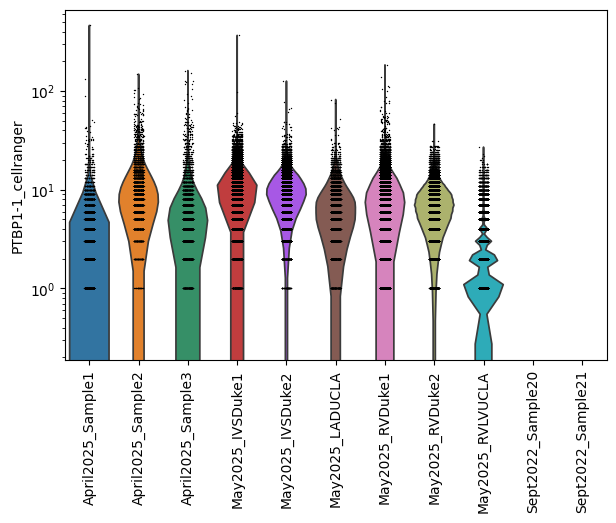

In [23]:
sc.pl.violin(
    adata,
    keys=['PTBP1-1_cellranger'],       # gene to plot
    groupby='10xRxn',   # group cells by this metadata column
    log=True,           # log scale on y-axis
    rotation=90         # rotate x-axis labels
)


In [24]:
# Step 1: Get protein feature names
feature_info = adata.var
protein_mask = feature_info["feature_types"] == "Antibody Capture"
protein_names = feature_info[protein_mask].index.tolist()

In [25]:
protein_names

['NFkB_p65_cellranger',
 'LINE1_ORF1p_cellranger',
 'LINE1_ORF2p_cellranger',
 'PTBP1-1_cellranger',
 'SRSF7-1_cellranger',
 'TDP43_cellranger',
 'HNRNPA1-1_cellranger',
 'FNDC3B-1_cellranger',
 'SMAD2-1_cellranger',
 'Histone_H3_cellranger',
 'IgG_cellranger',
 'YAP1-1_cellranger',
 'TAZ-1_cellranger',
 'pSTAT3_cellranger',
 'ATF3-1_cellranger',
 'HIF1a_cellranger',
 'SRSF5-1_cellranger',
 'ELAVL1-1_cellranger',
 'SMAD5-1_cellranger',
 'Calreticulin_cellranger',
 'IRF3-1_cellranger',
 'pSMAD2_cellranger',
 'pSTAT1_1_cellranger',
 'IRF1_1_cellranger',
 'RPS6-1_cellranger',
 'BCL6-1_cellranger',
 'pSTAT1_2_cellranger',
 'IRF1_2_cellranger',
 'SAMD4A-1_cellranger',
 'Histone_H3_2_cellranger',
 'CITESeq_FreeOligo_BC71_cellranger',
 'CITESeq_FreeOligo_BC72_cellranger',
 'CITESeq_FreeOligo_BC73_cellranger',
 'CITESeq_FreeOligo_BC74_cellranger',
 'CITESeq_FreeOligo_BC75_cellranger',
 'CITESeq_FreeOligo_BC76_cellranger',
 'CITESeq_FreeOligo_BC77_cellranger',
 'CITESeq_FreeOligo_BC78_cellrange

In [26]:
from scipy import sparse

# Filter to proteins that exist in adata.var_names
protein_vars = [p for p in protein_names if p in adata.var_names]

# Extract the matrix for these proteins
X_proteins = adata[:, protein_vars].X

# Add each protein as a separate column in .obs
for i, protein in enumerate(protein_vars):
    col_name = f"total_counts_{protein.replace('_cellranger','')}"
    if sparse.issparse(X_proteins):
        adata.obs[col_name] = X_proteins[:, i].toarray().flatten()
    else:
        adata.obs[col_name] = X_proteins[:, i]

In [27]:
adata.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,...,total_counts_CITESeq_FreeOligo_BC89,total_counts_CITESeq_FreeOligo_BC90,total_counts_NuclearPoreHash1,total_counts_NuclearPoreHash2,total_counts_NuclearPoreHash3,total_counts_NuclearPoreHash4,total_counts_NuclearPoreHash5,total_counts_NuclearPoreHash7,total_counts_NuclearPoreHash8,total_counts_NuclearPoreHash9
GCTAGGTTCCTTGAGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,4978.0,0.540297,...,0.0,0.0,431.0,226.0,3837.0,0.0,0.0,226.0,258.0,55.0
TGCAGGTTCTGTCTAC-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,6811.0,0.544150,...,0.0,0.0,666.0,260.0,5196.0,0.0,0.0,382.0,307.0,49.0
AGCGCCTGTGCGGTGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,9288.0,0.519812,...,0.0,0.0,759.0,341.0,7326.0,0.0,0.0,489.0,373.0,53.0
CAGGGGACATGGCAAT-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,7501.0,0.644407,...,0.0,0.0,817.0,412.0,5354.0,0.0,0.0,451.0,467.0,74.0
CCCTCAGCAATCTCGC-1-May2025_IVSDuke1-CITE,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash7_c...",4420.0,0.780797,...,0.0,0.0,1389.0,298.0,1795.0,0.0,0.0,631.0,307.0,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGTTTGTGGCTTAT-1-Sept2022_Sample21-nonCITE-1,singlet,6,singlet,6,singlet,6,unknown,,309.0,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTCTTGATCGGTTAGT-1-Sept2022_Sample21-nonCITE-1,singlet,0,singlet,0,singlet,0,unknown,,363.0,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ATTCTACGTGTGGTCC-1-Sept2022_Sample21-nonCITE-1,singlet,1,singlet,1,singlet,1,unknown,,365.0,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CCATAAGCACGCAAAG-1-Sept2022_Sample21-nonCITE-1,singlet,2,singlet,2,singlet,2,unknown,,167.0,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


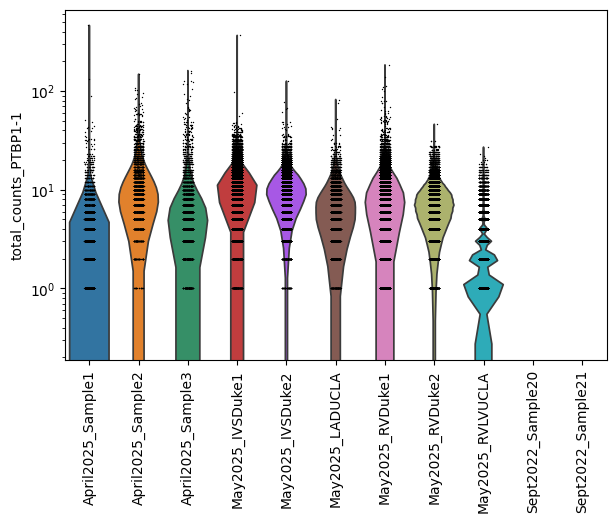

In [28]:
sc.pl.violin(adata, keys=['total_counts_PTBP1-1'], groupby='10xRxn', log="True", rotation=90)

In [29]:
adata.obs["total_counts_H3"] = (
    adata.obs["total_counts_Histone_H3"] + 
    adata.obs["total_counts_Histone_H3_2"]
)


In [30]:
adata.obs['total_counts_H3'].describe()

count    185902.000000
mean         12.111215
std          20.548470
min           0.000000
25%           4.000000
50%           9.000000
75%          17.000000
max        4746.000000
Name: total_counts_H3, dtype: float64

In [31]:
# normalize to H3
# had computed nCLR here previously, but - due to some cells without H3 counts, this data should not be used

def normalize_CITE_H3(ad_obj, ab_list):    
    import scipy
    import numpy as np

    for ab in ab_list:
        # Add pseudocount to denominator to prevent division by zero
        h3_counts = ad_obj.obs['total_counts_H3'] + 1e-8
        ab_x = (ad_obj.obs[ab] + 1) / h3_counts
        ad_obj.obs[ab + '_norm_H3'] = ab_x

        # Compute geometric mean safely
        #valid_vals = ab_x.replace([np.inf, -np.inf], np.nan).dropna()
        #geo_mean = scipy.stats.mstats.gmean(valid_vals + 1e-8)

        # Compute normalized CLR
        #clr_vals = np.log((ab_x + 1e-8) / geo_mean)

        # Replace inf/-inf with NaN
        #clr_vals.replace([np.inf, -np.inf], np.nan, inplace=True)

        #ad_obj.obs[ab + '_nCLR_H3'] = clr_vals

In [32]:
# normalized to NPC4
# had computed nCLR here previously, but - due to some cells without NPC4 counts, this data should not be used

def normalize_CITE_to_NuclearPore(ad_obj, ab_list):
    import scipy
    import numpy as np

    # Use NuclearPoreHash4 as normalization denominator
    norm_counts = ad_obj.obs['total_counts_NuclearPoreHash4'] + 1e-8

    for ab in ab_list:
        ab_x = (ad_obj.obs[ab] + 1) / norm_counts
        ad_obj.obs[ab + '_norm_NuclearPore'] = ab_x

        # Compute geometric mean safely
        #valid_vals = ab_x.replace([np.inf, -np.inf], np.nan).dropna()
        #geo_mean = scipy.stats.mstats.gmean(valid_vals + 1e-8)

        # Compute centered log-ratio (CLR)
        #clr_vals = np.log((ab_x + 1e-8) / geo_mean)
        #clr_vals.replace([np.inf, -np.inf], np.nan, inplace=True)

        #ad_obj.obs[ab + '_nCLR_NuclearPore'] = clr_vals


In [33]:
all_abs = [
    'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43',
    'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1',
    'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1',
    'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1',
    'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1',
    'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1',
    'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1',
    'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2',
    'total_counts_IRF1_2', 'total_counts_SAMD4A-1', 'total_counts_Histone_H3_2'
]

# Exclude the two H3 references
abs_to_normalize = [ab for ab in all_abs if ab not in ['total_counts_Histone_H3', 'total_counts_Histone_H3_2']]

normalize_CITE_H3(adata, abs_to_normalize)

In [34]:
# Exclude H3-related references
abs_to_normalize = [ab for ab in all_abs if 'Histone_H3' not in ab]

# Run normalization
normalize_CITE_to_NuclearPore(adata, abs_to_normalize)

In [35]:
# This has cellranger protein counts
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_protein.h5ad"
adata.write(output_path)


# Check filter data by single cell annotations

In [116]:
# Use souporcell or hashing to filter

In [33]:
del adata

In [34]:
# This has cellranger protein counts
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_protein.h5ad"
adata = sc.read_h5ad(output_path)


In [35]:
adata.obs


,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,...,total_counts_Calreticulin_norm_NuclearPore,total_counts_IRF3-1_norm_NuclearPore,total_counts_pSMAD2_norm_NuclearPore,total_counts_pSTAT1_1_norm_NuclearPore,total_counts_IRF1_1_norm_NuclearPore,total_counts_RPS6-1_norm_NuclearPore,total_counts_BCL6-1_norm_NuclearPore,total_counts_pSTAT1_2_norm_NuclearPore,total_counts_IRF1_2_norm_NuclearPore,total_counts_SAMD4A-1_norm_NuclearPore
GCTAGGTTCCTTGAGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,4978.0,0.540297,...,100000000.0,600000000.0,100000000.0,100000000.0,300000000.0,200000000.0,200000000.0,100000000.0,100000000.0,100000000.0
TGCAGGTTCTGTCTAC-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,6811.0,0.544150,...,100000000.0,200000000.0,300000000.0,100000000.0,300000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0
AGCGCCTGTGCGGTGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,9288.0,0.519812,...,300000000.0,800000000.0,100000000.0,100000000.0,100000000.0,200000000.0,300000000.0,100000000.0,100000000.0,100000000.0
CAGGGGACATGGCAAT-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,7501.0,0.644407,...,100000000.0,200000000.0,400000000.0,100000000.0,200000000.0,200000000.0,100000000.0,100000000.0,100000000.0,100000000.0
CCCTCAGCAATCTCGC-1-May2025_IVSDuke1-CITE,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash7_c...",4420.0,0.780797,...,100000000.0,400000000.0,200000000.0,100000000.0,200000000.0,100000000.0,100000000.0,200000000.0,100000000.0,100000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGTTTGTGGCTTAT-1-Sept2022_Sample21-nonCITE-1,singlet,6,singlet,6,singlet,6,unknown,,309.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0
TTCTTGATCGGTTAGT-1-Sept2022_Sample21-nonCITE-1,singlet,0,singlet,0,singlet,0,unknown,,363.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0
ATTCTACGTGTGGTCC-1-Sept2022_Sample21-nonCITE-1,singlet,1,singlet,1,singlet,1,unknown,,365.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0
CCATAAGCACGCAAAG-1-Sept2022_Sample21-nonCITE-1,singlet,2,singlet,2,singlet,2,unknown,,167.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0


In [36]:
adata.obs["souporcell_status"].unique()


['singlet']
Categories (1, object): ['singlet']

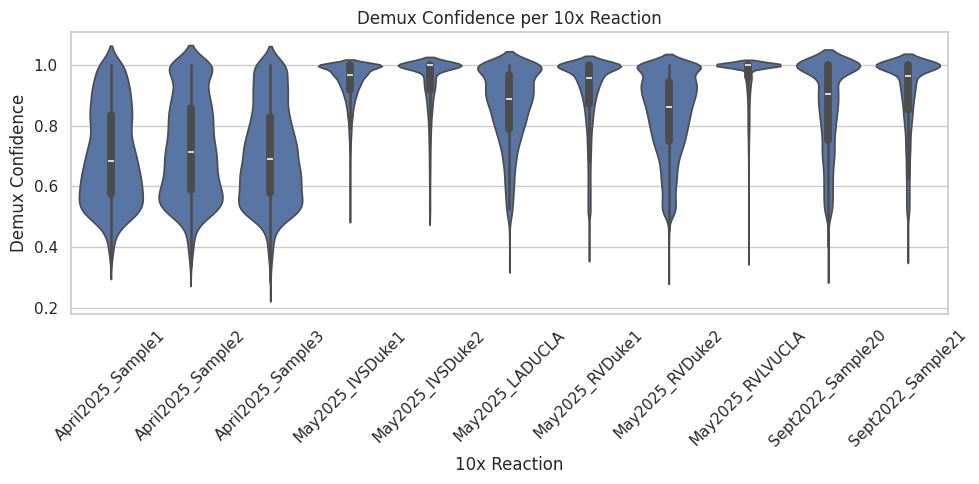

In [37]:
# Set plot style
sns.set(style="whitegrid")

# Create violin plot
plt.figure(figsize=(10, 5))
sns.violinplot(
    data=adata.obs,
    x='10xRxn',
    y='demux_confidence',
    inner='box',
    scale='width'
)

plt.title("Demux Confidence per 10x Reaction")
plt.ylabel("Demux Confidence")
plt.xlabel("10x Reaction")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [38]:
adata.obs['BatchSouporcell'] = (
    adata.obs['10xRxn'].astype(str) + "_" + adata.obs['souporcell_assignment'].astype(str)
)


In [39]:
adata.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,...,total_counts_IRF3-1_norm_NuclearPore,total_counts_pSMAD2_norm_NuclearPore,total_counts_pSTAT1_1_norm_NuclearPore,total_counts_IRF1_1_norm_NuclearPore,total_counts_RPS6-1_norm_NuclearPore,total_counts_BCL6-1_norm_NuclearPore,total_counts_pSTAT1_2_norm_NuclearPore,total_counts_IRF1_2_norm_NuclearPore,total_counts_SAMD4A-1_norm_NuclearPore,BatchSouporcell
GCTAGGTTCCTTGAGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,4978.0,0.540297,...,600000000.0,100000000.0,100000000.0,300000000.0,200000000.0,200000000.0,100000000.0,100000000.0,100000000.0,May2025_IVSDuke1_7
TGCAGGTTCTGTCTAC-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,6811.0,0.544150,...,200000000.0,300000000.0,100000000.0,300000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,May2025_IVSDuke1_7
AGCGCCTGTGCGGTGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,9288.0,0.519812,...,800000000.0,100000000.0,100000000.0,100000000.0,200000000.0,300000000.0,100000000.0,100000000.0,100000000.0,May2025_IVSDuke1_7
CAGGGGACATGGCAAT-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,7501.0,0.644407,...,200000000.0,400000000.0,100000000.0,200000000.0,200000000.0,100000000.0,100000000.0,100000000.0,100000000.0,May2025_IVSDuke1_7
CCCTCAGCAATCTCGC-1-May2025_IVSDuke1-CITE,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash7_c...",4420.0,0.780797,...,400000000.0,200000000.0,100000000.0,200000000.0,100000000.0,100000000.0,200000000.0,100000000.0,100000000.0,May2025_IVSDuke1_8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGTTTGTGGCTTAT-1-Sept2022_Sample21-nonCITE-1,singlet,6,singlet,6,singlet,6,unknown,,309.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,Sept2022_Sample21_6
TTCTTGATCGGTTAGT-1-Sept2022_Sample21-nonCITE-1,singlet,0,singlet,0,singlet,0,unknown,,363.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,Sept2022_Sample21_0
ATTCTACGTGTGGTCC-1-Sept2022_Sample21-nonCITE-1,singlet,1,singlet,1,singlet,1,unknown,,365.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,Sept2022_Sample21_1
CCATAAGCACGCAAAG-1-Sept2022_Sample21-nonCITE-1,singlet,2,singlet,2,singlet,2,unknown,,167.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,Sept2022_Sample21_2


In [40]:
results = []

# Assuming 'adata' is your full AnnData object
singlets = adata.obs['singlet'] if 'singlet' in adata.obs.columns else pd.Series(True, index=adata.obs_names)

for batch_souporcell in adata.obs.loc[singlets, 'BatchSouporcell'].unique():
    cells_in_batch = adata.obs.loc[singlets].index[adata.obs.loc[singlets, 'BatchSouporcell'] == batch_souporcell]
    subset_obs = adata.obs.loc[cells_in_batch]

    if 'souporcell_assignmentBatch' not in subset_obs.columns or 'souporcell_assignmentMerge' not in subset_obs.columns:
        # Skip if assignments missing
        continue

    ct = pd.crosstab(
        subset_obs['souporcell_assignmentBatch'],
        subset_obs['souporcell_assignmentMerge'],
        rownames=['AssignmentBatch'],
        colnames=['AssignmentMerge']
    )

    # For each AssignmentBatch, get best matching AssignmentMerge and counts
    best_matches = ct.idxmax(axis=1)
    best_counts = ct.max(axis=1)

    for batch_cluster, merge_cluster in best_matches.items():
        count = best_counts[batch_cluster]
        if count > 30:  # Filter for counts > 30
            results.append({
                'BatchSouporcell': batch_souporcell,
                'AssignmentBatch': batch_cluster,
                'AssignmentMerge': merge_cluster,
                'Count': count
            })

# Convert to DataFrame
df_matches = pd.DataFrame(results)

# Optional: sort or reorder columns
df_matches = df_matches[['BatchSouporcell', 'AssignmentBatch', 'AssignmentMerge', 'Count']]



In [41]:
df_matches

,BatchSouporcell,AssignmentBatch,AssignmentMerge,Count
0,May2025_IVSDuke1_7,1,7,7623
1,May2025_IVSDuke1_7,1/0,7,32
2,May2025_IVSDuke1_7,1/5,7,171
3,May2025_IVSDuke1_7,1/6,7,227
4,May2025_IVSDuke1_8,6,8,6626
...,...,...,...,...
141,Sept2022_Sample21_0,0,0,2832
142,Sept2022_Sample21_1,1,1,2772
143,Sept2022_Sample21_6,6,6,412
144,Sept2022_Sample21_9,9,9,32


In [42]:
# Step 1: Define hash features
hash_vars = [var for var in adata.var_names if var.startswith("NuclearPoreHash") or var.startswith("CITESeq_FreeOligo")]

# Step 2: Extract matrix and metadata
X_matrix = adata[:, hash_vars].X
X_matrix = X_matrix.toarray() if hasattr(X_matrix, "toarray") else X_matrix

df = pd.DataFrame(X_matrix, index=adata.obs_names, columns=hash_vars)
df['BatchSouporcell'] = adata.obs['BatchSouporcell']
df['demux_confidence'] = adata.obs['demux_confidence']
df['demux_type'] = adata.obs['demux_type']

# Step 3: Filter to confident singlets
#conf_singlets = df.query("demux_type == 'singlet' and demux_confidence < 0.7").copy()
conf_singlets = df.query("demux_type == 'singlet'").copy()

# Step 4: Compute enrichment ratios
top_ratios = []

for cluster, group in conf_singlets.groupby('BatchSouporcell'):
    if group.empty:
        continue
    sums = group[hash_vars].sum()
    total = sums.sum()
    if total == 0:
        continue

    for hash_name, x in sums.items():
        s = total - x
        log_ratio = np.log2((x + 1e-6) / (s + 1e-6))
        top_ratios.append({
            'BatchSouporcell': cluster,
            'Hash': hash_name,
            'X': x,
            'S': s,
            'Log2(X/S)': log_ratio
        })

# Step 5: Assemble into DataFrame if any data exists
if not top_ratios:
    raise ValueError("No valid hash signal found in any BatchSouporcell group.")

ratios_df = pd.DataFrame(top_ratios)

# Step 6: Get top 3 hashes per cluster
top3_df = (
    ratios_df
    .sort_values(['BatchSouporcell', 'Log2(X/S)'], ascending=[True, False])
    .groupby('BatchSouporcell')
    .head(3)
    .reset_index(drop=True)
)

# Step 7: Reshape to wide format
top3_df['Rank'] = top3_df.groupby('BatchSouporcell').cumcount() + 1
pivot_df = top3_df.pivot(index='BatchSouporcell', columns='Rank', values=['Hash', 'Log2(X/S)'])
pivot_df.columns = [f"{col[0]}_{col[1]}" for col in pivot_df.columns]
pivot_df = pivot_df.reset_index()

# Step 8: Add NumCells info and filter to >30
cell_counts = conf_singlets.groupby('BatchSouporcell').size().rename("NumCells").reset_index()
final_df = pivot_df.merge(cell_counts, on='BatchSouporcell')
final_df = final_df[final_df['NumCells'] > 30]


In [43]:
final_df

,BatchSouporcell,Hash_1,Hash_2,Hash_3,Log2(X/S)_1,Log2(X/S)_2,Log2(X/S)_3,NumCells
0,April2025_Sample1_0,NuclearPoreHash7_cellranger,NuclearPoreHash3_cellranger,NuclearPoreHash8_cellranger,2.202049,-3.120742,-4.685804,288
1,April2025_Sample1_1,NuclearPoreHash7_cellranger,NuclearPoreHash8_cellranger,NuclearPoreHash3_cellranger,-0.065768,-1.642016,-2.028544,47
2,April2025_Sample1_2,NuclearPoreHash1_cellranger,NuclearPoreHash7_cellranger,NuclearPoreHash3_cellranger,0.111158,-1.187055,-2.801641,709
4,April2025_Sample1_6,NuclearPoreHash7_cellranger,NuclearPoreHash3_cellranger,NuclearPoreHash8_cellranger,0.637956,-1.239426,-4.313826,43
5,April2025_Sample1_7,NuclearPoreHash3_cellranger,NuclearPoreHash7_cellranger,NuclearPoreHash8_cellranger,1.901395,-2.472127,-5.026617,194
...,...,...,...,...,...,...,...,...
97,Sept2022_Sample21_1,CITESeq_FreeOligo_BC79_cellranger,CITESeq_FreeOligo_BC78_cellranger,CITESeq_FreeOligo_BC76_cellranger,-0.483815,-1.91094,-2.242305,712
98,Sept2022_Sample21_2,CITESeq_FreeOligo_BC79_cellranger,CITESeq_FreeOligo_BC77_cellranger,CITESeq_FreeOligo_BC78_cellranger,-0.943854,-1.017838,-2.261647,3050
101,Sept2022_Sample21_6,CITESeq_FreeOligo_BC79_cellranger,CITESeq_FreeOligo_BC78_cellranger,CITESeq_FreeOligo_BC77_cellranger,0.384143,-1.948435,-3.620208,244
102,Sept2022_Sample21_7,CITESeq_FreeOligo_BC78_cellranger,CITESeq_FreeOligo_BC79_cellranger,NuclearPoreHash7_cellranger,-0.265141,-1.426422,-2.706197,824


In [44]:
merged_df = df_matches.merge(final_df, on="BatchSouporcell", how="left")

In [45]:
merged_df

,BatchSouporcell,AssignmentBatch,AssignmentMerge,Count,Hash_1,Hash_2,Hash_3,Log2(X/S)_1,Log2(X/S)_2,Log2(X/S)_3,NumCells
0,May2025_IVSDuke1_7,1,7,7623,NuclearPoreHash3_cellranger,NuclearPoreHash1_cellranger,NuclearPoreHash7_cellranger,0.609196,-2.56863,-3.319723,5970.0
1,May2025_IVSDuke1_7,1/0,7,32,NuclearPoreHash3_cellranger,NuclearPoreHash1_cellranger,NuclearPoreHash7_cellranger,0.609196,-2.56863,-3.319723,5970.0
2,May2025_IVSDuke1_7,1/5,7,171,NuclearPoreHash3_cellranger,NuclearPoreHash1_cellranger,NuclearPoreHash7_cellranger,0.609196,-2.56863,-3.319723,5970.0
3,May2025_IVSDuke1_7,1/6,7,227,NuclearPoreHash3_cellranger,NuclearPoreHash1_cellranger,NuclearPoreHash7_cellranger,0.609196,-2.56863,-3.319723,5970.0
4,May2025_IVSDuke1_8,6,8,6626,NuclearPoreHash3_cellranger,NuclearPoreHash1_cellranger,NuclearPoreHash7_cellranger,-0.125579,-1.507467,-3.26058,4683.0
...,...,...,...,...,...,...,...,...,...,...,...
141,Sept2022_Sample21_0,0,0,2832,CITESeq_FreeOligo_BC79_cellranger,CITESeq_FreeOligo_BC78_cellranger,CITESeq_FreeOligo_BC77_cellranger,1.236025,-2.808678,-4.090575,2100.0
142,Sept2022_Sample21_1,1,1,2772,CITESeq_FreeOligo_BC79_cellranger,CITESeq_FreeOligo_BC78_cellranger,CITESeq_FreeOligo_BC76_cellranger,-0.483815,-1.91094,-2.242305,712.0
143,Sept2022_Sample21_6,6,6,412,CITESeq_FreeOligo_BC79_cellranger,CITESeq_FreeOligo_BC78_cellranger,CITESeq_FreeOligo_BC77_cellranger,0.384143,-1.948435,-3.620208,244.0
144,Sept2022_Sample21_9,9,9,32,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [46]:
# Step 1: Extract counts per gene
ptprc_counts = adata[:, 'PTPRC'].X.toarray().flatten()
cdh5_counts = adata[:, 'CDH5'].X.toarray().flatten()
ttn_counts = adata[:, 'TTN'].X.toarray().flatten()

# Step 2: Add counts to obs
adata.obs['counts_PTPRC'] = ptprc_counts
adata.obs['counts_CDH5'] = cdh5_counts
adata.obs['counts_TTN'] = ttn_counts

# Step 3: Group by BatchSouporcell and compute mean counts and ratios
batch_grouped = (
    adata.obs
    .groupby('BatchSouporcell')[['counts_PTPRC', 'counts_CDH5', 'counts_TTN']]
    .mean()
    .rename(columns={
        'counts_PTPRC': 'countspercellPTPRC',
        'counts_CDH5': 'countspercellCDH5',
        'counts_TTN': 'countspercellTTN'
    })
)

batch_grouped['ratioPTPRCvCDH5'] = batch_grouped['countspercellPTPRC'] / batch_grouped['countspercellCDH5']
batch_grouped['ratioPTPRCvTTN'] = batch_grouped['countspercellPTPRC'] / batch_grouped['countspercellTTN']

# Reset index on batch_grouped so 'BatchSouporcell' becomes a column
batch_grouped = batch_grouped.reset_index()



In [47]:
# Merge with existing merged_df
merged_with_counts = merged_df.merge(batch_grouped, on='BatchSouporcell', how='left')

In [48]:
from collections import defaultdict

# Ensure these assignments are present
assert 'BatchSouporcell' in adata.obs.columns
assert 'assignment' in adata.obs.columns
assert 'demux_type' in adata.obs.columns

# Step 1: Filter to singlets only
singlets_df = adata.obs.query("demux_type == 'singlet'").copy()

# Step 2: Get 10xRxn from BatchSouporcell (assumes 10xRxn is the prefix)
singlets_df['10xRxn'] = singlets_df['BatchSouporcell'].str.extract(r'(^[^_]+_[^_]+)')

# Step 3: Group by BatchSouporcell and get top 3 hashes
top_hash_stats = []

for bsc, group in singlets_df.groupby('BatchSouporcell'):
    total_cells_bsc = len(group)
    rxn = group['10xRxn'].iloc[0]
    
    # Get total number of cells assigned to each hash in this BatchSouporcell
    hash_counts = group['assignment'].value_counts()
    top3 = hash_counts.head(3)
    
    # For each top hash, compute total count and percentage in 10xRxn
    rxn_group = singlets_df[singlets_df['10xRxn'] == rxn]
    rxn_counts = rxn_group['assignment'].value_counts()
    
    for i, (hash_name, count_in_bsc) in enumerate(top3.items(), start=1):
        total_in_rxn = rxn_counts.get(hash_name, 0)
        percent_in_bsc = count_in_bsc / total_cells_bsc
        percent_of_rxn = count_in_bsc / total_in_rxn if total_in_rxn > 0 else float('nan')
        
        top_hash_stats.append({
            'BatchSouporcell': bsc,
            f'Top{i}_DemuxHash': hash_name,
            f'Top{i}_CountInBSC': count_in_bsc,
            f'Top{i}_PctOfBSC': f"{percent_in_bsc:.2%}",
            f'Top{i}_PctOfRxn': f"{percent_of_rxn:.2%}"
        })

# Step 4: Collapse into one row per BatchSouporcell
top_hash_df = pd.DataFrame(top_hash_stats)

# Combine by grouping on BatchSouporcell
summary_hashes = (
    top_hash_df
    .groupby('BatchSouporcell')
    .first()  # since top3 hashes are already per BSC, .first() retains one row
    .reset_index()
)

In [49]:
summary_hashes

,BatchSouporcell,Top1_DemuxHash,Top1_CountInBSC,Top1_PctOfBSC,Top1_PctOfRxn,Top2_DemuxHash,Top2_CountInBSC,Top2_PctOfBSC,Top2_PctOfRxn,Top3_DemuxHash,Top3_CountInBSC,Top3_PctOfBSC,Top3_PctOfRxn
0,April2025_Sample1_0,NuclearPoreHash7_cellranger,281.0,97.57%,63.72%,NuclearPoreHash1_cellranger,5.0,1.74%,0.72%,NuclearPoreHash3_cellranger,2.0,0.69%,0.93%
1,April2025_Sample1_1,NuclearPoreHash8_cellranger,27.0,57.45%,5.57%,NuclearPoreHash7_cellranger,20.0,42.55%,4.54%,"NuclearPoreHash3_cellranger,NuclearPoreHash7_c...",0.0,0.00%,nan%
2,April2025_Sample1_2,NuclearPoreHash1_cellranger,683.0,96.33%,98.27%,NuclearPoreHash7_cellranger,24.0,3.39%,5.44%,NuclearPoreHash3_cellranger,2.0,0.28%,0.93%
3,April2025_Sample1_4,NuclearPoreHash7_cellranger,2.0,100.00%,0.45%,"NuclearPoreHash3_cellranger,NuclearPoreHash7_c...",0.0,0.00%,nan%,"NuclearPoreHash3_cellranger,NuclearPoreHash8_c...",0.0,0.00%,nan%
4,April2025_Sample1_6,NuclearPoreHash7_cellranger,31.0,72.09%,7.03%,NuclearPoreHash3_cellranger,12.0,27.91%,5.61%,"CITESeq_FreeOligo_BC71_cellranger,CITESeq_Free...",0.0,0.00%,nan%
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,Sept2022_Sample21_4,CITESeq_FreeOligo_BC79_cellranger,14.0,53.85%,0.54%,CITESeq_FreeOligo_BC78_cellranger,12.0,46.15%,1.02%,"NuclearPoreHash3_cellranger,NuclearPoreHash8_c...",0.0,0.00%,nan%
101,Sept2022_Sample21_6,CITESeq_FreeOligo_BC79_cellranger,184.0,75.41%,7.14%,CITESeq_FreeOligo_BC78_cellranger,60.0,24.59%,5.08%,"NuclearPoreHash3_cellranger,NuclearPoreHash8_c...",0.0,0.00%,nan%
102,Sept2022_Sample21_7,CITESeq_FreeOligo_BC78_cellranger,798.0,96.84%,67.63%,CITESeq_FreeOligo_BC79_cellranger,24.0,2.91%,0.93%,CITESeq_FreeOligo_BC76_cellranger,2.0,0.24%,0.12%
103,Sept2022_Sample21_8,CITESeq_FreeOligo_BC76_cellranger,1020.0,94.27%,62.96%,CITESeq_FreeOligo_BC79_cellranger,40.0,3.70%,1.55%,CITESeq_FreeOligo_BC78_cellranger,22.0,2.03%,1.86%


In [50]:
# Step 5: Merge with merged_with_counts
final_df_all = merged_with_counts.merge(summary_hashes, on='BatchSouporcell', how='left')

# Step 6: Export
final_df_all.to_excel('/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/demultiplex_TablePicking2025Dec.xlsx', index=False)


In [51]:
adata.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,...,total_counts_IRF1_1_norm_NuclearPore,total_counts_RPS6-1_norm_NuclearPore,total_counts_BCL6-1_norm_NuclearPore,total_counts_pSTAT1_2_norm_NuclearPore,total_counts_IRF1_2_norm_NuclearPore,total_counts_SAMD4A-1_norm_NuclearPore,BatchSouporcell,counts_PTPRC,counts_CDH5,counts_TTN
GCTAGGTTCCTTGAGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,4978.0,0.540297,...,300000000.0,200000000.0,200000000.0,100000000.0,100000000.0,100000000.0,May2025_IVSDuke1_7,0.0,0.0,2394.0
TGCAGGTTCTGTCTAC-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,6811.0,0.544150,...,300000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,May2025_IVSDuke1_7,0.0,0.0,2124.0
AGCGCCTGTGCGGTGA-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,9288.0,0.519812,...,100000000.0,200000000.0,300000000.0,100000000.0,100000000.0,100000000.0,May2025_IVSDuke1_7,0.0,0.0,402.0
CAGGGGACATGGCAAT-1-May2025_IVSDuke1-CITE,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,7501.0,0.644407,...,200000000.0,200000000.0,100000000.0,100000000.0,100000000.0,100000000.0,May2025_IVSDuke1_7,0.0,0.0,1881.0
CCCTCAGCAATCTCGC-1-May2025_IVSDuke1-CITE,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash7_c...",4420.0,0.780797,...,200000000.0,100000000.0,100000000.0,200000000.0,100000000.0,100000000.0,May2025_IVSDuke1_8,0.0,0.0,1624.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGTTTGTGGCTTAT-1-Sept2022_Sample21-nonCITE-1,singlet,6,singlet,6,singlet,6,unknown,,309.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,Sept2022_Sample21_6,0.0,0.0,0.0
TTCTTGATCGGTTAGT-1-Sept2022_Sample21-nonCITE-1,singlet,0,singlet,0,singlet,0,unknown,,363.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,Sept2022_Sample21_0,0.0,0.0,0.0
ATTCTACGTGTGGTCC-1-Sept2022_Sample21-nonCITE-1,singlet,1,singlet,1,singlet,1,unknown,,365.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,Sept2022_Sample21_1,0.0,0.0,0.0
CCATAAGCACGCAAAG-1-Sept2022_Sample21-nonCITE-1,singlet,2,singlet,2,singlet,2,unknown,,167.0,1.000000,...,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,100000000.0,Sept2022_Sample21_2,0.0,0.0,0.0


In [52]:
# import annotations
anno_df = pd.read_csv('/labs/Murphy/SharedCondaEnv/2025Dec_CAV_10xDataAnalysis/Annotations_Dec5_HeartParameters.csv')

# Check that "BatchSouporcell" exists in both
assert "BatchSouporcell" in anno_df.columns, "CSV file missing 'BatchSouporcell'"
assert "BatchSouporcell" in adata.obs.columns, "adata.obs missing 'BatchSouporcell'"

anno_df = anno_df.loc[:, ~anno_df.columns.str.contains('^Unnamed')]


In [53]:
anno_df

,BatchSouporcell,SampleType,BankSource,Location,Donor,Day,ConfidenceOnHashing,DiseaseStatus,TimePoint,BetweenSampleSC_Validations,...,acute_rejection_grade,AcuteCellularRejection,AntibodyMediatedRejection,pAMR,allograft_vasculopathy,max_stenosis_%,thrombosis,myocardial_infarct,fibrosis,other_key_findings
0,May2025_RVDuke1_20,HeartTissue,Duke,RightVentricle,111,2688,Low,CAV,Late,good,...,1R/1A,1.0,1.0,pAMR 0,Severe diffuse,90.0,No,"Subendocardial, ischemic",Mild patchy interstitial & endocardial,"Lipofuscin, myocyte hypertrophy"
1,May2025_RVDuke1_4,HeartTissue,Duke,RightVentricle,111,2688,Low,CAV,Late,good,...,1R/1A,1.0,1.0,pAMR 0,Severe diffuse,90.0,No,"Subendocardial, ischemic",Mild patchy interstitial & endocardial,"Lipofuscin, myocyte hypertrophy"
2,May2025_RVDuke1_3,HeartTissue,Duke,RightVentricle,895,2540,Low,CAV,Late,good,...,0R,0.0,0.0,pAMR 0,Moderate-severe,99.0,Yes (diagonal branches),Not specified,Not specified,Multiple complete occlusions
3,May2025_IVSDuke1_16,HeartTissue,Duke,Septum,905,2204,High,CAV,Late,good,...,1R/1B,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis"
4,May2025_IVSDuke1_7,HeartTissue,Duke,Septum,905,2204,High,CAV,Late,good,...,1R/1B,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,May2025_LADUCLA_3,HeartTissue,UCLA,LAD,JG8,11700,Low,CAV,Late,good,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65,May2025_RVLVUCLA_0,HeartTissue,UCLA,RightVentricle,JG8,0,Low,Unaffected,Late,good,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
66,May2025_RVLVUCLA_3,HeartTissue,UCLA,RightVentricle,JG8,0,Low,Unaffected,Late,good,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67,May2025_LADUCLA_1,HeartTissue,UCLA,LAD,MF9,0,Low,Unaffected,Late,good,...,0/0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
#add annotations
adata.obs = adata.obs.merge(anno_df, how="left", on="BatchSouporcell")

In [55]:
list(adata.obs.columns)

['souporcell_status',
 'souporcell_assignment',
 'souporcell_statusBatch',
 'souporcell_assignmentBatch',
 'souporcell_statusMerge',
 'souporcell_assignmentMerge',
 'demux_type',
 'assignment',
 'hashtag_counts',
 'demux_confidence',
 'hto_assigned_vs_others_ratio',
 '10xRxn',
 'source',
 'total_counts_NFkB_p65',
 'total_counts_LINE1_ORF1p',
 'total_counts_LINE1_ORF2p',
 'total_counts_PTBP1-1',
 'total_counts_SRSF7-1',
 'total_counts_TDP43',
 'total_counts_HNRNPA1-1',
 'total_counts_FNDC3B-1',
 'total_counts_SMAD2-1',
 'total_counts_Histone_H3',
 'total_counts_IgG',
 'total_counts_YAP1-1',
 'total_counts_TAZ-1',
 'total_counts_pSTAT3',
 'total_counts_ATF3-1',
 'total_counts_HIF1a',
 'total_counts_SRSF5-1',
 'total_counts_ELAVL1-1',
 'total_counts_SMAD5-1',
 'total_counts_Calreticulin',
 'total_counts_IRF3-1',
 'total_counts_pSMAD2',
 'total_counts_pSTAT1_1',
 'total_counts_IRF1_1',
 'total_counts_RPS6-1',
 'total_counts_BCL6-1',
 'total_counts_pSTAT1_2',
 'total_counts_IRF1_2',
 'total

In [56]:
# Since UCLA LV and RV had one 10x reaction with duplicated of the same samples (but from LV or from RV septum) will need to use hashing
# batches of interest
batches = [
    "May2025_RVLVUCLA_0",
    "May2025_RVLVUCLA_1",
    "May2025_RVLVUCLA_2",
    "May2025_RVLVUCLA_3"
]

# subset to those batches
subset = adata.obs[adata.obs["BatchSouporcell"].isin(batches)]

# get assignment counts and filter for > 50
assignments_over50 = subset["assignment"].value_counts()[lambda x: x > 50]

assignments_over50


assignment
                                                                                       34479
NuclearPoreHash1_cellranger                                                             2936
NuclearPoreHash9_cellranger                                                             2128
NuclearPoreHash7_cellranger                                                             2089
NuclearPoreHash2_cellranger                                                             1996
NuclearPoreHash3_cellranger                                                             1712
NuclearPoreHash2_cellranger,NuclearPoreHash7_cellranger                                 1241
NuclearPoreHash8_cellranger                                                             1196
NuclearPoreHash2_cellranger,NuclearPoreHash7_cellranger,NuclearPoreHash8_cellranger      317
NuclearPoreHash7_cellranger,NuclearPoreHash2_cellranger                                  147
Name: count, dtype: int64

In [57]:
adata.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,...,acute_rejection_grade,AcuteCellularRejection,AntibodyMediatedRejection,pAMR,allograft_vasculopathy,max_stenosis_%,thrombosis,myocardial_infarct,fibrosis,other_key_findings
0,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,4978.0,0.540297,...,1R/1B,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis"
1,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,6811.0,0.544150,...,1R/1B,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis"
2,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,9288.0,0.519812,...,1R/1B,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis"
3,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,7501.0,0.644407,...,1R/1B,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis"
4,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash7_c...",4420.0,0.780797,...,1R (explant),1.0,0.0,pAMR 0,None-mild,20.0,No,No,NaN,Discrete atherosclerosis only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185897,singlet,6,singlet,6,singlet,6,unknown,,309.0,1.000000,...,0/2,0.0,0.0,7,0,0.0,0,0,0,0
185898,singlet,0,singlet,0,singlet,0,unknown,,363.0,1.000000,...,0/2,0.0,0.0,7,0,0.0,0,0,0,0
185899,singlet,1,singlet,1,singlet,1,unknown,,365.0,1.000000,...,1R/0,0.0,0.0,10,0,0.0,0,0,0,0
185900,singlet,2,singlet,2,singlet,2,unknown,,167.0,1.000000,...,0/0,0.0,0.0,3,0,0.0,0,0,0,0


In [58]:
# Copy Location to LocationFine
adata.obs["LocationFine"] = adata.obs["Location"].copy()

# Make sure it's categorical
adata.obs["LocationFine"] = adata.obs["LocationFine"].astype("category")

# Ensure all categories that will be assigned exist
new_cats = ["Septum", "LeftVentricle", "unknown"]
for cat in new_cats:
    if cat not in adata.obs["LocationFine"].cat.categories:
        adata.obs["LocationFine"] = adata.obs["LocationFine"].cat.add_categories([cat])

# Define batches where we want to apply mapping
rvlv_batches = [
    "May2025_RVLVUCLA_0",
    "May2025_RVLVUCLA_1",
    "May2025_RVLVUCLA_2",
    "May2025_RVLVUCLA_3"
]

batch_mask = adata.obs["BatchSouporcell"].isin(rvlv_batches)

# Define conditions within those batches
cond_septum = batch_mask & adata.obs["assignment"].isin(["NuclearPoreHash1","NuclearPoreHash2","NuclearPoreHash3"])
cond_lv     = batch_mask & adata.obs["assignment"].isin(["NuclearPoreHash7","NuclearPoreHash8","NuclearPoreHash9"])

# Apply mapping only inside those batches
adata.obs.loc[cond_septum, "LocationFine"] = "Septum"
adata.obs.loc[cond_lv, "LocationFine"]     = "LeftVentricle"
adata.obs.loc[batch_mask & ~(cond_septum | cond_lv), "LocationFine"] = "unknown"


In [59]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_annot.h5ad"
adata.write(output_path)

... storing 'BatchSouporcell' as categorical
... storing 'SampleType' as categorical
... storing 'BankSource' as categorical
... storing 'Location' as categorical
... storing 'Donor' as categorical
... storing 'ConfidenceOnHashing' as categorical
... storing 'DiseaseStatus' as categorical
... storing 'TimePoint' as categorical
... storing 'BetweenSampleSC_Validations' as categorical
... storing 'GraftHost' as categorical
... storing 'RV_systolic' as categorical
... storing 'RV_diastolic' as categorical
... storing 'Sample ID:' as categorical
... storing 'acute_rejection_grade' as categorical
... storing 'pAMR' as categorical
... storing 'allograft_vasculopathy' as categorical
... storing 'thrombosis' as categorical
... storing 'myocardial_infarct' as categorical
... storing 'fibrosis' as categorical
... storing 'other_key_findings' as categorical


# Show overlap in hashing and souporcell

In [60]:
# A concern is samples with a lot of ambient RNA, and where merging analysis might be a problem, since all of those samples may be called in merged data by the dominant RNA source (in this case, second most frequent call in the cluster would be right)


In [61]:
# Define sample names
sample_names = [
    "May2025_IVSDuke1", "May2025_IVSDuke2", "May2025_RVDuke1", "May2025_RVDuke2",
    "May2025_LADUCLA", "May2025_RVLVUCLA", "Sept2022_Sample20", "Sept2022_Sample21",
    "April2025_Sample1", "April2025_Sample2", "April2025_Sample3"
]

# Generate filtered DataFrames for each sample
for sample in sample_names:
    var_name = f"{sample}_hashcountsfinal"
    globals()[var_name] = adata.obs[
        (adata.obs["10xRxn"] == sample) & 
        (adata.obs["demux_confidence"] < 0.9)
    ]

In [62]:
May2025_IVSDuke1_hashcountsfinal

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,...,AcuteCellularRejection,AntibodyMediatedRejection,pAMR,allograft_vasculopathy,max_stenosis_%,thrombosis,myocardial_infarct,fibrosis,other_key_findings,LocationFine
0,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,4978.0,0.540297,...,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis",Septum
1,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,6811.0,0.544150,...,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis",Septum
2,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,9288.0,0.519812,...,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis",Septum
3,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,7501.0,0.644407,...,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis",Septum
4,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash7_c...",4420.0,0.780797,...,1.0,0.0,pAMR 0,None-mild,20.0,No,No,NaN,Discrete atherosclerosis only,Septum
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25691,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash2_c...",4994.0,0.890865,...,1.0,0.0,pAMR 0,None-mild,20.0,No,No,NaN,Discrete atherosclerosis only,Septum
25923,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,3915.0,0.854630,...,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis",Septum
26358,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,3674.0,0.863740,...,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis",Septum
26422,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,3655.0,0.898724,...,1.0,1.0,pAMR 0,Severe diffuse,100.0,Yes (LAD/ramus),Large transmural + subacute,Moderate,"Mural thrombus, epicarditis",Septum


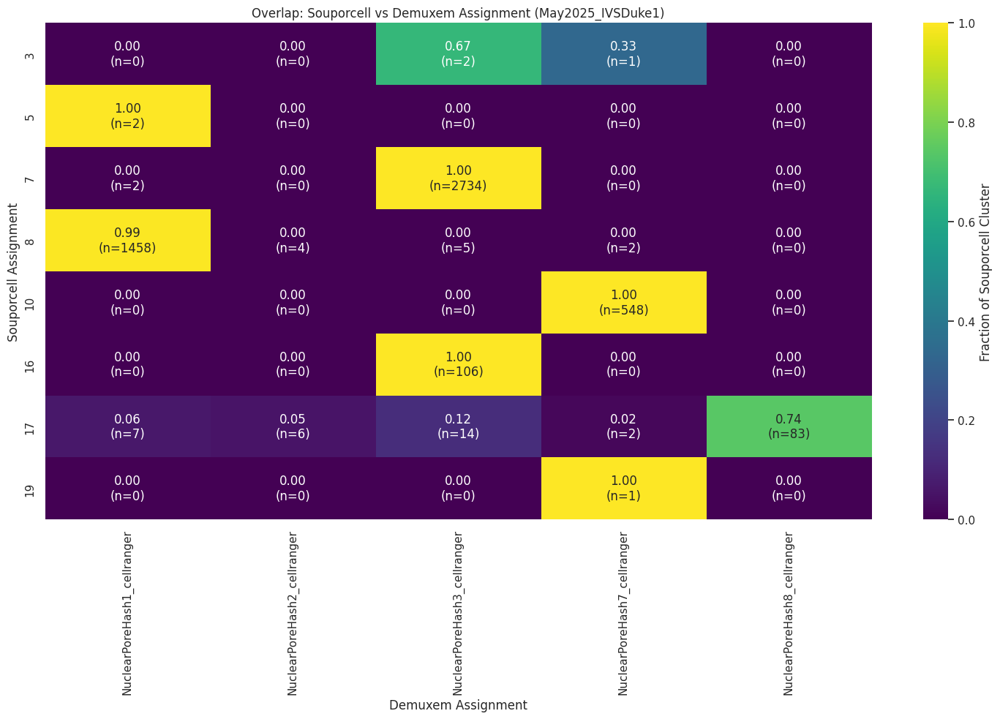

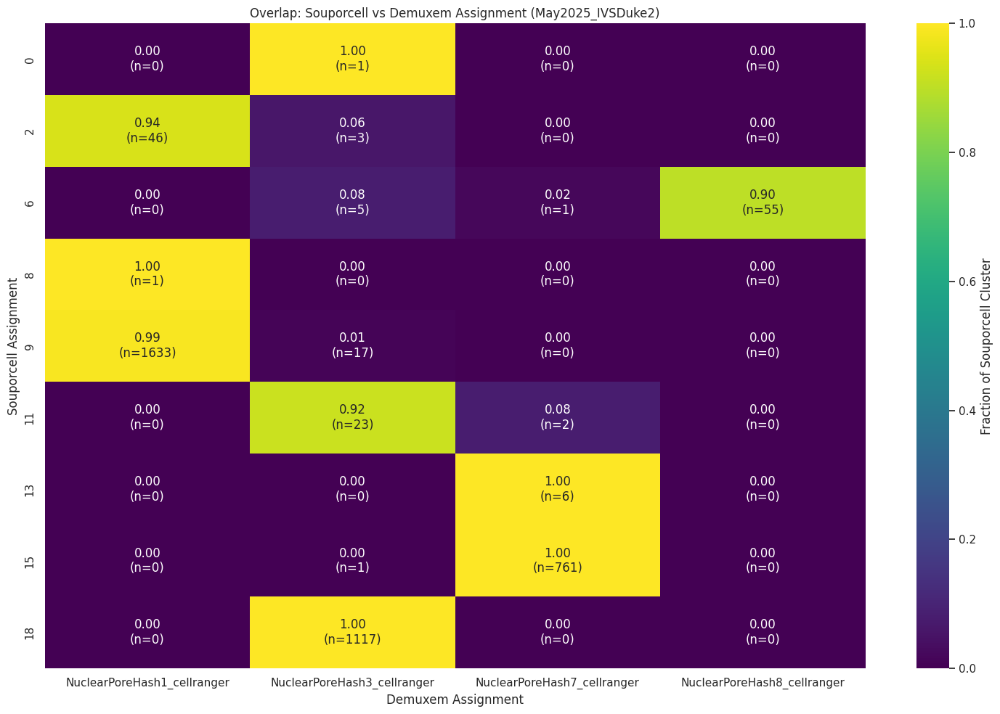

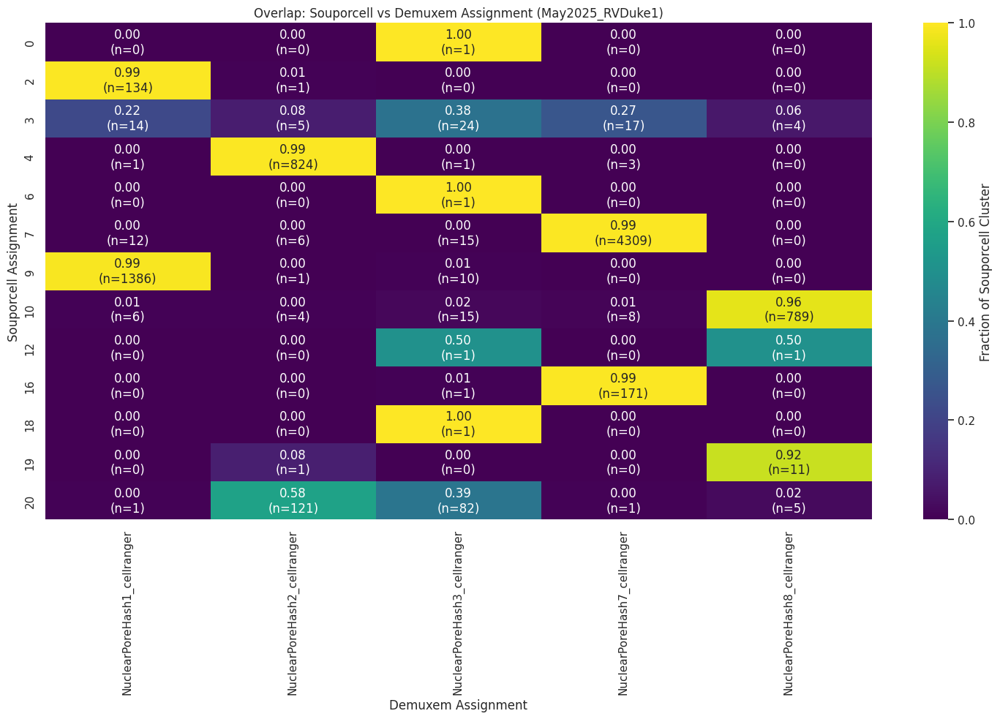

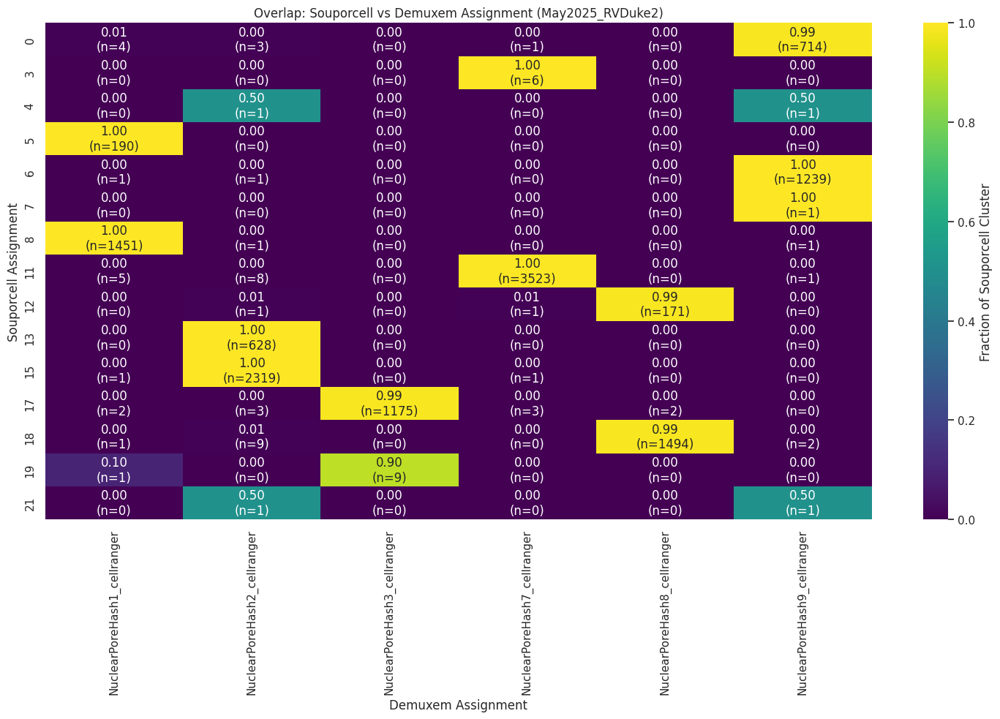

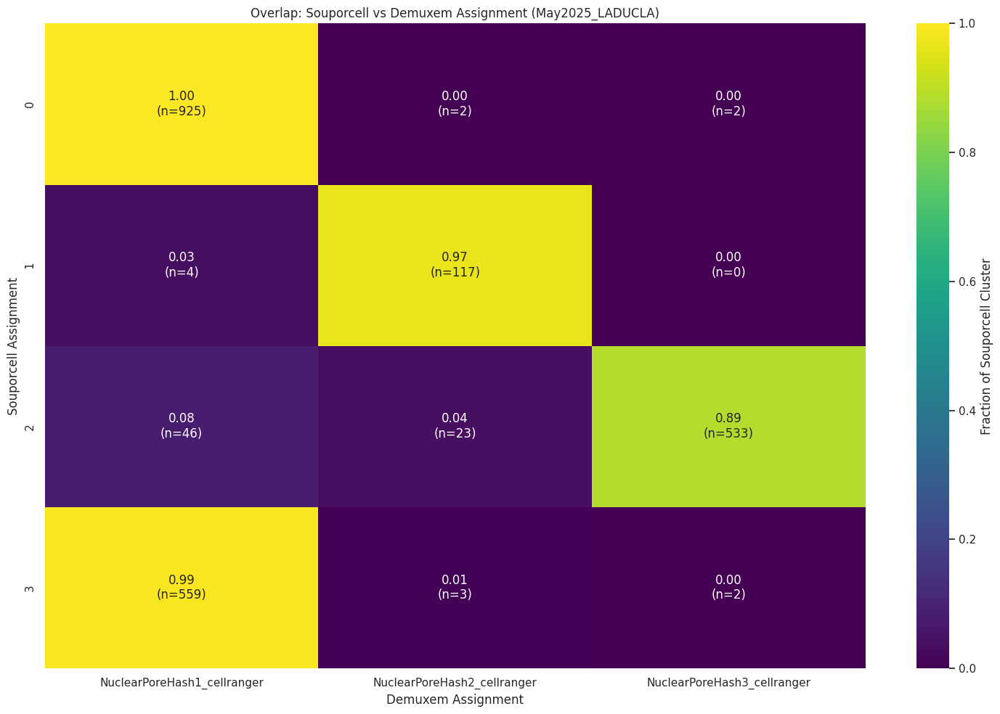

...

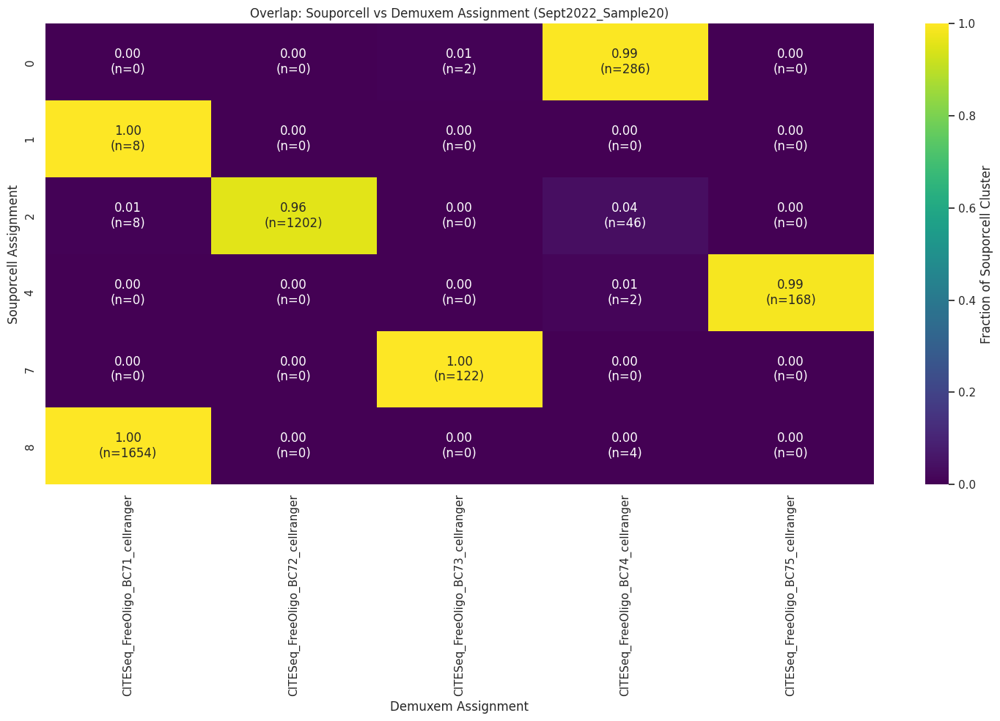

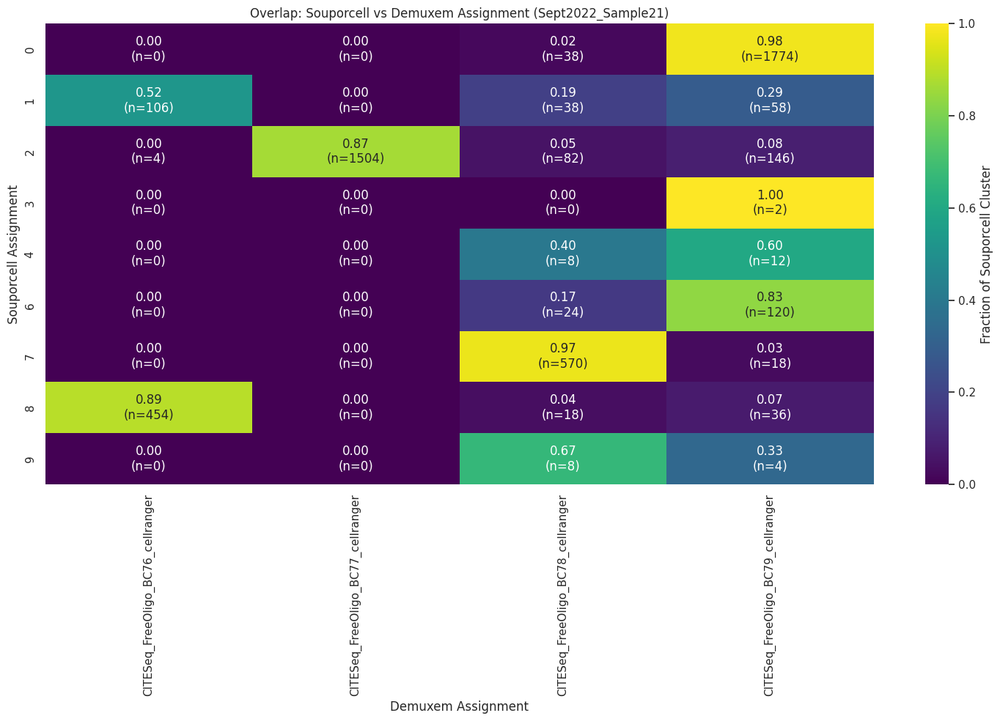

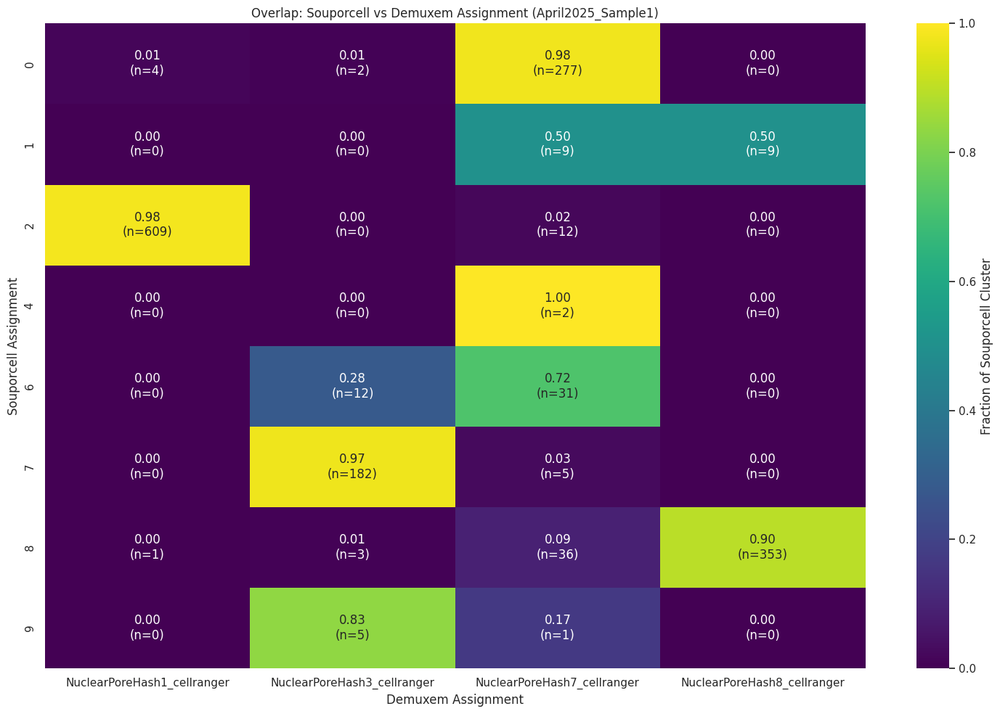

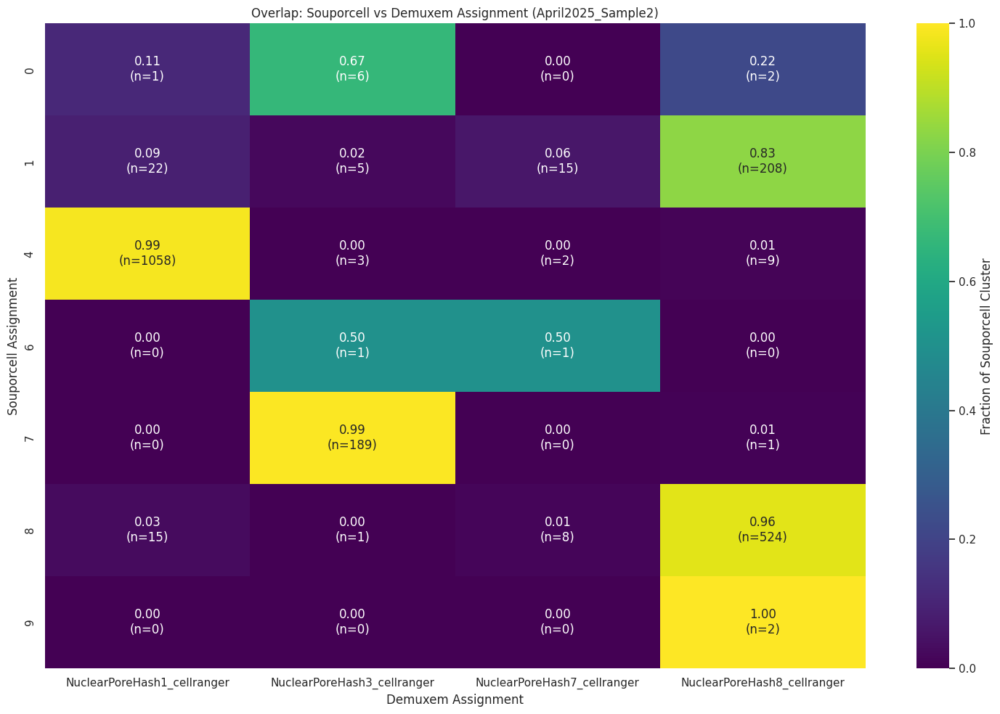

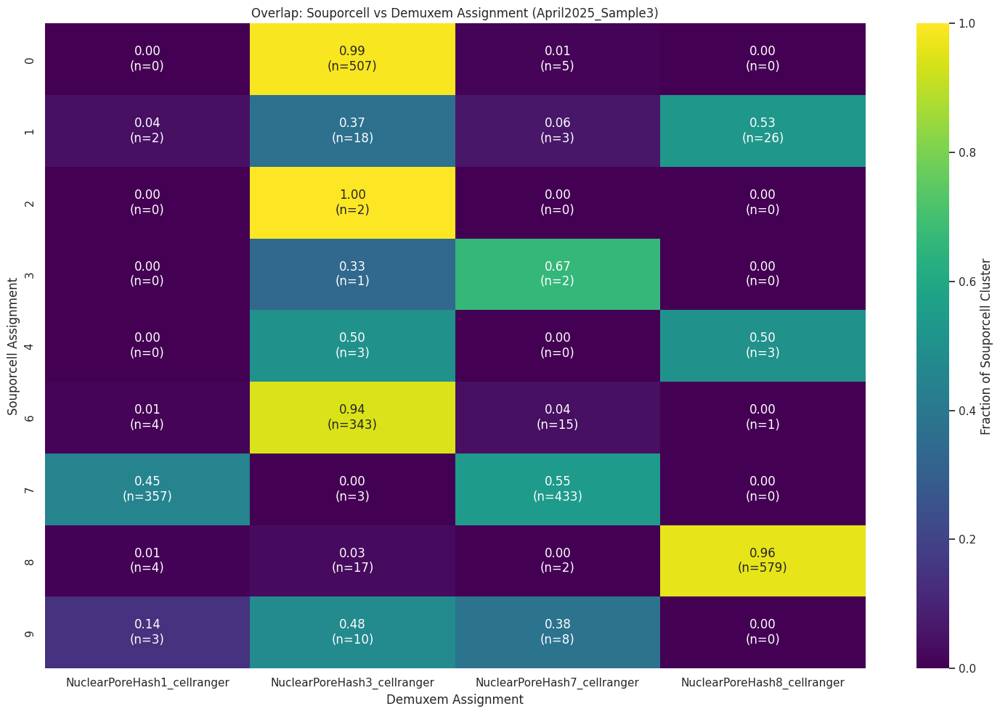

In [63]:
# Set the style and turn off grid lines
sns.set_style("whitegrid", {'axes.grid': False})

# List of hashcounts DataFrames
hashcounts_files = [
    May2025_IVSDuke1_hashcountsfinal, May2025_IVSDuke2_hashcountsfinal, 
    May2025_RVDuke1_hashcountsfinal, May2025_RVDuke2_hashcountsfinal, 
    May2025_LADUCLA_hashcountsfinal, May2025_RVLVUCLA_hashcountsfinal,
    Sept2022_Sample20_hashcountsfinal, Sept2022_Sample21_hashcountsfinal,
    April2025_Sample1_hashcountsfinal, April2025_Sample2_hashcountsfinal,
    April2025_Sample3_hashcountsfinal
]

# Iterate over each file
for file_df in hashcounts_files:
    # Filter to singlets by both methods AND demux_confidence < 0.7
    filtered_df = file_df[
        (file_df['assignment'].str.startswith(('NuclearPoreHash', 'CITESeq_FreeOligo'))) &
        (~file_df['assignment'].str.contains(',')) &
        (~file_df['assignment'].isna()) &
        (file_df['assignment'] != '') &
        (file_df['souporcell_assignment'].astype(str).str.isnumeric()) &
        (~file_df['souporcell_assignment'].astype(str).str.contains('/')) &
        (~file_df['souporcell_assignment'].isna()) &
        (file_df['souporcell_assignment'] != '') &
        (file_df['demux_confidence'] < 0.9)
    ]

    # Extract relevant columns
    subset_df = filtered_df[['souporcell_assignment', 'assignment']]

    # Raw counts: souporcell × demuxem assignment
    contingency_table = pd.crosstab(subset_df['souporcell_assignment'],
                                    subset_df['assignment'])

    # Normalize by row (souporcell assignment)
    normalized_contingency_table = contingency_table.div(
        contingency_table.sum(axis=1), axis=0
    )

    # Create annotation labels: percent\n(n=count), but mask counts < 10
    annotation_labels = normalized_contingency_table.copy()
    for i in annotation_labels.index:
        for j in annotation_labels.columns:
            count = contingency_table.loc[i, j]
            if count < 0:
                annotation_labels.loc[i, j] = ""   # hide label
                normalized_contingency_table.loc[i, j] = np.nan  # hide box color
            else:
                percent = normalized_contingency_table.loc[i, j]
                annotation_labels.loc[i, j] = f"{percent:.2f}\n(n={count})"

    # Plot with masked low-count boxes
    plt.figure(figsize=(15, 10))
    sns.heatmap(
        normalized_contingency_table.astype(float),
        annot=annotation_labels,
        cmap='viridis',
        fmt='', vmin=0, vmax=1,
        cbar_kws={'label': 'Fraction of Souporcell Cluster'},
        mask=normalized_contingency_table.isna()
    )

    # Set labels and title
    if not file_df.empty and '10xRxn' in file_df.columns:
        date_value = file_df['10xRxn'].values[0]
        plt.title(f'Overlap: Souporcell vs Demuxem Assignment ({date_value})')
    else:
        plt.title('Overlap: Souporcell vs Demuxem Assignment')

    plt.xlabel('Demuxem Assignment')
    plt.ylabel('Souporcell Assignment')
    plt.tight_layout()
    plt.show()


# Normalize data

In [64]:
del adata

In [65]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_annot.h5ad"
adata_singlets = sc.read_h5ad(output_path)

In [66]:
# Filter to only genes with feature_type 'Gene Expression'
gene_expression_genes = adata_singlets.var_names[adata_singlets.var['feature_types'] == 'Gene Expression']
adata_singlets = adata_singlets[:, gene_expression_genes].copy()

In [67]:
sc.pp.calculate_qc_metrics(adata_singlets, inplace=True)

In [68]:
adata_singlets

AnnData object with n_obs × n_vars = 185902 × 36601
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_cou

In [69]:
# filter genes with low cell count or cells with low genes
sc.pp.filter_cells(adata_singlets, min_genes=50) 
sc.pp.filter_genes(adata_singlets, min_cells=5)

filtered out 15115 cells that have less than 50 genes expressed
filtered out 4757 genes that are detected in less than 5 cells


In [70]:
#print stats
ncts = np.median(adata_singlets.obs['total_counts'])
ngens = np.median(adata_singlets.obs['n_genes_by_counts'])
print('Median %0.2f counts, %0.2f genes' %(ncts, ngens))

Median 3682.00 counts, 1798.00 genes


In [71]:
adata_singlets.layers['raw_counts'] = adata_singlets.X.copy()

adata_singlets.layers['counts'] = adata_singlets.X.copy()
sc.pp.normalize_total(adata_singlets, layers=['counts'])

adata_singlets.layers['zscore'] = adata_singlets.layers['counts'].copy()
sc.pp.scale(adata_singlets, max_value=10, layer='zscore')

normalizing counts per cell
normalizing counts per cell
    finished (0:00:01)
    finished (0:00:02)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [72]:
# log normalizesc.pp.normalize_total(adata_singlets)
sc.pp.log1p(adata_singlets)
adata_singlets.layers['log1p_counts'] = adata_singlets.X.copy()
adata_singlets.raw = adata_singlets

In [73]:
pd.DataFrame(
    adata_singlets.raw.X[:10, :20].toarray(),
    index=adata_singlets.obs_names[:10],
    columns=adata_singlets.raw.var_names[:20]
)

,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL669831.2,LINC01409,FAM87B,LINC01128,LINC00115,FAM41C,AL645608.6,AL645608.2,LINC02593,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1
0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.598694,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.167347
1,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.097181,0.0,0.752667,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.342339
2,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.102236,0.0,0.0,0.0,0.0,0.0,0.0,0.102236,0.0,0.0,0.000000
3,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.113379,0.0,0.392194,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.215202
4,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.112172,0.0,0.213021,0.0,0.0,0.0,0.0,0.0,0.0,0.304625,0.0,0.0,0.112172
5,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.219320,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.115661
6,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.232638,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
7,0.0,0.0,0.0,0.119284,0.0,0.0,0.0,0.000000,0.0,0.409962,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.119284
8,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.408912,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.118933
9,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.429902,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.125995


In [74]:
sc.pp.highly_variable_genes(
    adata_singlets,
    layer='raw_counts',
    flavor='seurat_v3',
    n_top_genes=2000,
    min_mean=0.0125,
    max_mean=3,
    min_disp=0.5
)

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [75]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm.h5ad"
adata_singlets.write(output_path)

# PCA analysis

In [76]:
del adata_singlets

In [77]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm.h5ad"
adata_singlets = sc.read_h5ad(output_path)

computing PCA
    with n_comps=50
    finished (0:00:29)


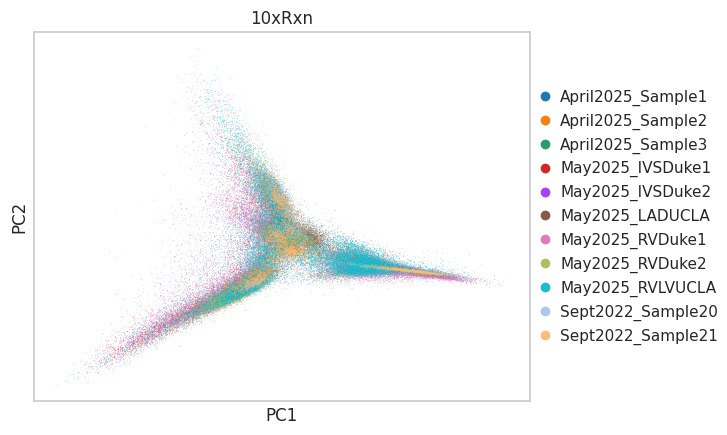

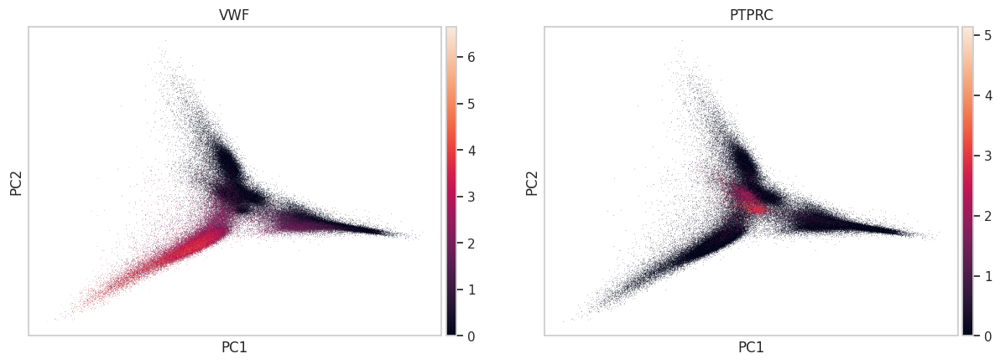

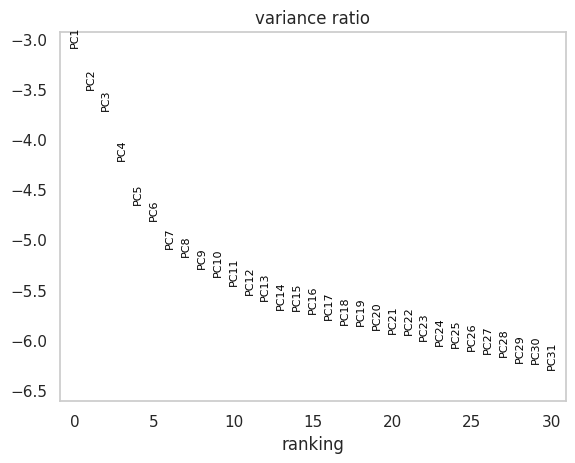

In [78]:
sc.tl.pca(adata_singlets, svd_solver='arpack', use_highly_variable=True, layer='zscore')

sc.pl.pca(adata_singlets, color=['10xRxn'])
sc.pl.pca(adata_singlets, color=['VWF','PTPRC'])
sc.pl.pca_variance_ratio(adata_singlets, log=True)

In [79]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca.h5ad"
adata_singlets.write(output_path)

# Scrublet

In [80]:
del adata_singlets

In [7]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca.h5ad"
adata_singlets = sc.read_h5ad(output_path)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.51
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 26.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.6%
Elapsed time: 5.7 seconds
Detected doublet rate = 4.8%
Estimated detectable doublet fraction = 56.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 8.5%
132 doublets found for batch April2025_Sample1
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.65
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 2.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 7.2 seconds
Detected doublet rate = 6.0%
Estimated detectable doublet fraction = 34.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 17.3%
179 doublets found for batch April202

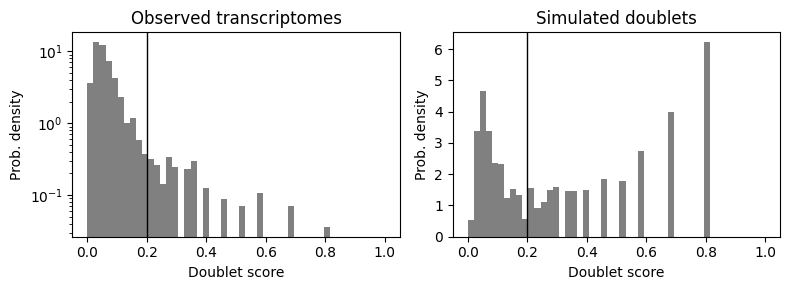

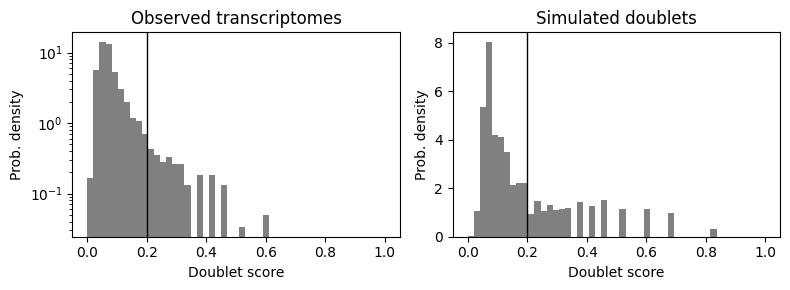

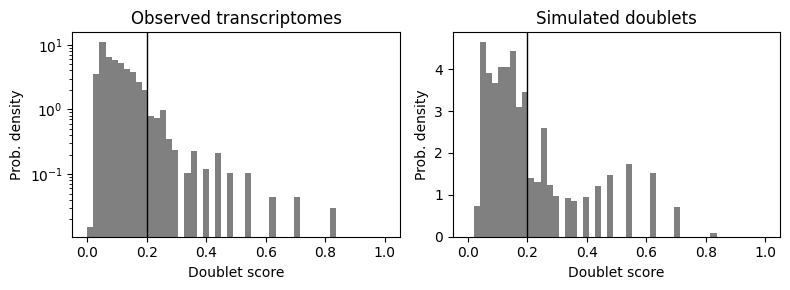

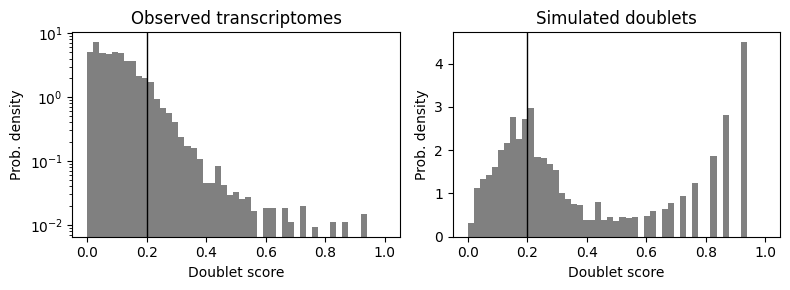

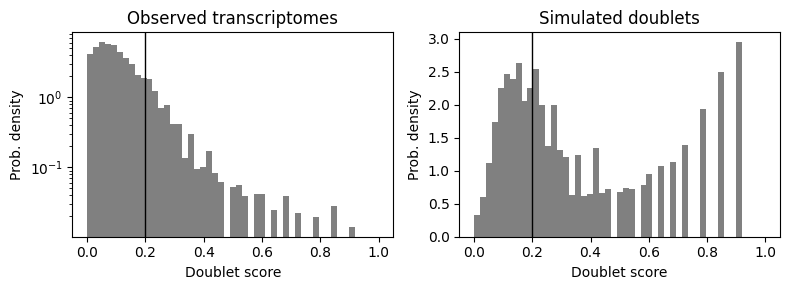

...

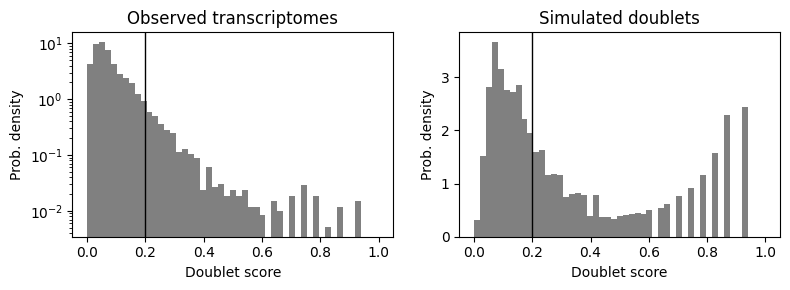

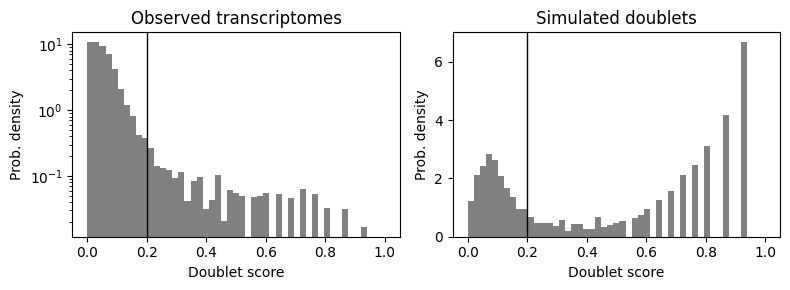

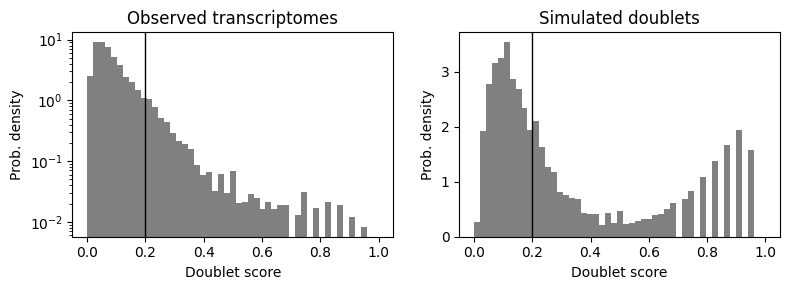

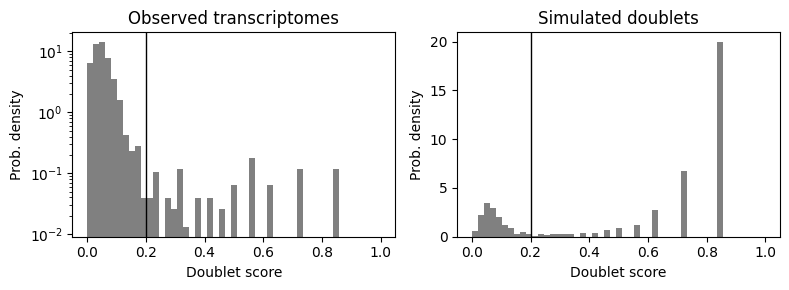

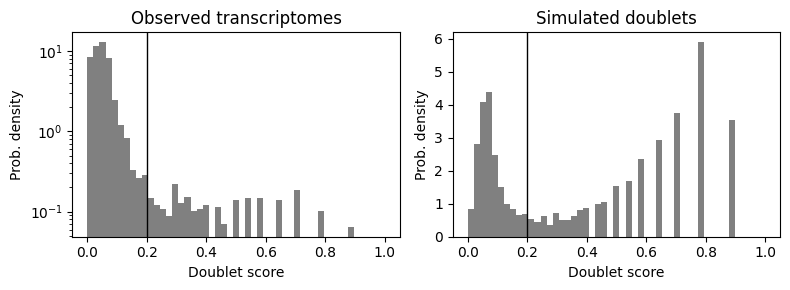

In [6]:
#scrublet
# identify doublets -- calculated by batch
adata_singlets.obs['doublet'] = False
adata_singlets.obs['doublet_scores'] = 0


THRESH={'May2025_IVSDuke1':0.2,
        'May2025_IVSDuke2':0.2,
        'May2025_RVDuke1':0.2,
        'May2025_RVDuke2':0.2,
        'May2025_LADUCLA':0.2,
        'May2025_RVLVUCLA':0.2,
        'Sept2022_Sample20':0.2,
        'Sept2022_Sample21':0.2,
        'April2025_Sample1':0.2,
        'April2025_Sample2':0.2,
        'April2025_Sample3':0.2,
        }


for batch in adata_singlets.obs['10xRxn'].cat.categories: 
    batch_thresh = THRESH[batch]
    counts_matrix = adata_singlets[adata_singlets.obs['10xRxn']==batch].layers['counts']
    
    scrub = scr.Scrublet(counts_matrix, expected_doublet_rate=0.1)
    doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=5, 
                                                              min_cells=5, 
                                                              min_gene_variability_pctl=80,
                                                              n_prin_comps=30)
    
    scrub.call_doublets(threshold=batch_thresh)
    scrub.plot_histogram();
    print('%i doublets found for batch %s' %(sum(doublet_scores>batch_thresh), batch) )

    adata_singlets.obs.loc[adata_singlets.obs['10xRxn']==batch, 'doublet'] = doublet_scores>batch_thresh
    adata_singlets.obs.loc[adata_singlets.obs['10xRxn']==batch, 'doublet_scores'] = doublet_scores


In [7]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub.h5ad"
adata_singlets.write(output_path)

# Harmony after scrublet

In [8]:
del adata_singlets

In [8]:
from harmony import harmonize

In [6]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub.h5ad"
adata_singlets = sc.read_h5ad(output_path)

In [9]:
adata_singlets = adata_singlets[adata_singlets.obs['doublet']==False]

In [10]:
adata_singlets

View of AnnData object with n_obs × n_vars = 156656 × 31844
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 't

In [11]:
adata_singlets.obs["sampleID"] = (
    adata_singlets.obs["10xRxn"].astype(str) + "_" +
    adata_singlets.obs["Donor"].astype(str) + "_" +
    adata_singlets.obs["Location"].astype(str) + "_" +
    adata_singlets.obs["TimePoint"].astype(str)
)

In [12]:
adata_singlets.obsm['X_harmony'] = harmonize(np.array(adata_singlets.obsm['X_pca']), 
                                    adata_singlets.obs, batch_key = ['sampleID'])

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).


In [13]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm.h5ad"
adata_singlets.write(output_path)

... storing 'sampleID' as categorical


# Umap plotting

In [ ]:
del adata_singlets

In [ ]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm.h5ad"
adata_singlets = sc.read_h5ad(output_path)

In [14]:
adata_singlets.obs['total_counts_H3'].describe()

count    156656.000000
mean         12.589648
std          20.341066
min           0.000000
25%           5.000000
50%          10.000000
75%          17.000000
max        4746.000000
Name: total_counts_H3, dtype: float64

In [15]:
# Subsample 10% of the data
adata_sub = sc.pp.subsample(adata_singlets, fraction=0.05, copy=True)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:10)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


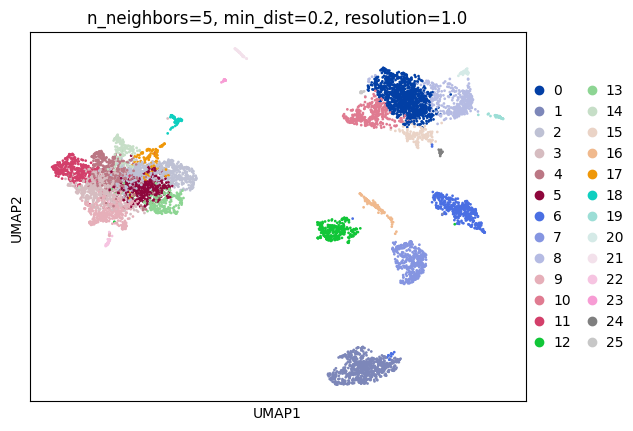

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:10)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


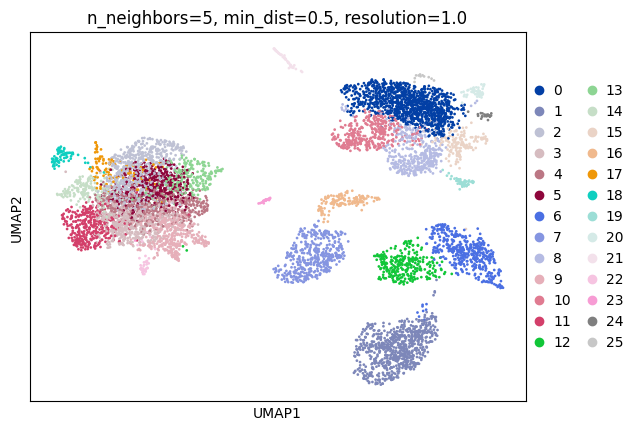

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:10)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


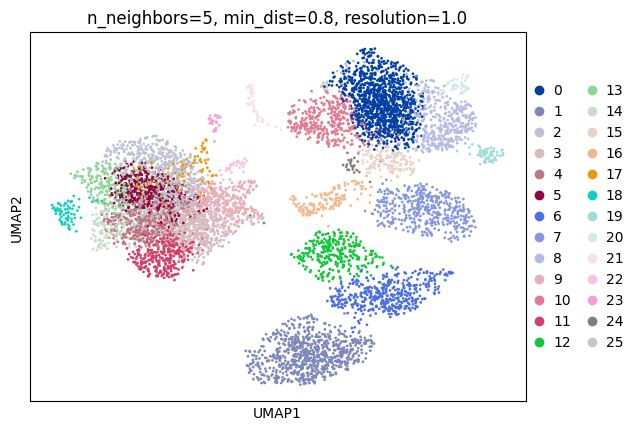

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:17)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


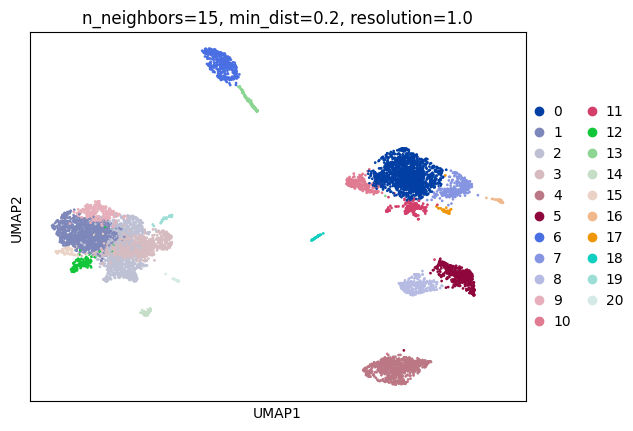

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:16)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


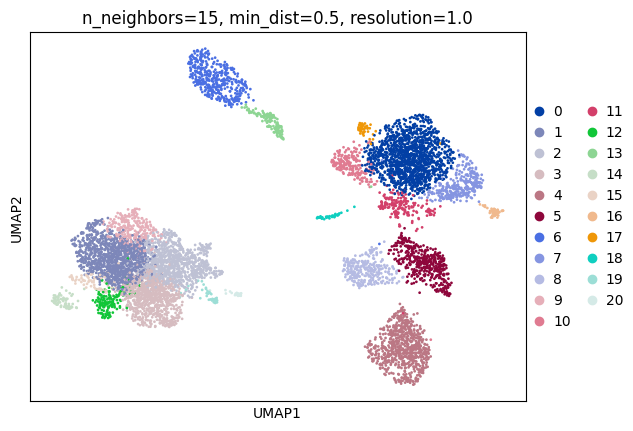

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:16)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


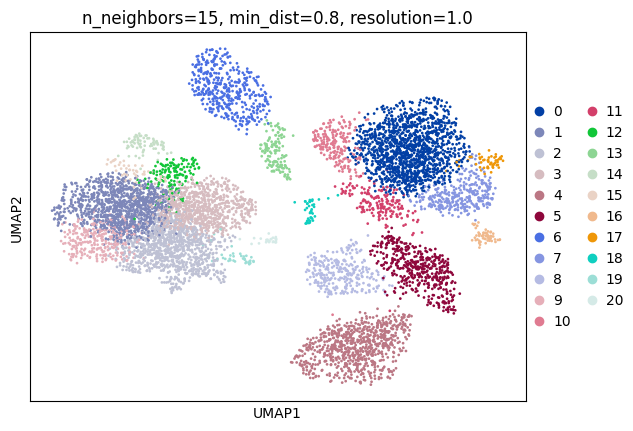

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:21)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


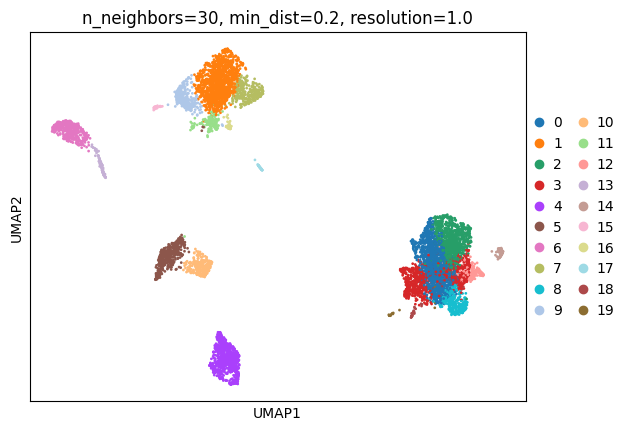

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:21)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


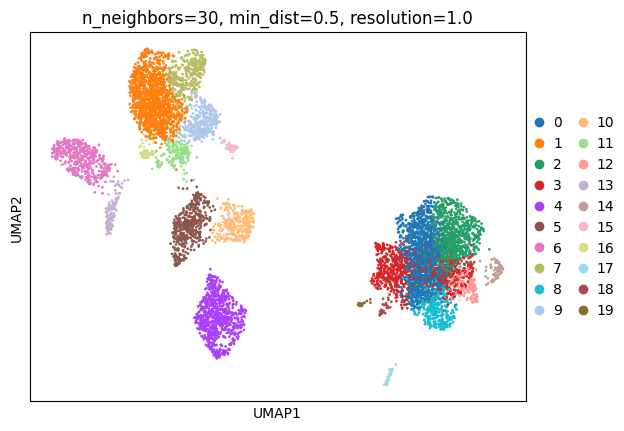

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:21)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


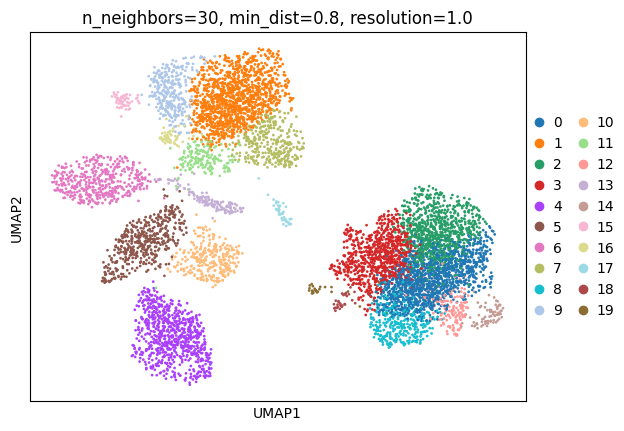

In [16]:
# Define parameter ranges
n_neighbors_list = [5, 15, 30]
min_dist_list = [0.2, 0.5, 0.8]
resolutions = [1.0]

# Iterate over parameter combinations
for n_neighbors in n_neighbors_list:
    for min_dist in min_dist_list:
        for resolution in resolutions:
            # Create a copy of the subset to avoid modifying the original
            adata_test = adata_sub.copy()
            
            # Compute the neighborhood graph
            sc.pp.neighbors(adata_test, use_rep='X_harmony', n_neighbors=n_neighbors, n_pcs=40)
            
            # Compute UMAP embedding
            sc.tl.umap(adata_test, min_dist=min_dist)
            
            # Perform Leiden clustering
            sc.tl.leiden(adata_test, resolution=resolution)
            
            # Plot the UMAP with clusters
            sc.pl.umap(adata_test, color='leiden', title=f'n_neighbors={n_neighbors}, min_dist={min_dist}, resolution={resolution}')

In [17]:
sc.pp.neighbors(adata_singlets, use_rep='X_harmony')
sc.tl.umap(adata_singlets, min_dist=0.8)


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:44)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:02:54)


In [18]:
sc.tl.leiden(adata_singlets, resolution=0.8)

running Leiden clustering
    finished: found 28 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:55)


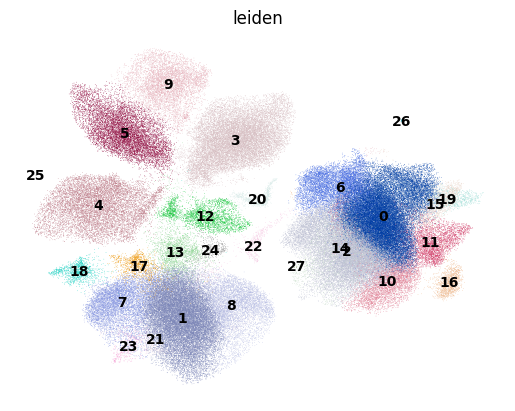

In [19]:
sc.pl.umap(adata_singlets, color='leiden', legend_loc='on data', frameon=False)


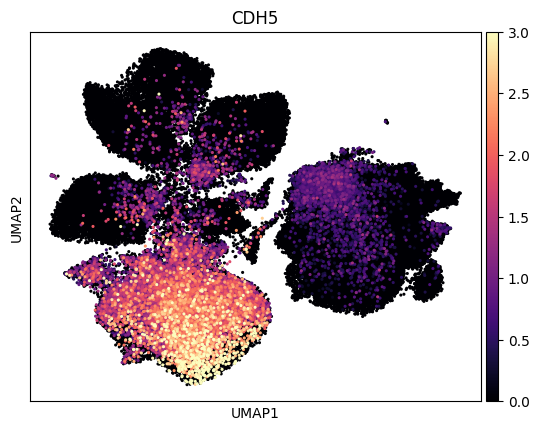

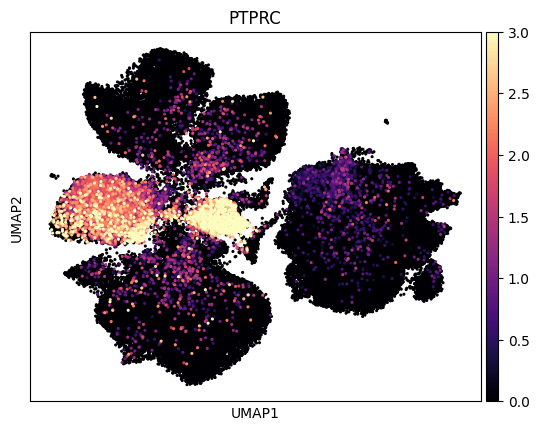

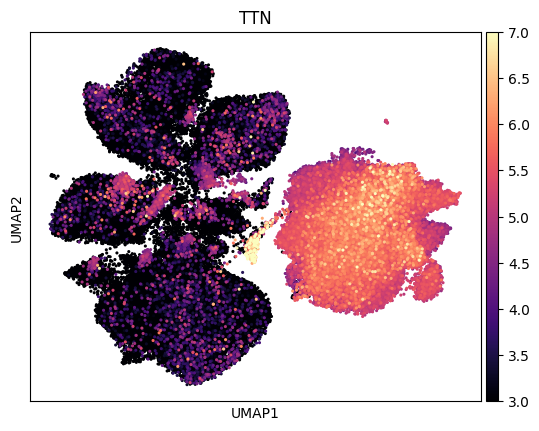

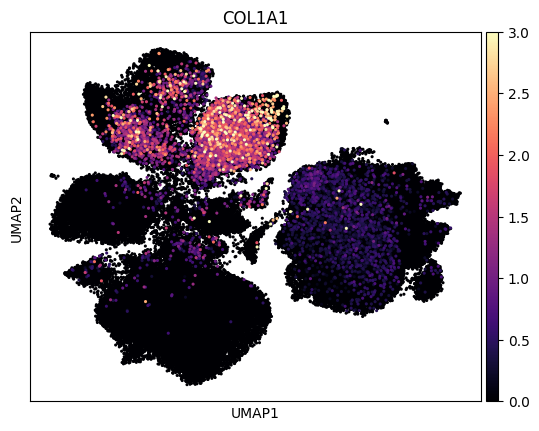

In [20]:
# Plot Vwf expression
sc.pl.umap(adata_singlets, color='CDH5', use_raw=False, cmap='magma', size=20,vmin=0, vmax=3)

# Plot Ptprc expression
sc.pl.umap(adata_singlets, color='PTPRC', use_raw=False, cmap='magma', size=20, vmin=0, vmax=3)

# Plot Ptprc expression
sc.pl.umap(adata_singlets, color='TTN', use_raw=False, cmap='magma', size=20, vmin=3, vmax=7)

# Plot Col1a expression
sc.pl.umap(adata_singlets, color='COL1A1', use_raw=False, cmap='magma', size=20, vmin=0, vmax=3)

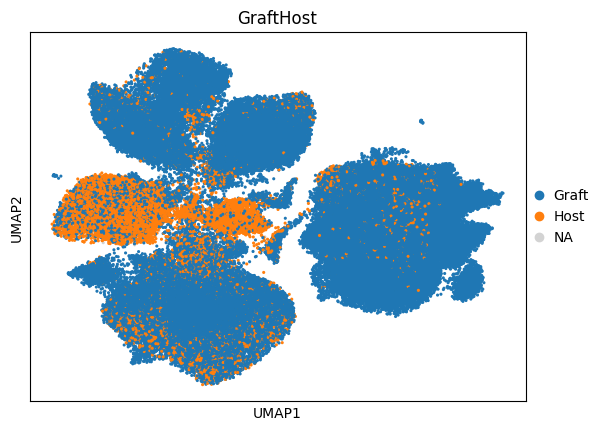

In [21]:
# Graft cells
sc.pl.umap(adata_singlets, color='GraftHost', cmap='magma', size=20)

In [22]:
list(adata_singlets.obs.columns)

['souporcell_status',
 'souporcell_assignment',
 'souporcell_statusBatch',
 'souporcell_assignmentBatch',
 'souporcell_statusMerge',
 'souporcell_assignmentMerge',
 'demux_type',
 'assignment',
 'hashtag_counts',
 'demux_confidence',
 'hto_assigned_vs_others_ratio',
 '10xRxn',
 'source',
 'total_counts_NFkB_p65',
 'total_counts_LINE1_ORF1p',
 'total_counts_LINE1_ORF2p',
 'total_counts_PTBP1-1',
 'total_counts_SRSF7-1',
 'total_counts_TDP43',
 'total_counts_HNRNPA1-1',
 'total_counts_FNDC3B-1',
 'total_counts_SMAD2-1',
 'total_counts_Histone_H3',
 'total_counts_IgG',
 'total_counts_YAP1-1',
 'total_counts_TAZ-1',
 'total_counts_pSTAT3',
 'total_counts_ATF3-1',
 'total_counts_HIF1a',
 'total_counts_SRSF5-1',
 'total_counts_ELAVL1-1',
 'total_counts_SMAD5-1',
 'total_counts_Calreticulin',
 'total_counts_IRF3-1',
 'total_counts_pSMAD2',
 'total_counts_pSTAT1_1',
 'total_counts_IRF1_1',
 'total_counts_RPS6-1',
 'total_counts_BCL6-1',
 'total_counts_pSTAT1_2',
 'total_counts_IRF1_2',
 'total

In [23]:
#This is a saved version with new (cellranger) derived protein counts and heart parameters

output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust.h5ad"
adata_singlets.write(output_path)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


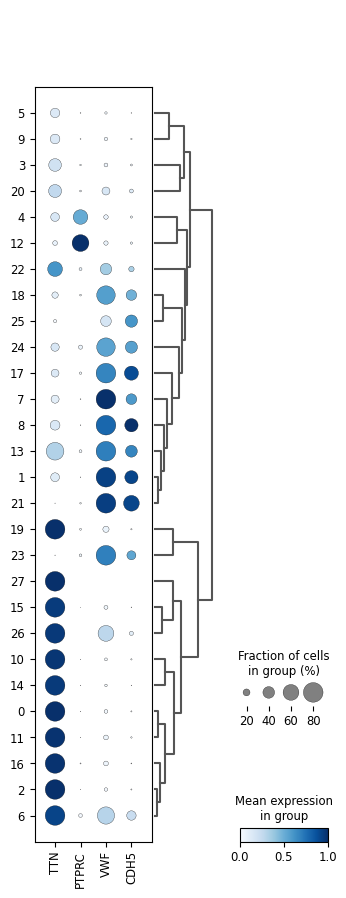

In [24]:
# Make sure the correct Leiden cluster key exists
assert 'leiden' in adata_singlets.obs.columns, "Leiden clustering not found in .obs['leiden']"

# Plot dotplot for marker genes across Leiden clusters, with clustering
sc.pl.dotplot(
    adata_singlets,
    var_names=['TTN', 'PTPRC', 'VWF', 'CDH5'],
    groupby='leiden',
    standard_scale='var',  # normalize per gene
    dot_max=0.8,
    color_map='Blues',
    dendrogram=True  # <- this clusters Leiden groups by similarity
)


In [25]:
# Count the number of cells per 10xRxn batch
batch_counts = adata_singlets.obs['10xRxn'].value_counts()

# Display the counts
print(batch_counts)

10xRxn
May2025_RVLVUCLA     44036
May2025_RVDuke1      27270
May2025_IVSDuke1     23759
May2025_RVDuke2      22662
May2025_IVSDuke2     15281
Sept2022_Sample21     7304
May2025_LADUCLA       4277
Sept2022_Sample20     3720
April2025_Sample3     2932
April2025_Sample2     2789
April2025_Sample1     2626
Name: count, dtype: int64


In [26]:
# Define the EC clusters to retain
clusters_to_keep = ['1', '21', '13', '8', '7', '17', '24', '25', '18']

# Subset the AnnData object
adata_EC_subset = adata_singlets[adata_singlets.obs['leiden'].isin(clusters_to_keep)].copy()


In [27]:
#saved with cellranger protein counts in .obs
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_EC.h5ad"
adata_EC_subset.write(output_path)

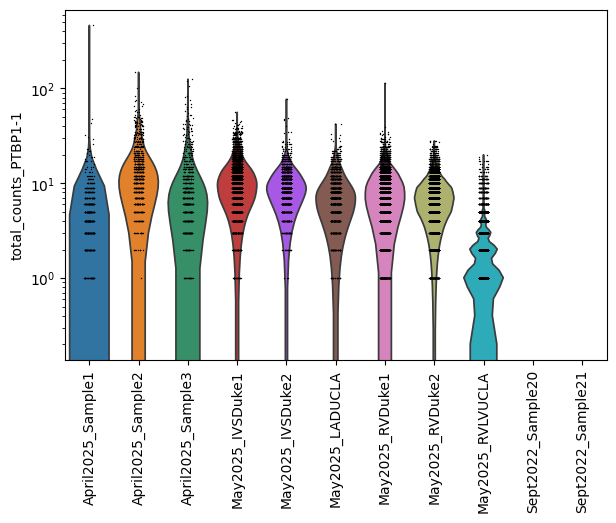

In [28]:
sc.pl.violin(adata_EC_subset, keys=['total_counts_PTBP1-1'], groupby='10xRxn', log="True", rotation=90)

In [29]:
# Count the number of cells per 10xRxn batch
batch_counts = adata_EC_subset.obs['10xRxn'].value_counts()

# Display the counts
print(batch_counts)

10xRxn
May2025_RVLVUCLA     11414
May2025_RVDuke2      11053
May2025_RVDuke1       6948
May2025_IVSDuke1      4483
May2025_IVSDuke2      1591
Sept2022_Sample21     1564
May2025_LADUCLA       1547
April2025_Sample2      812
Sept2022_Sample20      745
April2025_Sample3      716
April2025_Sample1      571
Name: count, dtype: int64


# Analyze cells in all clusters

In [213]:
#del adata_all_cells
#del adata_singlets


In [7]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust.h5ad"
adata_all_cells = sc.read_h5ad(output_path)


In [8]:
# import annotations
anno_df = pd.read_csv('/labs/Murphy/SharedCondaEnv/2025Dec_CAV_10xDataAnalysis/Annotations_Dec5_HeartParameters.csv')

# Check that "BatchSouporcell" exists in both
assert "BatchSouporcell" in anno_df.columns, "CSV file missing 'BatchSouporcell'"
assert "BatchSouporcell" in adata_all_cells.obs.columns, "adata.obs missing 'BatchSouporcell'"

anno_df = anno_df.loc[:, ~anno_df.columns.str.contains('^Unnamed')]

# Remove specific columns
cols_to_drop = ["Donor", "Sample ID:"]
anno_df = anno_df.drop(columns=[c for c in cols_to_drop if c in anno_df.columns])

anno_df.head()

,BatchSouporcell,SampleType,BankSource,Location,StrippedDonor,Day,ConfidenceOnHashing,DiseaseStatus,TimePoint,BetweenSampleSC_Validations,...,acute_rejection_grade,AcuteCellularRejection,AntibodyMediatedRejection,pAMR,allograft_vasculopathy,max_stenosis_%,thrombosis,myocardial_infarct,fibrosis,other_key_findings
0,April2025_Sample1_0,Biopsy,UCLA,Septum,BiopsyPatient4,247,High,Rejection,Late,good,...,0/2,0.0,0.0,7,0,0.0,0,0,0,0
1,April2025_Sample1_1,Biopsy,UCLA,Septum,BiopsyPatient5,90,High,Rejection,Early,good,...,1R/0,0.0,0.0,10,0,0.0,0,0,0,0
2,April2025_Sample1_2,Biopsy,UCLA,Septum,BiopsyPatient1,59,High,Stable,Early,good,...,0/0,0.0,0.0,3,0,0.0,0,0,0,0
3,April2025_Sample1_6,Biopsy,UCLA,Septum,BiopsyPatient4,247,High,Rejection,Late,good,...,0/2,0.0,0.0,7,0,0.0,0,0,0,0
4,April2025_Sample1_7,Biopsy,UCLA,Septum,BiopsyPatient3,62,High,Stable,Early,good,...,0/0,0.0,0.0,6,0,0.0,0,0,0,0


In [9]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Count unique BatchSouporcell for each combination
batch_counts = anno_df.groupby(
    ['Location', 'DiseaseStatus']
)['BatchSouporcell'].nunique()

print(batch_counts)

Location       DiseaseStatus
LAD            CAV               2
               Nontransplant     2
LeftVentricle  CAV              15
               LateRejection     4
Septum         CAV              13
               LateRejection     3
               Nontransplant     2
               Rejection        17
               Stable           11
Name: BatchSouporcell, dtype: int64


In [10]:
# Clean unnamed columns
anno_df = anno_df.loc[:, ~anno_df.columns.str.contains('^Unnamed')]

# Rename anno columns to avoid conflict during merge
anno_cols = [c for c in anno_df.columns if c != "BatchSouporcell"]
anno_renamed = anno_df.rename(columns={c: f"{c}__NEW" for c in anno_cols})

# Merge new annotations into obs
obs_new = adata_all_cells.obs.merge(
    anno_renamed,
    on="BatchSouporcell",
    how="left"
)

# Overwrite old columns with new ones
for c in anno_cols:
    if f"{c}__NEW" in obs_new.columns:
        obs_new[c] = obs_new[f"{c}__NEW"]

# Drop helper columns
obs_new = obs_new.drop(columns=[c for c in obs_new.columns if c.endswith("__NEW")])

# Assign back
adata_all_cells.obs = obs_new


In [11]:
# Copy Location to LocationFine
adata_all_cells.obs["LocationFine"] = adata_all_cells.obs["Location"].copy()

# Make sure it's categorical
adata_all_cells.obs["LocationFine"] = adata_all_cells.obs["LocationFine"].astype("category")

# Ensure all categories that will be assigned exist
new_cats = ["RightSeptum", "LeftSeptum", "unknown"]
for cat in new_cats:
    if cat not in adata_all_cells.obs["LocationFine"].cat.categories:
        adata_all_cells.obs["LocationFine"] = adata_all_cells.obs["LocationFine"].cat.add_categories([cat])

# Define batches where we want to apply mapping
rvlv_batches = [
    "May2025_RVLVUCLA_0",
    "May2025_RVLVUCLA_1",
    "May2025_RVLVUCLA_2",
    "May2025_RVLVUCLA_3"
]

batch_mask = adata_all_cells.obs["BatchSouporcell"].isin(rvlv_batches)

# Define conditions within those batches
cond_septum = batch_mask & adata_all_cells.obs["assignment"].isin(["NuclearPoreHash1","NuclearPoreHash2","NuclearPoreHash3"])
cond_lv     = batch_mask & adata_all_cells.obs["assignment"].isin(["NuclearPoreHash7","NuclearPoreHash8","NuclearPoreHash9"])

# Apply mapping only inside those batches
adata_all_cells.obs.loc[cond_septum, "LocationFine"] = "RightSeptum"
adata_all_cells.obs.loc[cond_lv, "LocationFine"]     = "LeftSeptum"
adata_all_cells.obs.loc[batch_mask & ~(cond_septum | cond_lv), "LocationFine"] = "unknown"


In [12]:
adata_all_cells.obs.columns

Index(['souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch',
       'souporcell_assignmentBatch', 'souporcell_statusMerge',
       'souporcell_assignmentMerge', 'demux_type', 'assignment',
       'hashtag_counts', 'demux_confidence',
       ...
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_genes',
       'doublet', 'doublet_scores', 'sampleID', 'leiden', 'StrippedDonor'],
      dtype='object', length=174)

### Filter data for missing annotations

In [13]:
# Check for NaNs in Donor or Location - these are samples where we did not have sufficient information to assign souporcell to a donor
missing_donor = adata_all_cells.obs['Donor'].isna().sum()
missing_location = adata_all_cells.obs['Location'].isna().sum()

print(f"Missing Donor entries: {missing_donor}")
print(f"Missing Location entries: {missing_location}")


Missing Donor entries: 596
Missing Location entries: 596


In [14]:
adata_all_cells.obs = adata_all_cells.obs.drop(columns=["Donor", "sampleID"], errors="ignore")

In [15]:
#Remove SampleID and Donor column, and keep only StrippedDonor and StrippedSampleID
adata_all_cells.obs["sampleID"] = (
    adata_all_cells.obs["BatchSouporcell"].astype(str) + "_" +
    adata_all_cells.obs["StrippedDonor"].astype(str) + "_" +
    adata_all_cells.obs["Location"].astype(str) + "_" +
    adata_all_cells.obs["Day"].astype(str)
)

In [16]:
pd.reset_option("display.max_rows")
pd.reset_option("display.max_columns")

adata_all_cells.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,...,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,n_genes,doublet,doublet_scores,leiden,StrippedDonor,sampleID
0,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,4978.0,0.540297,...,35.661101,43.156463,51.181200,63.376623,6101,False,0.132847,16,CAV3,May2025_IVSDuke1_7_CAV3_Septum_2204.0
1,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,6811.0,0.544150,...,33.503340,40.626992,48.748510,61.022258,5880,False,0.196117,16,CAV3,May2025_IVSDuke1_7_CAV3_Septum_2204.0
2,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,7501.0,0.644407,...,35.605987,42.740226,50.787440,63.099547,5356,False,0.080851,16,CAV3,May2025_IVSDuke1_7_CAV3_Septum_2204.0
3,singlet,8,singlet,6,singlet,8,doublet,"NuclearPoreHash1_cellranger,NuclearPoreHash7_c...",4420.0,0.780797,...,34.937778,40.353988,46.953382,57.950222,6313,False,0.109827,6,SevereRejection2,May2025_IVSDuke1_8_SevereRejection2_Septum_609.0
4,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,3161.0,0.541863,...,32.670406,39.699962,47.916595,61.208409,5185,False,0.091743,16,CAV3,May2025_IVSDuke1_7_CAV3_Septum_2204.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156651,singlet,6,singlet,6,singlet,6,unknown,,309.0,1.000000,...,31.216931,44.444444,70.899471,100.000000,310,False,0.038356,4,BiopsyPatient4,Sept2022_Sample21_6_BiopsyPatient4_Septum_282.0
156652,singlet,0,singlet,0,singlet,0,unknown,,363.0,1.000000,...,36.363636,59.090909,100.000000,100.000000,190,False,0.064125,3,BiopsyPatient4,Sept2022_Sample21_0_BiopsyPatient4_Septum_282.0
156653,singlet,1,singlet,1,singlet,1,unknown,,365.0,1.000000,...,60.000000,100.000000,100.000000,100.000000,92,False,0.069810,12,BiopsyPatient5,Sept2022_Sample21_1_BiopsyPatient5_Septum_905.0
156654,singlet,2,singlet,2,singlet,2,unknown,,167.0,1.000000,...,25.615764,37.438424,53.858785,100.000000,481,False,0.057283,20,BiopsyPatient1,Sept2022_Sample21_2_BiopsyPatient1_Septum_90.0


In [19]:
## Obtain cluster-specific differentially expressed genes
#sc.tl.rank_genes_groups(adata_all_cells, groupby="leiden", method="wilcoxon")


In [20]:
## Get the list of all groups
#groups = adata_all_cells.uns["rank_genes_groups"]["names"].dtype.names

## Collect results
#all_groups = []
#for g in groups:
#    df = sc.get.rank_genes_groups_df(adata_all_cells, group=g).head(20)  # top 5 for each group
#    df["group"] = g
#    all_groups.append(df)

## Combine into one DataFrame
#markers_df = pd.concat(all_groups)

#markers_df.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025SDec_markers_df_top20.xlsx", index=False)

## Dot plots of cell type markers before and after filtering

... storing 'BatchSouporcell' as categorical
... storing 'SampleType' as categorical
... storing 'BankSource' as categorical
... storing 'Location' as categorical
... storing 'ConfidenceOnHashing' as categorical
... storing 'DiseaseStatus' as categorical
... storing 'TimePoint' as categorical
... storing 'BetweenSampleSC_Validations' as categorical
... storing 'GraftHost' as categorical
... storing 'RV_systolic' as categorical
... storing 'RV_diastolic' as categorical
... storing 'acute_rejection_grade' as categorical
... storing 'pAMR' as categorical
... storing 'allograft_vasculopathy' as categorical
... storing 'thrombosis' as categorical
... storing 'myocardial_infarct' as categorical
... storing 'fibrosis' as categorical
... storing 'other_key_findings' as categorical
... storing 'StrippedDonor' as categorical
... storing 'sampleID' as categorical


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_with_counts']`
categories: 0 (n=28140), 1 (n=22032), 2 (n=21712), etc.
var_group_labels: CM, FB, EC, etc.


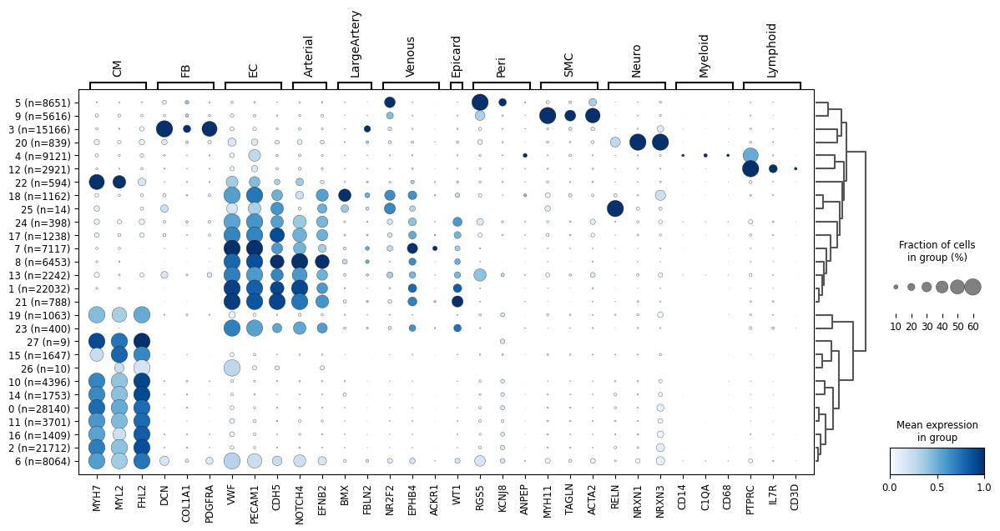

In [17]:
# Ensure Leiden clusters exist in adata.obs
cluster_key = 'leiden'

# Calculate cell counts per cluster
cluster_counts = adata_all_cells.obs[cluster_key].value_counts().sort_index()

# Create new cluster labels with counts appended
cluster_labels_with_counts = [f"{cluster} (n={count})" for cluster, count in cluster_counts.items()]

# Create a mapping from original cluster to new label
cluster_label_map = dict(zip(cluster_counts.index.astype(str), cluster_labels_with_counts))

# Add new labels to adata.obs for plotting
adata_all_cells.obs['leiden_with_counts'] = adata_all_cells.obs[cluster_key].map(cluster_label_map)

# Define marker genes dictionary again for completeness
marker_genes_dict = {
    'CM': ['MYH7', 'MYL2', 'FHL2'],
    'FB': ['DCN', 'COL1A1', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5'],
    'Arterial': ['NOTCH4', 'EFNB2'],
    'LargeArtery': ['BMX', 'FBLN2'],
    'Venous': ['NR2F2', 'EPHB4', 'ACKR1'],
    'Epicard': ['WT1'],
    'Peri': ['RGS5', 'KCNJ8', 'ANPEP'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Neuro': ['RELN', 'NRXN1', 'NRXN3'],
    'Myeloid': ['CD14', 'C1QA', 'CD68'],
    'Lymphoid': ['PTPRC', 'IL7R', 'CD3D'],
}

# Generate the dotplot grouped by the new cluster labels with counts
sc.pl.dotplot(
    adata_all_cells,
    var_names=marker_genes_dict,
    groupby='leiden_with_counts',
    standard_scale='var',  # normalize per gene
    dot_max=0.6,
    color_map='Blues',
    figsize=(14, 6),
    dendrogram=True
)

# Save as PDF with proper text
plt.savefig("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/MarkersAllCells.pdf", bbox_inches="tight")
plt.close()

In [18]:
# For "odd" clusters, check donor compositions - if all from one sample not representative and remove

# Make sure your cluster column and donor column names
cluster_key = 'leiden'  # or the exact obs column with cluster IDs
donor_key = 'StrippedDonor'     # or whatever your donor metadata column is called

# Select clusters of interest
clusters_of_interest = ['22', '26', '23', '6', '19']  # Make sure cluster IDs are strings, as in leiden obs

for cluster in clusters_of_interest:
    # Filter cells in this cluster
    cells_in_cluster = adata_all_cells.obs[adata_all_cells.obs[cluster_key] == cluster]
    
    # Count donors in this cluster
    donor_counts = cells_in_cluster[donor_key].value_counts()
    
    # Calculate donor % composition in this cluster
    donor_percent = (donor_counts / donor_counts.sum()) * 100
    
    print(f"\nCluster {cluster} Donor Composition (%):")
    print(donor_percent.round(2))



Cluster 22 Donor Composition (%):
StrippedDonor
Nontransplant1      36.55
BiopsyPatient5      11.17
CAV3                 8.97
CAV10                8.46
CAV6                 6.26
CAV1                 3.89
SevereRejection2     3.55
Nontransplant2       3.38
BiopsyPatient1       2.71
SevereRejection1     2.54
CAV5                 2.37
CAV4                 1.86
CAV7                 1.86
CAV9                 1.69
CAV2                 1.52
CAV8                 1.18
BiopsyPatient3       1.18
BiopsyPatient4       0.85
BiopsyPatient2       0.00
Name: count, dtype: float64

Cluster 26 Donor Composition (%):
StrippedDonor
CAV3                100.0
BiopsyPatient1        0.0
CAV6                  0.0
SevereRejection1      0.0
Nontransplant2        0.0
Nontransplant1        0.0
CAV10                 0.0
CAV9                  0.0
CAV8                  0.0
CAV7                  0.0
CAV5                  0.0
BiopsyPatient2        0.0
CAV4                  0.0
CAV2                  0.0
CAV1            

In [19]:
# Filter out small clusters and mixed cardiomyocyte and endothelial clusters, and provide general labels

# Define exclusions
exclude_clusters = {'19', '23', '26', '6', '22', '25', '27'}

# Define mapping of clusters to broad cell types
groups = {
    "Endothelial":  ["1","7","8","13","17","18","21","24"],
    "Cardiomyocyte": ["0","2","6","10","11","14","15","16"],
    "Fibroblast":   ["3"],
    "Pericyte":     ["5"],
    "SMC":          ["9"],
    "Neuron":       ["20"],
    "Myeloid":      ["4"],
    "Lymphoid":     ["12"],
}

cell_type_map = {str(k): group for group, ks in groups.items() for k in ks}

# Make a filtered copy of adata (removing unwanted clusters)
adata_filtered = adata_all_cells[~adata_all_cells.obs["leiden"].isin(exclude_clusters)].copy()

# Add new annotation
adata_filtered.obs["cell_type_general"] = (
    adata_filtered.obs["leiden"].map(cell_type_map).fillna("Unknown")
)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_with_counts']`


... storing 'cell_type_general' as categorical


categories: 0 (n=28140), 1 (n=22032), 10 (n=4396), etc.
var_group_labels: CM, FB, EC, etc.


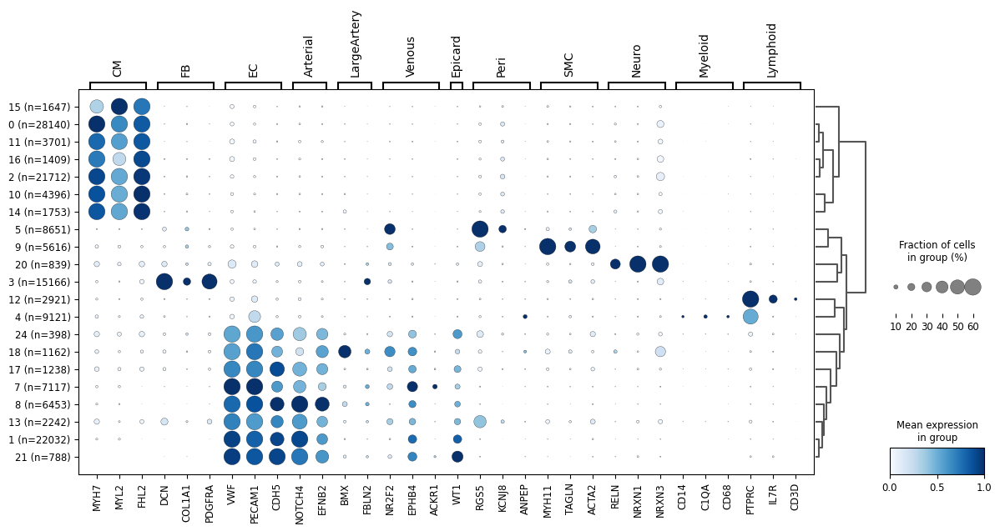

In [20]:
# 1. Ensure leiden is string + category
adata_filtered.obs['leiden'] = adata_filtered.obs['leiden'].astype(str)
adata_filtered.obs['leiden'] = adata_filtered.obs['leiden'].astype('category')
adata_filtered.obs['leiden'] = adata_filtered.obs['leiden'].cat.remove_unused_categories()

# 2. Create new labels with counts
cluster_counts = adata_filtered.obs['leiden'].value_counts().sort_index()
cluster_label_map = {
    cluster: f"{cluster} (n={count})" for cluster, count in cluster_counts.items()
}

adata_filtered.obs['leiden_with_counts'] = (
    adata_filtered.obs['leiden'].map(cluster_label_map)
)

adata_filtered.obs['leiden_with_counts'] = (
    adata_filtered.obs['leiden_with_counts']
    .astype('category')
)

# 3. ❗ RECOMPUTE DENDROGRAM AFTER FILTERING
sc.tl.dendrogram(adata_filtered, groupby='leiden_with_counts')

# 4. Plot
sc.pl.dotplot(
    adata_filtered,
    var_names=marker_genes_dict,
    groupby='leiden_with_counts',
    standard_scale='var',
    dot_max=0.6,
    color_map='Blues',
    figsize=(14, 6),
    dendrogram=True
)

plt.savefig("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/MarkersAllCells_Filtered.pdf", 
            bbox_inches="tight")
plt.close()


In [21]:
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'DejaVu Sans'

# ---- 1. Get the ordering from the dendrogram ---- #
dendro = adata_filtered.uns['dendrogram_leiden_with_counts']
cluster_order = dendro['categories_ordered']   # already ordered

# ---- 2. Compute cell counts in the same order ---- #
counts = (
    adata_filtered.obs['leiden_with_counts']
    .value_counts()
    .reindex(cluster_order)
)

# ---- 3. Create figure with gridspec ---- #
fig = plt.figure(figsize=(14, 7))
gs = fig.add_gridspec(ncols=2, nrows=1, width_ratios=[1, 5])

# ---- 4. Left panel: barplot ---- #
ax1 = fig.add_subplot(gs[0])

ax1.barh(counts.index, counts.values)
ax1.invert_yaxis()  # match dotplot orientation
ax1.set_xlabel("Cells")
ax1.set_ylabel("")
ax1.set_title("Cell count per cluster")

# Make it look clean
sns.despine(ax=ax1, left=False, bottom=False)
ax1.grid(False)

# ---- 5. Right panel: Scanpy dotplot ---- #
ax2 = fig.add_subplot(gs[1])

sc.pl.dotplot(
    adata_filtered,
    var_names=marker_genes_dict,
    groupby='leiden_with_counts',
    standard_scale='var',
    dot_max=0.6,
    color_map='Blues',
    dendrogram=True,
    ax=ax2,
    show=False
)

plt.tight_layout()

# ---- 6. Save ---- #
plt.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/MarkersAllCells_Filtered_wCounts.pdf",
    bbox_inches="tight"
)
plt.close()

categories: 0 (n=28140), 1 (n=22032), 10 (n=4396), etc.
var_group_labels: CM, FB, EC, etc.


2025-12-10 18:51:19 | [INFO] maxp pruned
2025-12-10 18:51:19 | [INFO] cmap pruned
2025-12-10 18:51:19 | [INFO] kern dropped
2025-12-10 18:51:19 | [INFO] post pruned
2025-12-10 18:51:20 | [INFO] FFTM dropped
2025-12-10 18:51:20 | [INFO] GPOS pruned
2025-12-10 18:51:20 | [INFO] GSUB pruned
2025-12-10 18:51:20 | [INFO] name pruned
2025-12-10 18:51:20 | [INFO] glyf pruned
2025-12-10 18:51:20 | [INFO] Added gid0 to subset
2025-12-10 18:51:20 | [INFO] Added first four glyphs to subset
2025-12-10 18:51:20 | [INFO] Closing glyph list over 'GSUB': 62 glyphs before
2025-12-10 18:51:20 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'X', 'Y', 'a', 'c', 'd', 'e', 'eight', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'x', 'y', 'z

In [24]:
adata_filtered

AnnData object with n_obs × n_vars = 146502 × 31844
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_cou

In [25]:
# This is with the addition of cellranger protein ids
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID.h5ad"
adata_filtered.write(output_path)

# Make plots of general cell types

In [ ]:
# Path to the saved file
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID.h5ad"
adata_filtered = sc.read_h5ad(output_path)

In [26]:
import matplotlib.font_manager
print([f.name for f in matplotlib.font_manager.fontManager.ttflist])


['DejaVu Sans Mono', 'DejaVu Serif', 'DejaVu Sans', 'cmb10', 'STIXNonUnicode', 'cmr10', 'DejaVu Sans Mono', 'STIXSizeFourSym', 'STIXGeneral', 'DejaVu Serif', 'DejaVu Sans Mono', 'DejaVu Sans', 'STIXNonUnicode', 'cmtt10', 'cmss10', 'STIXSizeFourSym', 'STIXGeneral', 'STIXGeneral', 'STIXSizeTwoSym', 'STIXSizeOneSym', 'STIXSizeFiveSym', 'STIXNonUnicode', 'STIXSizeTwoSym', 'DejaVu Serif', 'STIXNonUnicode', 'DejaVu Serif Display', 'DejaVu Sans Display', 'DejaVu Sans', 'STIXSizeThreeSym', 'DejaVu Sans Mono', 'cmsy10', 'STIXGeneral', 'DejaVu Sans', 'DejaVu Serif', 'cmex10', 'STIXSizeOneSym', 'STIXSizeThreeSym', 'cmmi10', 'DejaVu Sans', 'DejaVu Sans', 'DejaVu Sans Mono', 'DejaVu Sans', 'DejaVu Sans', 'Liberation Mono', 'DejaVu Sans', 'Liberation Mono', 'Liberation Mono', 'DejaVu Sans', 'DejaVu Sans', 'DejaVu Sans Mono', 'DejaVu Sans Mono', 'DejaVu Sans Mono', 'DejaVu Sans', 'Liberation Mono', 'DejaVu Sans']


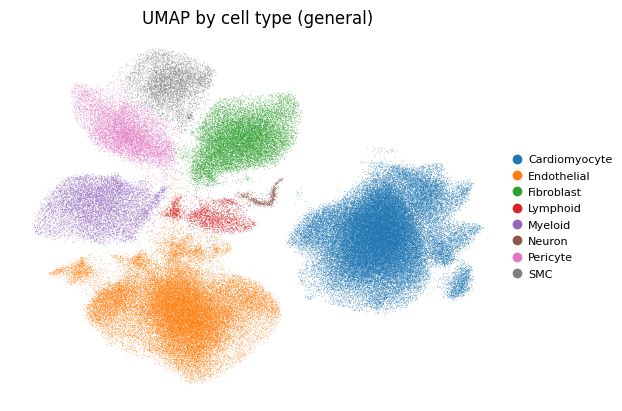

In [27]:
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'DejaVu Sans'

# Plot UMAP
sc.pl.umap(
    adata_filtered,
    color="cell_type_general",
    legend_loc="right margin",
    legend_fontsize=8,
    frameon=False,
    title="UMAP by cell type (general)",
    show=True
)

# Save as PDF with proper text
plt.savefig("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025Sept_UMAP_cell_type_general.pdf", bbox_inches="tight")
plt.close()


In [28]:
output_dir = '/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/'

# List of genes you want to plot
genes_to_plot = ["VWF", "FHL2", "PTPRC", "PDGFRB", "MYH11", "NRXN1", "PDGFRA"]  # replace with your genes

# Loop over genes and export each UMAP
for gene in genes_to_plot:
    sc.pl.umap(
        adata_filtered,
        color=gene,
        cmap="viridis",        # or "Reds", "plasma", etc.
        frameon=False,
        title=f"UMAP expression of {gene}",
        show=False
    )
    plt.savefig(
        os.path.join(output_dir, f"celltype_general_{gene}.pdf"),
    )
    plt.close()


2025-12-10 19:05:11 | [INFO] maxp pruned
2025-12-10 19:05:11 | [INFO] cmap pruned
2025-12-10 19:05:11 | [INFO] kern dropped
2025-12-10 19:05:11 | [INFO] post pruned
2025-12-10 19:05:11 | [INFO] FFTM dropped
2025-12-10 19:05:11 | [INFO] GPOS pruned
2025-12-10 19:05:11 | [INFO] GSUB pruned
2025-12-10 19:05:11 | [INFO] name pruned
2025-12-10 19:05:11 | [INFO] glyf pruned
2025-12-10 19:05:11 | [INFO] Added gid0 to subset
2025-12-10 19:05:11 | [INFO] Added first four glyphs to subset
2025-12-10 19:05:11 | [INFO] Closing glyph list over 'GSUB': 27 glyphs before
2025-12-10 19:05:11 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'F', 'M', 'P', 'U', 'V', 'W', 'e', 'f', 'five', 'four', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 'three', 'two', 'x', 'zero']
2025-12-10 19:05:11 | [INFO] Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 36, 41, 48, 51, 56, 57, 58, 72, 73, 76, 81, 82, 83, 85, 86, 91]
2025-12-10 19:05:11 | [INFO] Closed glyph list over 'GSUB': 30 gl

# Check host and graft status carefully

In [ ]:
# Path to the saved file
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID.h5ad"
adata_filtered = sc.read_h5ad(output_path)

In [29]:
# Count number of cells for each GraftHost type within each cell_type_general
counts_df = adata_filtered.obs.groupby('cell_type_general')['GraftHost'].value_counts().unstack(fill_value=0)

counts_df

GraftHost,Graft,Host
cell_type_general,,
Cardiomyocyte,62656,101
Endothelial,33961,7428
Fibroblast,14279,866
Lymphoid,668,2156
Myeloid,2287,6427
Neuron,731,103
Pericyte,8461,175
SMC,5435,176


## Check overlap between merged souporcell ID and batch

In [28]:
# Carefully look at Host cells.  Check that souporcell call as singlet is not based only on Merge (since ambient RNA could creat problems)
# By comparing to the batch souporcell, the ambient RNA should be removed

In [30]:
# Filter for host cells
host_cells = adata_filtered.obs[adata_filtered.obs['GraftHost'] == 'Host'].copy()

results = []

# Loop over each cell type
for cell_type in host_cells['cell_type_general'].unique():
    sub = host_cells[host_cells['cell_type_general'] == cell_type]
    
    # Loop over each BatchSouporcell
    for batch in sub['BatchSouporcell'].unique():
        batch_sub = sub[sub['BatchSouporcell'] == batch]
        
        top_proportion = 0
        top_merge_id = None
        total_cells_in_top = 0
        
        # Group by souporcell_assignmentMerge
        for merge_id, grp in batch_sub.groupby('souporcell_assignmentMerge'):
            most_common_batch_count = grp['souporcell_assignmentBatch'].value_counts().max()
            total_cells = grp.shape[0]
            proportion = most_common_batch_count / total_cells if total_cells > 0 else 0
            
            # Keep only the top contributor
            if proportion > top_proportion:
                top_proportion = proportion
                top_merge_id = merge_id
                total_cells_in_top = total_cells
        
        results.append({
            'cell_type_general': cell_type,
            'BatchSouporcell': batch,
            'top_souporcell_assignmentMerge': top_merge_id,
            'proportion_tracking': top_proportion,
            'total_cells_in_merge': total_cells_in_top
        })

# Convert to DataFrame
top_tracking_df = pd.DataFrame(results)

top_tracking_df



,cell_type_general,BatchSouporcell,top_souporcell_assignmentMerge,proportion_tracking,total_cells_in_merge
0,Myeloid,May2025_IVSDuke1_16,16,0.954023,261
1,Myeloid,May2025_IVSDuke1_19,19,0.345455,165
2,Myeloid,May2025_IVSDuke2_2,2,0.939655,812
3,Myeloid,May2025_IVSDuke2_0,0,0.312500,32
4,Myeloid,May2025_IVSDuke2_13,13,0.694118,85
...,...,...,...,...,...
106,Neuron,May2025_RVDuke1_20,20,0.500000,4
107,Neuron,May2025_RVDuke2_0,0,1.000000,1
108,Neuron,May2025_RVLVUCLA_3,3,0.966292,89
109,Neuron,April2025_Sample2_1,1,1.000000,6


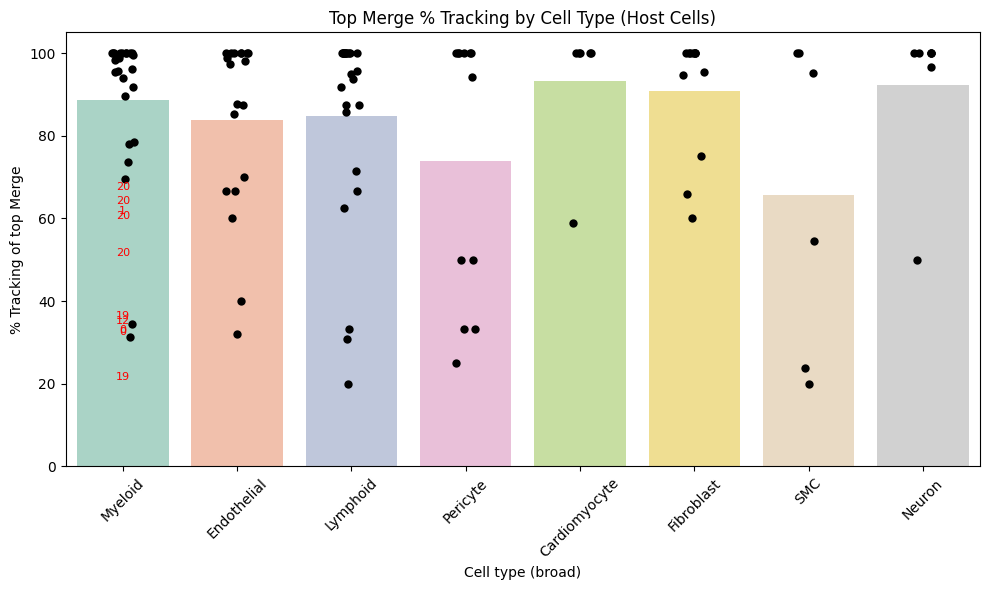

In [31]:
# Make a copy of the DataFrame
df = top_tracking_df.copy()

# Convert proportion to percentage
df['proportion_tracking_percent'] = df['proportion_tracking'] * 100

# Set figure size
plt.figure(figsize=(10,6))

# Create barplot showing mean % tracking per cell type
sns.barplot(
    x='cell_type_general',
    y='proportion_tracking_percent',
    data=df,
    ci=None,          # disable confidence interval
    palette="Set2",
    alpha=0.6
)

# Overlay individual datapoints (stripplot)
sns.stripplot(
    x='cell_type_general',
    y='proportion_tracking_percent',
    data=df,
    color='black',
    size=6,
    jitter=True
)

# Label datapoints considered "outliers" (>1.5*IQR from Q1/Q3)
for cell_type in df['cell_type_general'].unique():
    subset = df[df['cell_type_general'] == cell_type]
    Q1 = subset['proportion_tracking_percent'].quantile(0.25)
    Q3 = subset['proportion_tracking_percent'].quantile(0.75)
    IQR = Q3 - Q1
    upper_fence = Q3 + 1.5*IQR
    lower_fence = Q1 - 1.5*IQR
    
    for idx, row in subset.iterrows():
        if row['proportion_tracking_percent'] > upper_fence or row['proportion_tracking_percent'] < lower_fence:
            plt.text(
                x=subset['cell_type_general'].tolist().index(cell_type),
                y=row['proportion_tracking_percent'] + 1,  # small offset
                s=f"{row['top_souporcell_assignmentMerge']}",
                color='red',
                ha='center',
                fontsize=8
            )

plt.ylabel("% Tracking of top Merge")
plt.xlabel("Cell type (broad)")
plt.title("Top Merge % Tracking by Cell Type (Host Cells)")
plt.xticks(rotation=45)
plt.ylim(0, 105)
plt.tight_layout()
plt.show()


In [32]:
# Start with a copy
adata_filtered.obs['GraftHostRefine'] = adata_filtered.obs['GraftHost'].copy()

# If categorical, add new category
if pd.api.types.is_categorical_dtype(adata_filtered.obs['GraftHostRefine']):
    adata_filtered.obs['GraftHostRefine'] = adata_filtered.obs['GraftHostRefine'].cat.add_categories(['HostQuestionable'])

# Create a lookup dictionary: (cell_type_general, BatchSouporcell) -> top_souporcell_assignmentMerge
top_merge_map = top_tracking_df.set_index(['cell_type_general', 'BatchSouporcell'])['top_souporcell_assignmentMerge'].to_dict()

# Also create top proportion dict
top_prop_map = top_tracking_df.set_index(['cell_type_general', 'BatchSouporcell'])['proportion_tracking'].to_dict()

# Now update per cell
mask = []
for idx, row in adata_filtered.obs.iterrows():
    if row['GraftHost'] != 'Host':
        mask.append(False)
        continue
    key = (row['cell_type_general'], row['BatchSouporcell'])
    top_merge = top_merge_map.get(key, None)
    top_prop = top_prop_map.get(key, 0)
    
    # If this cell is host AND top proportion < 0.99, mark as questionable
    mask.append(top_prop < 0.9)

adata_filtered.obs.loc[mask, 'GraftHostRefine'] = 'HostQuestionable'

# Check counts
adata_filtered.obs['GraftHostRefine'].value_counts()


GraftHostRefine
Graft               128478
Host                 14144
HostQuestionable      3288
Name: count, dtype: int64

In [33]:
# Count number of cells for each GraftHost type within each cell_type_general
counts_df = adata_filtered.obs.groupby('cell_type_general')['GraftHostRefine'].value_counts().unstack(fill_value=0)

counts_df

GraftHostRefine,Graft,Host,HostQuestionable
cell_type_general,,,
Cardiomyocyte,62656,84,17
Endothelial,33961,5278,2150
Fibroblast,14279,749,117
Lymphoid,668,1950,206
Myeloid,2287,5713,714
Neuron,731,99,4
Pericyte,8461,143,32
SMC,5435,128,48


## Check unique combinations of merge and batch

In [33]:
# Here, we will remove unique cells, and cells where the batch is ambiguous

In [34]:


# Define cell types of interest
cell_types_of_interest = ["Endothelial", "Cardiomyocyte"]

# Filter obs for cell types and Host
obs_sub = adata_filtered.obs[
    (adata_filtered.obs['cell_type_general'].isin(cell_types_of_interest)) &
    (adata_filtered.obs['GraftHostRefine'] == 'Host')
].copy()

# Count cells per unique combination
counts_df = (
    obs_sub.groupby([
        'BatchSouporcell', 
        'StrippedDonor', 
        'cell_type_general', 
        'souporcell_assignmentMerge', 
        'souporcell_assignmentBatch'
    ])
    .size()
    .reset_index(name='cell_count')
)

# Optionally filter for total cells > 5
counts_df_filtered = counts_df[counts_df['cell_count'] > 5]



In [35]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(counts_df_filtered)

,BatchSouporcell,StrippedDonor,cell_type_general,souporcell_assignmentMerge,souporcell_assignmentBatch,cell_count
12993393,May2025_IVSDuke1_16,CAV3,Endothelial,16,3,13
30373252,May2025_RVDuke2_0,CAV9,Endothelial,0,5,1942
35126793,May2025_RVDuke2_13,CAV6,Endothelial,13,3,98
40022793,May2025_RVLVUCLA_3,CAV10,Cardiomyocyte,3,3,79
40025401,May2025_RVLVUCLA_3,CAV10,Endothelial,3,0/1,6
40025412,May2025_RVLVUCLA_3,CAV10,Endothelial,3,1,12
40025413,May2025_RVLVUCLA_3,CAV10,Endothelial,3,1/0,9
40025433,May2025_RVLVUCLA_3,CAV10,Endothelial,3,3,3100
40025434,May2025_RVLVUCLA_3,CAV10,Endothelial,3,3/0,12
40025435,May2025_RVLVUCLA_3,CAV10,Endothelial,3,3/1,21


In [36]:
# Keep existing GraftHostRefine, only update Host → HostQuestionable if meeting criteria
if pd.api.types.is_categorical_dtype(adata_filtered.obs['GraftHostRefine']):
    # Add new category only if it doesn't exist
    if 'HostQuestionable' not in adata_filtered.obs['GraftHostRefine'].cat.categories:
        adata_filtered.obs['GraftHostRefine'] = adata_filtered.obs['GraftHostRefine'].cat.add_categories(['HostQuestionable'])

# Select only cells currently labeled as Host (not existing Questionable)
host_obs = adata_filtered.obs[adata_filtered.obs['GraftHostRefine'] == 'Host'].copy()

# Concatenate key
host_obs['concat_key'] = (
    host_obs['BatchSouporcell'].astype(str) + "_" +
    host_obs['StrippedDonor'].astype(str) + "_" +
    host_obs['cell_type_general'].astype(str) + "_" +
    host_obs['souporcell_assignmentMerge'].astype(str) + "_" +
    host_obs['souporcell_assignmentBatch'].astype(str)
)

# Count per concat_key
counts = host_obs.groupby('concat_key').size()
host_obs['cell_count'] = host_obs['concat_key'].map(counts)

# Identify cells to update
mixed_mask = host_obs['souporcell_assignmentBatch'].astype(str).str.contains("/")
small_mask = host_obs['cell_count'] < 5
update_mask = mixed_mask | small_mask

# Update GraftHostRefine only for these cells
adata_filtered.obs.loc[host_obs.index[update_mask], 'GraftHostRefine'] = 'HostQuestionable'

# Check counts
adata_filtered.obs['GraftHostRefine'].value_counts()


GraftHostRefine
Graft               128478
Host                 13790
HostQuestionable      3642
Name: count, dtype: int64

In [37]:
# Plot UMAP colored by GraftHost
sc.pl.umap(
    adata_filtered,
    color="GraftHostRefine",
    legend_loc="right margin",
    legend_fontsize=8,
    frameon=False,
    title="UMAP by GraftHost",
    show=False  # prevent Scanpy from clearing the figure
)

# Save the currently active plot
plt.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025Sept_UMAP_all_cell_grafthost.pdf",
    bbox_inches="tight"
)
plt.close()

2025-12-10 19:07:44 | [INFO] maxp pruned
2025-12-10 19:07:44 | [INFO] cmap pruned
2025-12-10 19:07:44 | [INFO] kern dropped
2025-12-10 19:07:44 | [INFO] post pruned
2025-12-10 19:07:44 | [INFO] FFTM dropped
2025-12-10 19:07:44 | [INFO] GPOS pruned
2025-12-10 19:07:44 | [INFO] GSUB pruned
2025-12-10 19:07:44 | [INFO] name pruned
2025-12-10 19:07:44 | [INFO] glyf pruned
2025-12-10 19:07:44 | [INFO] Added gid0 to subset
2025-12-10 19:07:44 | [INFO] Added first four glyphs to subset
2025-12-10 19:07:44 | [INFO] Closing glyph list over 'GSUB': 25 glyphs before
2025-12-10 19:07:44 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'G', 'H', 'M', 'N', 'P', 'Q', 'U', 'a', 'b', 'e', 'f', 'i', 'l', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 't', 'u', 'y']
2025-12-10 19:07:44 | [INFO] Glyph IDs:   [0, 1, 2, 3, 36, 42, 43, 48, 49, 51, 52, 56, 68, 69, 72, 73, 76, 79, 81, 82, 85, 86, 87, 88, 92]
2025-12-10 19:07:44 | [INFO] Closed glyph list over 'GSUB': 30 glyphs after
2025-12-10 19:07:44 | [INF

2025-12-10 19:07:46 | [INFO] maxp pruned
2025-12-10 19:07:46 | [INFO] cmap pruned
2025-12-10 19:07:46 | [INFO] kern dropped
2025-12-10 19:07:46 | [INFO] post pruned
2025-12-10 19:07:46 | [INFO] FFTM dropped
2025-12-10 19:07:46 | [INFO] GPOS pruned
2025-12-10 19:07:46 | [INFO] GSUB pruned
2025-12-10 19:07:46 | [INFO] name pruned
2025-12-10 19:07:46 | [INFO] glyf pruned
2025-12-10 19:07:46 | [INFO] Added gid0 to subset
2025-12-10 19:07:46 | [INFO] Added first four glyphs to subset
2025-12-10 19:07:46 | [INFO] Closing glyph list over 'GSUB': 45 glyphs before
2025-12-10 19:07:46 | [INFO] Glyph names: ['.notdef', '.null', 'C', 'E', 'F', 'G', 'H', 'L', 'M', 'N', 'P', 'Q', 'S', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'percent', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
2025-12-10 19:07:46 | [INFO] Glyph IDs:   [0, 1, 2, 3, 8, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28

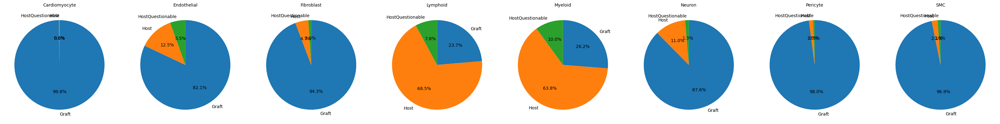

In [38]:
# Count cells per cell_type_general × GraftHostRefine
counts = (
    adata_filtered.obs.groupby(["cell_type_general", "GraftHostRefine"])
    .size()
    .reset_index(name="count")
)

# Make one pie per cell type
cell_types = counts["cell_type_general"].unique()

fig, axes = plt.subplots(
    1, len(cell_types), figsize=(4 * len(cell_types), 4), squeeze=False
)

for ax, ct in zip(axes[0], cell_types):
    df = counts[counts["cell_type_general"] == ct]
    ax.pie(
        df["count"],
        labels=df["GraftHostRefine"],
        autopct="%1.1f%%",
        startangle=90,
        counterclock=False
    )
    ax.set_title(ct, fontsize=10)

plt.tight_layout()
plt.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025Sept_PieCharts_celltype_grafthost.pdf",
    bbox_inches="tight"
)
plt.show()


In [39]:
# Count number of cells for each GraftHost type within each cell_type_general
counts_df = adata_filtered.obs.groupby('cell_type_general')['GraftHostRefine'].value_counts().unstack(fill_value=0)

counts_df

GraftHostRefine,Graft,Host,HostQuestionable
cell_type_general,,,
Cardiomyocyte,62656,79,22
Endothelial,33961,5171,2257
Fibroblast,14279,710,156
Lymphoid,668,1935,221
Myeloid,2287,5557,870
Neuron,731,92,11
Pericyte,8461,128,47
SMC,5435,118,58


In [40]:
# Filter for endothelial cells
endo_obs = adata_filtered.obs[adata_filtered.obs['cell_type_general'] == 'Endothelial']

# Group by Donor and Location, then count Host vs Graft
summary = (
    endo_obs
    .groupby(['StrippedDonor', 'Location', 'GraftHostRefine'])
    .size()
    .unstack(fill_value=0)  # columns: Host, Graft, etc.
)

# Compute Host:Graft ratio (assuming columns contain 'Host' and 'Graft')
if 'Host' in summary.columns and 'Graft' in summary.columns:
    summary['Host_to_Graft_Ratio'] = summary['Host'] / summary['Graft']
else:
    # fallback if column names differ
    summary['Host_to_Graft_Ratio'] = summary.iloc[:, 0] / summary.iloc[:, 1]

# Sort by ratio descending
summary_sorted = summary.sort_values('Graft', ascending=False)

summary_sorted


,GraftHostRefine,Graft,Host,HostQuestionable,Host_to_Graft_Ratio
StrippedDonor,Location,,,,
Nontransplant1,Septum,4547,0,0,0.000000
Nontransplant2,Septum,3588,0,0,0.000000
CAV3,LeftVentricle,3192,0,4,0.000000
CAV7,LeftVentricle,2427,0,0,0.000000
CAV6,LeftVentricle,1959,98,2,0.050026
CAV5,LeftVentricle,1917,0,0,0.000000
SevereRejection2,Septum,1882,0,0,0.000000
CAV3,Septum,1567,13,0,0.008296
BiopsyPatient1,Septum,1345,0,0,0.000000


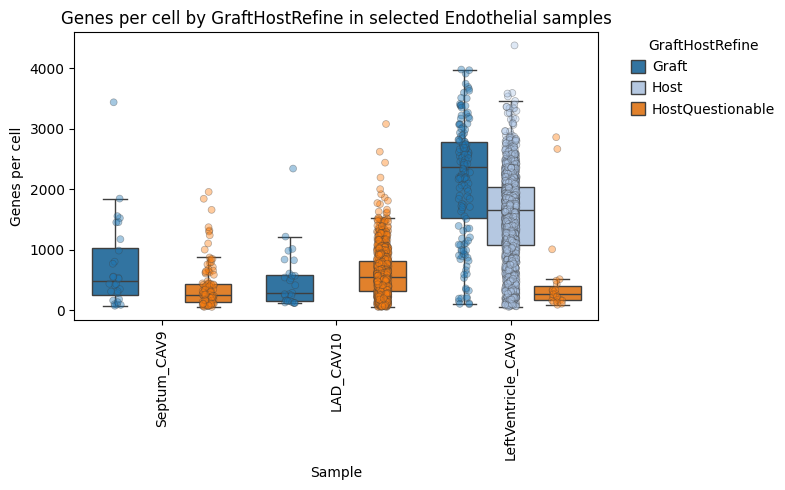

In [41]:

# Define samples of interest (Location, Donor, CellType)
samples = [
    ("RightVentricle", "CAV10", "Endothelial"),
    ("LAD", "CAV10", "Endothelial"),
    ("LeftVentricle", "CAV9", "Endothelial"),
    ("Septum", "CAV9", "Endothelial")
]

# Subset adata.obs for those samples
df = adata_filtered.obs.copy()
df = df[df.apply(lambda r: (r["Location"], r["StrippedDonor"], r["cell_type_general"]) in samples, axis=1)]

# Add sample label column
df["Sample"] = df["Location"].astype(str) + "_" + df["StrippedDonor"].astype(str)

# Set consistent color palette for GraftHostRefine
categories = adata_filtered.obs["GraftHostRefine"].unique()
palette = sns.color_palette("tab20", len(categories))
color_dict = dict(zip(categories, palette))

# -----------------------------
# Plot genes per cell (n_genes_by_counts)
plt.figure(figsize=(8,5))

# Boxplot
sns.boxplot(
    data=df,
    x="Sample",
    y="n_genes_by_counts",
    hue="GraftHostRefine",
    palette=color_dict,
    showfliers=False
)

# Overlay stripplot
sns.stripplot(
    data=df,
    x="Sample",
    y="n_genes_by_counts",
    hue="GraftHostRefine",
    palette=color_dict,
    dodge=True,
    alpha=0.4,
    linewidth=0.5,
    legend=False  # suppress duplicate legend
)

plt.ylabel("Genes per cell")
plt.title("Genes per cell by GraftHostRefine in selected Endothelial samples")

# Rotate x-axis labels vertically
plt.xticks(rotation=90)

# Legend on the side
plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    title="GraftHostRefine"
)

plt.tight_layout()
plt.show()


In [42]:
# Count number of cells for each GraftHost type within each cell_type_general
counts_df = adata_filtered.obs.groupby('cell_type_general')['GraftHostRefine'].value_counts().unstack(fill_value=0)

counts_df

GraftHostRefine,Graft,Host,HostQuestionable
cell_type_general,,,
Cardiomyocyte,62656,79,22
Endothelial,33961,5171,2257
Fibroblast,14279,710,156
Lymphoid,668,1935,221
Myeloid,2287,5557,870
Neuron,731,92,11
Pericyte,8461,128,47
SMC,5435,118,58


In [43]:
# Print all column names
print(adata_filtered.obs.columns.tolist())


['souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_counts_IRF1_2', 'total_counts_SAMD4A-1', 'total_counts_Histone_

In [44]:
# This is with the addition of cellranger protein ids and clin vars
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH.h5ad"
adata_filtered.write(output_path)

In [45]:
adata_filtered.obs["StrippedDonor"].value_counts()


StrippedDonor
CAV10               19748
CAV3                15412
Nontransplant1      13967
SevereRejection1    11123
CAV5                10266
CAV7                 9105
Nontransplant2       9069
CAV4                 8352
SevereRejection2     8244
BiopsyPatient5       6833
CAV6                 6137
BiopsyPatient1       6075
CAV9                 5666
CAV8                 4641
CAV1                 4289
BiopsyPatient4       2823
BiopsyPatient3       2133
BiopsyPatient2       1269
CAV2                  758
Name: count, dtype: int64

In [46]:
# Define groups to save
cell_groups = {
    "endothelial": ["Endothelial"],
    "fibroblast": ["Fibroblast"],  # Adjust if you have a separate fibroblast label
    "cardiomyocyte": ["Cardiomyocyte"],
    "immune": ["Myeloid", "Lymphoid"],
    "mural": ["Pericyte", "SMC"]
}

# Base output path
base_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/"

# Loop over each group
for group_name, cell_types in cell_groups.items():
    print(f"Processing {group_name} ...")
    
    # Subset
    adata_sub = adata_filtered[adata_filtered.obs['cell_type_general'].isin(cell_types)].copy()
    
    # Create output filename
    out_file = os.path.join(
        base_path,
        f"2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_{group_name}.h5ad"
    )
    
    # Write to file
    adata_sub.write(out_file)
    print(f"Saved {adata_sub.n_obs} cells to {out_file}")
    
    # Delete temporary variable to free memory
    del adata_sub


Processing endothelial ...
Saved 41430 cells to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_endothelial.h5ad
Processing fibroblast ...
Saved 15166 cells to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_fibroblast.h5ad
Processing cardiomyocyte ...
Saved 62758 cells to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_cardiomyocyte.h5ad
Processing immune ...
Saved 12042 cells to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_immune.h5ad
Processing mural ...
Saved 14267 cells to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_m

# Pseudobulk and figures for all data joined

In [ ]:
# This is with the addition of cellranger protein ids
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH.h5ad"
adata_filtered = sc.read_h5ad(output_path)

In [47]:
adata_filtered

AnnData object with n_obs × n_vars = 146502 × 31844
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_cou

In [48]:
# Count how many cells per category in the 'doublet' column
doublet_counts = adata_filtered.obs['doublet'].value_counts(dropna=False)

print("Counts of each category in 'doublet':")
print(doublet_counts)

Counts of each category in 'doublet':
doublet
False    146502
Name: count, dtype: int64


In [49]:
# Count how many cells per category in the 'doublet' column
doublet_counts = adata_filtered.obs['SampleType'].value_counts(dropna=False)

print("Counts of each category in 'SampleType':")
print(doublet_counts)

Counts of each category in 'SampleType':
SampleType
HeartTissue    126777
Biopsy          19133
NaN               592
Name: count, dtype: int64


In [50]:
# Count how many cells per category in the 'doublet' column
doublet_counts = adata_filtered.obs['DiseaseStatus'].value_counts(dropna=False)

print("Counts of each category in 'DiseaseStatus':")
print(doublet_counts)

Counts of each category in 'DiseaseStatus':
DiseaseStatus
CAV              84374
Nontransplant    23036
LateRejection    19367
Rejection         9656
Stable            9477
NaN                592
Name: count, dtype: int64


## Figures for all data

In [51]:
# Create DF for plotting

# ----------------------------
# Settings
# ----------------------------
cell_type_field = 'cell_type_general'
group_fields = ['StrippedDonor', 'Day', 'Location']
disease_order = ['Stable', 'Rejection', 'Nontransplant', 'LateRejection', 'CAV']

# ----------------------------
# Prepare counts and ratios
# ----------------------------
# Count cells per combination
counts_df = (
    adata_filtered.obs
    .groupby(group_fields + [cell_type_field])
    .size()
    .reset_index(name='Count')
)

# Compute total per Donor+Day+Location and convert to ratios
counts_df['Ratio'] = counts_df['Count'] / counts_df.groupby(group_fields)['Count'].transform('sum')

# Merge metadata for sorting
donor_meta = (
    adata_filtered.obs[group_fields + ['DiseaseStatus', 'EF_preop']]
    .drop_duplicates()
)
counts_df = counts_df.merge(donor_meta, on=group_fields, how='left')

# Create combined label for x-axis
donor_meta['GroupLabel'] = donor_meta[group_fields].astype(str).agg('_'.join, axis=1)
counts_df['GroupLabel'] = counts_df[group_fields].astype(str).agg('_'.join, axis=1)

In [52]:
# From donor_meta (recommended because it's unique rows)
group_labels = donor_meta['GroupLabel'].unique().tolist()

# Sort for readability
group_labels = sorted(group_labels)

for g in group_labels:
    print(g)



BiopsyPatient1_41.0_Septum
BiopsyPatient1_59.0_Septum
BiopsyPatient1_90.0_Septum
BiopsyPatient2_13.0_Septum
BiopsyPatient2_7.0_Septum
BiopsyPatient3_423.0_Septum
BiopsyPatient3_461.0_Septum
BiopsyPatient3_566.0_Septum
BiopsyPatient3_62.0_Septum
BiopsyPatient3_73.0_Septum
BiopsyPatient4_1717.0_Septum
BiopsyPatient4_219.0_Septum
BiopsyPatient4_247.0_Septum
BiopsyPatient4_282.0_Septum
BiopsyPatient5_58.0_Septum
BiopsyPatient5_8.0_Septum
BiopsyPatient5_90.0_Septum
BiopsyPatient5_905.0_Septum
BiopsyPatient5_951.0_Septum
CAV10_0.0_Septum
CAV10_11700.0_LAD
CAV1_2688.0_LeftVentricle
CAV2_2540.0_LeftVentricle
CAV3_2204.0_LeftVentricle
CAV3_2204.0_Septum
CAV4_5708.0_LeftVentricle
CAV4_5708.0_Septum
CAV5_2701.0_LeftVentricle
CAV5_2701.0_Septum
CAV6_6796.0_LeftVentricle
CAV6_6796.0_Septum
CAV7_1789.0_LeftVentricle
CAV7_1789.0_Septum
CAV8_7375.0_LeftVentricle
CAV8_7375.0_Septum
CAV9_4619.0_LeftVentricle
CAV9_4619.0_Septum
Nontransplant1_0.0_LAD
Nontransplant1_0.0_Septum
Nontransplant2_0.0_LAD
Nontr

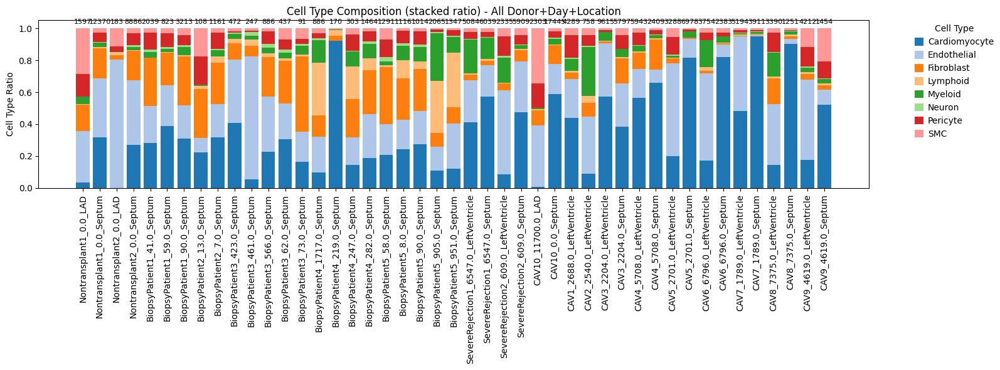

In [54]:
# Your desired order of bars
donor_order = [
    'Nontransplant1_0.0_LAD',
    'Nontransplant1_0.0_Septum',
    'Nontransplant2_0.0_LAD',
    'Nontransplant2_0.0_Septum',
    'BiopsyPatient1_41.0_Septum',
    'BiopsyPatient1_59.0_Septum',
    'BiopsyPatient1_90.0_Septum',
    'BiopsyPatient2_13.0_Septum',
    'BiopsyPatient2_7.0_Septum',
    'BiopsyPatient3_423.0_Septum',
    'BiopsyPatient3_461.0_Septum',
    'BiopsyPatient3_566.0_Septum',
    'BiopsyPatient3_62.0_Septum',
    'BiopsyPatient3_73.0_Septum',
    'BiopsyPatient4_1717.0_Septum',
    'BiopsyPatient4_219.0_Septum',
    'BiopsyPatient4_247.0_Septum',
    'BiopsyPatient4_282.0_Septum',
    'BiopsyPatient5_58.0_Septum',
    'BiopsyPatient5_8.0_Septum',
    'BiopsyPatient5_90.0_Septum',
    'BiopsyPatient5_905.0_Septum',
    'BiopsyPatient5_951.0_Septum',
    'SevereRejection1_6547.0_LeftVentricle',
    'SevereRejection1_6547.0_Septum',
    'SevereRejection2_609.0_LeftVentricle',
    'SevereRejection2_609.0_Septum',
    'CAV10_11700.0_LAD',
    'CAV10_0.0_Septum',
    'CAV1_2688.0_LeftVentricle',
    'CAV2_2540.0_LeftVentricle',
    'CAV3_2204.0_LeftVentricle',
    'CAV3_2204.0_Septum',
    'CAV4_5708.0_LeftVentricle',
    'CAV4_5708.0_Septum',
    'CAV5_2701.0_LeftVentricle',
    'CAV5_2701.0_Septum',
    'CAV6_6796.0_LeftVentricle',
    'CAV6_6796.0_Septum',
    'CAV7_1789.0_LeftVentricle',
    'CAV7_1789.0_Septum',
    'CAV8_7375.0_LeftVentricle',
    'CAV8_7375.0_Septum',
    'CAV9_4619.0_LeftVentricle',
    'CAV9_4619.0_Septum',
]


# ----------------------------
# Pivot for plotting
# ----------------------------
pivot_df = counts_df.pivot_table(index='GroupLabel', columns=cell_type_field, values='Ratio', fill_value=0)
pivot_df = pivot_df.reindex(donor_order)  # keep specified order

# Total counts per bar
total_counts_per_bar = counts_df.groupby('GroupLabel')['Count'].sum().reindex(donor_order)

# ----------------------------
# Plot stacked ratio barplot
# ----------------------------
plt.figure(figsize=(16,6))
bottom = pd.Series(0, index=pivot_df.index)
colors = sns.color_palette('tab20', n_colors=len(pivot_df.columns))

for col, color in zip(pivot_df.columns, colors):
    plt.bar(pivot_df.index, pivot_df[col], bottom=bottom, label=col, color=color)
    bottom += pivot_df[col]

# Add total counts on top of each bar
for i, total in enumerate(total_counts_per_bar):
    if not pd.isna(total) and total > 0:
        plt.text(i, 1.02, str(int(total)), ha='center', va='bottom', fontsize=8)

plt.xticks(rotation=90)
plt.ylabel('Cell Type Ratio')
plt.title('Cell Type Composition (stacked ratio) - All Donor+Day+Location')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

2025-12-10 19:12:07 | [INFO] maxp pruned
2025-12-10 19:12:07 | [INFO] cmap pruned
2025-12-10 19:12:07 | [INFO] kern dropped
2025-12-10 19:12:07 | [INFO] post pruned
2025-12-10 19:12:07 | [INFO] FFTM dropped
2025-12-10 19:12:07 | [INFO] GPOS pruned
2025-12-10 19:12:07 | [INFO] GSUB pruned
2025-12-10 19:12:07 | [INFO] name pruned
2025-12-10 19:12:07 | [INFO] glyf pruned
2025-12-10 19:12:07 | [INFO] Added gid0 to subset
2025-12-10 19:12:07 | [INFO] Added first four glyphs to subset
2025-12-10 19:12:07 | [INFO] Closing glyph list over 'GSUB': 55 glyphs before
2025-12-10 19:12:07 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'h', 'hyphen', 'i', 'j', 'k', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
2025-12-10 19:12:07 | 

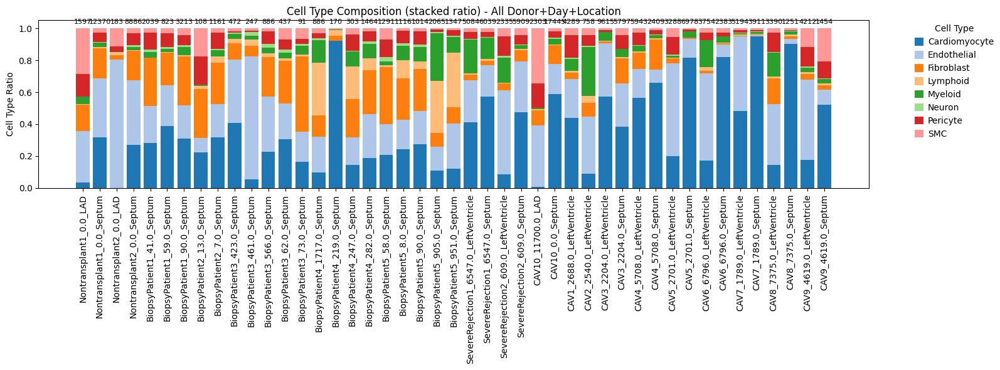

In [55]:
# ----------------------------
# Set font type for Illustrator compatibility
# ----------------------------
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'DejaVu Sans'

output_file = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Dec_CompositionSamples.pdf"

plt.figure(figsize=(16,6))
bottom = pd.Series(0, index=pivot_df.index)
colors = sns.color_palette('tab20', n_colors=len(pivot_df.columns))

for col, color in zip(pivot_df.columns, colors):
    plt.bar(pivot_df.index, pivot_df[col], bottom=bottom, label=col, color=color)
    bottom += pivot_df[col]

# Add total counts on top of each bar
for i, total in enumerate(total_counts_per_bar):
    if not pd.isna(total) and total > 0:
        plt.text(i, 1.02, str(int(total)), ha='center', va='bottom', fontsize=8)

plt.xticks(rotation=90)
plt.ylabel('Cell Type Ratio')
plt.title('Cell Type Composition (stacked ratio) - All Donor+Day+Location')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()

# Save to PDF
plt.savefig(output_file, bbox_inches='tight')

# Optionally still display the plot
plt.show()


2025-12-10 19:16:45 | [INFO] maxp pruned
2025-12-10 19:16:45 | [INFO] cmap pruned
2025-12-10 19:16:45 | [INFO] kern dropped
2025-12-10 19:16:45 | [INFO] post pruned
2025-12-10 19:16:45 | [INFO] FFTM dropped
2025-12-10 19:16:45 | [INFO] GPOS pruned
2025-12-10 19:16:45 | [INFO] GSUB pruned
2025-12-10 19:16:45 | [INFO] name pruned
2025-12-10 19:16:45 | [INFO] glyf pruned
2025-12-10 19:16:45 | [INFO] Added gid0 to subset
2025-12-10 19:16:45 | [INFO] Added first four glyphs to subset
2025-12-10 19:16:45 | [INFO] Closing glyph list over 'GSUB': 29 glyphs before
2025-12-10 19:16:45 | [INFO] Glyph names: ['.notdef', '.null', 'C', 'E', 'F', 'L', 'M', 'N', 'P', 'S', 'a', 'b', 'c', 'd', 'e', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 't', 'u', 'y']
2025-12-10 19:16:45 | [INFO] Glyph IDs:   [0, 1, 2, 3, 38, 40, 41, 47, 48, 49, 51, 54, 68, 69, 70, 71, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-12-10 19:16:45 | [INFO] Closed glyph list over 'GSUB': 29 gly

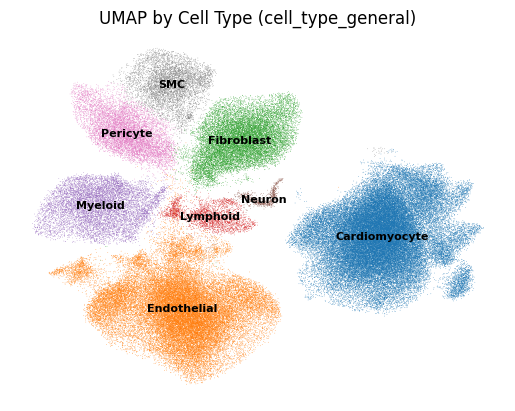

✅ UMAP plot shown and saved as rasterized PDF at:
/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Dec_UmapAlldata_rasterized.pdf


In [57]:
# ----------------------------
# Set font type for Illustrator compatibility
# ----------------------------
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'DejaVu Sans'

# ----------------------------
# Define output path
# ----------------------------
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Dec_UmapAlldata_rasterized.pdf"

# ----------------------------
# Create the UMAP plot
# ----------------------------
fig = sc.pl.umap(
    adata_filtered,
    color='cell_type_general',
    title='UMAP by Cell Type (cell_type_general)',
    legend_loc='on data',
    legend_fontsize=8,
    frameon=False,
    show=False,
    return_fig=True  # Get the matplotlib figure object
)

# ----------------------------
# Rasterize all scatter points (dots) for speed
# ----------------------------
for ax in fig.axes:
    for coll in ax.collections:
        coll.set_rasterized(True)  # rasterize dots, keep text/vector elements

# ----------------------------
# Save the figure
# ----------------------------
fig.savefig(output_path, format='pdf', bbox_inches='tight', dpi=300)
plt.show()

print(f"✅ UMAP plot shown and saved as rasterized PDF at:\n{output_path}")



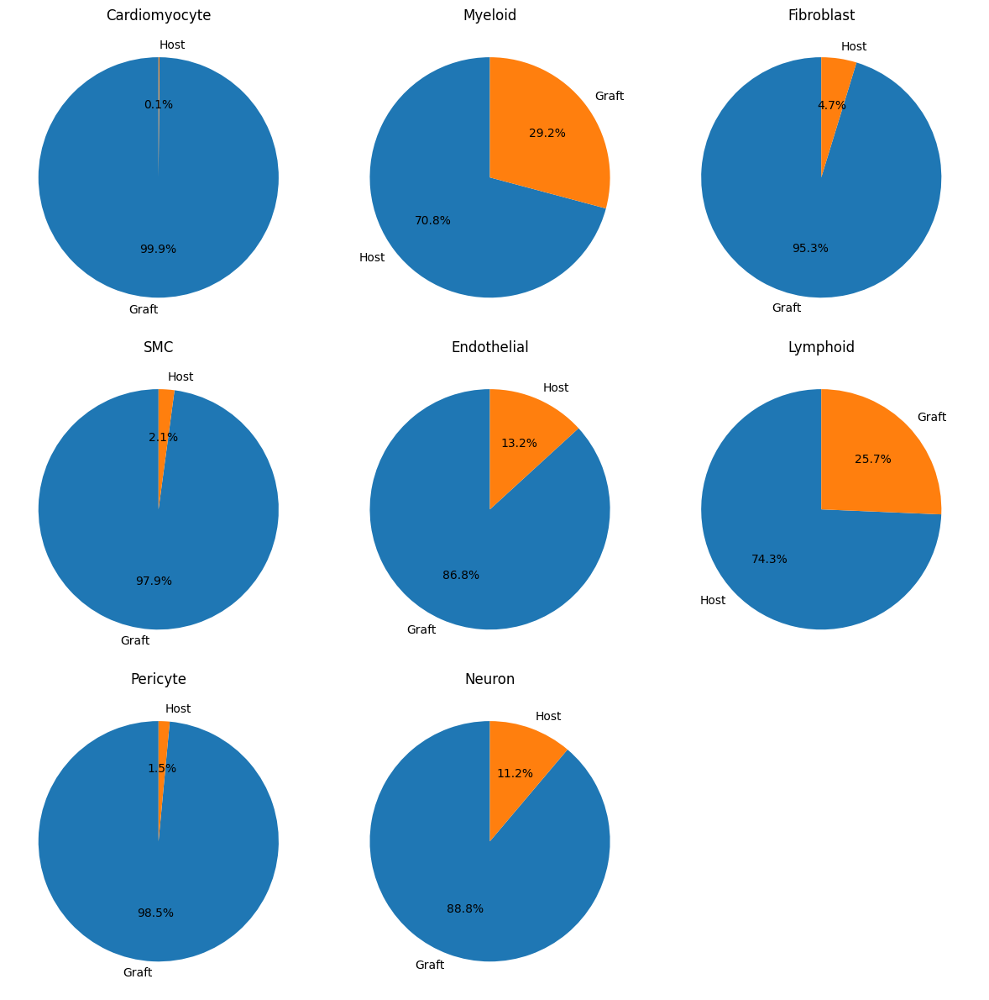

In [61]:
# Ensure 'GraftHostRefined' exists
assert "GraftHostRefine" in adata_filtered.obs.columns, "Column 'GraftHostRefine' not found in adata.obs"
assert "cell_type_general" in adata_filtered.obs.columns, "Column 'cell_type_general' not found in adata.obs"

# Categories to keep
categories_to_show = ["Graft", "Host"]

# Get unique cell types
cell_types = adata_filtered.obs['cell_type_general'].unique()

# Define figure layout
ncols = 3
nrows = (len(cell_types) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = axes.flatten()

for i, cell_type in enumerate(cell_types):
    ax = axes[i]

    # Subset to this cell type
    sub_df = adata_filtered.obs[adata_filtered.obs['cell_type_general'] == cell_type]

    # Count only graft/host categories
    counts = sub_df['GraftHostRefine'].value_counts()
    counts = counts.loc[counts.index.isin(categories_to_show)]

    if counts.sum() == 0:
        ax.text(0.5, 0.5, "No data", ha='center', va='center')
        ax.axis('off')
        continue

    # Plot pie chart
    ax.pie(
        counts,
        labels=counts.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=['#1f77b4', '#ff7f0e']  # optional: blue/orange for graft/host
    )
    ax.set_title(cell_type)

# Turn off unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [63]:
from matplotlib import rcParams

# ----------------------------
# PDF/Illustrator settings
# ----------------------------
rcParams['pdf.fonttype'] = 42  # Use Type 42 (TrueType) fonts for editable text
rcParams['ps.fonttype'] = 42
rcParams['font.family'] = 'DejaVu Sans'

# ----------------------------
# Ensure columns exist
# ----------------------------
assert "GraftHostRefine" in adata_filtered.obs.columns, "Column 'GraftHostRefine' not found in adata.obs"
assert "cell_type_general" in adata_filtered.obs.columns, "Column 'cell_type_general' not found in adata.obs"

# ----------------------------
# Categories to keep
# ----------------------------
categories_to_show = ["Graft", "Host"]

# ----------------------------
# Figure layout
# ----------------------------
cell_types = adata_filtered.obs['cell_type_general'].unique()
ncols = 3
nrows = (len(cell_types) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = axes.flatten()

# ----------------------------
# Plot pie charts
# ----------------------------
for i, cell_type in enumerate(cell_types):
    ax = axes[i]

    sub_df = adata_filtered.obs[adata_filtered.obs['cell_type_general'] == cell_type]
    counts = sub_df['GraftHostRefine'].value_counts()
    counts = counts.loc[counts.index.isin(categories_to_show)]

    if counts.sum() == 0:
        ax.text(0.5, 0.5, "No data", ha='center', va='center')
        ax.axis('off')
        continue

    # Pie chart with grey/black
    color_map = {'Graft': 'grey', 'Host': 'black'}
    colors = [color_map.get(cat, 'lightgrey') for cat in counts.index]

    ax.pie(
        counts,
        labels=counts.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors
    )
    ax.set_title(cell_type)

# Turn off unused axes
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()

# ----------------------------
# Export to PDF for Illustrator
# ----------------------------
output_pdf = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Dec_UmapGraftHostRefined.pdf"
fig.savefig(output_pdf, bbox_inches='tight', format='pdf')
plt.close(fig)

print(f"✅ Pie charts saved to {output_pdf}")

2025-12-10 19:27:18 | [INFO] maxp pruned
2025-12-10 19:27:18 | [INFO] cmap pruned
2025-12-10 19:27:18 | [INFO] kern dropped
2025-12-10 19:27:18 | [INFO] post pruned
2025-12-10 19:27:18 | [INFO] FFTM dropped
2025-12-10 19:27:18 | [INFO] GPOS pruned
2025-12-10 19:27:18 | [INFO] GSUB pruned
2025-12-10 19:27:18 | [INFO] name pruned
2025-12-10 19:27:18 | [INFO] glyf pruned
2025-12-10 19:27:18 | [INFO] Added gid0 to subset
2025-12-10 19:27:18 | [INFO] Added first four glyphs to subset
2025-12-10 19:27:18 | [INFO] Closing glyph list over 'GSUB': 44 glyphs before
2025-12-10 19:27:18 | [INFO] Glyph names: ['.notdef', '.null', 'C', 'E', 'F', 'G', 'H', 'L', 'M', 'N', 'P', 'S', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'percent', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
2025-12-10 19:27:18 | [INFO] Glyph IDs:   [0, 1, 2, 3, 8, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 38,

✅ Pie charts saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Dec_UmapGraftHostRefined.pdf


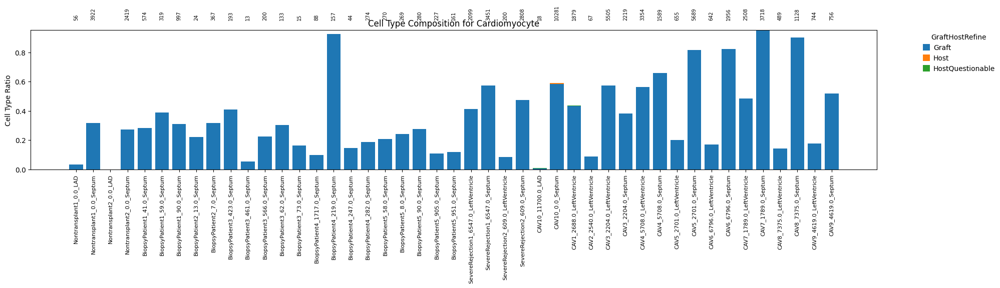

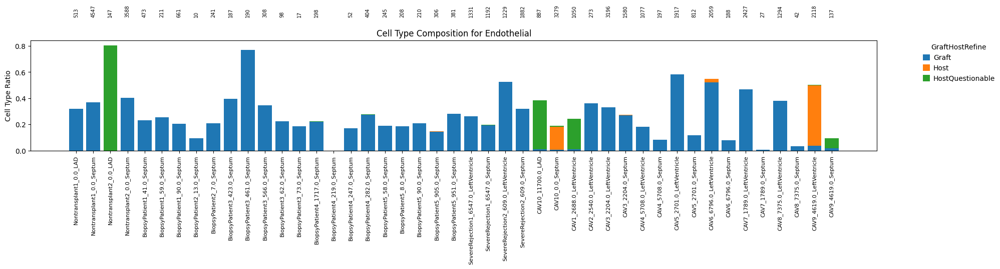

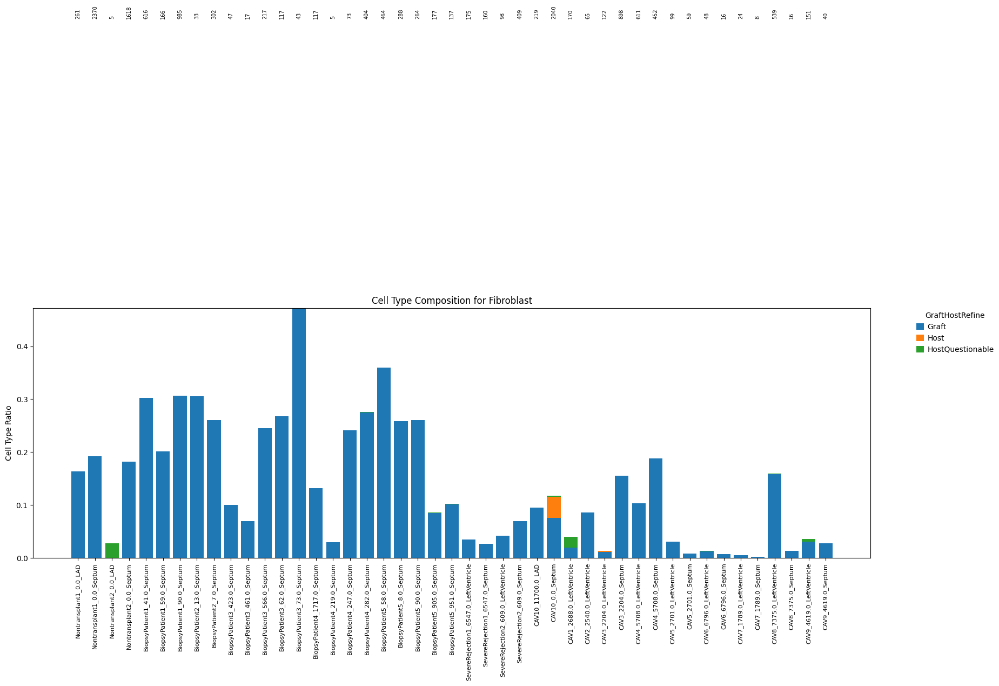

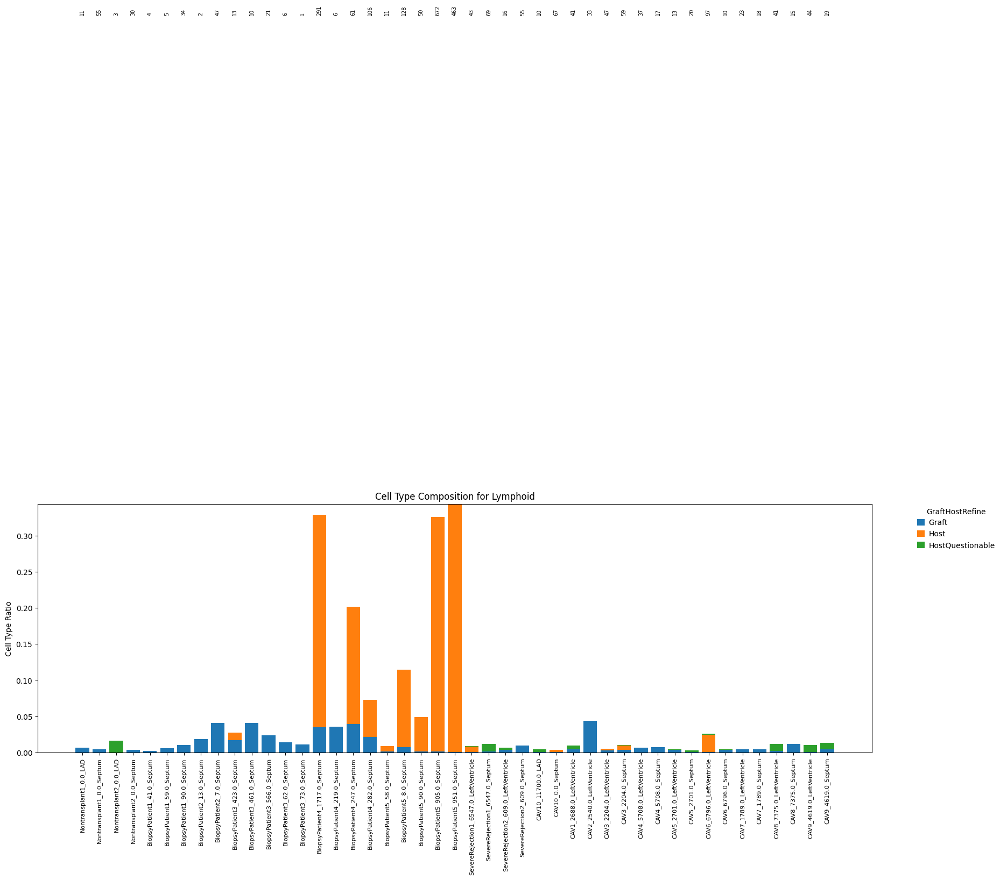

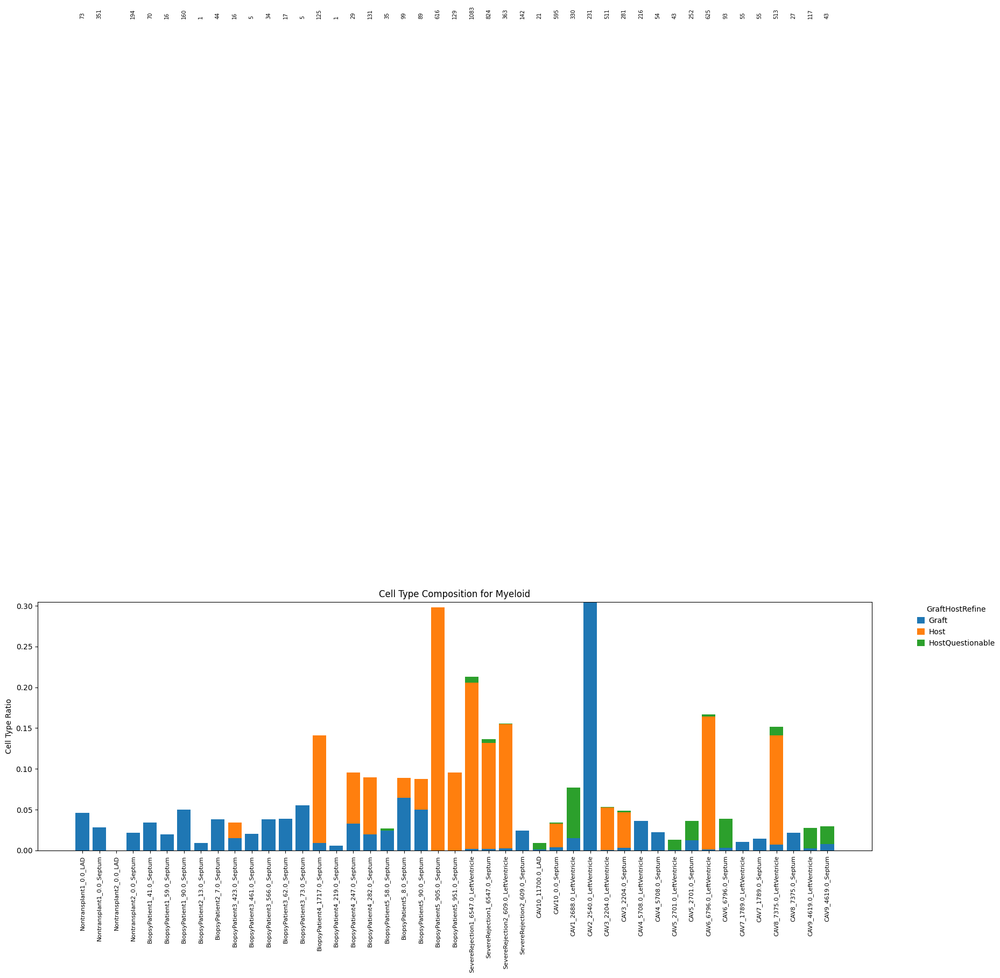

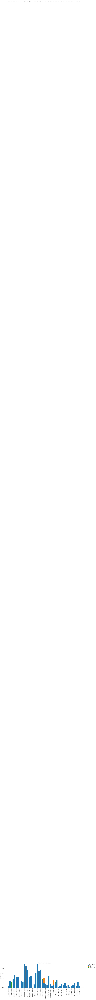

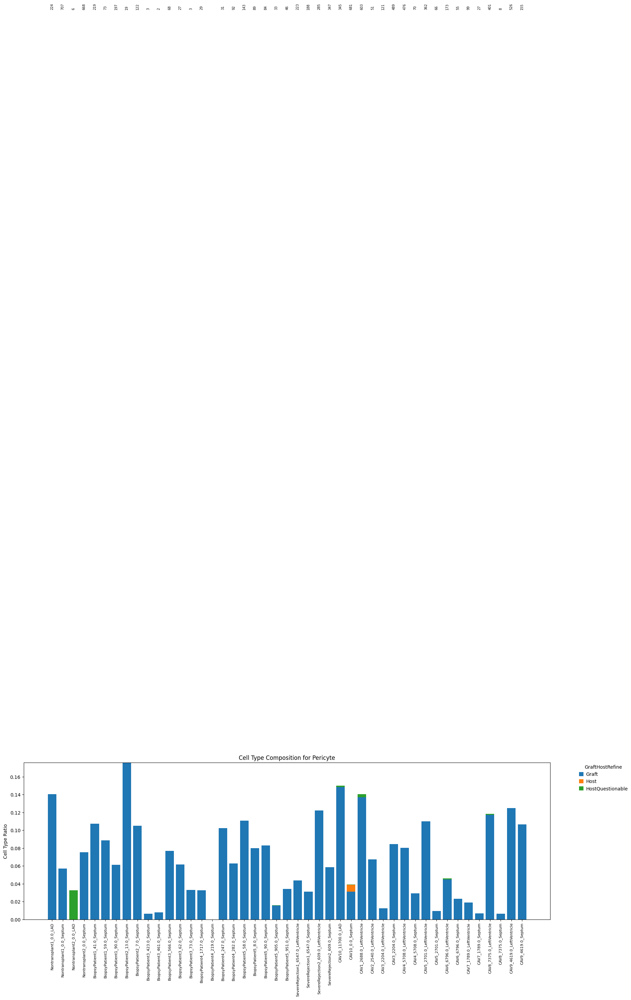

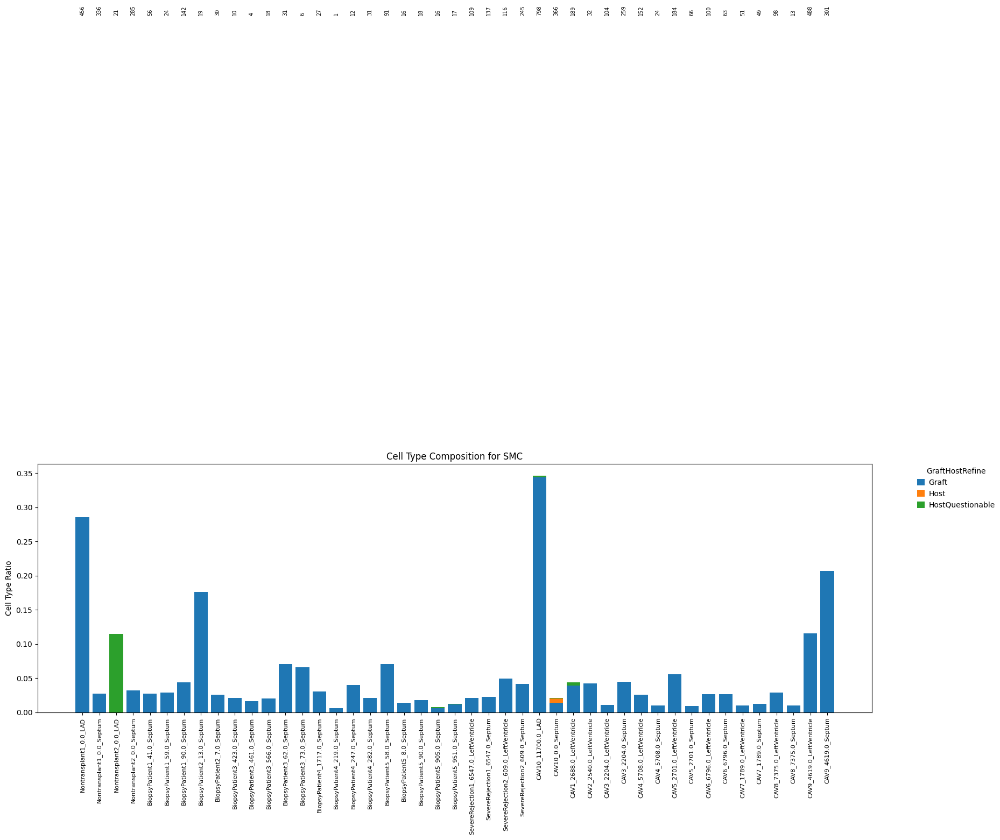

2025-12-10 19:21:24 | [INFO] maxp pruned
2025-12-10 19:21:24 | [INFO] cmap pruned
2025-12-10 19:21:24 | [INFO] kern dropped
2025-12-10 19:21:24 | [INFO] post pruned
2025-12-10 19:21:24 | [INFO] FFTM dropped
2025-12-10 19:21:24 | [INFO] GPOS pruned
2025-12-10 19:21:24 | [INFO] GSUB pruned
2025-12-10 19:21:24 | [INFO] name pruned
2025-12-10 19:21:24 | [INFO] glyf pruned
2025-12-10 19:21:24 | [INFO] Added gid0 to subset
2025-12-10 19:21:24 | [INFO] Added first four glyphs to subset
2025-12-10 19:21:24 | [INFO] Closing glyph list over 'GSUB': 53 glyphs before
2025-12-10 19:21:24 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'h', 'i', 'j', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
2025-12-10 19:21:24 | [INFO] Glyph IDs:   [0, 1, 2, 3, 17

✅ Plots saved and displayed from: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Sept_CompositionSamples_Filtered.pdf


In [58]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import pandas as pd
from pathlib import Path
from matplotlib.backends.backend_pdf import PdfPages

# ----------------------------
# Settings
# ----------------------------
adata = adata_filtered
cell_type_field = 'cell_type_general'
group_fields = ['StrippedDonor', 'Day', 'Location']
out_dir = Path("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025")
out_dir.mkdir(parents=True, exist_ok=True)

# Colors for GraftHostRefine (update if needed)
palette = {
    'Graft': '#1f77b4',
    'Host': '#ff7f0e',
    'HostQuestionable': '#2ca02c'
}

# Illustrator-friendly fonts
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'DejaVu Sans'

# ----------------------------
# Named donor_order
# ----------------------------
donor_order = [
    'Nontransplant1_0.0_LAD',
    'Nontransplant1_0.0_Septum',
    'Nontransplant2_0.0_LAD',
    'Nontransplant2_0.0_Septum',
    'BiopsyPatient1_41.0_Septum',
    'BiopsyPatient1_59.0_Septum',
    'BiopsyPatient1_90.0_Septum',
    'BiopsyPatient2_13.0_Septum',
    'BiopsyPatient2_7.0_Septum',
    'BiopsyPatient3_423.0_Septum',
    'BiopsyPatient3_461.0_Septum',
    'BiopsyPatient3_566.0_Septum',
    'BiopsyPatient3_62.0_Septum',
    'BiopsyPatient3_73.0_Septum',
    'BiopsyPatient4_1717.0_Septum',
    'BiopsyPatient4_219.0_Septum',
    'BiopsyPatient4_247.0_Septum',
    'BiopsyPatient4_282.0_Septum',
    'BiopsyPatient5_58.0_Septum',
    'BiopsyPatient5_8.0_Septum',
    'BiopsyPatient5_90.0_Septum',
    'BiopsyPatient5_905.0_Septum',
    'BiopsyPatient5_951.0_Septum',
    'SevereRejection1_6547.0_LeftVentricle',
    'SevereRejection1_6547.0_Septum',
    'SevereRejection2_609.0_LeftVentricle',
    'SevereRejection2_609.0_Septum',
    'CAV10_11700.0_LAD',
    'CAV10_0.0_Septum',
    'CAV1_2688.0_LeftVentricle',
    'CAV2_2540.0_LeftVentricle',
    'CAV3_2204.0_LeftVentricle',
    'CAV3_2204.0_Septum',
    'CAV4_5708.0_LeftVentricle',
    'CAV4_5708.0_Septum',
    'CAV5_2701.0_LeftVentricle',
    'CAV5_2701.0_Septum',
    'CAV6_6796.0_LeftVentricle',
    'CAV6_6796.0_Septum',
    'CAV7_1789.0_LeftVentricle',
    'CAV7_1789.0_Septum',
    'CAV8_7375.0_LeftVentricle',
    'CAV8_7375.0_Septum',
    'CAV9_4619.0_LeftVentricle',
    'CAV9_4619.0_Septum',
]

# ----------------------------
# Prepare counts and ratios
# ----------------------------
counts_df = (
    adata.obs
    .groupby(group_fields + [cell_type_field, 'GraftHostRefine'])
    .size()
    .reset_index(name='Count')
)

# Total per Donor+Day+Location for ratios
counts_df['Total'] = counts_df.groupby(group_fields)['Count'].transform('sum')
counts_df['Ratio'] = counts_df['Count'] / counts_df['Total']

# Create combined label for x-axis
counts_df['GroupLabel'] = counts_df[group_fields].astype(str).agg('_'.join, axis=1)

# Filter to only donor_order
counts_df = counts_df[counts_df['GroupLabel'].isin(donor_order)]

# ----------------------------
# Plotting
# ----------------------------
output_file = out_dir / "2025_Sept_CompositionSamples_Filtered.pdf"

with PdfPages(output_file) as pdf:
    for ctype, subdf in counts_df.groupby(cell_type_field):
        pivot_df = subdf.pivot_table(
            index='GroupLabel', columns='GraftHostRefine', values='Ratio', fill_value=0
        ).reindex(donor_order)
        pivot_df.index = pivot_df.index.astype(str)
        total_counts_per_bar = subdf.groupby('GroupLabel')['Count'].sum().reindex(pivot_df.index)

        plt.figure(figsize=(20,6))
        bottom = pd.Series(0, index=pivot_df.index)
        colors = [palette.get(c, "#cccccc") for c in pivot_df.columns]

        for col, color in zip(pivot_df.columns, colors):
            plt.bar(pivot_df.index, pivot_df[col], bottom=bottom, label=col, color=color)
            bottom += pivot_df[col]

        # Add total counts above bars
        for i, label in enumerate(pivot_df.index):
            total = total_counts_per_bar[label]
            if total > 0:
                plt.text(i, 1.02, str(int(total)), ha='center', va='bottom', fontsize=7, rotation=90)

        plt.xticks(rotation=90, fontsize=8)
        plt.ylabel('Cell Type Ratio')
        plt.title(f'Cell Type Composition for {ctype}')
        plt.legend(title='GraftHostRefine', bbox_to_anchor=(1.05,1), loc='upper left')
        plt.tight_layout()

        pdf.savefig()
        plt.show()
        plt.close()

print("✅ Plots saved and displayed from:", output_file)



# Analysis of protein data by cell type

### Plots to show counts of Abs

In [14]:
# This is with the addition of cellranger protein ids
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH.h5ad"
adata_filtered = sc.read_h5ad(output_path)

In [61]:
adata_filtered

AnnData object with n_obs × n_vars = 146525 × 31844
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_cou

In [62]:
print("cell_type_general categories:")
print(adata_filtered.obs['cell_type_general'].astype('category').cat.categories)

print("\nSampleType categories:")
print(adata_filtered.obs['SampleType'].astype('category').cat.categories)


cell_type_general categories:
Index(['Cardiomyocyte', 'Endothelial', 'Fibroblast', 'Lymphoid', 'Myeloid',
       'Neuron', 'Pericyte', 'SMC'],
      dtype='object')

SampleType categories:
Index(['Biopsy', 'HeartTissue'], dtype='object')


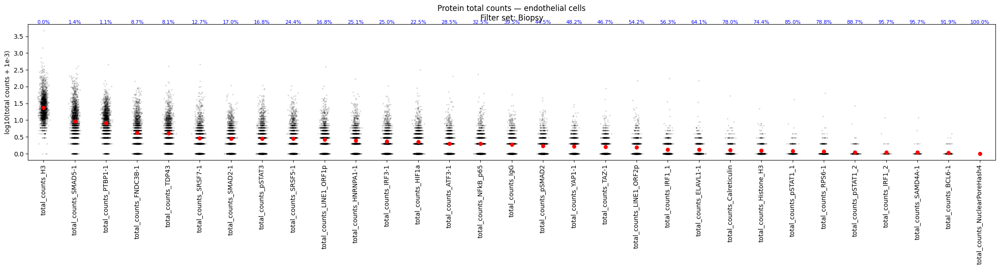

Saved plot for Biopsy: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/ProteinCounts_Biopsy.pdf


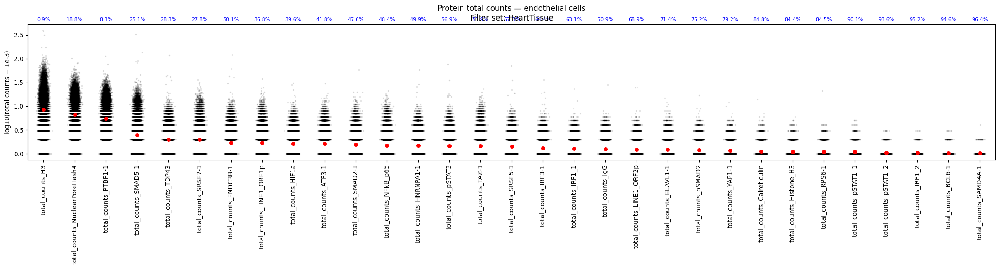

Saved plot for HeartTissue: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/ProteinCounts_HeartTissue.pdf


In [63]:
# Output directory
out_dir = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/"
os.makedirs(out_dir, exist_ok=True)  # create if it doesn't exist

# List of protein total-count features to plot
protein_features = [
    'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p',
    'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43',
    'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1',
    'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1',
    'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1',
    'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1',
    'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1',
    'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1',
    'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2',
    'total_counts_IRF1_2', 'total_counts_SAMD4A-1',
    'total_counts_NuclearPoreHash4', 'total_counts_H3'
]

mpl.rcParams['pdf.fonttype'] = 42


# ------------------------------
# Flexible filter helper
# ------------------------------
def apply_filters(adata, filters):
    mask = np.ones(adata.n_obs, dtype=bool)

    for key, rule in filters.items():

        # Startswith filter
        if isinstance(rule, tuple) and rule[0] == "startswith":
            prefix = rule[1]
            mask &= adata.obs[key].astype(str).str.startswith(prefix, na=False)

        # Not-equal filter
        elif isinstance(rule, tuple) and rule[0] == "!=":
            mask &= adata.obs[key] != rule[1]

        # Equality with list
        elif isinstance(rule, list):
            mask &= adata.obs[key].isin(rule)

        # Basic equality
        else:
            mask &= adata.obs[key] == rule

    return adata[mask].copy()


# ------------------------------
# Plotting function
# ------------------------------
def plot_protein_counts(adata, filter_name, filters, output_dir):

    adata_sub = apply_filters(adata, filters)

    # Extract features
    df = adata_sub.obs[protein_features].copy()

    # Filter counts <1 and compute %zeros
    zero_pct = {}
    df_filtered = pd.DataFrame(index=df.index)
    for col in df.columns:
        mask = df[col] >= 1
        pct_zero = 100 * (~mask).sum() / len(df)
        zero_pct[col] = pct_zero
        df_filtered[col] = df[col].where(mask)

    # Log10 transform
    df_log = np.log10(df_filtered + 1e-3)

    # Sort proteins by mean
    protein_order = df_log.mean().sort_values(ascending=False).index
    df_log_sorted = df_log[protein_order]
    zero_pct_sorted = [zero_pct[p] for p in protein_order]

    # --- Plot ---
    plt.figure(figsize=(22, 6))
    box = plt.boxplot(
        df_log_sorted,
        labels=protein_order,
        patch_artist=True,
        showfliers=False
    )

    for element in box['boxes'] + box['whiskers'] + box['caps'] + box['medians']:
        element.set_rasterized(True)

    # Means
    means = df_log_sorted.mean()
    sc = plt.scatter(range(1, len(protein_order) + 1), means,
                     color='red', s=30, zorder=3)
    sc.set_rasterized(True)

    # Jittered points
    for i, col in enumerate(df_log_sorted.columns):
        y = df_log_sorted[col].dropna().values
        x = np.random.normal(i + 1, 0.06, size=len(y))
        pts = plt.plot(x, y, 'k.', alpha=0.1, markersize=3)
        for p in pts:
            p.set_rasterized(True)

    # % zeros
    y_max = df_log_sorted.max().max()
    for i, pct in enumerate(zero_pct_sorted):
        plt.text(i + 1, y_max + 0.2, f"{pct:.1f}%",
                 ha='center', fontsize=8, color='blue')

    plt.xticks(rotation=90)
    plt.ylabel("log10(total counts + 1e-3)")
    plt.title(f"Protein total counts — endothelial cells\nFilter set: {filter_name}")
    plt.tight_layout()

    # --- Show inline ---
    plt.show()

    # --- Save ---
    pdf_filename = os.path.join(output_dir, f"ProteinCounts_{filter_name}.pdf")
    plt.savefig(pdf_filename, dpi=300)

    # Close AFTER saving
    plt.close()

    print(f"Saved plot for {filter_name}: {pdf_filename}")


# ------------------------------
# Filter sets
# ------------------------------
filter_sets = {
    "Biopsy": {
        "cell_type_general": "Endothelial",
        "SampleType": "Biopsy",
        "sampleID": ("startswith", "April2025"),
    },

    "HeartTissue": {
        "cell_type_general": "Endothelial",
        "SampleType": "HeartTissue"
    },
}

# Generate plots
for name, fs in filter_sets.items():
    plot_protein_counts(adata_filtered, name, fs, out_dir)



In [64]:
# Output directory
out_dir = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/"
os.makedirs(out_dir, exist_ok=True)

# List of protein total-count features to plot
protein_features = [
    'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p',
    'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43',
    'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1',
    'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1',
    'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1',
    'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1',
    'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1',
    'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1',
    'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2',
    'total_counts_IRF1_2', 'total_counts_SAMD4A-1', 'total_counts_NuclearPoreHash4',
    'total_counts_H3'
]

mpl.rcParams['pdf.fonttype'] = 42

# Filters
def apply_filters(adata, filters):
    mask = np.ones(adata.n_obs, dtype=bool)
    for key, rule in filters.items():
        # Startswith filter
        if isinstance(rule, tuple) and rule[0] == "startswith":
            prefix = rule[1]
            mask &= adata.obs[key].astype(str).str.startswith(prefix, na=False)
        # Not-equal filter
        elif isinstance(rule, tuple) and rule[0] == "!=":
            mask &= adata.obs[key] != rule[1]
        # Equality with list
        elif isinstance(rule, list):
            mask &= adata.obs[key].isin(rule)
        # Basic equality
        else:
            mask &= adata.obs[key] == rule
    return adata[mask].copy()

# Function to generate plot for a given SampleType
def plot_protein_counts(adata, filter_name, filters, output_dir):
    adata_sub = apply_filters(adata, filters)

    # Extract features
    df = adata_sub.obs[protein_features].copy()

    # Filter counts <1 and compute % zeros
    zero_pct = {}
    df_filtered = pd.DataFrame(index=df.index)
    for col in df.columns:
        mask = df[col] >= 1
        pct_zero = 100 * (~mask).sum() / len(df)
        zero_pct[col] = pct_zero
        df_filtered[col] = df[col].where(mask)

    # Log10 transform
    df_log = np.log10(df_filtered + 1e-3)

    # Sort proteins by mean
    protein_order = df_log.mean().sort_values(ascending=False).index
    df_log_sorted = df_log[protein_order]
    zero_pct_sorted = [zero_pct[p] for p in protein_order]

    # Plot
    plt.figure(figsize=(22, 6))
    box = plt.boxplot(
        df_log_sorted, labels=protein_order, patch_artist=True, showfliers=False
    )

    for element in box['boxes'] + box['whiskers'] + box['caps'] + box['medians']:
        element.set_rasterized(True)

    # Means
    means = df_log_sorted.mean()
    sc = plt.scatter(
        range(1, len(protein_order) + 1), means, color='red', s=30, zorder=3
    )
    sc.set_rasterized(True)

    # Jittered points
    for i, col in enumerate(df_log_sorted.columns):
        y = df_log_sorted[col].dropna().values
        x = np.random.normal(i + 1, 0.06, size=len(y))
        pts = plt.plot(x, y, 'k.', alpha=0.1, markersize=3)
        for p in pts:
            p.set_rasterized(True)

    # % zeros
    y_max = df_log_sorted.max().max()
    for i, pct in enumerate(zero_pct_sorted):
        plt.text(i + 1, y_max + 0.2, f"{pct:.1f}%", ha='center', fontsize=8, color='blue')

    plt.xticks(rotation=90)
    plt.ylabel("log10(total counts + 1e-3)")
    plt.title(f"Protein total counts — endothelial cells\nFilter set: {filter_name}")
    plt.tight_layout()

    # Save
    pdf_filename = os.path.join(output_dir, f"ProteinCounts_{filter_name}.pdf")
    plt.savefig(pdf_filename, dpi=300)
    plt.close()

    print(f"Saved plot for {filter_name}: {pdf_filename}")

# Filter sets
filter_sets = {
    "Biopsy": {
        "cell_type_general": "Endothelial",
        "SampleType": "Biopsy",
        "sampleID": ("startswith", "April2025"),
    },
    "HeartTissue": {
        "cell_type_general": "Endothelial",
        "SampleType": "HeartTissue"
    },
}

# Generate plots
for name, fs in filter_sets.items():
    plot_protein_counts(adata_filtered, name, fs, out_dir)


2025-12-09 15:54:46 | [INFO] maxp pruned
2025-12-09 15:54:46 | [INFO] cmap pruned
2025-12-09 15:54:46 | [INFO] kern dropped
2025-12-09 15:54:46 | [INFO] post pruned
2025-12-09 15:54:46 | [INFO] FFTM dropped
2025-12-09 15:54:46 | [INFO] GPOS pruned
2025-12-09 15:54:46 | [INFO] GSUB pruned
2025-12-09 15:54:46 | [INFO] name pruned
2025-12-09 15:54:46 | [INFO] glyf pruned
2025-12-09 15:54:46 | [INFO] Added gid0 to subset
2025-12-09 15:54:46 | [INFO] Added first four glyphs to subset
2025-12-09 15:54:46 | [INFO] Closing glyph list over 'GSUB': 60 glyphs before
2025-12-09 15:54:46 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'Y', 'Z', 'a', 'c', 'colon', 'd', 'e', 'eight', 'emdash', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'undersco

Saved plot for Biopsy: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/ProteinCounts_Biopsy.pdf


2025-12-09 15:55:04 | [INFO] maxp pruned
2025-12-09 15:55:04 | [INFO] cmap pruned
2025-12-09 15:55:04 | [INFO] kern dropped
2025-12-09 15:55:04 | [INFO] post pruned
2025-12-09 15:55:04 | [INFO] FFTM dropped
2025-12-09 15:55:04 | [INFO] GPOS pruned
2025-12-09 15:55:04 | [INFO] GSUB pruned
2025-12-09 15:55:04 | [INFO] name pruned
2025-12-09 15:55:04 | [INFO] glyf pruned
2025-12-09 15:55:04 | [INFO] Added gid0 to subset
2025-12-09 15:55:04 | [INFO] Added first four glyphs to subset
2025-12-09 15:55:04 | [INFO] Closing glyph list over 'GSUB': 59 glyphs before
2025-12-09 15:55:04 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'Y', 'Z', 'a', 'c', 'colon', 'd', 'e', 'eight', 'emdash', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'undersco

Saved plot for HeartTissue: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/ProteinCounts_HeartTissue.pdf


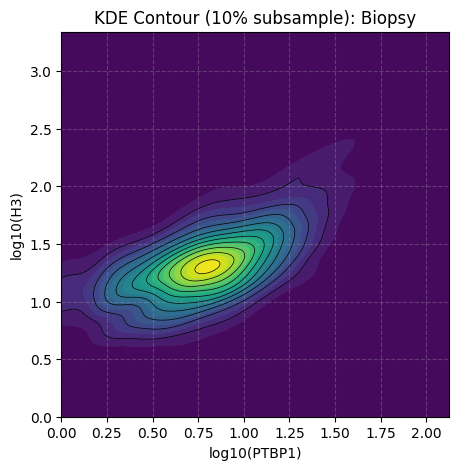

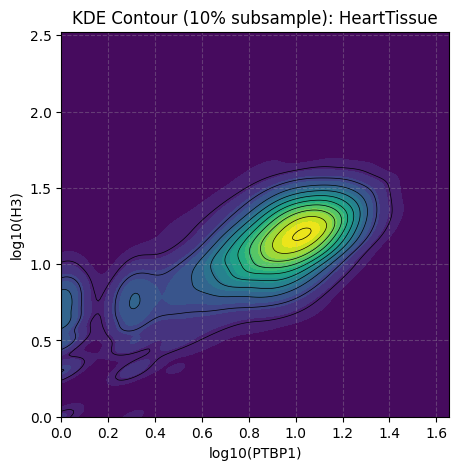

In [68]:

from scipy.stats import gaussian_kde

for stype, df in obs_subset.groupby('SampleType'):
    # Keep only positive values
    df = df[(df['total_counts_PTBP1-1'] > 0) & (df['total_counts_H3'] > 0)]
    
    # Subsample 10% of cells
    df = df.sample(frac=0.1, random_state=42)
    
    x = np.log10(df['total_counts_PTBP1-1'].values)
    y = np.log10(df['total_counts_H3'].values)

    # Compute KDE
    xy = np.vstack([x, y])
    kde = gaussian_kde(xy)
    
    # Grid for evaluation
    xi, yi = np.mgrid[x.min():x.max():200j, y.min():y.max():200j]
    zi = kde(np.vstack([xi.flatten(), yi.flatten()])).reshape(xi.shape)
    
    # Plot contour
    plt.figure(figsize=(5,5))
    plt.contourf(xi, yi, zi, levels=20, cmap='viridis')
    plt.contour(xi, yi, zi, levels=10, colors='k', linewidths=0.5)
    
    plt.xlabel('log10(PTBP1)')
    plt.ylabel('log10(H3)')
    plt.title(f'KDE Contour (10% subsample): {stype}')
    plt.grid(True, which='both', linestyle='--', alpha=0.3)
    plt.show()


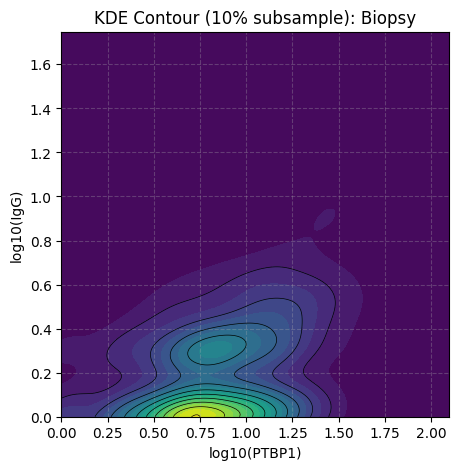

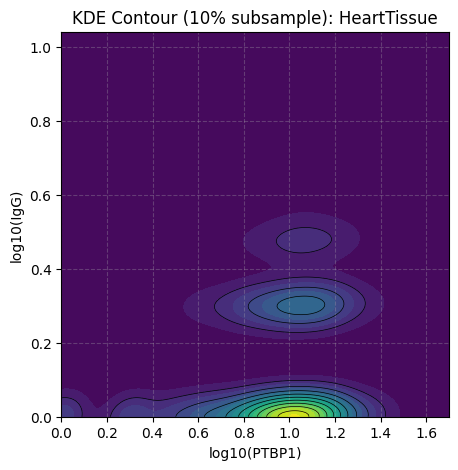

In [69]:
from scipy.stats import gaussian_kde

for stype, df in obs_subset.groupby('SampleType'):
    # Keep only positive values
    df = df[(df['total_counts_PTBP1-1'] > 0) & (df['total_counts_IgG'] > 0)]
    
    # Subsample 10% of cells
    df = df.sample(frac=0.1, random_state=42)
    
    x = np.log10(df['total_counts_PTBP1-1'].values)
    y = np.log10(df['total_counts_IgG'].values)

    # Compute KDE
    xy = np.vstack([x, y])
    kde = gaussian_kde(xy)
    
    # Grid for evaluation
    xi, yi = np.mgrid[x.min():x.max():200j, y.min():y.max():200j]
    zi = kde(np.vstack([xi.flatten(), yi.flatten()])).reshape(xi.shape)
    
    # Plot contour
    plt.figure(figsize=(5,5))
    plt.contourf(xi, yi, zi, levels=20, cmap='viridis')
    plt.contour(xi, yi, zi, levels=10, colors='k', linewidths=0.5)
    
    plt.xlabel('log10(PTBP1)')
    plt.ylabel('log10(IgG)')
    plt.title(f'KDE Contour (10% subsample): {stype}')
    plt.grid(True, which='both', linestyle='--', alpha=0.3)
    plt.show()

### Pseudobulk normalized levels, by H3

In [75]:
adata_filtered.obs['10xRxn'].value_counts()


10xRxn
May2025_RVLVUCLA     38701
May2025_RVDuke1      25869
May2025_RVDuke2      22233
May2025_IVSDuke1     21341
May2025_IVSDuke2     15069
Sept2022_Sample21     7238
May2025_LADUCLA       4083
Sept2022_Sample20     3702
April2025_Sample3     2914
April2025_Sample2     2771
April2025_Sample1     2604
Name: count, dtype: int64

In [76]:
# ----------------------------
# 1. Start from .obs dataframe
# ----------------------------
obs = adata_filtered.obs.copy()

# keep only cells with usable H3 signal
obs_valid = obs[obs['total_counts_H3'] >= 1].copy()

# ----------------------------
# 2. Define grouping flat index
# ----------------------------
group_cols = ['StrippedDonor', 'GraftHost', 'LocationFine', 'Day', 'cell_type_general', '10xRxn', 'DiseaseStatus']

# make a flat string index like Donor_GraftHost_LocationFine_Day_cellType
obs_valid['flat_index'] = (
    obs_valid['StrippedDonor'].astype(str) + "_" +
    obs_valid['GraftHost'].astype(str) + "_" +
    obs_valid['LocationFine'].astype(str) + "_" +
    obs_valid['Day'].astype(str) + "_" +
    obs_valid['cell_type_general'].astype(str) + "_" +
    obs_valid['10xRxn'].astype(str) + "_" +
    obs_valid['DiseaseStatus'].astype(str)
)

# ----------------------------
# 3. Identify *_norm_H3 and *_nCLR_H3 columns
# ----------------------------
norm_cols = [c for c in obs_valid.columns if c.endswith('_norm_H3')]

# ----------------------------
# 4. Group, compute means
# ----------------------------
# Mean for *_norm_H3
grouped_norm_means = (
    obs_valid
    .groupby('flat_index')[norm_cols]
    .mean()
    .add_prefix('mean_')  # e.g., mean_total_counts_ELAVL1-1_norm_H3
)


# ----------------------------
# 5. Count cells passing filtering
# ----------------------------
cell_counts = (
    obs_valid
    .groupby('flat_index')
    .size()
    .rename('n_cells_passing_H3_filter')
)

# ----------------------------
# 6. Attach one representative obs row per flat_index
# ----------------------------
representative = (
    obs_valid
    .drop_duplicates(subset=['flat_index'])
    .set_index('flat_index')
)

# ----------------------------
# 7. Merge everything into final summary
# ----------------------------
final_obs_summary_H3 = representative.join([grouped_norm_means, cell_counts])

# ----------------------------
# 8. Inspect columns
# ----------------------------
print(final_obs_summary_H3.columns)


Index(['souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch',
       'souporcell_assignmentBatch', 'souporcell_statusMerge',
       'souporcell_assignmentMerge', 'demux_type', 'assignment',
       'hashtag_counts', 'demux_confidence',
       ...
       'mean_total_counts_IRF3-1_norm_H3', 'mean_total_counts_pSMAD2_norm_H3',
       'mean_total_counts_pSTAT1_1_norm_H3',
       'mean_total_counts_IRF1_1_norm_H3', 'mean_total_counts_RPS6-1_norm_H3',
       'mean_total_counts_BCL6-1_norm_H3',
       'mean_total_counts_pSTAT1_2_norm_H3',
       'mean_total_counts_IRF1_2_norm_H3',
       'mean_total_counts_SAMD4A-1_norm_H3', 'n_cells_passing_H3_filter'],
      dtype='object', length=203)


In [77]:
list(final_obs_summary_H3.columns)

['souporcell_status',
 'souporcell_assignment',
 'souporcell_statusBatch',
 'souporcell_assignmentBatch',
 'souporcell_statusMerge',
 'souporcell_assignmentMerge',
 'demux_type',
 'assignment',
 'hashtag_counts',
 'demux_confidence',
 'hto_assigned_vs_others_ratio',
 '10xRxn',
 'source',
 'total_counts_NFkB_p65',
 'total_counts_LINE1_ORF1p',
 'total_counts_LINE1_ORF2p',
 'total_counts_PTBP1-1',
 'total_counts_SRSF7-1',
 'total_counts_TDP43',
 'total_counts_HNRNPA1-1',
 'total_counts_FNDC3B-1',
 'total_counts_SMAD2-1',
 'total_counts_Histone_H3',
 'total_counts_IgG',
 'total_counts_YAP1-1',
 'total_counts_TAZ-1',
 'total_counts_pSTAT3',
 'total_counts_ATF3-1',
 'total_counts_HIF1a',
 'total_counts_SRSF5-1',
 'total_counts_ELAVL1-1',
 'total_counts_SMAD5-1',
 'total_counts_Calreticulin',
 'total_counts_IRF3-1',
 'total_counts_pSMAD2',
 'total_counts_pSTAT1_1',
 'total_counts_IRF1_1',
 'total_counts_RPS6-1',
 'total_counts_BCL6-1',
 'total_counts_pSTAT1_2',
 'total_counts_IRF1_2',
 'total

### Clustered heat map of nuclear protein expression by samples

2025-12-09 15:56:01 | [INFO] maxp pruned
2025-12-09 15:56:01 | [INFO] cmap pruned
2025-12-09 15:56:01 | [INFO] kern dropped
2025-12-09 15:56:01 | [INFO] post pruned
2025-12-09 15:56:01 | [INFO] FFTM dropped
2025-12-09 15:56:01 | [INFO] GPOS pruned
2025-12-09 15:56:01 | [INFO] GSUB pruned
2025-12-09 15:56:01 | [INFO] name pruned
2025-12-09 15:56:01 | [INFO] glyf pruned
2025-12-09 15:56:01 | [INFO] Added gid0 to subset
2025-12-09 15:56:01 | [INFO] Added first four glyphs to subset
2025-12-09 15:56:01 | [INFO] Closing glyph list over 'GSUB': 61 glyphs before
2025-12-09 15:56:01 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'V', 'Z', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'j', 'k', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'w', 'x', 'y', 'zero']
2025-12-

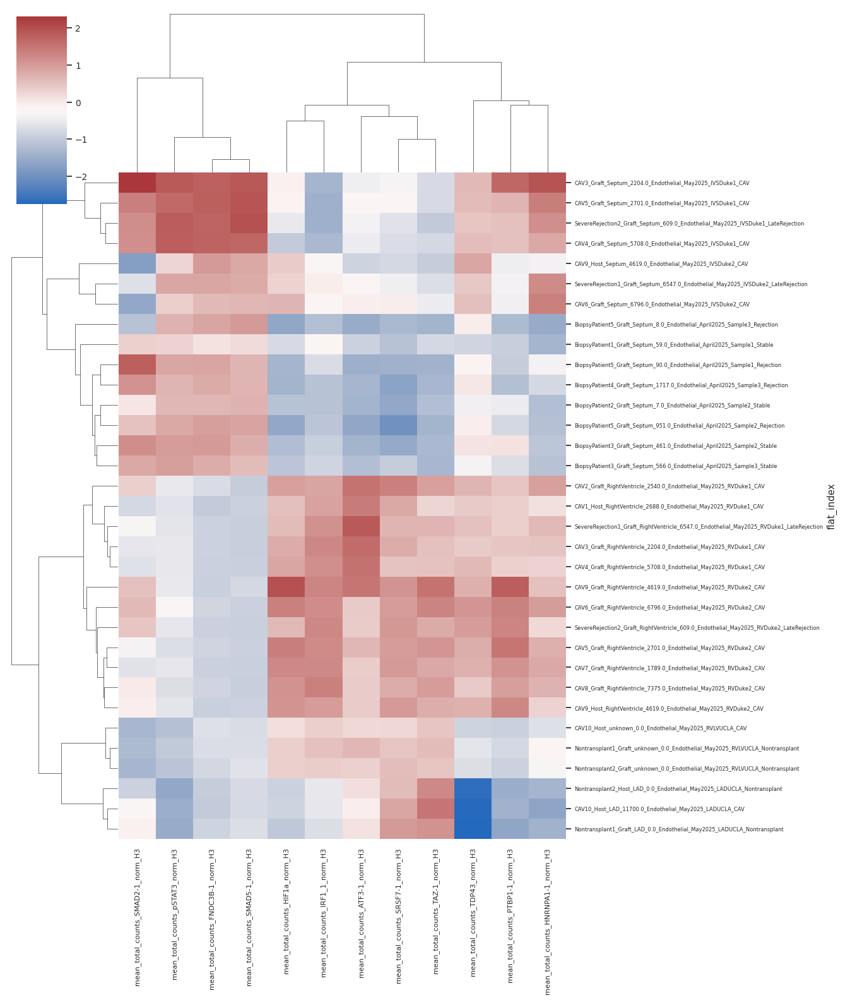

✅ Figure saved to: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Sept_CITESeq_Cardiomyocyte.pdf


In [81]:
from scipy.stats import zscore

output_file = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Sept_CITESeq_Cardiomyocyte.pdf"

# ----------------------------
# 1. Select only the mean norm_H3 protein columns
# ----------------------------
protein_cols = [
    'mean_total_counts_PTBP1-1_norm_H3',
 'mean_total_counts_SRSF7-1_norm_H3',
 'mean_total_counts_TDP43_norm_H3',
 'mean_total_counts_HNRNPA1-1_norm_H3',
 'mean_total_counts_FNDC3B-1_norm_H3',
 'mean_total_counts_SMAD2-1_norm_H3',
 'mean_total_counts_IgG_norm_H3',
# 'mean_total_counts_YAP1-1_norm_H3',
 'mean_total_counts_TAZ-1_norm_H3',
 'mean_total_counts_pSTAT3_norm_H3',
 'mean_total_counts_ATF3-1_norm_H3',
 'mean_total_counts_HIF1a_norm_H3',
# 'mean_total_counts_SRSF5-1_norm_H3',
# 'mean_total_counts_ELAVL1-1_norm_H3',
 'mean_total_counts_SMAD5-1_norm_H3',
# 'mean_total_counts_Calreticulin_norm_H3',
# 'mean_total_counts_IRF3-1_norm_H3',
# 'mean_total_counts_pSMAD2_norm_H3',
# 'mean_total_counts_pSTAT1_1_norm_H3',
 'mean_total_counts_IRF1_1_norm_H3',
# 'mean_total_counts_RPS6-1_norm_H3',
# 'mean_total_counts_BCL6-1_norm_H3',
# 'mean_total_counts_pSTAT1_2_norm_H3',
# 'mean_total_counts_IRF1_2_norm_H3',
# 'mean_total_counts_SAMD4A-1_norm_H3',
    ]

mpl.rcParams['pdf.fonttype'] = 42

# ----------------------------
# 0. Filter rows with sufficient cells
# ----------------------------
final_obs_summary_H3_endothelial = final_obs_summary_H3[
    final_obs_summary_H3['cell_type_general'] == 'Endothelial'
].copy()

heatmap_df = final_obs_summary_H3_endothelial.loc[
    final_obs_summary_H3_endothelial['n_cells_passing_H3_filter'] > 100,
    protein_cols
].copy()

# preserve index
heatmap_df.index = final_obs_summary_H3_endothelial.loc[
    final_obs_summary_H3_endothelial['n_cells_passing_H3_filter'] > 100
].index

# ----------------------------
# 1b. Subtract IgG background from all other columns
# ----------------------------
if 'mean_total_counts_IgG_norm_H3' in heatmap_df.columns:
    heatmap_df = heatmap_df.subtract(heatmap_df['mean_total_counts_IgG_norm_H3'], axis=0)
    # Optionally remove IgG column after subtraction
    heatmap_df = heatmap_df.drop(columns=['mean_total_counts_IgG_norm_H3'], errors='ignore')

# ----------------------------
# 1c. Scale each protein column as z-score
# ----------------------------
heatmap_df = heatmap_df.apply(zscore, axis=0)

# ----------------------------
# 2. Determine figure height based on number of rows
# ----------------------------
n_rows = heatmap_df.shape[0]
fig_height = max(10, n_rows * 0.5)  # 0.25 inch per row

# ----------------------------
# 3. Create clustered heatmap
# ----------------------------
g = sns.clustermap(
    heatmap_df,
    metric='euclidean',
    method='average',
    figsize=(16, fig_height),
    cmap='vlag',
    row_cluster=True,
    col_cluster=True
)

# ----------------------------
# 4. Adjust label sizes
# ----------------------------
for label in g.ax_heatmap.get_yticklabels():
    label.set_fontsize(6)

for label in g.ax_heatmap.get_xticklabels():
    label.set_rotation(90)
    label.set_fontsize(8)

plt.savefig(output_file, bbox_inches='tight', dpi=300)
plt.show()

print(f"✅ Figure saved to: {output_file}")

# Pseudobulk for all expression data

In [4]:
# This is with the addition of cellranger protein ids
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH.h5ad"
adata_filtered = sc.read_h5ad(output_path)

In [64]:
adata_filtered.obs['DiseaseStatus'].value_counts()


DiseaseStatus
CAV              84374
Nontransplant    23036
LateRejection    19367
Rejection         9656
Stable            9477
Name: count, dtype: int64

In [65]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Count unique BatchSouporcell for each combination
batch_counts = adata_filtered.obs.groupby(
    ['cell_type_general', 'Location', 'DiseaseStatus']
)['BatchSouporcell'].nunique()

print(batch_counts)

cell_type_general  Location       DiseaseStatus
Cardiomyocyte      LAD            CAV               2
                                  LateRejection     0
                                  Nontransplant     1
                                  Rejection         0
                                  Stable            0
                   LeftVentricle  CAV              10
                                  LateRejection     2
                                  Nontransplant     0
                                  Rejection         0
                                  Stable            0
                   Septum         CAV              10
                                  LateRejection     2
                                  Nontransplant     2
                                  Rejection        11
                                  Stable           10
Endothelial        LAD            CAV               2
                                  LateRejection     0
                                  

In [66]:
pdata_all_source = dc.pp.pseudobulk(
    adata=adata_filtered,
    sample_col='BatchSouporcell',
    groups_col=['cell_type_general', 'DiseaseStatus', 'Location', 'SampleType', 'GraftHostRefine'],
    layer='raw_counts',
    mode='sum'
)

In [67]:
pdata_all_source.write("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_pseudobulk_all_cells_alldata.h5ad")


In [90]:
pdata_all_source = sc.read_h5ad("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_pseudobulk_all_cells_alldata.h5ad")


In [68]:
# ----------------------------
# 2. Extract .obs from original AnnData
# ----------------------------
all_obs = adata_filtered.obs.reset_index()  # reset index in case it's not unique
all_obs_unique = all_obs.drop_duplicates(subset=['BatchSouporcell'])

# ----------------------------
# 3. Determine which columns to merge (exclude duplicates)
# ----------------------------
cols_to_add = [c for c in all_obs_unique.columns if c not in pdata_all_source.obs.columns and c != 'index']

# ----------------------------
# 4. Merge into pseudobulk .obs by BatchSouporcell
# ----------------------------
pdata_all_source.obs = pdata_all_source.obs.reset_index().merge(
    all_obs_unique[['BatchSouporcell'] + cols_to_add],
    on='BatchSouporcell',
    how='left'
).set_index(pdata_all_source.obs.index)  # restore original pseudobulk index

In [69]:
list(pdata_all_source.obs.columns)

['index',
 'BatchSouporcell',
 'cell_type_general_DiseaseStatus_Location_SampleType_GraftHostRefine',
 'souporcell_status',
 'souporcell_assignment',
 'souporcell_statusMerge',
 'souporcell_assignmentMerge',
 '10xRxn',
 'source',
 'total_counts_CITESeq_FreeOligo_BC82',
 'SampleType',
 'BankSource',
 'Location',
 'Day',
 'ConfidenceOnHashing',
 'DiseaseStatus',
 'TimePoint',
 'BetweenSampleSC_Validations',
 'GraftHost',
 'RA_mean',
 'RV_systolic',
 'RV_diastolic',
 'PA_systolic',
 'PA_diastolic',
 'PA_mean',
 'PCW',
 'AV_O2',
 'CO',
 'CI',
 'PVR',
 'EF_preop',
 'Sample ID:',
 'acute_rejection_grade',
 'AcuteCellularRejection',
 'AntibodyMediatedRejection',
 'pAMR',
 'allograft_vasculopathy',
 'max_stenosis_%',
 'thrombosis',
 'myocardial_infarct',
 'fibrosis',
 'other_key_findings',
 'LocationFine',
 'doublet',
 'StrippedDonor',
 'sampleID',
 'cell_type_general',
 'cell_type_general_with_counts',
 'GraftHostRefine',
 'psbulk_cells',
 'psbulk_counts',
 'souporcell_statusBatch',
 'souporc

In [70]:
pdata_all_source.write("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_pseudobulk_all_cells_alldata_obs.h5ad")


In [126]:
#pdata_all_source = sc.read_h5ad("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_pseudobulk_all_cells_alldata_obs.h5ad")


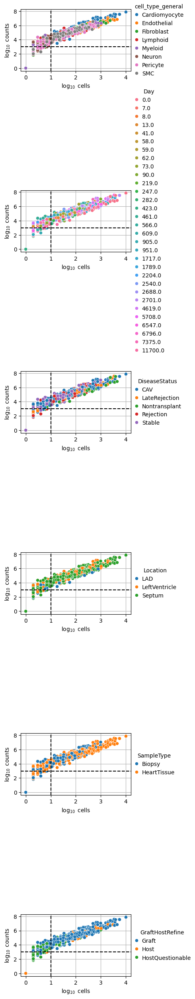

In [74]:
dc.pl.filter_samples(
    adata=pdata_all_source,
    groupby=['cell_type_general', 'Day', 'DiseaseStatus','Location','SampleType', 'GraftHostRefine'],
    min_cells=10,
    min_counts=1000,
    figsize=(5, 25),
)

In [75]:
# Define output path
output_pdf = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Pseudobulk_samples_parameters.pdf"

# Create the plot
fig = dc.pl.filter_samples(
    adata=pdata_all_source,
    groupby=['cell_type_general', 'DiseaseStatus', 'Location', 'SampleType', 'GraftHostRefine'],
    min_cells=10,
    min_counts=1000,
    figsize=(5, 25),
    return_fig=True  # ensures we can capture the figure object
)

# Save to PDF
fig.savefig(output_pdf, bbox_inches='tight')

# Close the figure to free memory
plt.close(fig)

print(f"✅ Plot saved to {output_pdf}")


2025-12-10 20:23:38 | [INFO] maxp pruned
2025-12-10 20:23:38 | [INFO] cmap pruned
2025-12-10 20:23:38 | [INFO] kern dropped
2025-12-10 20:23:38 | [INFO] post pruned
2025-12-10 20:23:38 | [INFO] FFTM dropped
2025-12-10 20:23:38 | [INFO] GPOS pruned
2025-12-10 20:23:38 | [INFO] GSUB pruned
2025-12-10 20:23:38 | [INFO] name pruned
2025-12-10 20:23:38 | [INFO] glyf pruned
2025-12-10 20:23:38 | [INFO] Added gid0 to subset
2025-12-10 20:23:38 | [INFO] Added first four glyphs to subset
2025-12-10 20:23:38 | [INFO] Closing glyph list over 'GSUB': 51 glyphs before
2025-12-10 20:23:38 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'j', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-10 20:23:38 | [INFO] Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 

✅ Plot saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Pseudobulk_samples_parameters.pdf


In [76]:
dc.pp.filter_samples(pdata_all_source, min_cells=10, min_counts=1000)

In [77]:
meta_sub = pdata_all_source.obs[
    (pdata_all_source.obs['cell_type_general'] == 'Endothelial') &
    (pdata_all_source.obs['Location'] == 'Septum')
]
print(meta_sub['DiseaseStatus'].unique())

['CAV', 'LateRejection', 'Nontransplant', 'Rejection', 'Stable']
Categories (5, object): ['CAV', 'LateRejection', 'Nontransplant', 'Rejection', 'Stable']


In [78]:
pdata_all_source.obs.groupby(['cell_type_general', 'Location', 'DiseaseStatus']).size()

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)  # optional, shows all columns too

# Now print your subset
pdata_all_source.obs.groupby(['cell_type_general', 'Location', 'DiseaseStatus']).size()

cell_type_general  Location       DiseaseStatus
Cardiomyocyte      LAD            CAV               1
                                  LateRejection     0
                                  Nontransplant     1
                                  Rejection         0
                                  Stable            0
                   LeftVentricle  CAV              10
                                  LateRejection     2
                                  Nontransplant     0
                                  Rejection         0
                                  Stable            0
                   Septum         CAV               9
                                  LateRejection     2
                                  Nontransplant     2
                                  Rejection         9
                                  Stable           10
Endothelial        LAD            CAV               2
                                  LateRejection     0
                                  

In [79]:
pd.reset_option("display.max_rows")
pd.reset_option("display.max_columns")


In [80]:
import os
import pandas as pd
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

def run_deseq2_comparison(
    pdata,
    cell_type: str,
    location: str,
    cond1: str,
    cond2: str,
    output_dir: str,
    min_base_mean: float = 5
):
    import os
    import pandas as pd
    from pydeseq2.dds import DeseqDataSet, DefaultInference
    from pydeseq2.ds import DeseqStats

    os.makedirs(output_dir, exist_ok=True)
    print(f"\n🔹 Processing {cell_type}, Location = {location}, Comparing {cond2} vs {cond1}")

    # Filter pseudobulk
    pdata_sub = pdata[(pdata.obs["cell_type_general"] == cell_type) &
                      (pdata.obs["Location"] == location)].copy()
    pdata_sub = pdata_sub[pdata_sub.obs["DiseaseStatus"].isin([cond1, cond2])].copy()

    if pdata_sub.shape[0] < 2:
        print("  ⚠️ Not enough samples. Skipping.")
        return None

    meta_sub = pdata_sub.obs.copy()
    meta_sub["DiseaseStatus"] = meta_sub["DiseaseStatus"].astype(str)
    counts_per_group = meta_sub["DiseaseStatus"].value_counts()
    if (counts_per_group < 2).any():
        print(f"  ⚠️ Not enough replicates: {counts_per_group.to_dict()}. Skipping.")
        return None

    results_df_summary = None
    results_df_filtered = None

    try:
        # DESeq2 setup
        inference = DefaultInference(n_cpus=8)
        dds = DeseqDataSet(
            adata=pdata_sub,
            design_factors=['DiseaseStatus'],
            refit_cooks=True,
            inference=inference,
        )

        # Run DESeq2
        dds.deseq2()

        # Compute contrast
        stat_res = DeseqStats(
            dds,
            contrast=["DiseaseStatus", cond2, cond1],
            inference=inference
        )

        # Compute Wald test
        stat_res.summary()
        # Extract results
        results_df_filtered = stat_res.results_df
        results_df_filtered

        # Filter by baseMean
        results_df_filtered["CellType"] = cell_type
        results_df_filtered["Location"] = location
        results_df_filtered["Comparison"] = f"{cond2}_vs_{cond1}"

        # Save
        out_path = os.path.join(output_dir, f"{cell_type}_{location}_{cond2}_vs_{cond1}_DESeq2.csv")
        results_df_filtered.to_csv(out_path)
        print(f"  ✅ Wrote {len(results_df_filtered)} genes to {out_path}")

    except Exception as e:
        print(f"  ⚠️ Error during DESeq2: {e}")

    return results_df_summary, results_df_filtered


In [81]:
# Example: Endothelial cells, Septum location, CAV vs Stable
res_endothelial = run_deseq2_comparison(
    pdata=pdata_all_source,
    cell_type="Endothelial",
    location="Septum",
    cond1="Stable",
    cond2="CAV",
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"
)



🔹 Processing Endothelial, Location = Septum, Comparing CAV vs Stable


Fitting size factors...
... done in 0.08 seconds.

Fitting dispersions...
... done in 11.22 seconds.

Fitting dispersion trend curve...
... done in 1.97 seconds.

Fitting MAP dispersions...
... done in 16.99 seconds.

Fitting LFCs...
... done in 17.21 seconds.

Calculating cook's distance...
... done in 0.05 seconds.

Replacing 97 outlier genes.

Fitting dispersions...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting LFCs...
... done in 0.10 seconds.

Running Wald tests...
... done in 5.04 seconds.



Log2 fold change & Wald test p-value: DiseaseStatus CAV vs Stable
              baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AGRP          0.000000             NaN       NaN       NaN           NaN   
DYRK1B        2.209108       -1.427401  0.607601 -2.349241  1.881170e-02   
LINC02181     0.004603        1.196030  3.283738  0.364228  7.156877e-01   
AC005400.1    1.145980       -0.702516  1.304633 -0.538477  5.902474e-01   
SMCR5         1.603508       -1.901052  0.698772 -2.720560  6.517141e-03   
...                ...             ...       ...       ...           ...   
AC113348.3    0.071234        0.770300  2.677704  0.287672  7.735980e-01   
GHR          32.403725       -0.324541  0.591925 -0.548281  5.834991e-01   
LCOR         43.891703       -0.223760  0.316769 -0.706383  4.799503e-01   
STARD13     286.267891        1.880591  0.320970  5.859086  4.654230e-09   
AC005306.1    0.627947        0.099710  0.789178  0.126347  8.994576e-01   

                padj 

In [82]:
# Example: Endothelial cells, Septum location, CAV vs Stable
res_endothelial = run_deseq2_comparison(
    pdata=pdata_all_source,
    cell_type="Fibroblast",
    location="Septum",
    cond1="Stable",
    cond2="CAV",
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"
)



🔹 Processing Fibroblast, Location = Septum, Comparing CAV vs Stable


Fitting size factors...
... done in 0.04 seconds.

Fitting dispersions...
... done in 10.53 seconds.

Fitting dispersion trend curve...
... done in 1.90 seconds.

Fitting MAP dispersions...
... done in 17.00 seconds.

Fitting LFCs...
... done in 20.11 seconds.

Calculating cook's distance...
... done in 0.05 seconds.

Replacing 54 outlier genes.

Fitting dispersions...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.06 seconds.

Running Wald tests...
... done in 4.93 seconds.



Log2 fold change & Wald test p-value: DiseaseStatus CAV vs Stable
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AGRP          0.000000             NaN       NaN       NaN       NaN       NaN
DYRK1B        1.707584       -0.733013  0.493598 -1.485040  0.137533  0.427074
LINC02181     0.018129        0.604580  2.602712  0.232288  0.816314       NaN
AC005400.1    0.474412        2.844366  0.913310  3.114350  0.001844       NaN
SMCR5         0.938100       -1.031884  0.790482 -1.305386  0.191761  0.503348
...                ...             ...       ...       ...       ...       ...
AC113348.3    0.000000             NaN       NaN       NaN       NaN       NaN
GHR          92.588535       -0.612757  0.479606 -1.277627  0.201381  0.516171
LCOR         51.774704        0.297382  0.259542  1.145795  0.251880  0.569419
STARD13     144.956883        0.490181  0.284551  1.722650  0.084952  0.332680
AC005306.1    1.257576       -0.713572  0.838762 -0.850744  0.394

In [83]:
# Example: Endothelial cells, Septum location, CAV vs Stable
res_endothelial = run_deseq2_comparison(
    pdata=pdata_all_source,
    cell_type="Cardiomyocyte",
    location="Septum",
    cond1="Stable",
    cond2="CAV",
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"
)



🔹 Processing Cardiomyocyte, Location = Septum, Comparing CAV vs Stable


Fitting size factors...
... done in 0.06 seconds.

Fitting dispersions...
... done in 13.48 seconds.

Fitting dispersion trend curve...
... done in 1.97 seconds.

Fitting MAP dispersions...
... done in 20.01 seconds.

Fitting LFCs...
... done in 17.60 seconds.

Calculating cook's distance...
... done in 0.05 seconds.

Replacing 247 outlier genes.

Fitting dispersions...
... done in 0.65 seconds.

Fitting MAP dispersions...
... done in 0.50 seconds.

Fitting LFCs...
... done in 0.23 seconds.

Running Wald tests...
... done in 4.93 seconds.



Log2 fold change & Wald test p-value: DiseaseStatus CAV vs Stable
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
AGRP           0.007157       -3.120080  2.790985 -1.117914  2.636039e-01   
DYRK1B        24.536767       -0.386624  0.199408 -1.938861  5.251827e-02   
LINC02181      0.000000             NaN       NaN       NaN           NaN   
AC005400.1   173.267054       -2.586795  0.578474 -4.471758  7.757910e-06   
SMCR5         19.465005       -2.346324  0.387158 -6.060372  1.358068e-09   
...                 ...             ...       ...       ...           ...   
AC113348.3     0.000000             NaN       NaN       NaN           NaN   
GHR          749.364680        0.329726  0.182479  1.806926  7.077375e-02   
LCOR         638.767416       -0.134437  0.102936 -1.306026  1.915436e-01   
STARD13     1561.195028        0.383463  0.255897  1.498504  1.340023e-01   
AC005306.1     3.264830       -0.449894  0.607249 -0.740872  4.587709e-01   

         

In [84]:
# Example: Endothelial cells, Septum location, CAV vs Stable
res_endothelial = run_deseq2_comparison(
    pdata=pdata_all_source,
    cell_type="Myeloid",
    location="Septum",
    cond1="Stable",
    cond2="CAV",
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"
)



🔹 Processing Myeloid, Location = Septum, Comparing CAV vs Stable


Fitting size factors...
... done in 0.04 seconds.

Fitting dispersions...
... done in 11.34 seconds.

Fitting dispersion trend curve...
... done in 1.70 seconds.

Fitting MAP dispersions...
... done in 14.63 seconds.

Fitting LFCs...
... done in 12.88 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 27 outlier genes.

Fitting dispersions...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting LFCs...
... done in 0.03 seconds.

Running Wald tests...
... done in 5.47 seconds.



Log2 fold change & Wald test p-value: DiseaseStatus CAV vs Stable
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AGRP          0.000000             NaN       NaN       NaN       NaN       NaN
DYRK1B        1.172027       -0.224156  0.842774 -0.265975  0.790259  0.919559
LINC02181     0.000000             NaN       NaN       NaN       NaN       NaN
AC005400.1    0.545833        1.628772  2.269818  0.717578  0.473017       NaN
SMCR5         0.162385       -1.096517  2.268798 -0.483303  0.628881       NaN
...                ...             ...       ...       ...       ...       ...
AC113348.3    0.000000             NaN       NaN       NaN       NaN       NaN
GHR          14.910624        0.673792  1.435211  0.469472  0.638732  0.844888
LCOR         30.169880        0.194857  0.192366  1.012946  0.311086  0.626625
STARD13     207.240909        1.151969  0.322654  3.570291  0.000357  0.009767
AC005306.1    0.222608       -1.950598  2.609278 -0.747562  0.454

In [85]:
# Example: Endothelial cells, Septum location, CAV vs Stable
res_endothelial = run_deseq2_comparison(
    pdata=pdata_all_source,
    cell_type="Endothelial",
    location="Septum",
    cond1="Nontransplant",
    cond2="CAV",
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"
)



🔹 Processing Endothelial, Location = Septum, Comparing CAV vs Nontransplant


Fitting size factors...
... done in 0.03 seconds.

Fitting dispersions...
... done in 10.43 seconds.

Fitting dispersion trend curve...
... done in 1.81 seconds.

Fitting MAP dispersions...
... done in 14.92 seconds.

Fitting LFCs...
... done in 14.71 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 167 outlier genes.

Fitting dispersions...
... done in 0.47 seconds.

Fitting MAP dispersions...
... done in 0.44 seconds.

Fitting LFCs...
... done in 0.17 seconds.

Running Wald tests...
... done in 4.86 seconds.



Log2 fold change & Wald test p-value: DiseaseStatus CAV vs Nontransplant
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AGRP          0.000000             NaN       NaN       NaN       NaN       NaN
DYRK1B        0.962761       -0.205404  0.887046 -0.231559  0.816880  0.991344
LINC02181     0.000000             NaN       NaN       NaN       NaN       NaN
AC005400.1    1.322389        0.522375  1.918504  0.272283  0.785405  0.988959
SMCR5         0.964402        0.468053  0.874517  0.535213  0.592503  0.988505
...                ...             ...       ...       ...       ...       ...
AC113348.3    0.000000             NaN       NaN       NaN       NaN       NaN
GHR          37.373402       -0.451118  1.235634 -0.365091  0.715044  0.988505
LCOR         51.450287       -0.176218  0.481957 -0.365630  0.714641  0.988505
STARD13     473.928672        1.243893  0.599192  2.075951  0.037899  0.890061
AC005306.1    0.702918        0.666095  0.913271  0.729350

In [86]:
# Example: Endothelial cells, Septum location, CAV vs Stable
res_endothelial = run_deseq2_comparison(
    pdata=pdata_all_source,
    cell_type="Fibroblast",
    location="Septum",
    cond1="Nontransplant",
    cond2="CAV",
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"
)


🔹 Processing Fibroblast, Location = Septum, Comparing CAV vs Nontransplant


Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 9.31 seconds.

Fitting dispersion trend curve...
... done in 1.81 seconds.

Fitting MAP dispersions...
... done in 15.36 seconds.

Fitting LFCs...
... done in 17.30 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 62 outlier genes.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.07 seconds.

Running Wald tests...
... done in 4.87 seconds.



Log2 fold change & Wald test p-value: DiseaseStatus CAV vs Nontransplant
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AGRP          0.000000             NaN       NaN       NaN       NaN       NaN
DYRK1B        1.746338        0.401309  0.733200  0.547339  0.584146  0.895980
LINC02181     0.000000             NaN       NaN       NaN       NaN       NaN
AC005400.1    1.215142        3.541146  1.128196  3.138770  0.001697  0.428023
SMCR5         0.741104        0.956280  0.922368  1.036766  0.299845  0.730880
...                ...             ...       ...       ...       ...       ...
AC113348.3    0.000000             NaN       NaN       NaN       NaN       NaN
GHR         108.652599       -0.159855  0.906668 -0.176311  0.860050  0.976765
LCOR         85.801002        0.144467  0.356899  0.404786  0.685635  0.931484
STARD13     249.449147        0.017636  0.572013  0.030832  0.975403  0.996782
AC005306.1    0.624458        0.544352  0.850750  0.639850

In [87]:
# Example: Endothelial cells, Septum location, CAV vs Stable
res_endothelial = run_deseq2_comparison(
    pdata=pdata_all_source,
    cell_type="Cardiomyocyte",
    location="Septum",
    cond1="Nontransplant",
    cond2="CAV",
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"
)


🔹 Processing Cardiomyocyte, Location = Septum, Comparing CAV vs Nontransplant


Fitting size factors...
... done in 0.03 seconds.

Fitting dispersions...
... done in 13.21 seconds.

Fitting dispersion trend curve...
... done in 2.03 seconds.

Fitting MAP dispersions...
... done in 19.04 seconds.

Fitting LFCs...
... done in 12.78 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 288 outlier genes.

Fitting dispersions...
... done in 0.79 seconds.

Fitting MAP dispersions...
... done in 0.73 seconds.

Fitting LFCs...
... done in 0.20 seconds.

Running Wald tests...
... done in 4.77 seconds.



Log2 fold change & Wald test p-value: DiseaseStatus CAV vs Nontransplant
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
AGRP           0.048720        1.924371  3.397489  0.566410  0.571115   
DYRK1B        88.025862       -0.382141  0.230687 -1.656530  0.097615   
LINC02181      0.034590        0.187236  4.177094  0.044824  0.964247   
AC005400.1   195.357099       -0.130988  0.463407 -0.282664  0.777435   
SMCR5         23.788697        0.317281  0.501769  0.632325  0.527174   
...                 ...             ...       ...       ...       ...   
AC113348.3     0.000000             NaN       NaN       NaN       NaN   
GHR         3232.871246        0.496871  0.247548  2.007168  0.044732   
LCOR        2562.404987       -0.204095  0.141650 -1.440839  0.149630   
STARD13     7064.546923        0.098929  0.395359  0.250226  0.802413   
AC005306.1    11.309307       -0.569592  0.773733 -0.736161  0.461633   

                padj  
AGRP             NaN  
DYRK

In [88]:
# Example: Endothelial cells, Septum location, CAV vs Stable
res_endothelial = run_deseq2_comparison(
    pdata=pdata_all_source,
    cell_type="Myeloid",
    location="Septum",
    cond1="Nontransplant",
    cond2="CAV",
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"
)


🔹 Processing Myeloid, Location = Septum, Comparing CAV vs Nontransplant


Fitting size factors...
... done in 0.03 seconds.

Fitting dispersions...
... done in 9.60 seconds.

Fitting dispersion trend curve...
... done in 1.62 seconds.

Fitting MAP dispersions...
... done in 14.59 seconds.

Fitting LFCs...
... done in 12.77 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 37 outlier genes.

Fitting dispersions...
... done in 0.11 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting LFCs...
... done in 0.04 seconds.

Running Wald tests...
... done in 4.79 seconds.



Log2 fold change & Wald test p-value: DiseaseStatus CAV vs Nontransplant
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AGRP          0.000000             NaN       NaN       NaN       NaN       NaN
DYRK1B        1.606339        0.668814  0.925154  0.722923  0.469727       NaN
LINC02181     0.000000             NaN       NaN       NaN       NaN       NaN
AC005400.1    1.107996        0.508051  1.952795  0.260166  0.794736       NaN
SMCR5         0.134879        1.536571  3.574034  0.429926  0.667249       NaN
...                ...             ...       ...       ...       ...       ...
AC113348.3    0.000000             NaN       NaN       NaN       NaN       NaN
GHR          23.536324        0.199451  1.872130  0.106537  0.915156  0.995852
LCOR         44.805911        0.074327  0.158232  0.469733  0.638546  0.995852
STARD13     346.954106        0.437857  0.450674  0.971559  0.331270  0.995852
AC005306.1    0.052458       -0.390021  2.827910 -0.137918

In [90]:
# List of DESeq2 result files
deseq2_files = [
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Nontransplant_DESeq2.csv"
]

# Output Excel file path
output_excel = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/SI_Table2_CAV_human_DESeq2_results.xlsx"

# Create Excel writer
with pd.ExcelWriter(output_excel, engine='openpyxl') as writer:
    for file_path in deseq2_files:
        # Extract sheet name (remove directory, extension, and "_DESeq2")
        sheet_name = (
            file_path.split('/')[-1]
            .replace("_DESeq2.csv", "")
            .replace("_", " ")
            .replace("  ", " ")
        )
        # Read CSV
        df = pd.read_csv(file_path)
        
        # Write to Excel (truncate sheet names >31 chars)
        df.to_excel(writer, sheet_name=sheet_name[:31], index=False)

print(f"✅ Combined Excel file saved to:\n{output_excel}")

✅ Combined Excel file saved to:
/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/SI_Table2_CAV_human_DESeq2_results.xlsx


In [91]:
# Base folder
base_dir = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"

# List of files to import
files = [
    "Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2.csv",
    "Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "Endothelial_Septum_CAV_vs_Stable_DESeq2.csv",
    "Endothelial_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "Fibroblast_Septum_CAV_vs_Stable_DESeq2.csv",
    "Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "Myeloid_Septum_CAV_vs_Stable_DESeq2.csv",
    "Myeloid_Septum_CAV_vs_Nontransplant_DESeq2.csv"
]

# Dictionary to store data
de_results = {}

for f in files:
    file_path = os.path.join(base_dir, f)
    
    if not os.path.exists(file_path):
        print(f"⚠️ File not found: {file_path}")
        continue
    
    df = pd.read_csv(file_path, index_col=0)  # gene names assumed in index
    # Key by cell type and comparison
    cell_type, location, comparison, _ = f.replace(".csv", "").split("_", 3)
    key = f"{cell_type}_{comparison}"
    
    de_results[key] = df
    print(f"✅ Loaded {file_path} ({df.shape[0]} genes)")

# Example access:
# df_cardio_stable = de_results["Cardiomyocyte_CAV_vs_Stable"]


✅ Loaded /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2.csv (31844 genes)
✅ Loaded /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2.csv (31844 genes)
✅ Loaded /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Stable_DESeq2.csv (31844 genes)
✅ Loaded /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Nontransplant_DESeq2.csv (31844 genes)
✅ Loaded /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Stable_DESeq2.csv (31844 genes)
✅ Loaded /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2.csv (31844 genes)
✅ Loaded /labs/Murphy/D

In [92]:
def read_gmt(file_path):
    with open(file_path, 'r') as file:
        gmt_dict = {}
        for line in file:
            entries = line.strip().split('\t')
            term = entries[0]
            genes = entries[2:]
            gmt_dict[term] = genes
    return gmt_dict

In [93]:
Kegg_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/c2.cp.kegg_legacy.v2023.2.Hs.symbols.gmt")
Hallmark_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/h.all.v2023.2.Hs.symbols.gmt")
Reactome_2025 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/c2.cp.reactome.v2025.1.Hs.symbols.gmt")


In [94]:
#def run_gsea_on_deseq2_files(deseq2_files, gene_sets=[Kegg_2023, Hallmark_2023, custom_endo_mus_HsID_genesets, custom_endo_human_genesets], output_dir="/labs/Murphy/DataForChris/2025May_CAV_10xDataAnalysis/PseudobulkAllCells"):
def run_gsea_on_deseq2_files(deseq2_files, gene_sets=[Hallmark_2023, Kegg_2023], output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells"):
    """
    Perform GSEA prerank on a list of DESeq2 CSV result files.
    
    Parameters
    ----------
    deseq2_files : list of str
        Paths to DESeq2 CSV result files.
    gene_sets : list
        List of gseapy gene sets to test.
    output_dir : str
        Directory to save GSEA results.
    
    Returns
    -------
    gsea_results_all : dict
        Dictionary of GSEA prerank results objects keyed by filename.
    """
    os.makedirs(output_dir, exist_ok=True)
    gsea_results_all = {}

    for file_path in deseq2_files:
        key = os.path.basename(file_path).replace(".csv", "")
        print(f"\n🔹 Running GSEA for {key}")

        # Load DESeq2 results
        results_df = pd.read_csv(file_path, index_col=0)

        # Filter
        results_df_filtered = results_df.dropna(subset=['stat', 'log2FoldChange', 'padj'])
        results_df_filtered = results_df_filtered[results_df_filtered['baseMean'] > 5]

        # Compute Score (stat is better than log2FC * padj)
        #results_df_filtered['Score'] = results_df_filtered['log2FoldChange'] * -np.log10(results_df_filtered['padj'])
        results_df_filtered['Score'] = results_df_filtered['stat']
        results_df_sorted = results_df_filtered.sort_values(by='Score', ascending=False)
        gsea_ranked_input = results_df_sorted['Score']

        # Run prerank GSEA
        pre_res = gp.prerank(
            rnk=gsea_ranked_input,
            gene_sets=gene_sets,
            organism='Human',
            seed=42,
            min_size=15,
            max_size=500,
            permutation_num=1000,
            no_plot=False,
            processes=4,
            verbose=True
        )

        # Save results table
        out_csv = os.path.join(output_dir, f"{key}_GSEA.csv")
        pre_res.res2d.to_csv(out_csv)
        print(f"  ✅ GSEA results saved to {out_csv}")

        gsea_results_all[key] = pre_res

    return gsea_results_all




## Heat map of gene expression in pseudobulk analysis

### Mouse to human and vice versa conversion gene sets

In [97]:
h2m_ENSEMBL = pd.read_csv("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/h2m_ENSEMBL.txt", sep='\t', index_col=0)
m2h_ENSEMBL = pd.read_csv("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/m2h_ENSEMBL.txt", sep='\t', index_col=0)

# Create a mapping dictionary
m2h_dict = m2h_ENSEMBL["HumanGeneName"].to_dict()
h2m_dict = h2m_ENSEMBL["MouseGeneName"].to_dict()

In [98]:
#Convert mouse gene id to human

def transform_gene_id(gene_id, mapping_dict):
    # Return the mapped gene ID or the original if not found in the mapping
    return mapping_dict.get(gene_id, gene_id)

def transform_dataframe(df_mouse, mapping_dict):
    # Apply transformation to each cell in the DataFrame
    return df_mouse.applymap(lambda x: transform_gene_id(x, mapping_dict))

# Apply the transformation
transformed_df = transform_dataframe(df_mouse, m2h_dict)

# Optionally, save the transformed DataFrame with a new variable name
df_mouse_HsGeneID = transformed_df


In [99]:
#Convert human gene id to mouse

def transform_gene_id(gene_id, mapping_dict):
    # Return the mapped gene ID or the original if not found in the mapping
    return mapping_dict.get(gene_id, gene_id)

def transform_dataframe(df_human, mapping_dict):
    # Apply transformation to each cell in the DataFrame
    return df_human.applymap(lambda x: transform_gene_id(x, mapping_dict))

# Example usage
# Assuming df_human is your DataFrame with human gene IDs
# And h2m_dict is your mapping dictionary from human to mouse gene IDs
transformed_df = transform_dataframe(df_human, h2m_dict)

# Optionally, save the transformed DataFrame with a new variable name
df_human_MmGeneID = transformed_df

### GSEA analysis with Reactome pathways

In [101]:
Kegg_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/c2.cp.kegg_legacy.v2023.2.Hs.symbols.gmt")
Hallmark_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/h.all.v2023.2.Hs.symbols.gmt")
Reactome_2025 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/c2.cp.reactome.v2025.1.Hs.symbols.gmt")

# Example usage:
gene_sets_list = [Hallmark_2023, Kegg_2023] #, custom_endo_mus_HsID_genesets, custom_endo_human_genesets]  # replace with your actual gene set objects
deseq2_files = [
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Nontransplant_DESeq2.csv"
]

gsea_results = run_gsea_on_deseq2_files(deseq2_files)

2025-12-10 20:37:57,262 [INFO] Parsing data files for GSEA.............................
2025-12-10 20:37:57,270 [INFO] 0040 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-10 20:37:57,270 [INFO] 0196 gene_sets used for further statistical testing.....
2025-12-10 20:37:57,271 [INFO] Start to run GSEA...Might take a while..................



🔹 Running GSEA for Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2


2025-12-10 20:38:02,743 [INFO] Congratulations. GSEApy runs successfully................

2025-12-10 20:38:03,028 [INFO] Parsing data files for GSEA.............................
2025-12-10 20:38:03,037 [INFO] 0024 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-10 20:38:03,038 [INFO] 0212 gene_sets used for further statistical testing.....
2025-12-10 20:38:03,038 [INFO] Start to run GSEA...Might take a while..................


  ✅ GSEA results saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2_GSEA.csv

🔹 Running GSEA for Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2


2025-12-10 20:38:10,433 [INFO] Congratulations. GSEApy runs successfully................

2025-12-10 20:38:10,569 [INFO] Parsing data files for GSEA.............................
2025-12-10 20:38:10,575 [INFO] 0076 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-10 20:38:10,576 [INFO] 0160 gene_sets used for further statistical testing.....
2025-12-10 20:38:10,577 [INFO] Start to run GSEA...Might take a while..................


  ✅ GSEA results saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv

🔹 Running GSEA for Endothelial_Septum_CAV_vs_Stable_DESeq2


2025-12-10 20:38:13,236 [INFO] Congratulations. GSEApy runs successfully................

2025-12-10 20:38:13,351 [INFO] Parsing data files for GSEA.............................
2025-12-10 20:38:13,357 [INFO] 0077 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-10 20:38:13,358 [INFO] 0159 gene_sets used for further statistical testing.....
2025-12-10 20:38:13,358 [INFO] Start to run GSEA...Might take a while..................


  ✅ GSEA results saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Stable_DESeq2_GSEA.csv

🔹 Running GSEA for Endothelial_Septum_CAV_vs_Nontransplant_DESeq2


2025-12-10 20:38:16,073 [INFO] Congratulations. GSEApy runs successfully................

2025-12-10 20:38:16,199 [INFO] Parsing data files for GSEA.............................
2025-12-10 20:38:16,204 [INFO] 0076 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-10 20:38:16,205 [INFO] 0160 gene_sets used for further statistical testing.....
2025-12-10 20:38:16,206 [INFO] Start to run GSEA...Might take a while..................


  ✅ GSEA results saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv

🔹 Running GSEA for Fibroblast_Septum_CAV_vs_Stable_DESeq2


2025-12-10 20:38:18,959 [INFO] Congratulations. GSEApy runs successfully................

2025-12-10 20:38:19,099 [INFO] Parsing data files for GSEA.............................
2025-12-10 20:38:19,105 [INFO] 0063 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-10 20:38:19,106 [INFO] 0173 gene_sets used for further statistical testing.....
2025-12-10 20:38:19,107 [INFO] Start to run GSEA...Might take a while..................


  ✅ GSEA results saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Stable_DESeq2_GSEA.csv

🔹 Running GSEA for Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2


2025-12-10 20:38:22,336 [INFO] Congratulations. GSEApy runs successfully................

2025-12-10 20:38:22,524 [INFO] Parsing data files for GSEA.............................
2025-12-10 20:38:22,530 [INFO] 0098 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-10 20:38:22,531 [INFO] 0138 gene_sets used for further statistical testing.....
2025-12-10 20:38:22,532 [INFO] Start to run GSEA...Might take a while..................


  ✅ GSEA results saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv

🔹 Running GSEA for Myeloid_Septum_CAV_vs_Stable_DESeq2


2025-12-10 20:38:24,193 [INFO] Congratulations. GSEApy runs successfully................

2025-12-10 20:38:24,297 [INFO] Parsing data files for GSEA.............................
2025-12-10 20:38:24,303 [INFO] 0093 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-10 20:38:24,303 [INFO] 0143 gene_sets used for further statistical testing.....
2025-12-10 20:38:24,304 [INFO] Start to run GSEA...Might take a while..................


  ✅ GSEA results saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Stable_DESeq2_GSEA.csv

🔹 Running GSEA for Myeloid_Septum_CAV_vs_Nontransplant_DESeq2


2025-12-10 20:38:26,010 [INFO] Congratulations. GSEApy runs successfully................



  ✅ GSEA results saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv


In [102]:
# List of your GSEA CSV files
gsea_files = [
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Stable_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Stable_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Stable_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv"
]

# Output Excel file path
output_excel = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/SI_Table3_CAV_human_GSEA_HallmarkKegg_results.xlsx"

# Create Excel writer
with pd.ExcelWriter(output_excel, engine='openpyxl') as writer:
    for file_path in gsea_files:
        # Extract sheet name (remove directory, extension, and "_DESeq2_GSEA")
        sheet_name = (
            file_path.split('/')[-1]
            .replace("_DESeq2_GSEA.csv", "")
            .replace("_", " ")
            .replace("  ", " ")
        )
        # Read CSV
        df = pd.read_csv(file_path)
        
        # Write to Excel (truncate sheet names >31 chars)
        df.to_excel(writer, sheet_name=sheet_name[:31], index=False)

print(f"✅ Combined GSEA Excel file saved to:\n{output_excel}")


✅ Combined GSEA Excel file saved to:
/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/SI_Table3_CAV_human_GSEA_HallmarkKegg_results.xlsx


In [103]:
def merge_gsea_results(gsea_result_dict):
    """
    Merge multiple GSEA prerank results into a single dataframe for heatmap plotting.
    """
    merged_df = None
    for name, gsea_res in gsea_result_dict.items():
        df = gsea_res.res2d[['Term', 'NES', 'FDR q-val']].copy()
        df.columns = ['Term', f'NES_{name}', f'qval_{name}']
        if merged_df is None:
            merged_df = df
        else:
            merged_df = pd.merge(merged_df, df, on='Term', how='outer')
    return merged_df

def filter_gsea_df(merged_df, min_datasets=3, fdr_threshold=0.05):
    """
    Filter merged GSEA dataframe by significance and direction consistency.
    """
    nes_cols = [col for col in merged_df.columns if col.startswith('NES_')]
    qval_cols = [col for col in merged_df.columns if col.startswith('qval_')]

    # Filter for terms significant in at least min_datasets
    sig_mask = (merged_df[qval_cols] < fdr_threshold).sum(axis=1) >= min_datasets

    # Filter for consistent direction of NES
    pos_counts = (merged_df[nes_cols] > 0).sum(axis=1)
    neg_counts = (merged_df[nes_cols] < 0).sum(axis=1)
    direction_mask = (pos_counts >= min_datasets) | (neg_counts >= min_datasets)

    filtered = merged_df[sig_mask & direction_mask].copy()
    filtered = filtered.dropna()  # Remove rows with NaNs

    # Clean Term names
    filtered['Term'] = filtered['Term'].apply(lambda x: re.sub(r'0__|1__', '', x))
    return filtered, nes_cols, qval_cols

def build_significance_matrix(filtered_df, nes_cols, qval_cols, thresholds=(0.05, 0.01, 0.001)):
    """
    Build a significance matrix for overlaying on the heatmap.
    """
    sig_matrix = pd.DataFrame(index=filtered_df.index, columns=nes_cols)
    for nes_col, qval_col in zip(nes_cols, qval_cols):
        sig_matrix[nes_col] = filtered_df[qval_col].apply(
            lambda x: '●' if x < thresholds[2] else ('●' if x < thresholds[1] else ('●' if x < thresholds[0] else ''))
        )
    return sig_matrix

def plot_gsea_heatmap(filtered_df, nes_cols, sig_matrix, figsize=(12,20), cmap='viridis'):
    """
    Plot clustered heatmap of NES values with significance overlay.
    """
    data = filtered_df.set_index('Term')[nes_cols].fillna(0)
    g = sns.clustermap(
        data,
        method='average',
        cmap=cmap,
        figsize=figsize,
        cbar_kws={"label": "NES values", "shrink": 0.5},
        xticklabels=True,
        yticklabels=True,
        dendrogram_ratio=(.1, .1),
        cbar_pos=(1, .2, .03, .4)
    )

    # Reorder significance matrix to match clustering
    row_order = g.dendrogram_row.reordered_ind
    col_order = g.dendrogram_col.reordered_ind
    sig_reordered = sig_matrix.iloc[row_order, :].iloc[:, col_order]
    data_reordered = data.iloc[row_order, :].iloc[:, col_order]

    # Overlay significance dots
    for y in range(data_reordered.shape[0]):
        for x in range(data_reordered.shape[1]):
            val = data_reordered.iloc[y, x]
            sig = sig_reordered.iloc[y, x]
            if sig:
                color = 'white' if val < 0 else 'black'
                g.ax_heatmap.text(x + 0.5, y + 0.5, sig, ha='center', va='center', color=color, fontsize=16)

    plt.show()
    return g



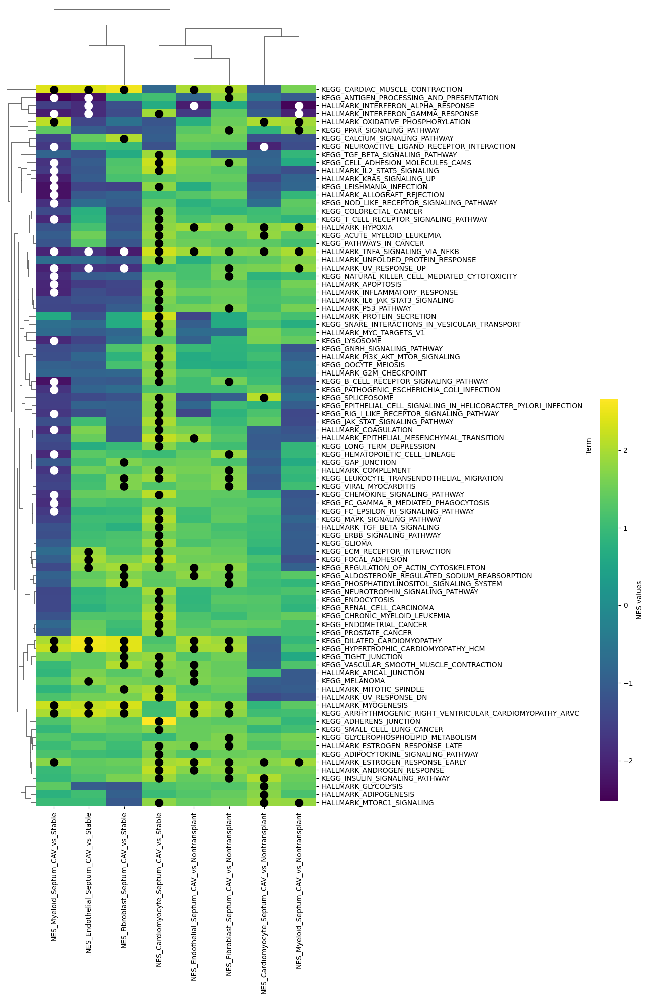

In [104]:
# List of your GSEA CSV files
gsea_files = [
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Stable_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Stable_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Stable_DESeq2_GSEA.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Nontransplant_DESeq2_GSEA.csv"
]

# Load each CSV into a dictionary like gsea_result_custom
gsea_result_custom = {}
for f in gsea_files:
    key = os.path.basename(f).replace("_DESeq2_GSEA.csv", "")
    df = pd.read_csv(f, index_col=0)
    # Wrap it in a small object with 'res2d' attribute to mimic gp.prerank output
    class DummyGSEA:
        def __init__(self, df):
            self.res2d = df
    gsea_result_custom[key] = DummyGSEA(df)
    
# Step 2: merge GSEA results into one DataFrame
merged_df = merge_gsea_results(gsea_result_custom)

# Step 3: filter by significance and consistent direction
filtered_df, nes_cols, qval_cols = filter_gsea_df(merged_df, min_datasets=1, fdr_threshold=0.05)

# Step 4: build significance matrix
sig_matrix = build_significance_matrix(filtered_df, nes_cols, qval_cols, thresholds=(0.05, 0.01, 0.001))

# Step 5: plot the clustered heatmap
plot_gsea_heatmap(filtered_df, nes_cols, sig_matrix)


2025-12-10 20:38:33 | [INFO] maxp pruned
2025-12-10 20:38:33 | [INFO] cmap pruned
2025-12-10 20:38:33 | [INFO] kern dropped
2025-12-10 20:38:33 | [INFO] post pruned
2025-12-10 20:38:33 | [INFO] FFTM dropped
2025-12-10 20:38:33 | [INFO] GPOS pruned
2025-12-10 20:38:33 | [INFO] GSUB pruned
2025-12-10 20:38:33 | [INFO] name pruned
2025-12-10 20:38:33 | [INFO] glyf pruned
2025-12-10 20:38:33 | [INFO] Added gid0 to subset
2025-12-10 20:38:33 | [INFO] Added first four glyphs to subset
2025-12-10 20:38:33 | [INFO] Closing glyph list over 'GSUB': 55 glyphs before
2025-12-10 20:38:33 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'H18533', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'a', 'b', 'c', 'd', 'e', 'five', 'h', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
2025-12-10 20:38:33 | [INFO] Glyph IDs:   [0, 1, 2, 3, 19

✅ Heatmap exported to PDF: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/GSEA_all_cells.pdf


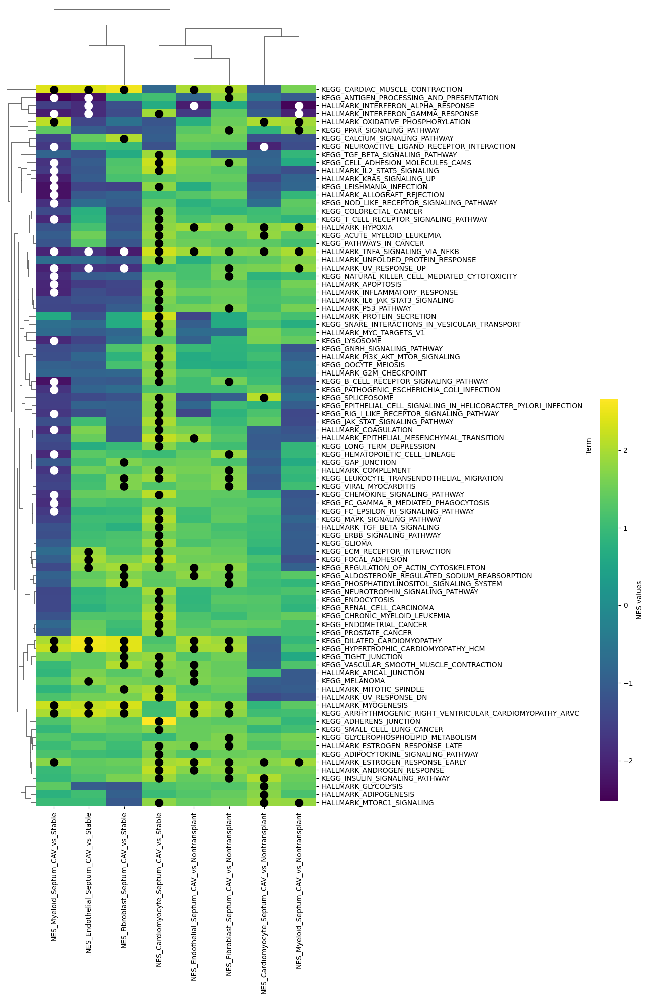

In [105]:
# This will export a plot as a PDF

def plot_gsea_heatmap(filtered_df, nes_cols, sig_matrix, figsize=(12, 20), cmap='viridis', pdf_path=None):
    """
    Plot clustered heatmap of NES values with significance overlay and optionally save to PDF.
    """
    data = filtered_df.set_index('Term')[nes_cols].fillna(0)
    
    g = sns.clustermap(
        data,
        method='average',
        cmap=cmap,
        figsize=figsize,
        cbar_kws={"label": "NES values", "shrink": 0.5},
        xticklabels=True,
        yticklabels=True,
        dendrogram_ratio=(.1, .1),
        cbar_pos=(1, .2, .03, .4)
    )

    # Reorder significance matrix to match clustering
    row_order = g.dendrogram_row.reordered_ind
    col_order = g.dendrogram_col.reordered_ind
    sig_reordered = sig_matrix.iloc[row_order, :].iloc[:, col_order]
    data_reordered = data.iloc[row_order, :].iloc[:, col_order]

    # Overlay significance dots
    for y in range(data_reordered.shape[0]):
        for x in range(data_reordered.shape[1]):
            val = data_reordered.iloc[y, x]
            sig = sig_reordered.iloc[y, x]
            if sig:
                color = 'white' if val < 0 else 'black'
                g.ax_heatmap.text(x + 0.5, y + 0.5, sig, ha='center', va='center', color=color, fontsize=16)

    if pdf_path:
        plt.savefig(pdf_path, bbox_inches='tight')
        print(f"✅ Heatmap exported to PDF: {pdf_path}")

    plt.show()
    return g

# ----------------------------
# Usage
# ----------------------------
pdf_out = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/GSEA_all_cells.pdf"

plot_gsea_heatmap(filtered_df, nes_cols, sig_matrix, pdf_path=pdf_out)

2025-12-10 20:38:39 | [INFO] maxp pruned
2025-12-10 20:38:39 | [INFO] cmap pruned
2025-12-10 20:38:39 | [INFO] kern dropped
2025-12-10 20:38:39 | [INFO] post pruned
2025-12-10 20:38:39 | [INFO] FFTM dropped
2025-12-10 20:38:39 | [INFO] GPOS pruned
2025-12-10 20:38:39 | [INFO] GSUB pruned
2025-12-10 20:38:39 | [INFO] name pruned
2025-12-10 20:38:39 | [INFO] glyf pruned
2025-12-10 20:38:39 | [INFO] Added gid0 to subset
2025-12-10 20:38:39 | [INFO] Added first four glyphs to subset
2025-12-10 20:38:39 | [INFO] Closing glyph list over 'GSUB': 57 glyphs before
2025-12-10 20:38:39 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'W', 'a', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'zero']
2025-12-10 20:38:

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots/Endothelial_Septum_CAV_vs_Nontransplant_HALLMARK_TGF_BETA_SIGNALING.pdf


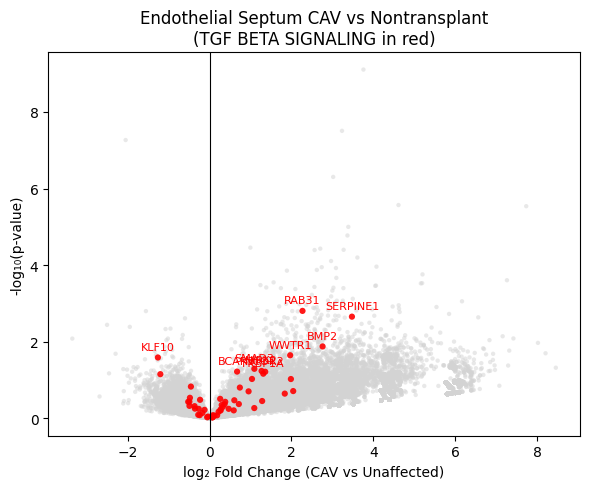

2025-12-10 20:38:43 | [INFO] maxp pruned
2025-12-10 20:38:43 | [INFO] cmap pruned
2025-12-10 20:38:43 | [INFO] kern dropped
2025-12-10 20:38:43 | [INFO] post pruned
2025-12-10 20:38:43 | [INFO] FFTM dropped
2025-12-10 20:38:43 | [INFO] GPOS pruned
2025-12-10 20:38:43 | [INFO] GSUB pruned
2025-12-10 20:38:43 | [INFO] name pruned
2025-12-10 20:38:43 | [INFO] glyf pruned
2025-12-10 20:38:43 | [INFO] Added gid0 to subset
2025-12-10 20:38:43 | [INFO] Added first four glyphs to subset
2025-12-10 20:38:43 | [INFO] Closing glyph list over 'GSUB': 59 glyphs before
2025-12-10 20:38:43 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'W', 'a', 'b', 'c', 'd', 'e', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'zero']

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots/Endothelial_Septum_CAV_vs_Stable_HALLMARK_TGF_BETA_SIGNALING.pdf


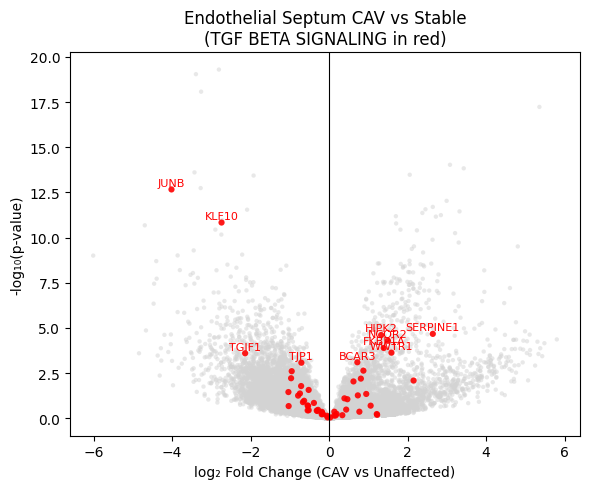

2025-12-10 20:38:47 | [INFO] maxp pruned
2025-12-10 20:38:47 | [INFO] cmap pruned
2025-12-10 20:38:47 | [INFO] kern dropped
2025-12-10 20:38:47 | [INFO] post pruned
2025-12-10 20:38:47 | [INFO] FFTM dropped
2025-12-10 20:38:47 | [INFO] GPOS pruned
2025-12-10 20:38:47 | [INFO] GSUB pruned
2025-12-10 20:38:47 | [INFO] name pruned
2025-12-10 20:38:47 | [INFO] glyf pruned
2025-12-10 20:38:47 | [INFO] Added gid0 to subset
2025-12-10 20:38:47 | [INFO] Added first four glyphs to subset
2025-12-10 20:38:47 | [INFO] Closing glyph list over 'GSUB': 57 glyphs before
2025-12-10 20:38:47 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'V', 'Y', 'a', 'b', 'c', 'd', 'e', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'zero']
2025-12-10 20:38:4

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots/Fibroblast_Septum_CAV_vs_Nontransplant_HALLMARK_TGF_BETA_SIGNALING.pdf


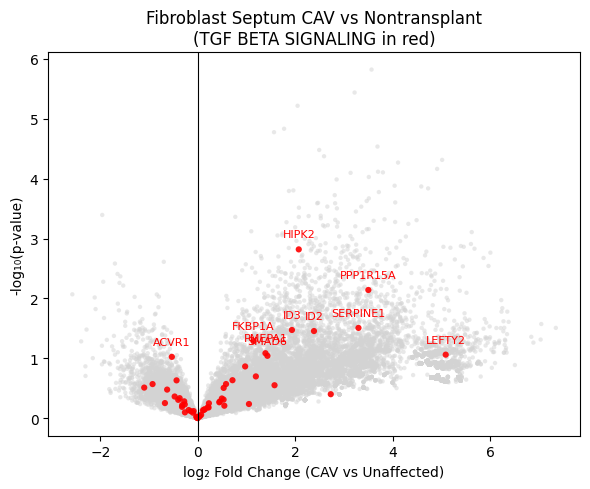

2025-12-10 20:38:50 | [INFO] maxp pruned
2025-12-10 20:38:50 | [INFO] cmap pruned
2025-12-10 20:38:50 | [INFO] kern dropped
2025-12-10 20:38:50 | [INFO] post pruned
2025-12-10 20:38:50 | [INFO] FFTM dropped
2025-12-10 20:38:50 | [INFO] GPOS pruned
2025-12-10 20:38:50 | [INFO] GSUB pruned
2025-12-10 20:38:50 | [INFO] name pruned
2025-12-10 20:38:50 | [INFO] glyf pruned
2025-12-10 20:38:50 | [INFO] Added gid0 to subset
2025-12-10 20:38:50 | [INFO] Added first four glyphs to subset
2025-12-10 20:38:50 | [INFO] Closing glyph list over 'GSUB': 58 glyphs before
2025-12-10 20:38:50 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'zero']
2025-12-1

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots/Fibroblast_Septum_CAV_vs_Stable_HALLMARK_TGF_BETA_SIGNALING.pdf


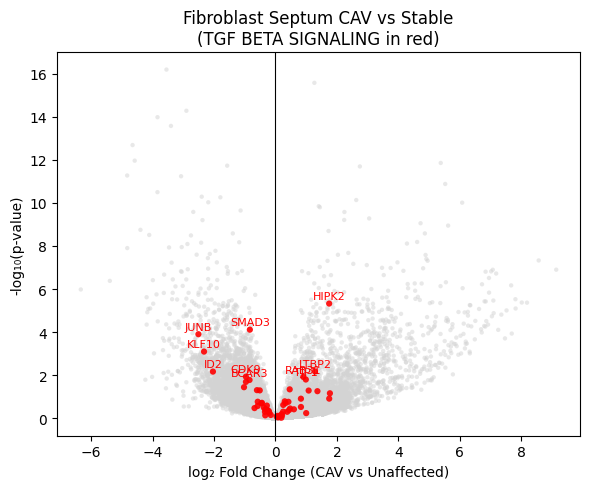

2025-12-10 20:38:54 | [INFO] maxp pruned
2025-12-10 20:38:55 | [INFO] cmap pruned
2025-12-10 20:38:55 | [INFO] kern dropped
2025-12-10 20:38:55 | [INFO] post pruned
2025-12-10 20:38:55 | [INFO] FFTM dropped
2025-12-10 20:38:55 | [INFO] GPOS pruned
2025-12-10 20:38:55 | [INFO] GSUB pruned
2025-12-10 20:38:55 | [INFO] name pruned
2025-12-10 20:38:55 | [INFO] glyf pruned
2025-12-10 20:38:55 | [INFO] Added gid0 to subset
2025-12-10 20:38:55 | [INFO] Added first four glyphs to subset
2025-12-10 20:38:55 | [INFO] Closing glyph list over 'GSUB': 58 glyphs before
2025-12-10 20:38:55 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'y', 'zero']
2025-12-

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots/Cardiomyocyte_Septum_CAV_vs_Nontransplant_HALLMARK_TGF_BETA_SIGNALING.pdf


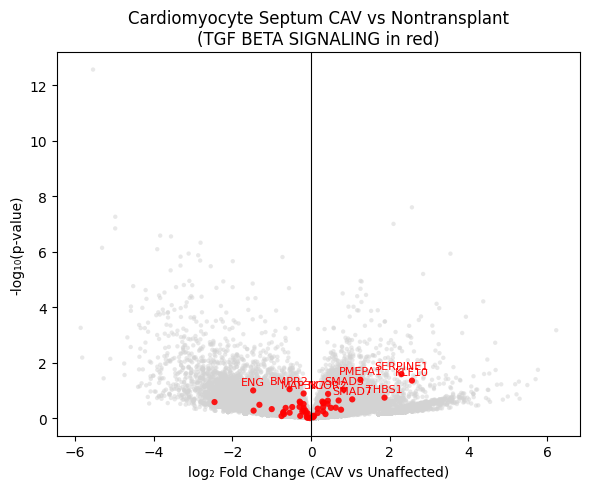

2025-12-10 20:38:58 | [INFO] maxp pruned
2025-12-10 20:38:58 | [INFO] cmap pruned
2025-12-10 20:38:58 | [INFO] kern dropped
2025-12-10 20:38:58 | [INFO] post pruned
2025-12-10 20:38:58 | [INFO] FFTM dropped
2025-12-10 20:38:58 | [INFO] GPOS pruned
2025-12-10 20:38:59 | [INFO] GSUB pruned
2025-12-10 20:38:59 | [INFO] name pruned
2025-12-10 20:38:59 | [INFO] glyf pruned
2025-12-10 20:38:59 | [INFO] Added gid0 to subset
2025-12-10 20:38:59 | [INFO] Added first four glyphs to subset
2025-12-10 20:38:59 | [INFO] Closing glyph list over 'GSUB': 58 glyphs before
2025-12-10 20:38:59 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'a', 'b', 'c', 'd', 'e', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'y', 'zero']
2025-12-10 2

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots/Cardiomyocyte_Septum_CAV_vs_Stable_HALLMARK_TGF_BETA_SIGNALING.pdf


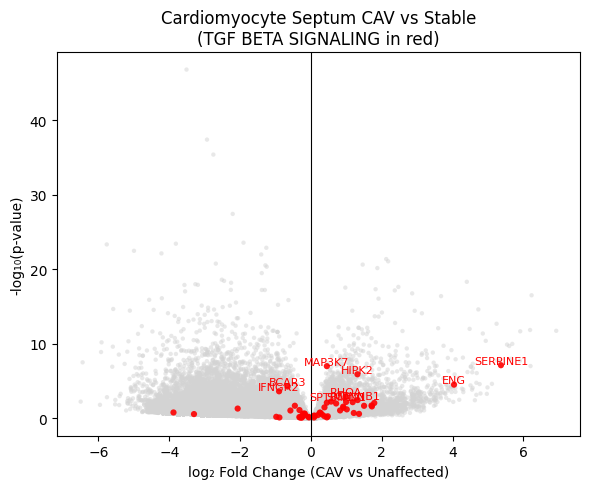

2025-12-10 20:39:02 | [INFO] maxp pruned
2025-12-10 20:39:02 | [INFO] cmap pruned
2025-12-10 20:39:02 | [INFO] kern dropped
2025-12-10 20:39:02 | [INFO] post pruned
2025-12-10 20:39:02 | [INFO] FFTM dropped
2025-12-10 20:39:02 | [INFO] GPOS pruned
2025-12-10 20:39:02 | [INFO] GSUB pruned
2025-12-10 20:39:02 | [INFO] name pruned
2025-12-10 20:39:02 | [INFO] glyf pruned
2025-12-10 20:39:02 | [INFO] Added gid0 to subset
2025-12-10 20:39:02 | [INFO] Added first four glyphs to subset
2025-12-10 20:39:02 | [INFO] Closing glyph list over 'GSUB': 58 glyphs before
2025-12-10 20:39:02 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'V', 'a', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'y', 'zero']
2025-12-1

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots/Myeloid_Septum_CAV_vs_Nontransplant_HALLMARK_TGF_BETA_SIGNALING.pdf


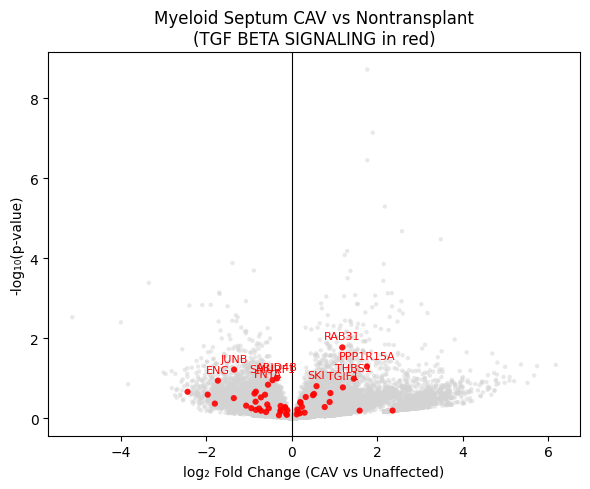

2025-12-10 20:39:05 | [INFO] maxp pruned
2025-12-10 20:39:05 | [INFO] cmap pruned
2025-12-10 20:39:05 | [INFO] kern dropped
2025-12-10 20:39:05 | [INFO] post pruned
2025-12-10 20:39:05 | [INFO] FFTM dropped
2025-12-10 20:39:05 | [INFO] GPOS pruned
2025-12-10 20:39:05 | [INFO] GSUB pruned
2025-12-10 20:39:05 | [INFO] name pruned
2025-12-10 20:39:05 | [INFO] glyf pruned
2025-12-10 20:39:05 | [INFO] Added gid0 to subset
2025-12-10 20:39:05 | [INFO] Added first four glyphs to subset
2025-12-10 20:39:05 | [INFO] Closing glyph list over 'GSUB': 59 glyphs before
2025-12-10 20:39:05 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'I', 'J', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'y', 'zero']
2

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots/Myeloid_Septum_CAV_vs_Stable_HALLMARK_TGF_BETA_SIGNALING.pdf


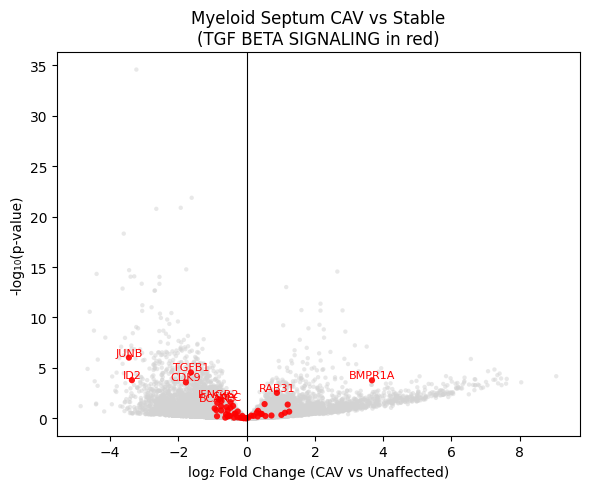

In [106]:
target_files = [
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Endothelial_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Fibroblast_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Cardiomyocyte_Septum_CAV_vs_Stable_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Nontransplant_DESeq2.csv",
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudobulkAllCells/Myeloid_Septum_CAV_vs_Stable_DESeq2.csv",
]
pathway_name = "HALLMARK_TGF_BETA_SIGNALING"
#pathway_name = "HALLMARK_TNFA_SIGNALING_VIA_NFKB"
#pathway_name = "HALLMARK_OXIDATIVE_PHOSPHORYLATION"
#pathway_name = "HALLMARK_INTERFERON_GAMMA_RESPONSE"
#pathway_name = "HALLMARK_HYPOXIA"


# Assume you’ve already done
# Kegg_2023 = read_gmt("/labs/Murphy/SharedCondaEnv/Output2024_TardbpGrant/c2.cp.kegg_legacy.v2023.2.Hs.symbols.gmt")
# Hallmark_2023 = read_gmt("/labs/Murphy/SharedCondaEnv/Output2024_TardbpGrant/h.all.v2023.2.Hs.symbols.gmt")

output_dir = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_Plots"
os.makedirs(output_dir, exist_ok=True)

pathway_genes = set(Hallmark_2023[pathway_name])

for target_file in target_files:
    df = pd.read_csv(target_file, index_col=0)

    # Clean numeric columns
    df['log2FoldChange'] = pd.to_numeric(df['log2FoldChange'], errors='coerce')
    df['pvalue'] = pd.to_numeric(df['pvalue'], errors='coerce')
    df = df.dropna(subset=['log2FoldChange', 'pvalue'])

    # Compute -log10(pvalue)
    df['-log10(pvalue)'] = -np.log10(df['pvalue'])
    df['in_pathway'] = df.index.isin(pathway_genes)

    # Label top 5 in pathway by significance
    top5 = df[df['in_pathway']].nlargest(10, '-log10(pvalue)')

    # Extract condition info for title
    base_name = os.path.basename(target_file).replace("_DESeq2.csv", "")
    title = base_name.replace("_", " ")

    # -----------------------
    # Plot
    # -----------------------
    plt.figure(figsize=(6, 5))

    # Background genes
    plt.scatter(
        df.loc[~df['in_pathway'], 'log2FoldChange'],
        df.loc[~df['in_pathway'], '-log10(pvalue)'],
        color='lightgrey', s=10, alpha=0.5, edgecolor='none'
    )

    # Pathway genes
    plt.scatter(
        df.loc[df['in_pathway'], 'log2FoldChange'],
        df.loc[df['in_pathway'], '-log10(pvalue)'],
        color='red', s=20, alpha=0.9, edgecolor='none'
    )

    # Annotate top 5
    for gene, row in top5.iterrows():
        plt.text(
            row['log2FoldChange'],
            row['-log10(pvalue)'] + 0.2,
            gene,
            fontsize=8,
            color='red',
            ha='center'
        )

    # Add custom styling
    plt.axvline(0, color='black', lw=0.8)
    plt.xlabel('log₂ Fold Change (CAV vs Unaffected)')
    plt.ylabel('-log₁₀(p-value)')
    plt.title(f"{title}\n({pathway_name.replace('HALLMARK_', '').replace('_', ' ')} in red)")
    plt.tight_layout()
    # -----------------------
    # Save to PDF
    # -----------------------
    pdf_path = os.path.join(output_dir, f"{base_name}_{pathway_name}.pdf")
    plt.savefig(pdf_path, format='pdf')
    print(f"Saved plot to {pdf_path}")

    plt.show()

# Plot individual genes - first normalizing counts and then running

In [107]:
from sklearn.preprocessing import quantile_transform

# -----------------------------
# Extract counts
# -----------------------------
counts_df = pd.DataFrame(
    pdata_all_source.X,
    index=pdata_all_source.obs_names,
    columns=pdata_all_source.var_names
)

# -----------------------------
# Compute CPM
# -----------------------------
library_sizes = counts_df.sum(axis=1)
cpm_df = counts_df.div(library_sizes, axis=0) * 1e6

# -----------------------------
# Log1p
# -----------------------------
log_cpm_df = np.log1p(cpm_df)

# -----------------------------
# Quantile normalization
# -----------------------------
qn_df = pd.DataFrame(
    quantile_transform(log_cpm_df, axis=0, copy=True),
    index=log_cpm_df.index,
    columns=log_cpm_df.columns
)

# -----------------------------
# Save back into the AnnData object
# -----------------------------
pdata_all_source_norm = pdata_all_source.copy()
pdata_all_source_norm.X = qn_df.values

# -----------------------------
# Save as h5ad
# -----------------------------
pdata_all_source_norm.write(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_pseudobulk_all_cells_log1p_cpm_qn.h5ad"
)

print("✅ Normalized pseudobulk saved as h5ad")


✅ Normalized pseudobulk saved as h5ad


In [ ]:
# Path to your file
adata_path = "/labs/Murphy/DataForChris/2025May_CAV_10xDataAnalysis/pseudobulk_all_cells_log1p_cpm_qn.h5ad"

# Load the AnnData object
pdata_all_source_norm = sc.read_h5ad(adata_path)

In [108]:
pdata_all_source_norm

AnnData object with n_obs × n_vars = 363 × 31844
    obs: 'index', 'BatchSouporcell', 'cell_type_general_DiseaseStatus_Location_SampleType_GraftHostRefine', 'souporcell_status', 'souporcell_assignment', 'souporcell_statusMerge', 'souporcell_assignmentMerge', '10xRxn', 'source', 'total_counts_CITESeq_FreeOligo_BC82', 'SampleType', 'BankSource', 'Location', 'Day', 'ConfidenceOnHashing', 'DiseaseStatus', 'TimePoint', 'BetweenSampleSC_Validations', 'GraftHost', 'RA_mean', 'RV_systolic', 'RV_diastolic', 'PA_systolic', 'PA_diastolic', 'PA_mean', 'PCW', 'AV_O2', 'CO', 'CI', 'PVR', 'EF_preop', 'Sample ID:', 'acute_rejection_grade', 'AcuteCellularRejection', 'AntibodyMediatedRejection', 'pAMR', 'allograft_vasculopathy', 'max_stenosis_%', 'thrombosis', 'myocardial_infarct', 'fibrosis', 'other_key_findings', 'LocationFine', 'doublet', 'StrippedDonor', 'sampleID', 'cell_type_general', 'cell_type_general_with_counts', 'GraftHostRefine', 'psbulk_cells', 'psbulk_counts', 'souporcell_statusBatch', 'so

In [109]:
def plot_pseudobulk_boxplot(
    adata,
    gene: str,
    filters: dict = None,
    min_cells: int = 0,
    group_by: str = "DiseaseStatus",
    log_transform: bool = True,
    figsize=(6, 4),
    save_pdf: bool = True,
    output_dir: str = "."
):
    """
    Plot pseudobulk expression for a single gene across groups,
    with optional filtering by metadata and minimum number of cells,
    and save as PDF.

    Parameters
    ----------
    adata : AnnData
        Pseudobulk AnnData (e.g., from decoupler.pp.pseudobulk).
    gene : str
        Gene to plot (must exist in adata.var_names).
    filters : dict
        Dictionary of filters, e.g.:
        {'cell_type_general': 'Endothelial', 'Location': 'Septum'}
    min_cells : int
        Minimum number of cells in a pseudobulk sample to include.
    group_by : str
        Column in .obs to use for grouping on the x-axis.
    log_transform : bool
        Apply log1p transform to expression values.
    figsize : tuple
        Figure size.
    save_pdf : bool
        Whether to save the plot as a PDF.
    output_dir : str
        Directory to save the PDF.
    """

    import os
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns

    # ------------------------------
    # 1️⃣ Filter
    # ------------------------------
    adata_filt = adata.copy()
    df_obs = adata_filt.obs.copy()

    if filters:
        for key, value in filters.items():
            if key not in df_obs.columns:
                raise ValueError(f"{key} not found in adata.obs columns.")
            if isinstance(value, (list, tuple, set)):
                adata_filt = adata_filt[adata_filt.obs[key].isin(value)]
            else:
                adata_filt = adata_filt[adata_filt.obs[key] == value]

    # Filter by minimum number of cells
    if "psbulk_cells" not in adata_filt.obs.columns:
        raise ValueError("adata.obs does not contain 'psbulk_cells'.")
    adata_filt = adata_filt[adata_filt.obs["psbulk_cells"] >= min_cells]

    print(f"Filtered to {adata_filt.n_obs} pseudobulk samples with >= {min_cells} cells.")

    # ------------------------------
    # 2️⃣ Gene check
    # ------------------------------
    if gene not in adata_filt.var_names:
        raise ValueError(f"Gene '{gene}' not found in adata.var_names")

    # ------------------------------
    # 3️⃣ Prepare DataFrame
    # ------------------------------
    expr = adata_filt[:, gene].X
    expr = np.array(expr).flatten()

    df_plot = pd.DataFrame({
        "Expression": expr,
        group_by: adata_filt.obs[group_by].values
    })

    if log_transform:
        df_plot["Expression"] = np.log1p(df_plot["Expression"])


    # ------------------------------
    # 4️⃣ Plot
    # ------------------------------
    plt.figure(figsize=figsize)

    # Set a common font (vector-friendly, editable in Illustrator)
    mpl.rcParams['pdf.fonttype'] = 42
    mpl.rcParams['ps.fonttype'] = 42
    mpl.rcParams['font.family'] = 'DejaVu Sans'
    
    # Make boxes narrower: width=0.4 (default is 0.8)
    sns.boxplot(
        data=df_plot, 
        x=group_by, 
        y="Expression", 
        color="white", 
        fliersize=0, 
        linewidth=1,
        width=0.4
    )
    
    # Define custom color palette for stripplot points
    # Example: red, darker red, darkest red, black, grey
    custom_colors = ["#FF4D4D", "#CC0000", "#660000", "black", "grey"]
    
    # Apply stripplot with custom colors
    sns.stripplot(
        data=df_plot, 
        x=group_by, 
        y="Expression", 
        hue=group_by,
        dodge=False, 
        jitter=0.2, 
        alpha=0.7, 
        size=6,
        palette=custom_colors
    )
    
    plt.title(f"{gene} expression by {group_by}")
    plt.ylabel("log₁₊(Pseudobulk counts)" if log_transform else "Pseudobulk counts")
    plt.xlabel(group_by)
    plt.legend([], [], frameon=False)
    plt.tight_layout()

    # ------------------------------
    # 5️⃣ Save PDF
    # ------------------------------
    if save_pdf:
        os.makedirs(output_dir, exist_ok=True)
        filename = os.path.join(output_dir, f"{gene}_pseudobulk_boxplot.pdf")
        plt.savefig(filename)
        print(f"Saved plot to {filename}")

    plt.show()


Filtered to 28 pseudobulk samples with >= 50 cells.


2025-12-10 20:39:26 | [INFO] maxp pruned
2025-12-10 20:39:26 | [INFO] cmap pruned
2025-12-10 20:39:26 | [INFO] kern dropped
2025-12-10 20:39:26 | [INFO] post pruned
2025-12-10 20:39:26 | [INFO] FFTM dropped
2025-12-10 20:39:26 | [INFO] GPOS pruned
2025-12-10 20:39:26 | [INFO] GSUB pruned
2025-12-10 20:39:26 | [INFO] name pruned
2025-12-10 20:39:26 | [INFO] glyf pruned
2025-12-10 20:39:26 | [INFO] Added gid0 to subset
2025-12-10 20:39:26 | [INFO] Added first four glyphs to subset
2025-12-10 20:39:26 | [INFO] Closing glyph list over 'GSUB': 45 glyphs before
2025-12-10 20:39:26 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'I', 'L', 'N', 'P', 'R', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'five', 'four', 'g', 'i', 'j', 'k', 'l', 'n', 'nonmarkingreturn', 'o', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'uni2081', 'uni208A', 'x', 'y', 'zero']
2025-12-10 20:39:26 | [INFO] Glyph IDs:   [0, 1, 2, 3, 11, 12, 17, 19, 21, 22, 23, 24,

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/SingleGene_plots/IL4R_pseudobulk_boxplot.pdf


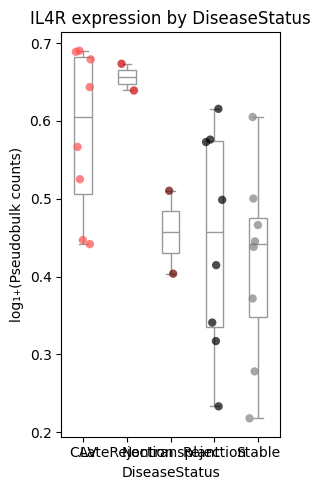

In [110]:
plot_pseudobulk_boxplot(
    adata=pdata_all_source_norm,
    gene="IL4R",
    filters={"cell_type_general": "Endothelial", "Location": "Septum"},
    min_cells=50,
    group_by="DiseaseStatus",
    log_transform=True,
    figsize=(3, 5),
    save_pdf=True,
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/SingleGene_plots"
)

# PTBP1 protein analysis in endothelium

## Initial look at protein levels and filtering

In [6]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_endothelial_reclust.h5ad"
adata_EC_subset = sc.read_h5ad(output_path)

In [7]:
adata_EC_subset

AnnData object with n_obs × n_vars = 33961 × 31844
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_coun

In [8]:
adata_EC_subset.obs["doublet"].value_counts()


doublet
False    33961
Name: count, dtype: int64

In [9]:
explant_subset = adata_EC_subset[
    (adata_EC_subset.obs['SampleType'] == 'HeartTissue')
].copy()

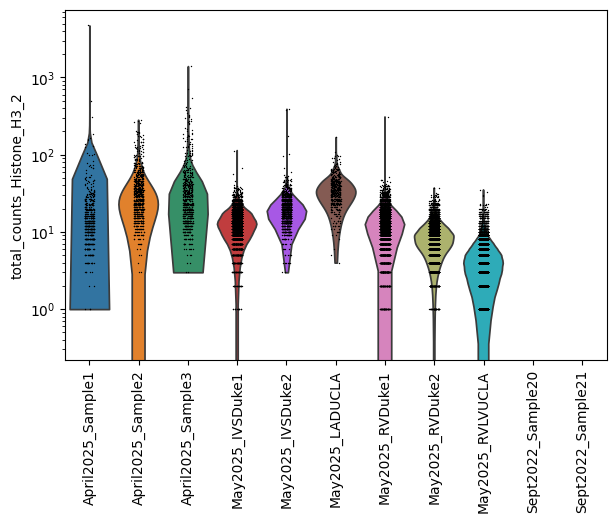

In [10]:
sc.pl.violin(adata_EC_subset, keys=['total_counts_Histone_H3_2'], groupby='10xRxn', log="True", rotation=90)

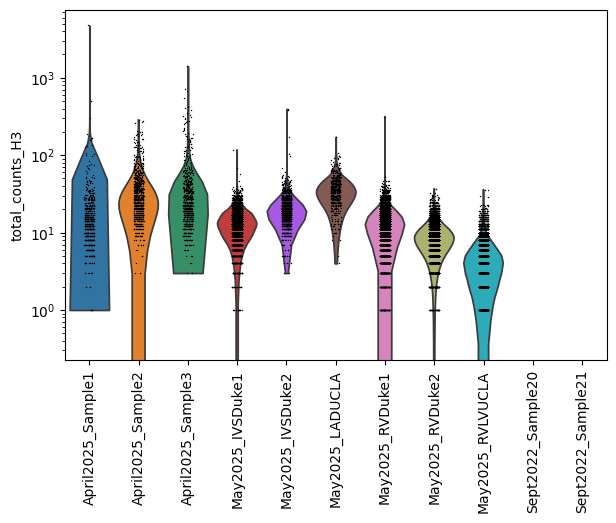

In [11]:
sc.pl.violin(adata_EC_subset, keys=['total_counts_H3'], groupby='10xRxn', log="True", rotation=90)

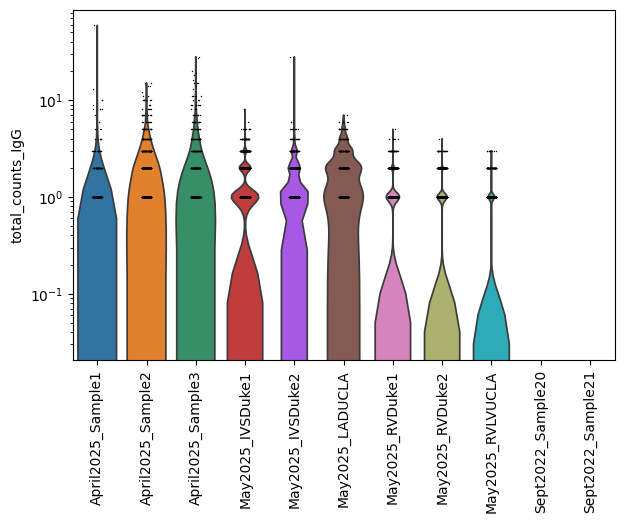

In [12]:
sc.pl.violin(adata_EC_subset, keys=['total_counts_IgG'], groupby='10xRxn', log="True", rotation=90)

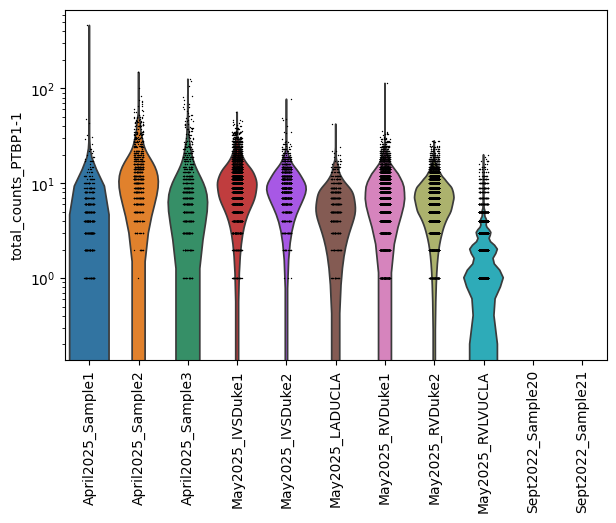

In [13]:
sc.pl.violin(adata_EC_subset, keys=['total_counts_PTBP1-1'], groupby='10xRxn', log="True", rotation=90)

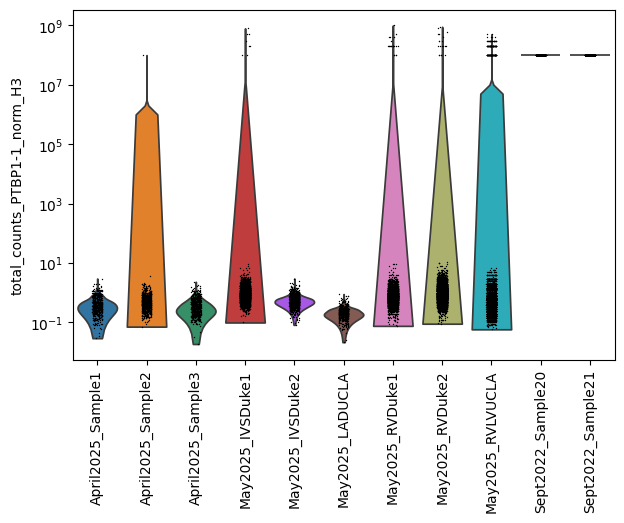

In [14]:
sc.pl.violin(adata_EC_subset, keys=['total_counts_PTBP1-1_norm_H3'], groupby='10xRxn', log="True", rotation=90)

## Violin plots by donor

In [15]:
# Keep cells where total_counts_H3 >= 1
adata_EC_subset = adata_EC_subset[adata_EC_subset.obs['total_counts_H3'] >= 1].copy()

# Optional: check how many cells remain
print(f"Number of cells after filtering: {adata_EC_subset.n_obs}")


Number of cells after filtering: 31423


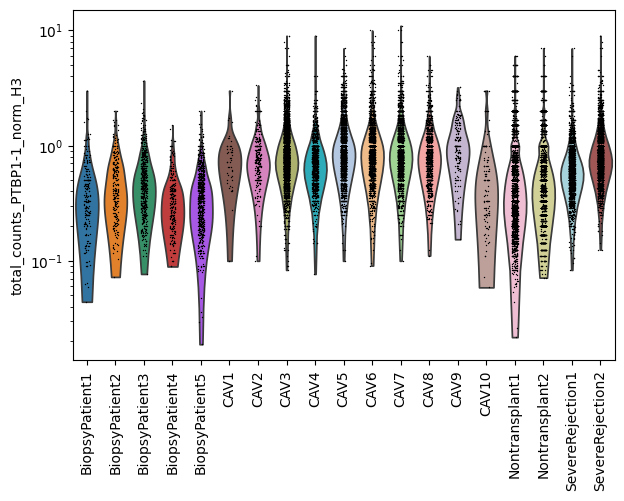

In [16]:
sc.pl.violin(adata_EC_subset, keys=['total_counts_PTBP1-1_norm_H3'], groupby='StrippedDonor', log="True", rotation=90)

In [17]:
adata_EC_subset_plot = adata_EC_subset.copy()

import matplotlib as mpl
mpl.rcParams["pdf.fonttype"] = 42   # Embed TrueType (Illustrator-friendly)
mpl.rcParams["ps.fonttype"] = 42
mpl.rcParams["svg.fonttype"] = "none"

# Make donor → status mapping
donor_status_map = {
    "CAV1": "CAV",
    "CAV2": "CAV",
    "CAV3": "CAV",
    "CAV4": "CAV",
    "CAV5": "CAV",
    "CAV6": "CAV",
    "CAV7": "CAV",
    "CAV8": "CAV",
    "CAV9": "CAV",
    "CAV10": "CAV",
#    "SevereRejection1": "LateRejection",
#    "SevereRejection2": "LateRejection",
    "BiopsyPatient1": "Stable",
    "BiopsyPatient2": "Stable",
    "BiopsyPatient3": "Stable",
    "BiopsyPatient4": "Stable",
    "BiopsyPatient5": "Stable",
    "Nontransplant1": "Nontransplant",
    "Nontransplant2": "Nontransplant"
}

# Assign DiseaseStatus
adata_EC_subset_plot.obs["DiseaseStatus"] = adata_EC_subset_plot.obs["StrippedDonor"].map(donor_status_map)

# Custom color scheme for statuses
status_colors = {
    "CAV": "red",
    "Stable": "blue",
    "Nontransplant": "purple"
}

donor_order = list(donor_status_map.keys())
donor_colors = [status_colors[donor_status_map[d]] for d in donor_order]

# Plot and save as PDF
output_pdf = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Ptbp1H3_counts_by_sample_violin.pdf"

sc.pl.violin(
    adata_EC_subset_plot,
    keys=["total_counts_PTBP1-1_norm_H3"],
    groupby="StrippedDonor",
    log=True,
    rotation=90,
    order=donor_order,
    palette=donor_colors,
    show=False,
    save=None  # Disable Scanpy’s default save behavior
)

plt.tight_layout()
plt.savefig(output_pdf, bbox_inches='tight')
plt.close()

print(f"✅ Violin plot saved to: {output_pdf}")

... storing 'DiseaseStatus' as categorical
2026-01-21 10:03:46 | [INFO] maxp pruned
2026-01-21 10:03:46 | [INFO] cmap pruned
2026-01-21 10:03:46 | [INFO] kern dropped
2026-01-21 10:03:46 | [INFO] post pruned
2026-01-21 10:03:46 | [INFO] FFTM dropped
2026-01-21 10:03:46 | [INFO] GPOS pruned
2026-01-21 10:03:46 | [INFO] GSUB pruned
2026-01-21 10:03:46 | [INFO] name pruned
2026-01-21 10:03:46 | [INFO] glyf pruned
2026-01-21 10:03:46 | [INFO] Added gid0 to subset
2026-01-21 10:03:46 | [INFO] Added first four glyphs to subset
2026-01-21 10:03:46 | [INFO] Closing glyph list over 'GSUB': 39 glyphs before
2026-01-21 10:03:46 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'H', 'N', 'P', 'T', 'V', 'a', 'c', 'e', 'eight', 'five', 'four', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2026-01-21 10:03:46 | [INFO] Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23, 2

✅ Violin plot saved to: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Ptbp1H3_counts_by_sample_violin.pdf


## Endothelial PTBP1 protein to cardiovascular parameters across all samples

In [18]:
adata_EC_subset.obs

,souporcell_status,souporcell_assignment,souporcell_statusBatch,souporcell_assignmentBatch,souporcell_statusMerge,souporcell_assignmentMerge,demux_type,assignment,hashtag_counts,demux_confidence,...,n_genes,doublet,doublet_scores,leiden,StrippedDonor,sampleID,leiden_with_counts,cell_type_general,cell_type_general_with_counts,GraftHostRefine
2434,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,2879.0,0.674969,...,3161,False,0.010884,1,CAV3,May2025_IVSDuke1_7_CAV3_Septum_2204.0,21 (n=788),Endothelial,Endothelial (n=41430),Graft
2447,singlet,7,singlet,1,singlet,7,singlet,NuclearPoreHash3_cellranger,5413.0,0.813182,...,3385,False,0.017047,1,CAV3,May2025_IVSDuke1_7_CAV3_Septum_2204.0,21 (n=788),Endothelial,Endothelial (n=41430),Graft
2583,singlet,7,doublet,1/6,singlet,7,singlet,NuclearPoreHash3_cellranger,8749.0,0.910119,...,3187,False,0.196117,1,CAV3,May2025_IVSDuke1_7_CAV3_Septum_2204.0,21 (n=788),Endothelial,Endothelial (n=41430),Graft
2899,singlet,17,singlet,5,singlet,17,doublet,"NuclearPoreHash7_cellranger,NuclearPoreHash8_c...",5743.0,0.907512,...,3541,False,0.153971,4,CAV5,May2025_IVSDuke1_17_CAV5_Septum_2701.0,18 (n=1162),Endothelial,Endothelial (n=41430),Graft
3275,singlet,7,doublet,1/6,singlet,7,doublet,"NuclearPoreHash3_cellranger,NuclearPoreHash1_c...",10344.0,0.872558,...,2828,False,0.088864,4,CAV3,May2025_IVSDuke1_7_CAV3_Septum_2204.0,21 (n=788),Endothelial,Endothelial (n=41430),Graft
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145591,singlet,0,singlet,0,singlet,0,singlet,NuclearPoreHash3_cellranger,1162.0,0.553157,...,161,False,0.094156,4,BiopsyPatient4,April2025_Sample3_0_BiopsyPatient4_Septum_1717.0,1 (n=22032),Endothelial,Endothelial (n=41430),Graft
145603,singlet,0,singlet,0,singlet,0,singlet,NuclearPoreHash3_cellranger,1100.0,0.913284,...,93,False,0.103093,4,BiopsyPatient4,April2025_Sample3_0_BiopsyPatient4_Septum_1717.0,24 (n=398),Endothelial,Endothelial (n=41430),Graft
145604,singlet,8,singlet,8,singlet,8,singlet,NuclearPoreHash8_cellranger,1134.0,0.963097,...,63,False,0.075606,0,BiopsyPatient5,April2025_Sample3_8_BiopsyPatient5_Septum_8.0,1 (n=22032),Endothelial,Endothelial (n=41430),Graft
145620,singlet,8,singlet,8,singlet,8,unknown,,787.0,1.000000,...,401,False,0.061069,0,BiopsyPatient5,April2025_Sample3_8_BiopsyPatient5_Septum_8.0,1 (n=22032),Endothelial,Endothelial (n=41430),Graft


In [19]:
# Copy obs but remove rows with DiseaseStatus == 'LateRejection'
df = adata_EC_subset.obs[adata_EC_subset.obs['DiseaseStatus'] != 'LateRejection'].copy()

# Define count columns
raw_counts = ['total_counts_PTBP1-1', 'total_counts_IgG', 'total_counts_H3']
normH3_counts = ['total_counts_PTBP1-1_norm_H3', 'total_counts_IgG_norm_H3']
nuclear_pore_counts = [
    'total_counts_PTBP1-1_norm_NuclearPore', 'total_counts_IgG_norm_NuclearPore'
]

# Cardiovascular columns
cardio_cols = [
    'RA_mean', 'RV_systolic', 'RV_diastolic', 'PA_systolic', 'PA_diastolic', 'PA_mean', 'PCW', 'AV_O2', 'CO', 'CI', 'PVR', 'EF_preop'
]

# Ensure cardio_cols exist in .obs
missing_cols = [c for c in cardio_cols if c not in adata_EC_subset.obs.columns]
if missing_cols:
    print("Warning: these columns are missing from .obs:", missing_cols)

# ---- Fix cardio conversion ----
# Convert cardio columns to numeric inside df
for c in cardio_cols:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors='coerce')

# After conversion all existing columns are numeric (NaN allowed)
existing_cols = [c for c in cardio_cols if c in df.columns]
numeric_cardio_cols = existing_cols

# Warn about columns missing entirely
missing_after = set(cardio_cols) - set(existing_cols)
if missing_after:
    print("Missing cardio columns:", missing_after)

# Combine all columns needed
all_cols_needed = ['StrippedDonor', 'GraftHostRefine', 'Location', 'DiseaseStatus'] + raw_counts + normH3_counts + nuclear_pore_counts + cardio_cols
missing_cols = [c for c in all_cols_needed if c not in df.columns]
if missing_cols:
    print("⚠️ Missing columns in adata_EC_subset.obs:", missing_cols)

# 1️⃣ Aggregate per Donor + GraftHostRefine + Location + DiseaseStatus
group_cols_detail = ['StrippedDonor', 'GraftHostRefine', 'Location', 'DiseaseStatus']

summary_detail = df.groupby(group_cols_detail).agg(
    **{f'mean_{c}': (c, 'mean') for c in raw_counts + normH3_counts + nuclear_pore_counts}
).reset_index()
summary_detail['Level'] = 'ByLocation'

# 2️⃣ Aggregate per Donor + GraftHostRefine + DiseaseStatus (all locations)
group_cols_donor = ['StrippedDonor', 'GraftHostRefine', 'DiseaseStatus']

summary_donor = df.groupby(group_cols_donor).agg(
    **{f'mean_{c}': (c, 'mean') for c in raw_counts + normH3_counts + nuclear_pore_counts}
).reset_index()
summary_donor['Level'] = 'ByDonor'
summary_donor['Location'] = 'All'

# 3️⃣ Combine location-level and donor-level
summary_combined = pd.concat([summary_detail, summary_donor], ignore_index=True)

# 4️⃣ Merge cardiovascular data (mean per Donor)
# Identify which cardio columns actually exist and are numeric
existing_cols = [c for c in cardio_cols if c in df.columns]
numeric_cardio_cols = df[existing_cols].select_dtypes(include='number').columns.tolist()

# Warn if any are missing or non-numeric
non_numeric = set(existing_cols) - set(numeric_cardio_cols)
if non_numeric:
    print("Warning: These cardio columns are non-numeric and will be skipped:", non_numeric)

#cardio_df = df.groupby('Donor')[cardio_cols].mean().reset_index()
cardio_df = df.groupby('StrippedDonor')[numeric_cardio_cols].mean().reset_index()
merged_df = pd.merge(summary_combined, cardio_df, on='StrippedDonor', how='left')

# 5️⃣ Export
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Donor_GraftHostRefine_Location_and_Donor_full_counts.xlsx"
merged_df.to_excel(output_path, index=False)
print(f"✅ Exported full summary to: {output_path}")

# Preview
merged_df.head()


✅ Exported full summary to: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Donor_GraftHostRefine_Location_and_Donor_full_counts.xlsx


,StrippedDonor,GraftHostRefine,Location,DiseaseStatus,mean_total_counts_PTBP1-1,mean_total_counts_IgG,mean_total_counts_H3,mean_total_counts_PTBP1-1_norm_H3,mean_total_counts_IgG_norm_H3,mean_total_counts_PTBP1-1_norm_NuclearPore,...,RV_diastolic,PA_systolic,PA_diastolic,PA_mean,PCW,AV_O2,CO,CI,PVR,EF_preop
0,BiopsyPatient1,Graft,LAD,CAV,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,17.0,8.0,11.0,8.0,0.0,3.2,1.6,75.0,62.5
1,BiopsyPatient1,Graft,LAD,LateRejection,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,17.0,8.0,11.0,8.0,0.0,3.2,1.6,75.0,62.5
2,BiopsyPatient1,Graft,LAD,Nontransplant,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,17.0,8.0,11.0,8.0,0.0,3.2,1.6,75.0,62.5
3,BiopsyPatient1,Graft,LAD,Rejection,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,17.0,8.0,11.0,8.0,0.0,3.2,1.6,75.0,62.5
4,BiopsyPatient1,Graft,LAD,Stable,NaN,NaN,NaN,NaN,NaN,NaN,...,3.0,17.0,8.0,11.0,8.0,0.0,3.2,1.6,75.0,62.5


In [20]:
list(merged_df.columns)

['StrippedDonor',
 'GraftHostRefine',
 'Location',
 'DiseaseStatus',
 'mean_total_counts_PTBP1-1',
 'mean_total_counts_IgG',
 'mean_total_counts_H3',
 'mean_total_counts_PTBP1-1_norm_H3',
 'mean_total_counts_IgG_norm_H3',
 'mean_total_counts_PTBP1-1_norm_NuclearPore',
 'mean_total_counts_IgG_norm_NuclearPore',
 'Level',
 'RA_mean',
 'RV_systolic',
 'RV_diastolic',
 'PA_systolic',
 'PA_diastolic',
 'PA_mean',
 'PCW',
 'AV_O2',
 'CO',
 'CI',
 'PVR',
 'EF_preop']

In [21]:
# ----------------------------
# Copy merged_df and filter
# ----------------------------
df = merged_df.copy()
df = df[df['Level'] == 'ByLocation'].copy()

# ----------------------------
# Identify region
# ----------------------------
df['Region'] = df['Location'].apply(
    lambda x: 'Septal' if pd.notna(x) and 'sept' in x.lower() else (
              'Ventricular' if pd.notna(x) and 'vent' in x.lower() else 'Other')
)

# ----------------------------
# Exclude outlier Septal sample
# ----------------------------
#df = df[~((df['Donor'] == '1314') & (df['Region'] == 'Septal'))]

# ----------------------------
# Define cardiovascular factors
# ----------------------------
cv_factors = [
        'RA_mean', 'RV_systolic', 'RV_diastolic', 'PA_systolic', 'PA_diastolic', 'PA_mean', 'PCW', 'AV_O2', 'CO', 'CI', 'PVR', 'EF_preop'
]

# ----------------------------
# Ensure all PTBP1 columns exist
# ----------------------------
ptbp1_cols = {
    'Counts': 'mean_total_counts_PTBP1-1',
    'H3_norm': 'mean_total_counts_PTBP1-1_norm_H3',
    'NuclearPore_norm': 'mean_total_counts_PTBP1-1_norm_NuclearPore',
    'nCLR': 'mean_total_counts_PTBP1-1_nCLR_H3'
}

for name, col in ptbp1_cols.items():
    if col not in df.columns:
        print(f"⚠️ Column {col} missing, creating with NA")
        df[col] = pd.NA

# ----------------------------
# Subsets by region
# ----------------------------
subsets = {
    "Septal": df[df['Region'] == 'Septal'].copy(),
    "Ventricular": df[df['Region'] == 'Ventricular'].copy(),
    "All (normalized)": df[df['Region'].isin(['Septal', 'Ventricular'])].copy()
}

# ----------------------------
# Correlation analysis
# ----------------------------
for ptbp1_name, ptbp1_var in ptbp1_cols.items():
    print(f"\n========== PTBP1 Mode: {ptbp1_name} ==========")
    
    for label, subset_df in subsets.items():
        corrs, pvals = {}, {}
        
        for factor in cv_factors:
            valid_df = subset_df[[ptbp1_var, factor]].dropna()
            if valid_df.shape[0] >= 2:
                corr, pval = spearmanr(valid_df[ptbp1_var], valid_df[factor])
                corrs[factor] = corr
                pvals[factor] = pval
            else:
                corrs[factor], pvals[factor] = float('nan'), float('nan')
        
        # Display correlations
        corr_df = pd.DataFrame({'SpearmanR': corrs, 'pvalue': pvals})
        corr_df = corr_df.sort_values('SpearmanR', key=abs, ascending=False)
        
        print(f"\n--- {label} Samples ---")
        print(corr_df)


⚠️ Column mean_total_counts_PTBP1-1_nCLR_H3 missing, creating with NA

========== PTBP1 Mode: Counts ==========

--- Septal Samples ---
              SpearmanR    pvalue
PVR           -0.488449  0.076365
CI             0.453571  0.089486
CO             0.407041  0.148612
RA_mean        0.384961  0.156509
PCW            0.376250  0.166905
AV_O2          0.340750  0.233184
RV_diastolic   0.239443  0.453530
RV_systolic    0.189637  0.516121
PA_mean        0.152057  0.588516
PA_systolic    0.110011  0.708117
EF_preop       0.091481  0.745751
PA_diastolic   0.059669  0.839427

--- Ventricular Samples ---
              SpearmanR    pvalue
EF_preop      -0.650000  0.058073
CO            -0.464286  0.293934
RA_mean        0.376572  0.317823
PA_systolic    0.371264  0.365202
AV_O2          0.357143  0.431611
PVR            0.342356  0.452251
PCW            0.326363  0.391360
PA_diastolic   0.214286  0.610344
CI            -0.214286  0.610344
PA_mean        0.200000  0.605901
RV_diastolic   0.14

2026-01-21 10:04:01 | [INFO] maxp pruned
2026-01-21 10:04:01 | [INFO] cmap pruned
2026-01-21 10:04:01 | [INFO] kern dropped
2026-01-21 10:04:01 | [INFO] post pruned
2026-01-21 10:04:01 | [INFO] FFTM dropped
2026-01-21 10:04:01 | [INFO] GPOS pruned
2026-01-21 10:04:01 | [INFO] GSUB pruned
2026-01-21 10:04:01 | [INFO] name pruned
2026-01-21 10:04:01 | [INFO] glyf pruned
2026-01-21 10:04:01 | [INFO] Added gid0 to subset
2026-01-21 10:04:01 | [INFO] Added first four glyphs to subset
2026-01-21 10:04:01 | [INFO] Closing glyph list over 'GSUB': 55 glyphs before
2026-01-21 10:04:01 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'H', 'I', 'O', 'P', 'R', 'S', 'T', 'V', 'W', 'a', 'c', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'w', 'y', 'z', 'zero']
2026-01-21 10:04:

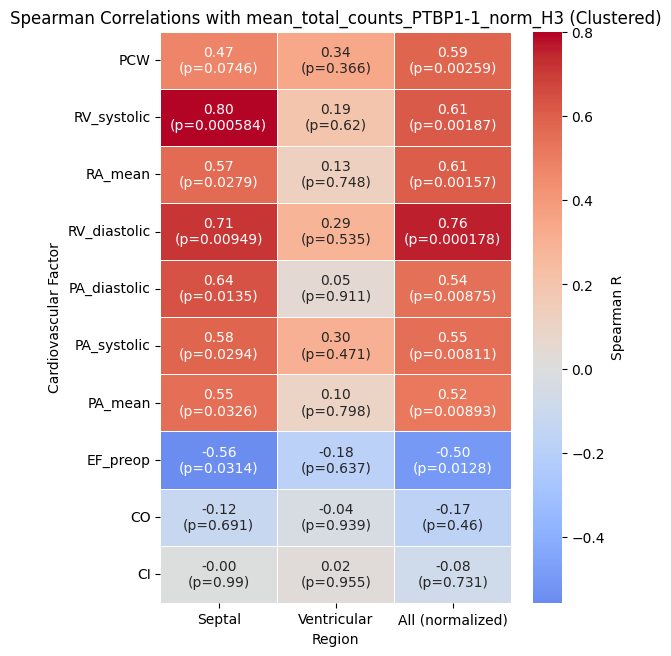

✅ Clustered heatmap with p-values saved to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/CorrelationsPTBP1_HeartFunctions_HeatMap_Clustered.pdf


In [22]:
from scipy.stats import spearmanr
from scipy.cluster.hierarchy import linkage, leaves_list


output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/CorrelationsPTBP1_HeartFunctions_HeatMap_Clustered.pdf"

# Define PTBP1 column and filtered cv_factors
ptbp1_var = 'mean_total_counts_PTBP1-1_norm_H3'
cv_factors_filtered = [f for f in cv_factors if f not in ['AV_O2', 'PVR']]

# Initialize correlation and p-value matrices
corr_matrix = pd.DataFrame(index=cv_factors_filtered, columns=subsets.keys(), dtype=float)
pval_matrix = pd.DataFrame(index=cv_factors_filtered, columns=subsets.keys(), dtype=float)

# Compute correlations
for label, subset_df in subsets.items():
    for factor in cv_factors_filtered:
        valid_df = subset_df[[ptbp1_var, factor]].dropna()
        if valid_df.shape[0] >= 2:
            corr, pval = spearmanr(valid_df[ptbp1_var], valid_df[factor])
            corr_matrix.loc[factor, label] = corr
            pval_matrix.loc[factor, label] = pval
        else:
            corr_matrix.loc[factor, label] = np.nan
            pval_matrix.loc[factor, label] = np.nan

# Hierarchical clustering on rows (cardiovascular factors)
row_linkage = linkage(corr_matrix.fillna(0), method='average', metric='correlation')
row_order = leaves_list(row_linkage)
corr_matrix_clustered = corr_matrix.iloc[row_order]
pval_matrix_clustered = pval_matrix.iloc[row_order]

# Create annotations combining R and p-value
annot_matrix = corr_matrix_clustered.copy().astype(str)
for r in corr_matrix_clustered.index:
    for c in corr_matrix_clustered.columns:
        r_val = corr_matrix_clustered.loc[r, c]
        p_val = pval_matrix_clustered.loc[r, c]
        if pd.isna(r_val) or pd.isna(p_val):
            annot_matrix.loc[r, c] = ""
        else:
            annot_matrix.loc[r, c] = f"{r_val:.2f}\n(p={p_val:.3g})"

# ----------------------------
# Plot heatmap
# ----------------------------
plt.figure(figsize=(6, max(4, len(cv_factors_filtered)/1.5)))
sns.heatmap(
    corr_matrix_clustered,
    annot=annot_matrix,
    fmt='',
    cmap='coolwarm',
    center=0,
    cbar_kws={'label': 'Spearman R'},
    linewidths=0.5
)
plt.title(f"Spearman Correlations with {ptbp1_var} (Clustered)")
plt.ylabel('Cardiovascular Factor')
plt.xlabel('Region')
plt.tight_layout()

# Save to PDF
plt.savefig(output_path)
plt.show()
plt.close()
print(f"✅ Clustered heatmap with p-values saved to {output_path}")



2026-01-21 10:04:05 | [INFO] maxp pruned
2026-01-21 10:04:05 | [INFO] cmap pruned
2026-01-21 10:04:05 | [INFO] kern dropped
2026-01-21 10:04:05 | [INFO] post pruned
2026-01-21 10:04:05 | [INFO] FFTM dropped
2026-01-21 10:04:05 | [INFO] GPOS pruned
2026-01-21 10:04:05 | [INFO] GSUB pruned
2026-01-21 10:04:05 | [INFO] name pruned
2026-01-21 10:04:05 | [INFO] glyf pruned
2026-01-21 10:04:05 | [INFO] Added gid0 to subset
2026-01-21 10:04:05 | [INFO] Added first four glyphs to subset
2026-01-21 10:04:05 | [INFO] Closing glyph list over 'GSUB': 49 glyphs before
2026-01-21 10:04:05 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'H', 'N', 'P', 'S', 'T', 'V', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'hyphen', 'i', 'j', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'z', 'zero']
2026-01-21 10:04:05 | [INFO] Glyph IDs:   [0, 1, 2, 3,

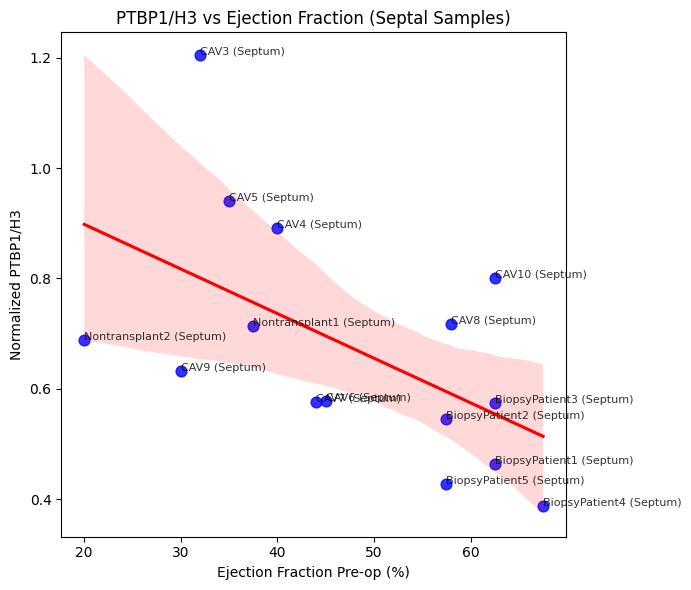

✅ Regression plot saved to: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Correlation_PTBP1_EFpreop_Septal.pdf


In [23]:
# Use Type 42 (TrueType) fonts in PDF so Illustrator reads text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

# --------------------------------------------
# Prepare data
# --------------------------------------------
plot_df = df[df['Region'].isin(['Septal'])].copy()

# Drop missing EF_preop or PTBP1 values
plot_df = plot_df.dropna(subset=['mean_total_counts_PTBP1-1_norm_H3', 'EF_preop'])

# Sort for clearer labeling
plot_df = plot_df.sort_values('mean_total_counts_PTBP1-1_norm_H3')

# --------------------------------------------
# Plot regression
# --------------------------------------------
plt.figure(figsize=(7,6))
sns.regplot(
    data=plot_df,
    x='EF_preop',
    y='mean_total_counts_PTBP1-1_norm_H3',
    scatter_kws={'s': 60, 'color': 'blue'},
    line_kws={'color': 'red'}
)

# Label points by Donor and Location
for _, row in plot_df.iterrows():
    plt.text(
        row['EF_preop'], 
        row['mean_total_counts_PTBP1-1_norm_H3'], 
        f"{row['StrippedDonor']} ({row['Location']})",
        fontsize=8, alpha=0.8
    )

# --------------------------------------------
# Axis and title
# --------------------------------------------
plt.xlabel('Ejection Fraction Pre-op (%)')
plt.ylabel('Normalized PTBP1/H3')
plt.title('PTBP1/H3 vs Ejection Fraction (Septal Samples)')
plt.tight_layout()

# --------------------------------------------
# Show and export to PDF
# --------------------------------------------
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Correlation_PTBP1_EFpreop_Septal.pdf"
plt.savefig(output_path, bbox_inches='tight')
plt.show()
plt.close()

print(f"✅ Regression plot saved to: {output_path}")


2026-01-21 10:04:09 | [INFO] maxp pruned
2026-01-21 10:04:09 | [INFO] cmap pruned
2026-01-21 10:04:09 | [INFO] kern dropped
2026-01-21 10:04:09 | [INFO] post pruned
2026-01-21 10:04:09 | [INFO] FFTM dropped
2026-01-21 10:04:09 | [INFO] GPOS pruned
2026-01-21 10:04:09 | [INFO] GSUB pruned
2026-01-21 10:04:09 | [INFO] name pruned
2026-01-21 10:04:09 | [INFO] glyf pruned
2026-01-21 10:04:09 | [INFO] Added gid0 to subset
2026-01-21 10:04:09 | [INFO] Added first four glyphs to subset
2026-01-21 10:04:09 | [INFO] Closing glyph list over 'GSUB': 44 glyphs before
2026-01-21 10:04:09 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'H', 'N', 'P', 'R', 'S', 'T', 'V', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
2026-01-21 10:04:09 | [INFO] Glyph IDs:   [0, 1, 2, 3, 11, 12, 17, 18, 19, 20, 21, 22, 2

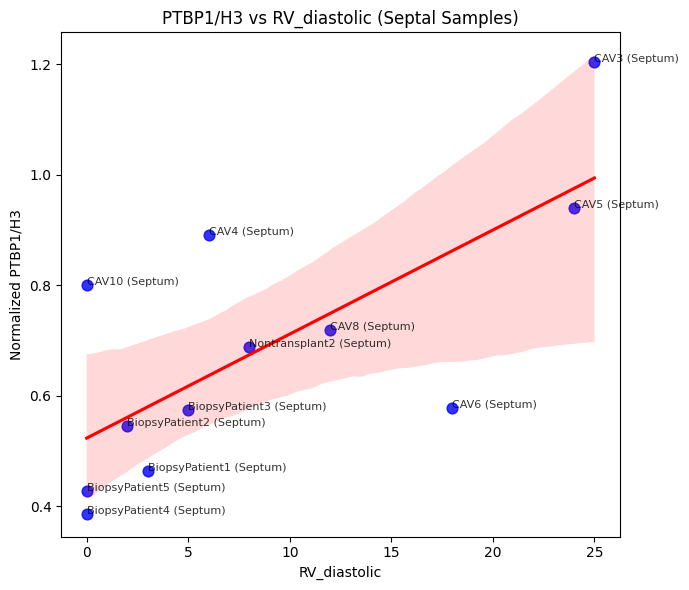

✅ Regression plot saved to: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Correlation_PTBP1_RV_diastolic_Septal.pdf


In [24]:
# Use Type 42 (TrueType) fonts in PDF so Illustrator reads text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

# --------------------------------------------
# Prepare data
# --------------------------------------------
plot_df = df[df['Region'].isin(['Septal'])].copy()

# Drop missing EF_preop or PTBP1 values
plot_df = plot_df.dropna(subset=['mean_total_counts_PTBP1-1_norm_H3', 'RV_diastolic'])

# Sort for clearer labeling
plot_df = plot_df.sort_values('mean_total_counts_PTBP1-1_norm_H3')

# --------------------------------------------
# Plot regression
# --------------------------------------------
plt.figure(figsize=(7,6))
sns.regplot(
    data=plot_df,
    x='RV_diastolic',
    y='mean_total_counts_PTBP1-1_norm_H3',
    scatter_kws={'s': 60, 'color': 'blue'},
    line_kws={'color': 'red'}
)

# Label points by Donor and Location
for _, row in plot_df.iterrows():
    plt.text(
        row['RV_diastolic'], 
        row['mean_total_counts_PTBP1-1_norm_H3'], 
        f"{row['StrippedDonor']} ({row['Location']})",
        fontsize=8, alpha=0.8
    )

# --------------------------------------------
# Axis and title
# --------------------------------------------
plt.xlabel('RV_diastolic')
plt.ylabel('Normalized PTBP1/H3')
plt.title('PTBP1/H3 vs RV_diastolic (Septal Samples)')
plt.tight_layout()

# --------------------------------------------
# Show and export to PDF
# --------------------------------------------
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Correlation_PTBP1_RV_diastolic_Septal.pdf"
plt.savefig(output_path, bbox_inches='tight')
plt.show()
plt.close()

print(f"✅ Regression plot saved to: {output_path}")

In [25]:
# Ensure Illustrator-readable TrueType fonts
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

# Color map for DiseaseStatus
status_colors = {
    "CAV": "red",
#    "LateRejection": "pink",
    "Rejection": "lightblue",
    "Stable": "lightblue",
    "Nontransplant": "purple"
}

# ---------------------------------------------------
# Function to generate identical-dimension regression plots
# ---------------------------------------------------
def plot_regression_fixed(df, x_col, y_col, title, xlabel, pdf_path):
    
    # Drop missing for chosen columns
    plot_df = df.dropna(subset=[x_col, y_col]).copy()
    
    # Sort (for consistent text placement order)
    plot_df = plot_df.sort_values(y_col)

    # Create figure with *fixed dimensions*
    fig = plt.figure(figsize=(7,6))
    
    # Draw regression line separately
    sns.regplot(
        data=plot_df,
        x=x_col,
        y=y_col,
        scatter=False,
        line_kws={'color': 'black', 'linewidth': 2}
    )
    
    # Scatter points colored by DiseaseStatus
    for _, row in plot_df.iterrows():
        plt.scatter(
            row[x_col],
            row[y_col],
            s=70,
            edgecolor='black',
            linewidth=0.7,
            color=status_colors.get(row["DiseaseStatus"], "gray"),
            zorder=3
        )
        
        # Text labels
        plt.text(
            row[x_col],
            row[y_col],
            f"{row['StrippedDonor']} ({row['Location']})",
            fontsize=7, alpha=0.8
        )
    
    # Labels
    plt.xlabel(xlabel)
    plt.ylabel("Normalized PTBP1/H3")
    plt.title(title)
    
    plt.tight_layout()
    plt.savefig(pdf_path, bbox_inches='tight')
    plt.close()
    print(f"✅ Saved: {pdf_path}")


In [26]:
df.columns

Index(['StrippedDonor', 'GraftHostRefine', 'Location', 'DiseaseStatus',
       'mean_total_counts_PTBP1-1', 'mean_total_counts_IgG',
       'mean_total_counts_H3', 'mean_total_counts_PTBP1-1_norm_H3',
       'mean_total_counts_IgG_norm_H3',
       'mean_total_counts_PTBP1-1_norm_NuclearPore',
       'mean_total_counts_IgG_norm_NuclearPore', 'Level', 'RA_mean',
       'RV_systolic', 'RV_diastolic', 'PA_systolic', 'PA_diastolic', 'PA_mean',
       'PCW', 'AV_O2', 'CO', 'CI', 'PVR', 'EF_preop', 'Region',
       'mean_total_counts_PTBP1-1_nCLR_H3'],
      dtype='object')

In [27]:
plot_regression_fixed(
    df = df[df['Region'] == 'Septal'],
    x_col = 'RV_diastolic',
    y_col = 'mean_total_counts_PTBP1-1_norm_H3',
    title = "PTBP1/H3 vs RV Diastolic (Septal Samples)",
    xlabel = "RV Diastolic (mmHg)",
    pdf_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Correlation_PTBP1_RV_diastolic_Septal_Colored.pdf"
)

2026-01-21 10:04:17 | [INFO] maxp pruned
2026-01-21 10:04:17 | [INFO] cmap pruned
2026-01-21 10:04:17 | [INFO] kern dropped
2026-01-21 10:04:17 | [INFO] post pruned
2026-01-21 10:04:17 | [INFO] FFTM dropped
2026-01-21 10:04:17 | [INFO] GPOS pruned
2026-01-21 10:04:17 | [INFO] GSUB pruned
2026-01-21 10:04:17 | [INFO] name pruned
2026-01-21 10:04:17 | [INFO] glyf pruned
2026-01-21 10:04:17 | [INFO] Added gid0 to subset
2026-01-21 10:04:17 | [INFO] Added first four glyphs to subset
2026-01-21 10:04:17 | [INFO] Closing glyph list over 'GSUB': 47 glyphs before
2026-01-21 10:04:17 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'H', 'N', 'P', 'R', 'S', 'T', 'V', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'g', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'z', 'zero']
2026-01-21 10:04:17 | [INFO] Glyph IDs:   [0, 1, 2, 3, 11, 12, 17, 18, 19, 

✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Correlation_PTBP1_RV_diastolic_Septal_Colored.pdf


In [28]:
plot_regression_fixed(
    df = df[df['Region'] == 'Septal'],
    x_col = 'EF_preop',
    y_col = 'mean_total_counts_PTBP1-1_norm_H3',
    title = "PTBP1/H3 vs Ejection Fraction (Septal Samples)",
    xlabel = "Ejection Fraction Pre-op (%)",
    pdf_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Correlation_PTBP1_EFpreop_Septal_colored.pdf"
)


2026-01-21 10:04:19 | [INFO] maxp pruned
2026-01-21 10:04:19 | [INFO] cmap pruned
2026-01-21 10:04:19 | [INFO] kern dropped
2026-01-21 10:04:19 | [INFO] post pruned
2026-01-21 10:04:19 | [INFO] FFTM dropped
2026-01-21 10:04:19 | [INFO] GPOS pruned
2026-01-21 10:04:19 | [INFO] GSUB pruned
2026-01-21 10:04:19 | [INFO] name pruned
2026-01-21 10:04:19 | [INFO] glyf pruned
2026-01-21 10:04:19 | [INFO] Added gid0 to subset
2026-01-21 10:04:19 | [INFO] Added first four glyphs to subset
2026-01-21 10:04:19 | [INFO] Closing glyph list over 'GSUB': 49 glyphs before
2026-01-21 10:04:19 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'H', 'N', 'P', 'S', 'T', 'V', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'hyphen', 'i', 'j', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'z', 'zero']
2026-01-21 10:04:19 | [INFO] Glyph IDs:   [0, 1, 2, 3,

✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Correlation_PTBP1_EFpreop_Septal_colored.pdf


## Barplots of PTBP1 protein levels by disease state

In [29]:
# Columns to retain in addition to aggregation
retain_cols = [
    'BatchSouporcell', 'SampleType', 'BankSource', 'Location', 'LocationFine', 'StrippedDonor', 'Day', 'ConfidenceOnHashing',
    'DiseaseStatus', 'BetweenSampleSC_Validations', 'GraftHost', 'leiden_with_counts',
    'cell_type_general', 'GraftHostRefine', 'PCW', 'RA_mean', 'RV_systolic', 'RV_diastolic',
    'PA_mean', 'CO', 'CI', 'PVR', 'EF_preop'
]

# Copy .obs
df = adata_EC_subset.obs.copy()

# Optional: filter extreme PTBP1/H3 values
df = df[df['total_counts_PTBP1-1_norm_H3'] <= 100000]

# Groupby columns
group_cols = ['StrippedDonor', 'LocationFine', 'Day']

# Define aggregation dictionary: mean for PTBP1, first() for other columns (exclude groupby columns)
agg_dict = {col: 'first' for col in retain_cols if col not in group_cols}
agg_dict['total_counts_PTBP1-1_norm_H3'] = 'mean'

# Group by Donor, Location, TimePoint
agg_df = df.groupby(group_cols).agg(agg_dict).reset_index()

# Rename columns
agg_df = agg_df.rename(columns={
    'total_counts_PTBP1-1_norm_H3': 'Mean_PTBP1_H3'
})

# Drop rows where the mean PTBP1 is NaN
agg_df = agg_df.dropna(subset=['Mean_PTBP1_H3'])

# Display
print(agg_df.head())



      StrippedDonor LocationFine    Day      BatchSouporcell SampleType  \
49   BiopsyPatient1       Septum   59.0  April2025_Sample1_2     Biopsy   
139  BiopsyPatient2       Septum    7.0  April2025_Sample2_4     Biopsy   
234  BiopsyPatient3       Septum   62.0  April2025_Sample1_7     Biopsy   
237  BiopsyPatient3       Septum  461.0  April2025_Sample2_7     Biopsy   
238  BiopsyPatient3       Septum  566.0  April2025_Sample3_7     Biopsy   

    BankSource Location ConfidenceOnHashing DiseaseStatus  \
49        UCLA   Septum                High        Stable   
139       UCLA   Septum                High        Stable   
234       UCLA   Septum                High        Stable   
237       UCLA   Septum                High        Stable   
238       UCLA   Septum                High        Stable   

    BetweenSampleSC_Validations  ...   PCW RA_mean RV_systolic RV_diastolic  \
49                         good  ...   8.0     3.0          18            3   
139                     

2026-01-21 10:04:25 | [INFO] maxp pruned
2026-01-21 10:04:25 | [INFO] cmap pruned
2026-01-21 10:04:25 | [INFO] kern dropped
2026-01-21 10:04:25 | [INFO] post pruned
2026-01-21 10:04:25 | [INFO] FFTM dropped
2026-01-21 10:04:25 | [INFO] GPOS pruned
2026-01-21 10:04:25 | [INFO] GSUB pruned
2026-01-21 10:04:25 | [INFO] name pruned
2026-01-21 10:04:25 | [INFO] glyf pruned
2026-01-21 10:04:25 | [INFO] Added gid0 to subset
2026-01-21 10:04:25 | [INFO] Added first four glyphs to subset
2026-01-21 10:04:25 | [INFO] Closing glyph list over 'GSUB': 42 glyphs before
2026-01-21 10:04:25 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'G', 'H', 'L', 'M', 'N', 'P', 'S', 'T', 'V', 'a', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
2026-01-21 10:04:25 | [INFO] Glyph IDs:   [0, 1, 2, 3, 15, 17, 18, 19, 20, 21, 22, 23, 25, 27, 36, 37, 38, 42, 43, 47, 48, 

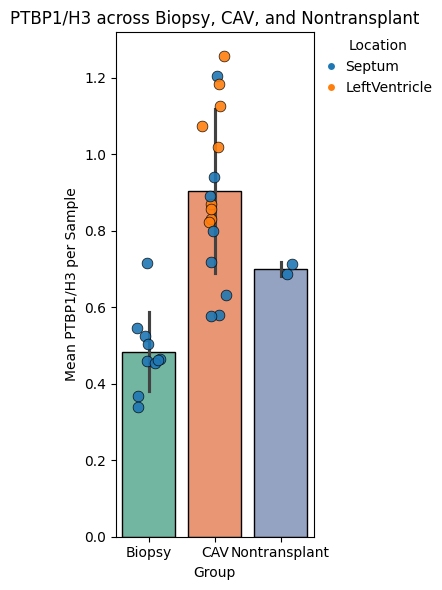

✅ Plot saved to: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/barplot_inCITE_PTBP1_byLocation.pdf

ANOVA results:
            sum_sq    df          F    PR(>F)
C(Group)  1.121541   2.0  17.550505  0.000015
Residual  0.830747  26.0        NaN       NaN

Tukey HSD post-hoc test:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1     group2    meandiff p-adj   lower  upper  reject
----------------------------------------------------------
Biopsy           CAV   0.4213    0.0  0.2442 0.5983   True
Biopsy Nontransplant   0.2176 0.2757 -0.1265 0.5616  False
   CAV Nontransplant  -0.2037 0.2963 -0.5357 0.1284  False
----------------------------------------------------------


In [30]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd


# -------------------------------
# Step 0: Copy and deduplicate columns
plot_df = agg_df.copy()

# Make columns unique
cols = pd.Series(plot_df.columns)
for dup in cols[cols.duplicated()].unique(): 
    cols[cols[cols == dup].index.values.tolist()] = [dup + f'.{i}' if i > 0 else dup for i in range(sum(cols == dup))]
plot_df.columns = cols

# -------------------------------
# Step 1: Remove LAD locations
plot_df = plot_df.loc[plot_df['Location'] != 'LAD'].copy()

# -------------------------------
# Step 2: Simplified group
def plot_group(row):
    if row['SampleType'] == 'Biopsy':
        return 'Biopsy'
    elif row['SampleType'] == 'HeartTissue' and row['DiseaseStatus'] == 'CAV':
        return 'CAV'
    elif row['SampleType'] == 'HeartTissue' and row['DiseaseStatus'] == 'Nontransplant':
        return 'Nontransplant'
    else:
        return 'Other'

plot_df['Group'] = plot_df.apply(plot_group, axis=1)
plot_df = plot_df[plot_df['Group'].isin(['Biopsy', 'CAV', 'Nontransplant'])].copy()

# -------------------------------
# Step 3: Create combined label for scatter points
plot_df['SampleLabel'] = (
    plot_df['StrippedDonor'].astype(str) + '_' +
    plot_df['Location'].astype(str) + '_' +
    plot_df['Day'].astype(str) + '_' +
    plot_df['GraftHostRefine'].astype(str)
)

# -------------------------------
# Step 4: Plot
plt.figure(figsize=(4,6))  # ~30% width

# Bar plot (tight)
ax = sns.barplot(
    x='Group',
    y='Mean_PTBP1_H3',
    data=plot_df,
    ci='sd',
    palette='Set2',
    edgecolor='black'
)

# Tighten spacing between bars
ax.set_xlim(-0.5, len(plot_df['Group'].unique()) - 0.5)

# Color palette for Location
loc_palette = sns.color_palette('tab10', n_colors=plot_df['Location'].nunique())
loc_colors = dict(zip(plot_df['Location'].unique(), loc_palette))

# Scatter points with strong jitter
for i, group in enumerate(plot_df['Group'].unique()):
    sub = plot_df[plot_df['Group'] == group]
    
    # jitter scale (increase for more spread)
    jitter = 0.20   # wider scatter; try 0.25 or 0.30 for even more

    for _, row in sub.iterrows():
        x_jittered = i + np.random.uniform(-jitter, jitter)

        plt.scatter(
            x=x_jittered,
            y=row['Mean_PTBP1_H3'],
            color=loc_colors[row['Location']],
            edgecolor='black',
            linewidth=0.5,
            s=60,
            alpha=0.9,
            zorder=3
        )


# Legend
loc_handles = [
    plt.Line2D([0], [0], marker='o', color='w', label=loc,
               markerfacecolor=color, markersize=6)
    for loc, color in loc_colors.items()
]
plt.legend(handles=loc_handles, title='Location',
           bbox_to_anchor=(1.02, 1), loc='upper left')

plt.ylabel('Mean PTBP1/H3 per Sample')
plt.title('PTBP1/H3 across Biopsy, CAV, and Nontransplant')
plt.tight_layout()

# Save
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/barplot_inCITE_PTBP1_byLocation.pdf"
plt.savefig(output_path, format='pdf', bbox_inches='tight')
plt.show()
print(f"✅ Plot saved to: {output_path}")


# -------------------------------
# Step 5: ANOVA + Tukey
anova_df = plot_df[['Group','Mean_PTBP1_H3']].dropna()
model = ols('Mean_PTBP1_H3 ~ C(Group)', data=anova_df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\nANOVA results:")
print(anova_table)

tukey = pairwise_tukeyhsd(
    endog=anova_df['Mean_PTBP1_H3'],
    groups=anova_df['Group'],
    alpha=0.05
)
print("\nTukey HSD post-hoc test:")
print(tukey.summary())




## Compare all cells with top PTBP1 to bottom - by chemistry

In [31]:
adata_EC_subset.obs['Location'].value_counts()


Location
Septum           16035
LeftVentricle    14848
LAD                540
Name: count, dtype: int64

In [32]:
explant_subset = adata_EC_subset[
    (adata_EC_subset.obs['SampleType'] == 'HeartTissue') &
    (adata_EC_subset.obs['Location'] == 'Septum')
].copy()


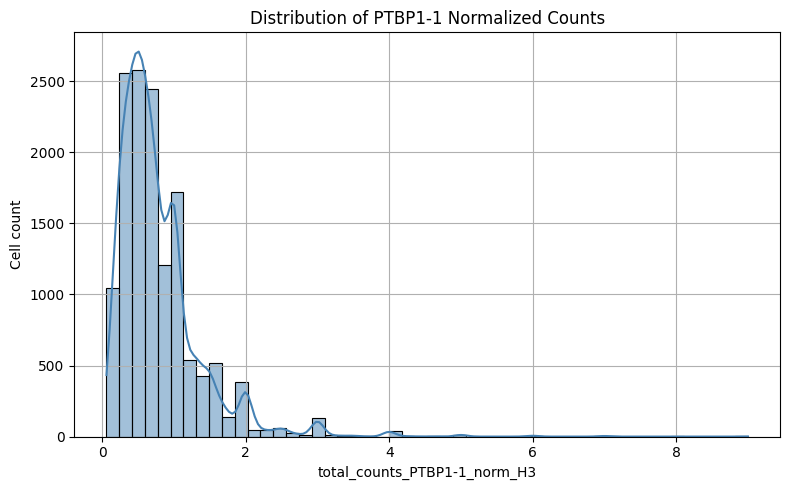

In [33]:
plt.figure(figsize=(8, 5))
sns.histplot(
    explant_subset.obs['total_counts_PTBP1-1_norm_H3'],
    bins=50,  # Adjust for more/less granularity
    kde=True,
    color='steelblue'
)
plt.title('Distribution of PTBP1-1 Normalized Counts')
plt.xlabel('total_counts_PTBP1-1_norm_H3')
plt.ylabel('Cell count')
plt.grid(True)
plt.tight_layout()
plt.show()

In [34]:
biopsy_subset = adata_EC_subset[
    (adata_EC_subset.obs['SampleType'] == 'Biopsy')
].copy()

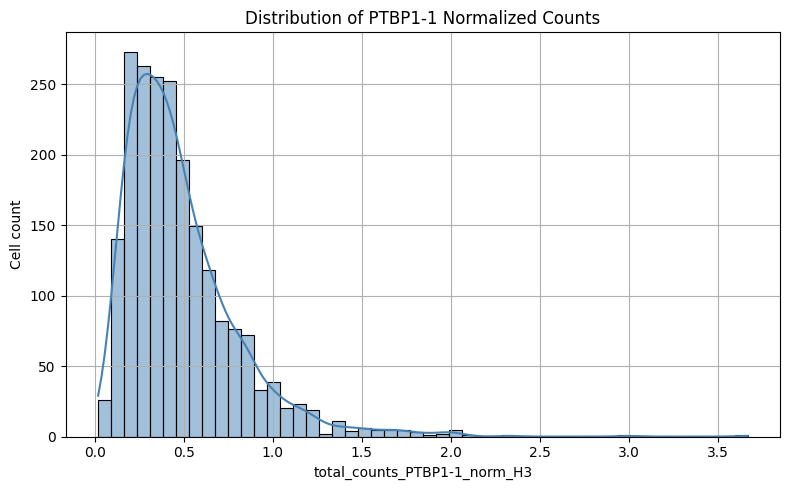

In [35]:
plt.figure(figsize=(8, 5))
sns.histplot(
    biopsy_subset.obs['total_counts_PTBP1-1_norm_H3'],
    bins=50,  # Adjust for more/less granularity
    kde=True,
    color='steelblue'
)
plt.title('Distribution of PTBP1-1 Normalized Counts')
plt.xlabel('total_counts_PTBP1-1_norm_H3')
plt.ylabel('Cell count')
plt.grid(True)
plt.tight_layout()
plt.show()

In [36]:
target_sample_type = 'Biopsy'
ptbp1_gene_column_in_obs = 'total_counts_PTBP1-1_norm_H3' # The column containing PTBP1 expression for ranking

# --- Step 1: Identify PTBP1 high and low cells within the relevant subset ---

# First, create a temporary DataFrame with only the relevant cells
relevant_cells_obs = adata_EC_subset.obs[
    (adata_EC_subset.obs['SampleType'] == target_sample_type)
].copy()

# Calculate quantiles based ONLY on these relevant cells
ptbp1_expression_relevant = relevant_cells_obs[ptbp1_gene_column_in_obs].dropna()

if ptbp1_expression_relevant.empty:
    raise ValueError("No PTBP1 expression data found for the specified Biopsy samples in clusters 0-6. Cannot perform DGE.")

lower_bound = ptbp1_expression_relevant.quantile(0.25)
upper_bound = ptbp1_expression_relevant.quantile(0.75)

print(f"\nPTBP1 Low Threshold (20th percentile within relevant cells): {lower_bound:.4f}")
print(f"PTBP1 High Threshold (80th percentile within relevant cells): {upper_bound:.4f}")

# --- Step 2: Assign 'PTBP1_Expression_Group' to adata_filtered.obs for all cells ---
# Initialize the new column with a default value ('Other')
adata_EC_subset.obs['PTBP1_Expression_Group'] = 'Other'

# Assign 'Low PTBP1' to cells below the lower_bound, only if they are part of the 'relevant_cells_obs'
adata_EC_subset.obs.loc[
    (adata_EC_subset.obs.index.isin(relevant_cells_obs.index)) &
    (adata_EC_subset.obs[ptbp1_gene_column_in_obs] <= lower_bound),
    'PTBP1_Expression_Group'
] = 'Low PTBP1'

# Assign 'High PTBP1' to cells above the upper_bound
adata_EC_subset.obs.loc[
    (adata_EC_subset.obs.index.isin(relevant_cells_obs.index)) &
    (adata_EC_subset.obs[ptbp1_gene_column_in_obs] >= upper_bound),
    'PTBP1_Expression_Group'
] = 'High PTBP1'

# Check the number of cells in each new group
n_low_ptbp1 = (adata_EC_subset.obs['PTBP1_Expression_Group'] == 'Low PTBP1').sum()
n_high_ptbp1 = (adata_EC_subset.obs['PTBP1_Expression_Group'] == 'High PTBP1').sum()
print(f"\nNumber of 'Low PTBP1' cells for DGE: {n_low_ptbp1}")
print(f"Number of 'High PTBP1' cells for DGE: {n_high_ptbp1}")

if n_low_ptbp1 < 2 or n_high_ptbp1 < 2:
    print("Warning: Insufficient cells in one or both PTBP1 groups for differential expression analysis. Need at least 2 cells per group.")


# --- Step 3: Create a subset AnnData object for DGE analysis ---
# Only include cells that are either 'Low PTBP1' or 'High PTBP1' AND passed initial filters
dge_adata = adata_EC_subset[
    (adata_EC_subset.obs['PTBP1_Expression_Group'].isin(['Low PTBP1', 'High PTBP1'])) &
    (adata_EC_subset.obs['SampleType'] == target_sample_type)
].copy()

if dge_adata.shape[0] == 0:
    raise ValueError("No cells found in 'Low PTBP1' or 'High PTBP1' groups after all filters. Cannot perform DGE.")

# Ensure the 'PTBP1_Expression_Group' is a categorical type for scanpy
dge_adata.obs['PTBP1_Expression_Group'] = dge_adata.obs['PTBP1_Expression_Group'].astype('category')


# --- Step 4: Perform Differential Gene Expression analysis using scanpy ---
print("\nPerforming differential gene expression analysis...")

# Set the reference group
sc.tl.rank_genes_groups(
    dge_adata,
    groupby='PTBP1_Expression_Group',
    reference='Low PTBP1', # Genes will be ranked by higher expression in 'High PTBP1' vs 'Low PTBP1'
    method='wilcoxon',     # Robust non-parametric test
    key_added='ptbp1_dge'  # Store results under this custom key
)

# --- Step 5: Extract and interpret results ---
print("\n--- Top differentially expressed genes (High PTBP1 vs Low PTBP1) ---")

result = dge_adata.uns['ptbp1_dge']

# Get the list of groups
groups = result['names'].dtype.names  # e.g., ('High PTBP1',)

# Extract results for each group into a dict of DataFrames
dge_dfs = {}
for group in groups:
    dge_dfs[group] = pd.DataFrame({
        'Gene': result['names'][group],
        'Log2FC': result['logfoldchanges'][group],
        'p_value': result['pvals'][group],
        'p_adj': result['pvals_adj'][group],
        'Score': result['scores'][group]
    })

# Example: DataFrame for High PTBP1
Biopsy_PTBP1_dge_results_df = dge_dfs['High PTBP1']


PTBP1 Low Threshold (20th percentile within relevant cells): 0.2577
PTBP1 High Threshold (80th percentile within relevant cells): 0.6154

Number of 'Low PTBP1' cells for DGE: 523
Number of 'High PTBP1' cells for DGE: 530

Performing differential gene expression analysis...
ranking genes
    finished: added to `.uns['ptbp1_dge']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)

--- Top differentially expressed genes (High PTBP1 vs Low PTBP1) ---


In [37]:
Biopsy_PTBP1_dge_results_df

,Gene,Log2FC,p_value,p_adj,Score
0,PTK2,1.023126,1.981686e-16,4.150549e-12,8.223186
1,MALAT1,1.671203,2.606801e-16,4.150549e-12,8.190252
2,ZBTB20,1.082468,3.620747e-15,3.843302e-11,7.867404
3,WDFY3,1.132615,4.267773e-14,3.397574e-10,7.552562
4,NCALD,1.061486,1.946364e-13,1.239600e-09,7.352429
...,...,...,...,...,...
31839,MYRIP,-0.657908,4.936128e-02,5.004332e-01,-1.965458
31840,EGFL7,-0.317563,3.345520e-02,3.784147e-01,-2.126577
31841,ANO2,-0.298612,2.902522e-03,6.234556e-02,-2.977877
31842,XAF1,-0.499768,5.735848e-04,1.795992e-02,-3.443807


In [38]:
adata_EC_subset.obs['Location']

2434      Septum
2447      Septum
2583      Septum
2899      Septum
3275      Septum
           ...  
145591    Septum
145603    Septum
145604    Septum
145620    Septum
145623    Septum
Name: Location, Length: 31423, dtype: category
Categories (3, object): ['LAD', 'LeftVentricle', 'Septum']

In [39]:
target_sample_type = 'HeartTissue'
ptbp1_gene_column_in_obs = 'total_counts_PTBP1-1_norm_H3' # The column containing PTBP1 expression for ranking

# --- Step 1: Identify PTBP1 high and low cells within the relevant subset ---

# First, create a temporary DataFrame with only the relevant cells
relevant_cells_obs = adata_EC_subset.obs[
    (adata_EC_subset.obs['SampleType'] == target_sample_type) &
    (adata_EC_subset.obs['Location'] == 'Septum')
].copy()


# Calculate quantiles based ONLY on these relevant cells
ptbp1_expression_relevant = relevant_cells_obs[ptbp1_gene_column_in_obs].dropna()

if ptbp1_expression_relevant.empty:
    raise ValueError("No PTBP1 expression data found for the specified Biopsy samples in clusters 0-6. Cannot perform DGE.")

lower_bound = ptbp1_expression_relevant.quantile(0.25)
upper_bound = ptbp1_expression_relevant.quantile(0.75)

print(f"\nPTBP1 Low Threshold (20th percentile within relevant cells): {lower_bound:.4f}")
print(f"PTBP1 High Threshold (80th percentile within relevant cells): {upper_bound:.4f}")

# --- Step 2: Assign 'PTBP1_Expression_Group' to adata_filtered.obs for all cells ---
# Initialize the new column with a default value ('Other')
adata_EC_subset.obs['PTBP1_Expression_Group'] = 'Other'

# Assign 'Low PTBP1' to cells below the lower_bound, only if they are part of the 'relevant_cells_obs'
adata_EC_subset.obs.loc[
    (adata_EC_subset.obs.index.isin(relevant_cells_obs.index)) &
    (adata_EC_subset.obs[ptbp1_gene_column_in_obs] <= lower_bound),
    'PTBP1_Expression_Group'
] = 'Low PTBP1'

# Assign 'High PTBP1' to cells above the upper_bound
adata_EC_subset.obs.loc[
    (adata_EC_subset.obs.index.isin(relevant_cells_obs.index)) &
    (adata_EC_subset.obs[ptbp1_gene_column_in_obs] >= upper_bound),
    'PTBP1_Expression_Group'
] = 'High PTBP1'

# Check the number of cells in each new group
n_low_ptbp1 = (adata_EC_subset.obs['PTBP1_Expression_Group'] == 'Low PTBP1').sum()
n_high_ptbp1 = (adata_EC_subset.obs['PTBP1_Expression_Group'] == 'High PTBP1').sum()
print(f"\nNumber of 'Low PTBP1' cells for DGE: {n_low_ptbp1}")
print(f"Number of 'High PTBP1' cells for DGE: {n_high_ptbp1}")

if n_low_ptbp1 < 2 or n_high_ptbp1 < 2:
    print("Warning: Insufficient cells in one or both PTBP1 groups for differential expression analysis. Need at least 2 cells per group.")


# --- Step 3: Create a subset AnnData object for DGE analysis ---
# Only include cells that are either 'Low PTBP1' or 'High PTBP1' AND passed initial filters
dge_adata = adata_EC_subset[
    (adata_EC_subset.obs['PTBP1_Expression_Group'].isin(['Low PTBP1', 'High PTBP1'])) &
    (adata_EC_subset.obs['SampleType'] == target_sample_type)
].copy()

if dge_adata.shape[0] == 0:
    raise ValueError("No cells found in 'Low PTBP1' or 'High PTBP1' groups after all filters. Cannot perform DGE.")

# Ensure the 'PTBP1_Expression_Group' is a categorical type for scanpy
dge_adata.obs['PTBP1_Expression_Group'] = dge_adata.obs['PTBP1_Expression_Group'].astype('category')


# --- Step 4: Perform Differential Gene Expression analysis using scanpy ---
print("\nPerforming differential gene expression analysis...")

# Set the reference group
sc.tl.rank_genes_groups(
    dge_adata,
    groupby='PTBP1_Expression_Group',
    reference='Low PTBP1', # Genes will be ranked by higher expression in 'High PTBP1' vs 'Low PTBP1'
    method='wilcoxon',     # Robust non-parametric test
    key_added='ptbp1_dge'  # Store results under this custom key
)

# --- Step 5: Extract and interpret results ---
print("\n--- Top differentially expressed genes (High PTBP1 vs Low PTBP1) ---")

result = dge_adata.uns['ptbp1_dge']

# Get the list of groups
groups = result['names'].dtype.names  # e.g., ('High PTBP1',)

# Extract results for each group into a dict of DataFrames
dge_dfs = {}
for group in groups:
    dge_dfs[group] = pd.DataFrame({
        'Gene': result['names'][group],
        'Log2FC': result['logfoldchanges'][group],
        'p_value': result['pvals'][group],
        'p_adj': result['pvals_adj'][group],
        'Score': result['scores'][group]
    })

# Example: DataFrame for High PTBP1
Endpoint_septum_PTBP1_dge_results_df = dge_dfs['High PTBP1']


PTBP1 Low Threshold (20th percentile within relevant cells): 0.4000
PTBP1 High Threshold (80th percentile within relevant cells): 1.0000

Number of 'Low PTBP1' cells for DGE: 3560
Number of 'High PTBP1' cells for DGE: 4099

Performing differential gene expression analysis...
ranking genes
    finished: added to `.uns['ptbp1_dge']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:36)

--- Top differentially expressed genes (High PTBP1 vs Low PTBP1) ---


In [40]:
Endpoint_septum_PTBP1_dge_results_df

,Gene,Log2FC,p_value,p_adj,Score
0,PLPP1,0.934386,1.098432e-56,1.748923e-52,15.865498
1,INSR,1.049128,2.692284e-44,2.857770e-40,13.961104
2,FKBP5,1.179970,3.882312e-43,3.090708e-39,13.769624
3,ZBTB16,0.653704,8.119018e-38,5.170840e-34,12.854461
4,WWTR1,0.751925,1.734530e-37,9.205730e-34,12.795625
...,...,...,...,...,...
31839,HERC1,-0.439560,8.165966e-16,5.417438e-13,-8.051688
31840,FOXN3,-0.414364,1.056973e-19,1.021356e-16,-9.082923
31841,EMCN,-0.474672,1.389256e-20,1.701518e-17,-9.301157
31842,SYNE1,-0.417855,3.845609e-21,5.102482e-18,-9.436739


In [43]:
target_sample_type = 'HeartTissue'
ptbp1_gene_column_in_obs = 'total_counts_PTBP1-1_norm_H3' # The column containing PTBP1 expression for ranking

# --- Step 1: Identify PTBP1 high and low cells within the relevant subset ---

# First, create a temporary DataFrame with only the relevant cells
relevant_cells_obs = adata_EC_subset.obs[
    (adata_EC_subset.obs['SampleType'] == target_sample_type) &
    (adata_EC_subset.obs['Location'] == 'LeftVentricle')
].copy()


# Calculate quantiles based ONLY on these relevant cells
ptbp1_expression_relevant = relevant_cells_obs[ptbp1_gene_column_in_obs].dropna()

if ptbp1_expression_relevant.empty:
    raise ValueError("No PTBP1 expression data found for the specified Biopsy samples in clusters 0-6. Cannot perform DGE.")

lower_bound = ptbp1_expression_relevant.quantile(0.25)
upper_bound = ptbp1_expression_relevant.quantile(0.75)

print(f"\nPTBP1 Low Threshold (20th percentile within relevant cells): {lower_bound:.4f}")
print(f"PTBP1 High Threshold (80th percentile within relevant cells): {upper_bound:.4f}")

# --- Step 2: Assign 'PTBP1_Expression_Group' to adata_filtered.obs for all cells ---
# Initialize the new column with a default value ('Other')
adata_EC_subset.obs['PTBP1_Expression_Group'] = 'Other'

# Assign 'Low PTBP1' to cells below the lower_bound, only if they are part of the 'relevant_cells_obs'
adata_EC_subset.obs.loc[
    (adata_EC_subset.obs.index.isin(relevant_cells_obs.index)) &
    (adata_EC_subset.obs[ptbp1_gene_column_in_obs] <= lower_bound),
    'PTBP1_Expression_Group'
] = 'Low PTBP1'

# Assign 'High PTBP1' to cells above the upper_bound
adata_EC_subset.obs.loc[
    (adata_EC_subset.obs.index.isin(relevant_cells_obs.index)) &
    (adata_EC_subset.obs[ptbp1_gene_column_in_obs] >= upper_bound),
    'PTBP1_Expression_Group'
] = 'High PTBP1'

# Check the number of cells in each new group
n_low_ptbp1 = (adata_EC_subset.obs['PTBP1_Expression_Group'] == 'Low PTBP1').sum()
n_high_ptbp1 = (adata_EC_subset.obs['PTBP1_Expression_Group'] == 'High PTBP1').sum()
print(f"\nNumber of 'Low PTBP1' cells for DGE: {n_low_ptbp1}")
print(f"Number of 'High PTBP1' cells for DGE: {n_high_ptbp1}")

if n_low_ptbp1 < 2 or n_high_ptbp1 < 2:
    print("Warning: Insufficient cells in one or both PTBP1 groups for differential expression analysis. Need at least 2 cells per group.")


# --- Step 3: Create a subset AnnData object for DGE analysis ---
# Only include cells that are either 'Low PTBP1' or 'High PTBP1' AND passed initial filters
dge_adata = adata_EC_subset[
    (adata_EC_subset.obs['PTBP1_Expression_Group'].isin(['Low PTBP1', 'High PTBP1'])) &
    (adata_EC_subset.obs['SampleType'] == target_sample_type)
].copy()

if dge_adata.shape[0] == 0:
    raise ValueError("No cells found in 'Low PTBP1' or 'High PTBP1' groups after all filters. Cannot perform DGE.")

# Ensure the 'PTBP1_Expression_Group' is a categorical type for scanpy
dge_adata.obs['PTBP1_Expression_Group'] = dge_adata.obs['PTBP1_Expression_Group'].astype('category')


# --- Step 4: Perform Differential Gene Expression analysis using scanpy ---
print("\nPerforming differential gene expression analysis...")

# Set the reference group
sc.tl.rank_genes_groups(
    dge_adata,
    groupby='PTBP1_Expression_Group',
    reference='Low PTBP1', # Genes will be ranked by higher expression in 'High PTBP1' vs 'Low PTBP1'
    method='wilcoxon',     # Robust non-parametric test
    key_added='ptbp1_dge'  # Store results under this custom key
)

# --- Step 5: Extract and interpret results ---
print("\n--- Top differentially expressed genes (High PTBP1 vs Low PTBP1) ---")

result = dge_adata.uns['ptbp1_dge']

# Get the list of groups
groups = result['names'].dtype.names  # e.g., ('High PTBP1',)

# Extract results for each group into a dict of DataFrames
dge_dfs = {}
for group in groups:
    dge_dfs[group] = pd.DataFrame({
        'Gene': result['names'][group],
        'Log2FC': result['logfoldchanges'][group],
        'p_value': result['pvals'][group],
        'p_adj': result['pvals_adj'][group],
        'Score': result['scores'][group]
    })

# Example: DataFrame for High PTBP1
Endpoint_ventricle_PTBP1_dge_results_df = dge_dfs['High PTBP1']


PTBP1 Low Threshold (20th percentile within relevant cells): 0.6250
PTBP1 High Threshold (80th percentile within relevant cells): 1.2000

Number of 'Low PTBP1' cells for DGE: 3801
Number of 'High PTBP1' cells for DGE: 3785

Performing differential gene expression analysis...
ranking genes
    finished: added to `.uns['ptbp1_dge']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:36)

--- Top differentially expressed genes (High PTBP1 vs Low PTBP1) ---


In [44]:
Endpoint_ventricle_PTBP1_dge_results_df

,Gene,Log2FC,p_value,p_adj,Score
0,TPM1,1.018787,1.464180e-71,4.662534e-67,17.887941
1,SMCHD1,0.731457,2.793248e-51,4.447409e-47,15.064009
2,RBM39,0.694168,1.788398e-48,1.898325e-44,14.630736
3,DDX17,0.648423,3.469818e-44,2.762322e-40,13.943012
4,PDLIM5,1.055499,3.737924e-43,2.380609e-39,13.772362
...,...,...,...,...,...
31839,EPB41L3,-0.421183,3.177720e-02,2.117859e-01,-2.147202
31840,PLXNA2,-0.077539,1.872112e-02,1.351826e-01,-2.351038
31841,CNKSR3,-0.322271,1.703830e-02,1.246709e-01,-2.385880
31842,ADAMTS9,-0.200106,9.893035e-03,7.734687e-02,-2.579546


In [45]:
# Define output file path
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/SingleCell_PTBP1_DGE_Results.xlsx"

# Write to Excel with each DataFrame on a separate sheet
with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
    Endpoint_ventricle_PTBP1_dge_results_df.to_excel(writer, sheet_name='Endpoint_Ventricle', index=True)
    Endpoint_septum_PTBP1_dge_results_df.to_excel(writer, sheet_name='Endpoint_Septum', index=True)
    Biopsy_PTBP1_dge_results_df.to_excel(writer, sheet_name='Biopsy', index=True)

print(f"✅ Saved all DGE result DataFrames to {output_path}")

✅ Saved all DGE result DataFrames to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/SingleCell_PTBP1_DGE_Results.xlsx


# GSEA analysis of top up and down genes PTBP1 associated genes - all endothelial cells

In [46]:
import gseapy as gp

def read_gmt(file):
    gmt = {}
    with open(file) as f:
        for line in f:
            parts = line.strip().split("\t")
            gmt[parts[0]] = parts[2:]  # skip description
    return gmt

Kegg_2023 = read_gmt("/labs/Murphy/SharedCondaEnv/Output2024_TardbpGrant/c2.cp.kegg_legacy.v2023.2.Hs.symbols.gmt")
Hallmark_2023 = read_gmt("/labs/Murphy/SharedCondaEnv/Output2024_TardbpGrant/h.all.v2023.2.Hs.symbols.gmt")


In [47]:
Endpoint_dge_results_df_sorted = Endpoint_septum_PTBP1_dge_results_df.sort_values(by='Score', ascending=False)
Endpoint_gsea_ranked_input = Endpoint_dge_results_df_sorted.set_index('Gene')['Score']

# Run the prerank analysis
Endpoint_pre_res = gp.prerank(rnk=Endpoint_gsea_ranked_input,
                     gene_sets= [Hallmark_2023],
                     organism='Human',
                     seed=42,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000,
                     no_plot=False,
                     processes=4,
                     weighted_score_type=1,
                     verbose=True)
                     
Endpoint_pre_res.res2d.head(20)

2026-01-21 10:11:29,854 [WARNING] Duplicated values found in preranked stats: 51.49% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-01-21 10:11:29,855 [INFO] Parsing data files for GSEA.............................
2026-01-21 10:11:29,865 [INFO] 0000 gene_sets have been filtered out when max_size=500 and min_size=15
2026-01-21 10:11:29,866 [INFO] 0050 gene_sets used for further statistical testing.....
2026-01-21 10:11:29,867 [INFO] Start to run GSEA...Might take a while..................
2026-01-21 10:11:36,073 [INFO] Congratulations. GSEApy runs successfully................



,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,0__HALLMARK_INTERFERON_ALPHA_RESPONSE,-0.689699,-1.679161,0.0,0.009311,0.015,51/96,9.03%,IFI44L;IFI44;B2M;PARP9;HERC6;MX1;IFIH1;DDX60;E...
1,prerank,0__HALLMARK_OXIDATIVE_PHOSPHORYLATION,-0.565584,-1.514246,0.0,0.02706,0.087,112/200,16.08%,POR;NDUFA9;RHOT1;IMMT;NDUFS1;MGST3;SLC25A6;NQO...
2,prerank,0__HALLMARK_ESTROGEN_RESPONSE_LATE,0.693029,1.50235,0.002265,0.108675,0.094,36/190,6.99%,FKBP5;UNC13B;NCOR2;AFF1;DNAJC1;PRSS23;CA2;CD9;...
3,prerank,0__HALLMARK_P53_PATHWAY,0.685393,1.479506,0.001142,0.089657,0.151,61/193,11.78%,ZBTB16;PITPNC1;FBXW7;PTPN14;PVT1;FOXO3;PTPRE;N...
4,prerank,0__HALLMARK_INTERFERON_GAMMA_RESPONSE,-0.558382,-1.466513,0.007576,0.028321,0.13,64/196,6.53%,IFI44L;XAF1;IFI44;STAT1;B2M;HERC6;MX2;MX1;IFIH...
5,prerank,0__HALLMARK_WNT_BETA_CATENIN_SIGNALING,0.781279,1.454514,0.021157,0.10143,0.241,15/42,8.47%,NCOR2;GNAI1;CTNNB1;LEF1;ADAM17;DLL1;PPARD;AXIN...
6,prerank,0__HALLMARK_HYPOXIA,0.668658,1.440692,0.003363,0.094275,0.289,60/198,8.67%,EGFR;AKAP12;KLF7;FOSL2;MYH9;ETS1;STC1;FOXO3;ND...
7,prerank,0__HALLMARK_ESTROGEN_RESPONSE_EARLY,0.671405,1.439324,0.003425,0.078246,0.301,43/194,7.67%,FKBP5;MAST4;NAV2;NCOR2;AFF1;MED13L;ABLIM1;PRSS...
8,prerank,0__HALLMARK_ANDROGEN_RESPONSE,0.700721,1.438376,0.013854,0.066473,0.306,23/99,4.11%,PLPP1;FKBP5;AKAP12;ABCC4;ACSL3;ADAMTS1;NDRG1;E...
9,prerank,0__HALLMARK_APICAL_JUNCTION,0.669323,1.438231,0.00813,0.057132,0.307,48/196,8.43%,VWF;EGFR;ITGA9;PECAM1;MYH9;PIK3R3;GNAI1;EPB41L...


2026-01-21 10:11:38 | [INFO] maxp pruned
2026-01-21 10:11:39 | [INFO] cmap pruned
2026-01-21 10:11:39 | [INFO] kern dropped
2026-01-21 10:11:39 | [INFO] post pruned
2026-01-21 10:11:39 | [INFO] FFTM dropped
2026-01-21 10:11:39 | [INFO] GPOS pruned
2026-01-21 10:11:39 | [INFO] GSUB pruned
2026-01-21 10:11:39 | [INFO] name pruned
2026-01-21 10:11:39 | [INFO] glyf pruned
2026-01-21 10:11:39 | [INFO] Added gid0 to subset
2026-01-21 10:11:39 | [INFO] Added first four glyphs to subset
2026-01-21 10:11:39 | [INFO] Closing glyph list over 'GSUB': 20 glyphs before
2026-01-21 10:11:39 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G', 'R', 'S', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 'space', 't']
2026-01-21 10:11:39 | [INFO] Glyph IDs:   [0, 1, 2, 3, 40, 42, 53, 54, 68, 70, 71, 72, 75, 76, 78, 80, 81, 82, 85, 87]
2026-01-21 10:11:39 | [INFO] Closed glyph list over 'GSUB': 20 glyphs after
2026-01-21 10:11:39 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G'

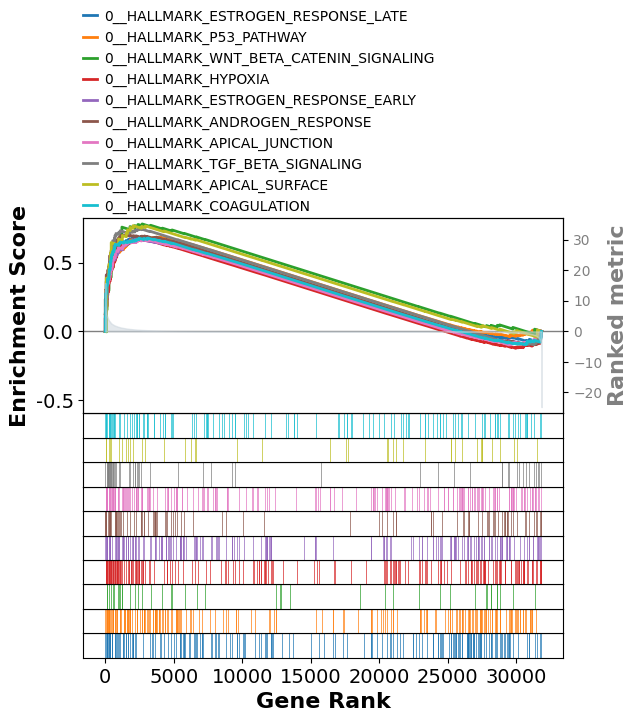

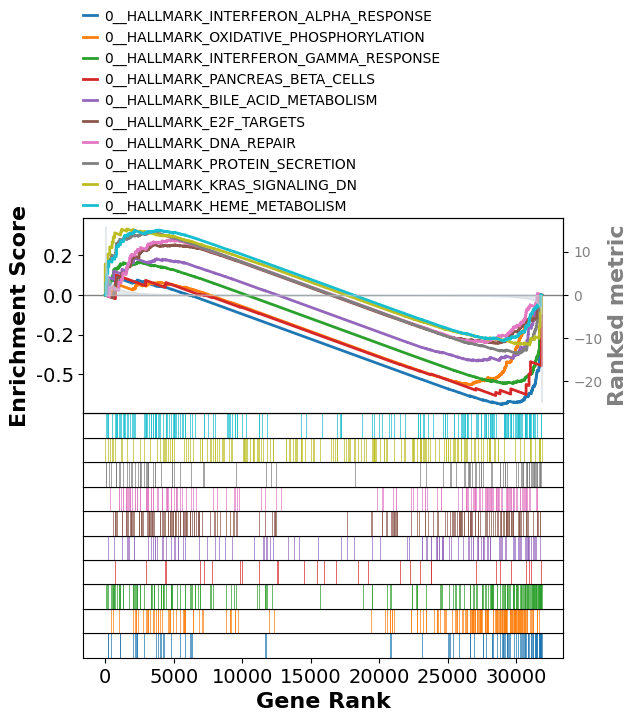

In [48]:
res_df = Endpoint_pre_res.res2d.copy()

# Sort terms by NES (or Score) for up and down separately
top5_up = res_df.sort_values('NES', ascending=False).head(10)['Term']
top5_down = res_df.sort_values('NES', ascending=True).head(10)['Term']

# ----------------------------
# Plot top 5 upregulated terms
# ----------------------------
axs_up = Endpoint_pre_res.plot(
    terms=top5_up,
    show_ranking=True,
    figsize=(3,4)
)
axs_up.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_pre_GSEA_terms_top1_up.pdf",
    bbox_inches="tight"
)

# ----------------------------
# Plot top 5 downregulated terms
# ----------------------------
axs_down = Endpoint_pre_res.plot(
    terms=top5_down,
    show_ranking=True,
    figsize=(3,4)
)
axs_down.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_pre_GSEA_terms_top10_down.pdf",
    bbox_inches="tight"
)

In [49]:
Biopsy_dge_results_df_sorted = Biopsy_PTBP1_dge_results_df.sort_values(by='Score', ascending=False)
Biopsy_gsea_ranked_input = Biopsy_dge_results_df_sorted.set_index('Gene')['Score']

# Run the prerank analysis
Biopsy_pre_res = gp.prerank(rnk=Biopsy_gsea_ranked_input,
                     gene_sets= [Hallmark_2023],
                     organism='Human',
                     seed=42,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000,
                     no_plot=False,
                     processes=4,
                     weighted_score_type=1,
                     verbose=True)
                     
Biopsy_pre_res.res2d.head(10)

2026-01-21 10:11:47,531 [WARNING] Duplicated values found in preranked stats: 66.98% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-01-21 10:11:47,532 [INFO] Parsing data files for GSEA.............................
2026-01-21 10:11:47,540 [INFO] 0000 gene_sets have been filtered out when max_size=500 and min_size=15
2026-01-21 10:11:47,542 [INFO] 0050 gene_sets used for further statistical testing.....
2026-01-21 10:11:47,543 [INFO] Start to run GSEA...Might take a while..................
2026-01-21 10:11:54,435 [INFO] Congratulations. GSEApy runs successfully................



,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,0__HALLMARK_TGF_BETA_SIGNALING,0.823101,1.313575,0.0,0.003,0.003,38/54,12.75%,FKBP1A;CTNNB1;SMURF1;UBE2D3;TJP1;ARID4B;JUNB;S...
1,prerank,0__HALLMARK_MITOTIC_SPINDLE,0.766578,1.25712,0.0,0.007,0.014,111/199,13.73%,ARFGEF1;MYH9;SOS1;ARHGEF3;TLK1;CLASP1;SSH2;KIF...
2,prerank,0__HALLMARK_PROTEIN_SECRETION,0.767028,1.244659,0.0,0.009334,0.027,71/96,18.09%,GNAS;ARFGEF1;RAB2A;PAM;KIF1B;DST;MAPK1;MON2;AD...
3,prerank,0__HALLMARK_UV_RESPONSE_DN,0.760627,1.238657,0.0,0.00925,0.036,74/144,11.93%,PLCB4;RBPMS;MAP2K5;PLPP3;NR3C1;ATP2C1;CDK13;NE...
4,prerank,0__HALLMARK_PANCREAS_BETA_CELLS,0.782255,1.230228,0.009,0.0092,0.044,9/31,13.24%,FOXO1;ELP4;AKT3;SRP9;STXBP1;SEC11A;DPP4;SRP14;...
5,prerank,0__HALLMARK_HEDGEHOG_SIGNALING,0.742888,1.171951,0.035,0.041167,0.217,9/35,4.90%,MYH9;CDK6;RASA1;OPHN1;NF1;NRP1;NRP2;ETS2;DPYSL2
6,prerank,0__HALLMARK_PI3K_AKT_MTOR_SIGNALING,0.716719,1.16072,0.0,0.048144,0.281,46/105,13.76%,GSK3B;UBE2D3;GRB2;ACTR3;MAPK1;ACTR2;PLCB1;PIKF...
7,prerank,0__HALLMARK_APICAL_JUNCTION,0.710031,1.160448,0.0,0.042501,0.284,77/196,18.89%,PTK2;MYH9;CTNNA1;GNAI1;EXOC4;MSN;CD99;RASA1;TJ...
8,prerank,0__HALLMARK_MYC_TARGETS_V1,0.70334,1.152715,0.0,0.04689,0.344,141/195,24.04%,CUL1;HNRNPC;HNRNPA2B1;YWHAQ;FAM120A;DHX15;HNRN...
9,prerank,0__HALLMARK_ANDROGEN_RESPONSE,0.708659,1.143465,0.006,0.054501,0.415,49/99,16.87%,B2M;CDK6;PIAS1;TSC22D1;PLPP1;XRCC5;UBE2J1;B4GA...


2026-01-21 10:11:57 | [INFO] maxp pruned
2026-01-21 10:11:57 | [INFO] cmap pruned
2026-01-21 10:11:57 | [INFO] kern dropped
2026-01-21 10:11:57 | [INFO] post pruned
2026-01-21 10:11:57 | [INFO] FFTM dropped
2026-01-21 10:11:57 | [INFO] GPOS pruned
2026-01-21 10:11:57 | [INFO] GSUB pruned
2026-01-21 10:11:57 | [INFO] name pruned
2026-01-21 10:11:57 | [INFO] glyf pruned
2026-01-21 10:11:57 | [INFO] Added gid0 to subset
2026-01-21 10:11:57 | [INFO] Added first four glyphs to subset
2026-01-21 10:11:57 | [INFO] Closing glyph list over 'GSUB': 20 glyphs before
2026-01-21 10:11:57 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G', 'R', 'S', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 'space', 't']
2026-01-21 10:11:57 | [INFO] Glyph IDs:   [0, 1, 2, 3, 40, 42, 53, 54, 68, 70, 71, 72, 75, 76, 78, 80, 81, 82, 85, 87]
2026-01-21 10:11:57 | [INFO] Closed glyph list over 'GSUB': 20 glyphs after
2026-01-21 10:11:57 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G'

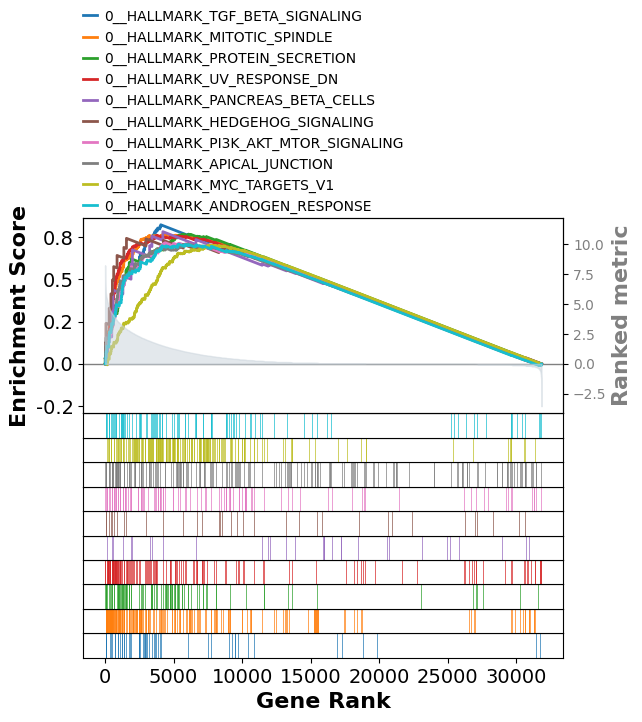

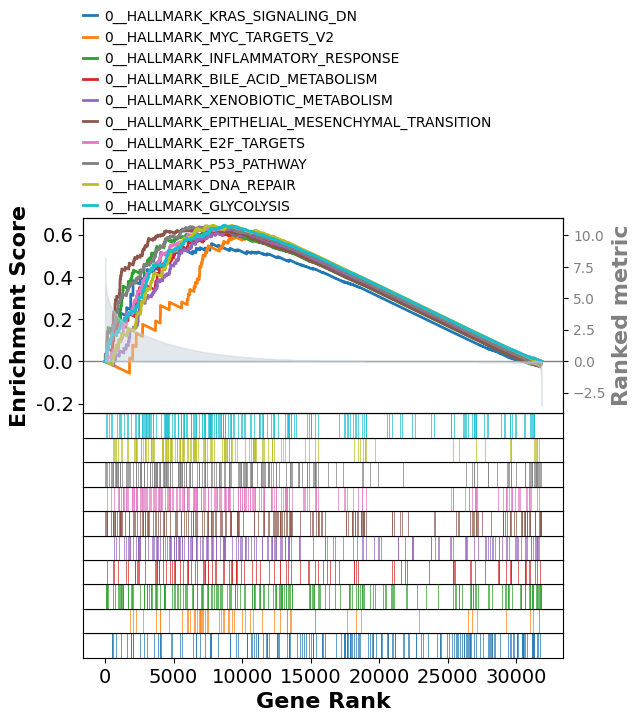

In [50]:
res_df = Biopsy_pre_res.res2d.copy()

# Sort terms by NES (or Score) for up and down separately
top5_up = res_df.sort_values('NES', ascending=False).head(10)['Term']
top5_down = res_df.sort_values('NES', ascending=True).head(10)['Term']

# ----------------------------
# Plot top 5 upregulated terms
# ----------------------------
axs_up = Biopsy_pre_res.plot(
    terms=top5_up,
    show_ranking=True,
    figsize=(3,4)
)
axs_up.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Biopsy_pre_GSEA_terms_top1_up.pdf",
    bbox_inches="tight"
)

# ----------------------------
# Plot top 5 downregulated terms
# ----------------------------
axs_down = Biopsy_pre_res.plot(
    terms=top5_down,
    show_ranking=True,
    figsize=(3,4)
)
axs_down.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Biopsy_pre_GSEA_terms_top10_down.pdf",
    bbox_inches="tight"
)

In [51]:
Endpoint_ventricle_dge_results_df_sorted = Endpoint_ventricle_PTBP1_dge_results_df.sort_values(by='Score', ascending=False)
Endpoint_ventricle_gsea_ranked_input = Endpoint_ventricle_dge_results_df_sorted.set_index('Gene')['Score']

# Run the prerank analysis
Endpoint_ventricle_pre_res = gp.prerank(rnk=Endpoint_ventricle_gsea_ranked_input,
                     gene_sets= [Hallmark_2023],
                     organism='Human',
                     seed=42,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000,
                     no_plot=False,
                     processes=4,
                     weighted_score_type=1,
                     verbose=True)
                     
Endpoint_ventricle_pre_res.res2d.head(20)

2026-01-21 10:12:05,226 [WARNING] Duplicated values found in preranked stats: 54.24% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-01-21 10:12:05,227 [INFO] Parsing data files for GSEA.............................
2026-01-21 10:12:05,235 [INFO] 0000 gene_sets have been filtered out when max_size=500 and min_size=15
2026-01-21 10:12:05,236 [INFO] 0050 gene_sets used for further statistical testing.....
2026-01-21 10:12:05,237 [INFO] Start to run GSEA...Might take a while..................
2026-01-21 10:12:12,054 [INFO] Congratulations. GSEApy runs successfully................



,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,0__HALLMARK_MITOTIC_SPINDLE,0.766439,1.154785,0.0,0.129003,0.123,119/199,16.48%,PDLIM5;PCM1;DST;ROCK1;PAFAH1B1;RICTOR;ARFGEF1;...
1,prerank,0__HALLMARK_UV_RESPONSE_DN,0.771145,1.153979,0.0,0.066001,0.125,93/144,19.16%,PDLIM5;NIPBL;DYRK1A;YTHDC1;NEK7;DLG1;IGF1R;SCA...
2,prerank,0__HALLMARK_PROTEIN_SECRETION,0.771029,1.150139,0.0,0.050001,0.139,64/96,15.78%,GOLGA4;DST;PAM;MON2;ARFGEF1;KIF1B;SEC31A;AP3B1...
3,prerank,0__HALLMARK_MYC_TARGETS_V1,0.732195,1.100108,0.001,0.200004,0.538,147/195,22.70%,HNRNPU;HNRNPA2B1;HNRNPC;HNRNPA3;YWHAE;PABPC1;T...
4,prerank,0__HALLMARK_APICAL_JUNCTION,0.72962,1.098524,0.001,0.168603,0.551,77/196,18.32%,ITGB1;EXOC4;DLG1;PTEN;NF1;VCL;PIK3CB;MYH9;RASA...
5,prerank,0__HALLMARK_ANDROGEN_RESPONSE,0.73326,1.094636,0.01,0.161003,0.603,55/99,19.05%,PDLIM5;PIAS1;VAPA;B2M;XRCC5;ELL2;SLC38A2;ABHD2...
6,prerank,0__HALLMARK_PI3K_AKT_MTOR_SIGNALING,0.730878,1.089979,0.017,0.162575,0.667,59/105,19.60%,ITPR2;PTEN;CLTC;VAV3;GSK3B;UBE2D3;CAB39;MAPK8;...
7,prerank,0__HALLMARK_ANGIOGENESIS,0.743379,1.08074,0.125,0.204004,0.789,13/35,17.16%,LPL;ITGAV;PTK2;VAV2;FGFR1;NRP1;JAG1;JAG2;STC1;...
8,prerank,0__HALLMARK_G2M_CHECKPOINT,0.710474,1.067855,0.021,0.288561,0.914,84/194,17.10%,HNRNPU;PAFAH1B1;SFPQ;YTHDC1;CUL3;NUP98;KIF5B;T...
9,prerank,0__HALLMARK_UNFOLDED_PROTEIN_RESPONSE,0.71441,1.066639,0.048,0.275406,0.929,63/109,20.73%,SEC31A;KIF5B;MTREX;EIF4A2;CNOT2;CNOT4;ATF6;YWH...


2026-01-21 10:12:14 | [INFO] maxp pruned
2026-01-21 10:12:14 | [INFO] cmap pruned
2026-01-21 10:12:14 | [INFO] kern dropped
2026-01-21 10:12:14 | [INFO] post pruned
2026-01-21 10:12:14 | [INFO] FFTM dropped
2026-01-21 10:12:14 | [INFO] GPOS pruned
2026-01-21 10:12:14 | [INFO] GSUB pruned
2026-01-21 10:12:14 | [INFO] name pruned
2026-01-21 10:12:14 | [INFO] glyf pruned
2026-01-21 10:12:14 | [INFO] Added gid0 to subset
2026-01-21 10:12:14 | [INFO] Added first four glyphs to subset
2026-01-21 10:12:14 | [INFO] Closing glyph list over 'GSUB': 20 glyphs before
2026-01-21 10:12:14 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G', 'R', 'S', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 'space', 't']
2026-01-21 10:12:14 | [INFO] Glyph IDs:   [0, 1, 2, 3, 40, 42, 53, 54, 68, 70, 71, 72, 75, 76, 78, 80, 81, 82, 85, 87]
2026-01-21 10:12:14 | [INFO] Closed glyph list over 'GSUB': 20 glyphs after
2026-01-21 10:12:14 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G'

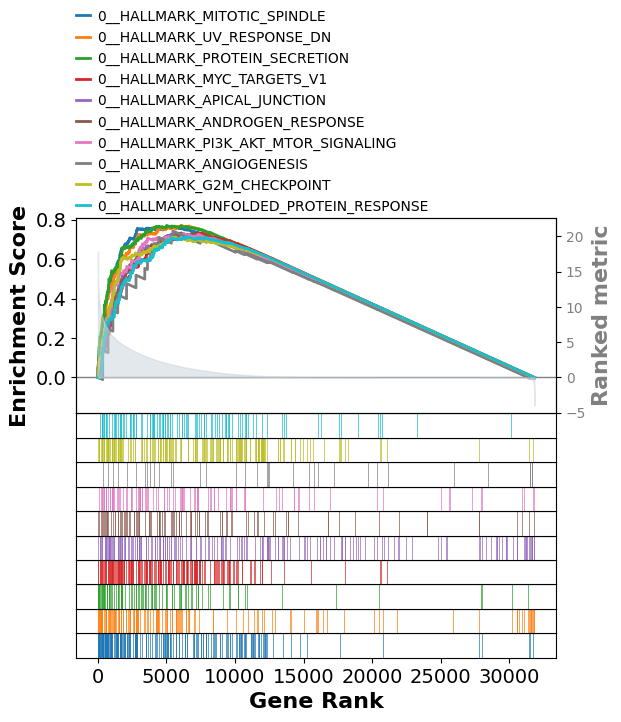

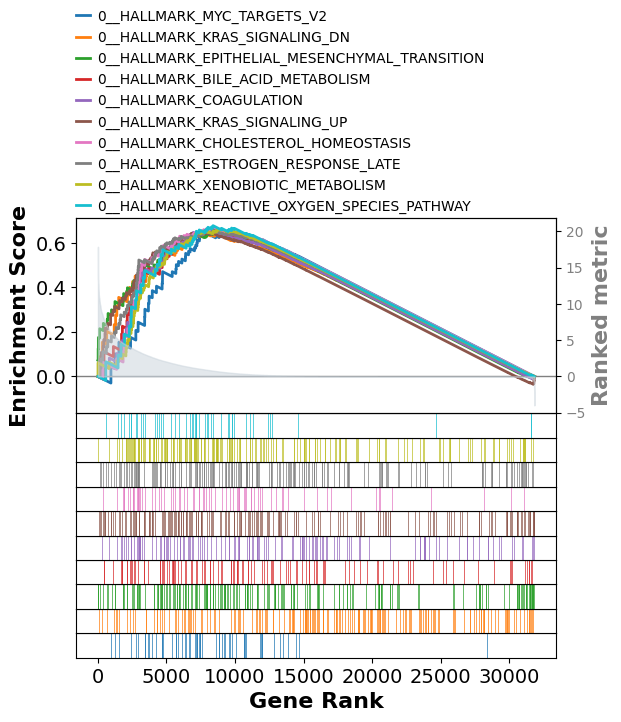

In [52]:
res_df = Endpoint_ventricle_pre_res.res2d.copy()

# Sort terms by NES (or Score) for up and down separately
top5_up = res_df.sort_values('NES', ascending=False).head(10)['Term']
top5_down = res_df.sort_values('NES', ascending=True).head(10)['Term']

# ----------------------------
# Plot top 5 upregulated terms
# ----------------------------
axs_up = Endpoint_ventricle_pre_res.plot(
    terms=top5_up,
    show_ranking=True,
    figsize=(3,4)
)
axs_up.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_ventricle_pre_GSEA_terms_top1_up.pdf",
    bbox_inches="tight"
)

# ----------------------------
# Plot top 5 downregulated terms
# ----------------------------
axs_down = Endpoint_ventricle_pre_res.plot(
    terms=top5_down,
    show_ranking=True,
    figsize=(3,4)
)
axs_down.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_ventricle_pre_GSEA_terms_top10_down.pdf",
    bbox_inches="tight"
)

In [53]:
# export the prerank GSEA results
Endpoint_pre_res.res2d.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_SeptumPTBP1byCell_GSEA_prerank_results.xlsx")
Endpoint_ventricle_pre_res.res2d.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_VentriclePTBP1byCell_GSEA_prerank_results.xlsx")
Biopsy_pre_res.res2d.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Biopsy_SeptumPTBP1byCell_GSEA_prerank_results.xlsx")

### Volcano plots showing specific gene sets

In [54]:
# ---------------------------
# Load the DGE Excel workbook
# ---------------------------
excel_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/SingleCell_PTBP1_DGE_Results.xlsx"

dge_dict = pd.read_excel(excel_path, sheet_name=None, index_col=0)
print("Loaded sheets:", list(dge_dict.keys()))


Loaded sheets: ['Endpoint_Ventricle', 'Endpoint_Septum', 'Biopsy']


In [55]:
for name, df in dge_dict.items():
    print("\n---", name, "---")
    print(df.columns.tolist())



--- Endpoint_Ventricle ---
['Gene', 'Log2FC', 'p_value', 'p_adj', 'Score']

--- Endpoint_Septum ---
['Gene', 'Log2FC', 'p_value', 'p_adj', 'Score']

--- Biopsy ---
['Gene', 'Log2FC', 'p_value', 'p_adj', 'Score']


In [56]:
Kegg_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/c2.cp.kegg_legacy.v2023.2.Hs.symbols.gmt") 
Hallmark_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/h.all.v2023.2.Hs.symbols.gmt")

# Load Hallmark or KEGG
pathway_name = "HALLMARK_OXIDATIVE_PHOSPHORYLATION"  # ← change here

pathway_genes = set(Hallmark_2023[pathway_name])
print("Genes in pathway:", len(pathway_genes))


Genes in pathway: 200


In [57]:
output_dir = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/VolcanoGeneSets_PTBP1_hi_vs_low"
os.makedirs(output_dir, exist_ok=True)


2026-01-21 10:12:39 | [INFO] maxp pruned
2026-01-21 10:12:39 | [INFO] cmap pruned
2026-01-21 10:12:39 | [INFO] kern dropped
2026-01-21 10:12:39 | [INFO] post pruned
2026-01-21 10:12:39 | [INFO] FFTM dropped
2026-01-21 10:12:39 | [INFO] GPOS pruned
2026-01-21 10:12:39 | [INFO] GSUB pruned
2026-01-21 10:12:39 | [INFO] name pruned
2026-01-21 10:12:39 | [INFO] glyf pruned
2026-01-21 10:12:39 | [INFO] Added gid0 to subset
2026-01-21 10:12:39 | [INFO] Added first four glyphs to subset
2026-01-21 10:12:39 | [INFO] Closing glyph list over 'GSUB': 57 glyphs before
2026-01-21 10:12:39 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'g', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'uni2080', 'uni2081', 'v', 'y', 'zero']
2026-01-21 10:1

✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/VolcanoGeneSets_PTBP1_hi_vs_low/Endpoint_Ventricle_HALLMARK_OXIDATIVE_PHOSPHORYLATION_SCORE.pdf


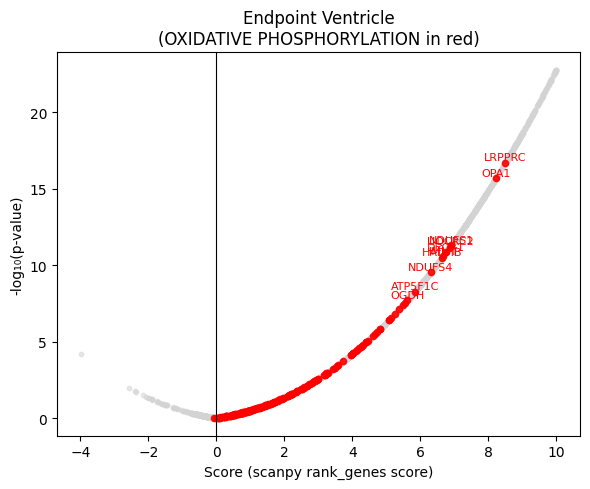

2026-01-21 10:12:41 | [INFO] maxp pruned
2026-01-21 10:12:41 | [INFO] cmap pruned
2026-01-21 10:12:41 | [INFO] kern dropped
2026-01-21 10:12:41 | [INFO] post pruned
2026-01-21 10:12:41 | [INFO] FFTM dropped
2026-01-21 10:12:41 | [INFO] GPOS pruned
2026-01-21 10:12:41 | [INFO] GSUB pruned
2026-01-21 10:12:41 | [INFO] name pruned
2026-01-21 10:12:41 | [INFO] glyf pruned
2026-01-21 10:12:41 | [INFO] Added gid0 to subset
2026-01-21 10:12:41 | [INFO] Added first four glyphs to subset
2026-01-21 10:12:41 | [INFO] Closing glyph list over 'GSUB': 58 glyphs before
2026-01-21 10:12:41 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'a', 'c', 'd', 'e', 'five', 'g', 'hyphen', 'i', 'k', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'uni2080', 'uni2081', 'v', 'y', 'zero']
2

✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/VolcanoGeneSets_PTBP1_hi_vs_low/Endpoint_Septum_HALLMARK_OXIDATIVE_PHOSPHORYLATION_SCORE.pdf


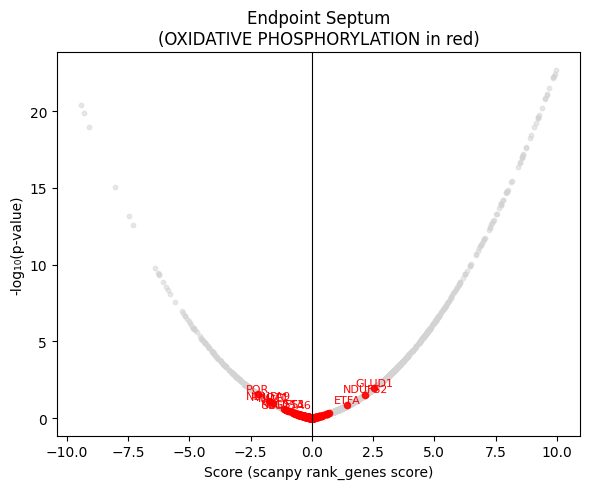

2026-01-21 10:12:43 | [INFO] maxp pruned
2026-01-21 10:12:43 | [INFO] cmap pruned
2026-01-21 10:12:43 | [INFO] kern dropped
2026-01-21 10:12:43 | [INFO] post pruned
2026-01-21 10:12:43 | [INFO] FFTM dropped
2026-01-21 10:12:43 | [INFO] GPOS pruned
2026-01-21 10:12:43 | [INFO] GSUB pruned
2026-01-21 10:12:43 | [INFO] name pruned
2026-01-21 10:12:43 | [INFO] glyf pruned
2026-01-21 10:12:43 | [INFO] Added gid0 to subset
2026-01-21 10:12:43 | [INFO] Added first four glyphs to subset
2026-01-21 10:12:43 | [INFO] Closing glyph list over 'GSUB': 54 glyphs before
2026-01-21 10:12:43 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'g', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'six', 'space', 'two', 'u', 'underscore', 'uni2080', 'uni2081', 'v', 'y', 'zero']
2026-01-21 10:12:43 | [INFO] G

✅ Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/VolcanoGeneSets_PTBP1_hi_vs_low/Biopsy_HALLMARK_OXIDATIVE_PHOSPHORYLATION_SCORE.pdf


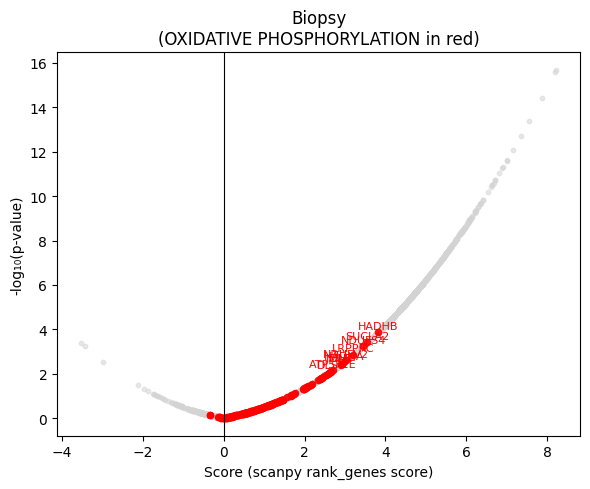

In [58]:
for sheet_name, df in dge_dict.items():

    # Set Gene as index
    if "Gene" in df.columns:
        df = df.set_index("Gene")

    # ---- NEW: Filter on SCORE instead of Log2FC ----
    # Remove extreme outliers so volcano is readable
    df['Score'] = pd.to_numeric(df['Score'], errors='coerce')
    df = df[(df['Score'] > -10) & (df['Score'] < 10)]   # adjustable

    # Ensure numeric columns
    df['p_value'] = pd.to_numeric(df['p_value'], errors='coerce')
    df = df.dropna(subset=['Score', 'p_value'])

    # Compute statistics
    df['-log10(p_value)'] = -np.log10(df['p_value'])
    df['in_pathway'] = df.index.isin(pathway_genes)

    # Top 10 pathway genes by significance
    top10 = df[df['in_pathway']].nlargest(10, '-log10(p_value)')

    # Clean title
    pretty_name = sheet_name.replace("_", " ")

    # -------------------------
    # PLOT
    # -------------------------
    plt.figure(figsize=(6, 5))

    # Background (all other genes)
    plt.scatter(
        df.loc[~df['in_pathway'], 'Score'],
        df.loc[~df['in_pathway'], '-log10(p_value)'],
        color='lightgrey', s=10, alpha=0.5
    )

    # Pathway genes
    plt.scatter(
        df.loc[df['in_pathway'], 'Score'],
        df.loc[df['in_pathway'], '-log10(p_value)'],
        color='red', s=20, alpha=0.9
    )

    # Add labels
    for gene, row in top10.iterrows():
        plt.text(
            row['Score'],
            row['-log10(p_value)'] + 0.15,
            gene,
            fontsize=8,
            color='red',
            ha='center'
        )

    plt.axvline(0, color='black', lw=0.8)
    plt.xlabel("Score (scanpy rank_genes score)")
    plt.ylabel("-log₁₀(p-value)")

    plt.title(f"{pretty_name}\n({pathway_name.replace('HALLMARK_', '').replace('_',' ')} in red)")
    plt.tight_layout()

    # Save to PDF
    pdf_path = os.path.join(output_dir, f"{sheet_name}_{pathway_name}_SCORE.pdf")
    plt.savefig(pdf_path, format='pdf')

    print(f"✅ Saved: {pdf_path}")

    # Show inline
    plt.show()

    # Prevent memory leak
    plt.close()



# GSEA analysis of top up and down genes PTBP1 associated genes - pseudobulk in endothelial cells

In [693]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_endothelial.h5ad"
adata_EC_subset = sc.read_h5ad(output_path)

In [694]:
# Optional: check counts per group per sample
print(pd.crosstab(adata_EC_subset.obs['StrippedDonor'], adata_EC_subset.obs['Location']))

Location          LAD  LeftVentricle  Septum
StrippedDonor                               
BiopsyPatient1      0              0    1345
BiopsyPatient2      0              0     251
BiopsyPatient3      0              0     800
BiopsyPatient4      0              0     654
BiopsyPatient5      0              0    1350
CAV1                0           1050       0
CAV2                0            273       0
CAV3                0           3196    1580
CAV4                0           1077     197
CAV5                0           1917     812
CAV6                0           2059     188
CAV7                0           2427      27
CAV8                0           1294      42
CAV9                0           2118     137
CAV10             887              0    3279
Nontransplant1    513              0    4547
Nontransplant2    147              0    3588
SevereRejection1    0           1331    1192
SevereRejection2    0           1229    1882


### Septal proteins analysis

In [695]:
# Filter for H3 >= 1 and Location == 'Septum'
adata_EC_subset = adata_EC_subset[
    (adata_EC_subset.obs['total_counts_H3'] >= 5)
    & (adata_EC_subset.obs['Location'] == 'Septum')
    & (adata_EC_subset.obs['DiseaseStatus'] != 'LateRejection')
].copy()

print(f"Number of cells after filtering: {adata_EC_subset.n_obs}")

Number of cells after filtering: 10663


In [696]:
def read_gmt(file):
    gmt = {}
    with open(file) as f:
        for line in f:
            parts = line.strip().split("\t")
            gmt[parts[0]] = parts[2:]  # skip description
    return gmt

Kegg_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/c2.cp.kegg_legacy.v2023.2.Hs.symbols.gmt")
Hallmark_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/h.all.v2023.2.Hs.symbols.gmt")


In [697]:
adata_EC_subset

AnnData object with n_obs × n_vars = 10663 × 31844
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_coun

### This will create top % and bottom % by sample type (biopsy vs explant)

In [237]:
# Setting these levels based on only septal samples (do not include ventricle)
# top 10% did not work, not enough biopsy data, and with top 20% the GSEA value dropped off
# setting diff threshold for biopsy and endpoint gives similar results in each (and allows high biopsy samples to be run) but seems unfair to compare biopsy high to CAV high


In [374]:
# Unique values
print("Location unique values:")
print(adata_EC_subset.obs['Location'].unique())

print("\nGraftHost unique values:")
print(adata_EC_subset.obs['GraftHost'].unique())

# Optional: counts of each value
print("\nLocation counts:")
print(adata_EC_subset.obs['Location'].value_counts())

print("\nGraftHost counts:")
print(adata_EC_subset.obs['GraftHost'].value_counts())


Location unique values:
['Septum']
Categories (1, object): ['Septum']

GraftHost unique values:
['Graft', 'Host']
Categories (2, object): ['Graft', 'Host']

Location counts:
Location
Septum    19275
Name: count, dtype: int64

GraftHost counts:
GraftHost
Graft    16035
Host      3240
Name: count, dtype: int64


In [376]:
# Copy obs for manipulation
obs = adata_EC_subset.obs.copy()

# Define new column
obs['PTBP1_H3_group'] = np.nan

# Loop over each SampleType
for sample, df_sample in obs.groupby('SampleType'):
    # Select only cells for threshold calculation
    ref_values = df_sample.loc[
        (df_sample['Location'] == 'Septum') & (df_sample['GraftHost'] == 'Graft') & (df_sample['DiseaseStatus'] != 'LateRejection'),
        'total_counts_PTBP1-1_norm_H3'
    ]
    
    # Compute quartiles only if there are enough reference cells
    if len(ref_values) > 0:
        q_low = ref_values.quantile(0.15)
        q_high = ref_values.quantile(0.85)
        
        # Assign labels to all cells in this SampleType based on the reference thresholds
        obs.loc[df_sample.index, 'PTBP1_H3_group'] = pd.cut(
            df_sample['total_counts_PTBP1-1_norm_H3'],
            bins=[-np.inf, q_low, q_high, np.inf],
            labels=['Low', 'Mid', 'High']
        )
    else:
        # If no reference cells exist, optionally assign 'Mid' to all
        obs.loc[df_sample.index, 'PTBP1_H3_group'] = 'Mid'

# Add back to AnnData
adata_EC_subset.obs['PTBP1_H3_group'] = obs['PTBP1_H3_group']

# Crosstab per SampleType
print(pd.crosstab(adata_EC_subset.obs['SampleType'], adata_EC_subset.obs['PTBP1_H3_group']))

# Summary stats per SampleType and group
group_stats = (
    adata_EC_subset.obs
    .groupby(['SampleType', 'PTBP1_H3_group'])['total_counts_PTBP1-1_norm_H3']
    .agg(['count', 'mean'])
    .reset_index()
    .sort_values(['SampleType', 'PTBP1_H3_group'])
)

print(group_stats)


PTBP1_H3_group  High   Low    Mid
SampleType                       
Biopsy           314   318   1464
HeartTissue     2191  2505  12483
    SampleType PTBP1_H3_group  count      mean
0       Biopsy           High    314  1.068005
1       Biopsy            Low    318  0.152399
2       Biopsy            Mid   1464  0.426668
3  HeartTissue           High   2191  1.949933
4  HeartTissue            Low   2505  0.210293
5  HeartTissue            Mid  12483  0.672873


### This will create top % and bottom % across all samples for pseudobulk analysis


In [698]:
# NOTE: use this version, allows true high and low signal differences, and groups are seen in both CAV and biopsy

# Copy obs for manipulation
obs = adata_EC_subset.obs.copy()

# Define a new column for PTBP1:H3 group
obs['PTBP1_H3_group'] = np.nan

# Compute global thresholds
all_values = obs['total_counts_PTBP1-1_norm_H3']
q_low_global = all_values.quantile(0.30)
q_high_global = all_values.quantile(0.70)

# Assign group labels based on global thresholds
obs['PTBP1_H3_group'] = pd.cut(
    all_values,
    bins=[-np.inf, q_low_global, q_high_global, np.inf],
    labels=['Low', 'Mid', 'High']
)

# Add grouping back to AnnData
adata_EC_subset.obs['PTBP1_H3_group'] = obs['PTBP1_H3_group']

# Optional: check counts per group per sample
print(pd.crosstab(adata_EC_subset.obs['10xRxn'], adata_EC_subset.obs['PTBP1_H3_group']))


PTBP1_H3_group      Low   Mid  High
10xRxn                             
April2025_Sample1   233   223    93
April2025_Sample2   231   377   200
April2025_Sample3   348   266    96
May2025_IVSDuke1     43   538  1935
May2025_IVSDuke2     70   210   112
May2025_RVLVUCLA   2443  2486   759


In [699]:
# Optional: check counts per group per sample
print(pd.crosstab(adata_EC_subset.obs['StrippedDonor'], adata_EC_subset.obs['PTBP1_H3_group']))

PTBP1_H3_group  Low  Mid  High
StrippedDonor                 
BiopsyPatient1   96   74    32
BiopsyPatient2   77   97    65
BiopsyPatient3  166  262   160
BiopsyPatient4  126   96    26
BiopsyPatient5  347  337   106
CAV3             11  228  1297
CAV4             12   60   121
CAV5             20  250   517
CAV6             28  114    45
CAV7              6   14     7
CAV8              7   16    19
CAV9             29   66    41
CAV10           725  696   224
Nontransplant1  955  993   319
Nontransplant2  763  797   216


### This will create top 15% and bottom 15% in each sample, for pseudobulk analysis


In [424]:
# NOTE - this did not work well, do not use

# Create a copy of obs for manipulation
obs = adata_EC_subset.obs.copy()

# Define a new column for PTBP1:H3 group
obs['PTBP1_H3_group'] = np.nan

# Loop over each sample
for sample, df_sample in obs.groupby('10xRxn'):
    # Get the PTBP1:H3 values for this sample
    values = df_sample['total_counts_PTBP1-1_norm_H3']
    
    # Compute quartiles
    q_low = values.quantile(0.15)
    q_high = values.quantile(0.85)
    
    # Assign group labels
    obs.loc[df_sample.index, 'PTBP1_H3_group'] = pd.cut(
        values,
        bins=[-np.inf, q_low, q_high, np.inf],
        labels=['Low', 'Mid', 'High']
    )

# Add the new grouping back to your AnnData object
adata_EC_subset.obs['PTBP1_H3_group'] = obs['PTBP1_H3_group']

# Optional: check counts per group per sample
print(pd.crosstab(adata_EC_subset.obs['10xRxn'], adata_EC_subset.obs['PTBP1_H3_group']))


PTBP1_H3_group     High   Low   Mid
10xRxn                             
May2025_IVSDuke1    552   731  2395
May2025_IVSDuke2    190   254   912
May2025_RVLVUCLA   1055  1536  5624
April2025_Sample1    82    85   397
April2025_Sample2   120   121   566
April2025_Sample3    99   108   512


### Filter and pseudobulk

2025-12-12 09:23:52 | [INFO] maxp pruned
2025-12-12 09:23:52 | [INFO] cmap pruned
2025-12-12 09:23:52 | [INFO] kern dropped
2025-12-12 09:23:52 | [INFO] post pruned
2025-12-12 09:23:52 | [INFO] FFTM dropped
2025-12-12 09:23:52 | [INFO] GPOS pruned
2025-12-12 09:23:52 | [INFO] GSUB pruned
2025-12-12 09:23:52 | [INFO] name pruned
2025-12-12 09:23:52 | [INFO] glyf pruned
2025-12-12 09:23:52 | [INFO] Added gid0 to subset
2025-12-12 09:23:52 | [INFO] Added first four glyphs to subset
2025-12-12 09:23:52 | [INFO] Closing glyph list over 'GSUB': 52 glyphs before
2025-12-12 09:23:52 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'G', 'H', 'L', 'M', 'N', 'P', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'underscore', 'w', 'y', 'z', 'zero']
2025-12-12 09:23:52 | [INFO] Glyph IDs:   

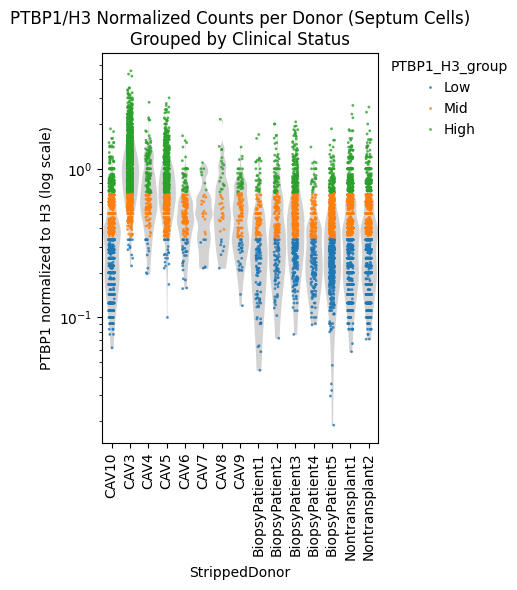

Saved PDF:
/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_PTBP1_Cutoffs_by_Sample.pdf


In [701]:
# -----------------------------
# Donor → Status mapping
# -----------------------------
donor_status_map = {
    "CAV1": "CAV",
    "CAV2": "CAV",
    "CAV3": "CAV",
    "CAV4": "CAV",
    "CAV5": "CAV",
    "CAV6": "CAV",
    "CAV7": "CAV",
    "CAV8": "CAV",
    "CAV9": "CAV",
    "CAV10": "CAV",
    "BiopsyPatient1": "Biopsy",
    "BiopsyPatient2": "Biopsy",
    "BiopsyPatient3": "Biopsy",
    "BiopsyPatient4": "Biopsy",
    "BiopsyPatient5": "Biopsy",
    "Nontransplant1": "Nontransplant",
    "Nontransplant2": "Nontransplant"
}

# -----------------------------
# Filter for Septum cells
# -----------------------------
adata_filtered = adata_EC_subset[
    adata_EC_subset.obs['Location'] == 'Septum'
].copy()

df = adata_filtered.obs[
    ['StrippedDonor', 'PTBP1_H3_group', 'total_counts_PTBP1-1_norm_H3']
].copy()
df["StrippedDonor"] = df["StrippedDonor"].astype(str)

# -----------------------------
# Add the donor status
# -----------------------------
df["Status"] = df["StrippedDonor"].map(donor_status_map)

# Drop donors not in your mapping
df = df.dropna(subset=["Status"])

# Reverse order compared to your current plot
status_order = ["CAV", "Biopsy", "Nontransplant"]
df["Status"] = pd.Categorical(df["Status"], categories=status_order, ordered=True)

# Build donor order respecting reversed status order
donor_order = (
    df.groupby("Status")["StrippedDonor"]
    .unique()
    .reindex(status_order)       # ensures order follows reversed status_order
    .apply(lambda x: sorted(list(x)) if isinstance(x, list) or isinstance(x, np.ndarray) else [])
    .explode()
    .dropna()
    .tolist()
)

df["StrippedDonor"] = pd.Categorical(df["StrippedDonor"], categories=donor_order, ordered=True)

# -----------------------------
# Plot
# -----------------------------
plt.figure(figsize=(5,6))

# Base wide/tight violin
sns.violinplot(
    data=df,
    x="StrippedDonor",
    y="total_counts_PTBP1-1_norm_H3",
    color="lightgray",
    inner=None,
    cut=0,
    width=0.95,
    bw=0.2,
    scale="width",
    linewidth=0
)

# Overlay points colored by PTBP1_H3_group
sns.stripplot(
    data=df,
    x="StrippedDonor",
    y="total_counts_PTBP1-1_norm_H3",
    hue="PTBP1_H3_group",
    dodge=False,
    jitter=0.15,
    size=2,
    alpha=0.8
)

# Log scale
plt.yscale("log")

plt.xticks(rotation=90)
plt.ylabel("PTBP1 normalized to H3 (log scale)")
plt.xlabel("StrippedDonor")

plt.title("PTBP1/H3 Normalized Counts per Donor (Septum Cells)\nGrouped by Clinical Status")

# Improve legend
plt.legend(title="PTBP1_H3_group", bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()

# Save PDF
plt.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_PTBP1_Cutoffs_by_Sample.pdf",
    format="pdf",
    bbox_inches="tight"
)

plt.show()

print("Saved PDF:")
print("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_PTBP1_Cutoffs_by_Sample.pdf")

### Create pseudobulk for late stage transplant tissues and run analysis

In [702]:
# Filter cells in AnnData first
adata_filtered = adata_EC_subset[
#    (adata_EC_subset.obs['DiseaseStatus'] == 'CAV') &
    (adata_EC_subset.obs['SampleType'] == 'HeartTissue') 
#    (adata_EC_subset.obs['GraftHost'] == 'Graft') &
    & (adata_EC_subset.obs['Location'] == 'Septum') 
    & (adata_EC_subset.obs['DiseaseStatus'] != 'LateRejection') 
#    & (adata_EC_subset.obs['DiseaseStatus'] != 'Nontransplant')
].copy()
#adata_filtered = adata_EC_subset.copy()

pdata_filtered = dc.pp.pseudobulk(
    adata=adata_filtered,
    sample_col='StrippedDonor',  
    groups_col=['PTBP1_H3_group'],
    layer='raw_counts',
    mode='sum'
)

# Rename column
pdata_filtered.obs = pdata_filtered.obs.rename(columns={'PTBP1_H3_group': 'PTBP1toH3level'})
pdata_filtered.X = pdata_filtered.X.astype(int)

# Filter pseudobulks: keep only samples with ≥50 cells and ≥1000 counts
dc.pp.filter_samples(pdata_filtered, min_cells=50, min_counts=1000)


In [703]:
pdata_filtered

AnnData object with n_obs × n_vars = 17 × 31844
    obs: 'StrippedDonor', 'PTBP1toH3level', 'souporcell_status', 'souporcell_statusMerge', '10xRxn', 'source', 'total_counts_CITESeq_FreeOligo_BC71', 'total_counts_CITESeq_FreeOligo_BC72', 'total_counts_CITESeq_FreeOligo_BC73', 'total_counts_CITESeq_FreeOligo_BC74', 'total_counts_CITESeq_FreeOligo_BC75', 'total_counts_CITESeq_FreeOligo_BC76', 'total_counts_CITESeq_FreeOligo_BC77', 'total_counts_CITESeq_FreeOligo_BC78', 'total_counts_CITESeq_FreeOligo_BC79', 'total_counts_CITESeq_FreeOligo_BC80', 'total_counts_CITESeq_FreeOligo_BC81', 'total_counts_CITESeq_FreeOligo_BC82', 'total_counts_CITESeq_FreeOligo_BC83', 'total_counts_CITESeq_FreeOligo_BC84', 'total_counts_CITESeq_FreeOligo_BC85', 'total_counts_CITESeq_FreeOligo_BC86', 'total_counts_CITESeq_FreeOligo_BC87', 'total_counts_CITESeq_FreeOligo_BC88', 'total_counts_CITESeq_FreeOligo_BC89', 'total_counts_CITESeq_FreeOligo_BC90', 'SampleType', 'BankSource', 'Location', 'Day', 'ConfidenceOnH

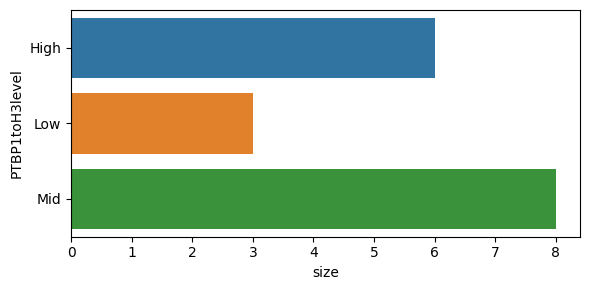

In [704]:
dc.pl.obsbar(
    adata=pdata_filtered,
    y='PTBP1toH3level',
    hue='PTBP1toH3level',
    figsize=(6, 3)
)

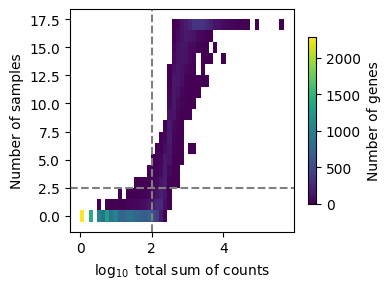

In [705]:
dc.pl.filter_by_expr(
    adata=pdata_filtered,
    group='PTBP1toH3level',
    min_count=10,
    min_total_count=100,
    large_n=10,
    min_prop=0.5,
)


In [706]:
# Step 1: Apply expression filter by group
dc.pp.filter_by_expr(
    adata=pdata_filtered,
    group='PTBP1toH3level',
    min_count=10,
    min_total_count=100,
    large_n=10,
    min_prop=0.5,
)

# Step 2: Apply global proportion filter
dc.pp.filter_by_prop(
    adata=pdata_filtered,
    min_prop=0.1,
    min_smpls=2,
)

In [707]:
# Surviving groups: groups with at least one cell remaining
surviving_groups = pdata_filtered.obs['PTBP1toH3level'].value_counts()
print("Surviving groups and cell counts after filtering:")
print(surviving_groups)

# Optionally, only show groups with >0 cells
surviving_groups = surviving_groups[surviving_groups > 0]
print("\nGroups that survived filtering:")
print(surviving_groups.index.tolist())

Surviving groups and cell counts after filtering:
PTBP1toH3level
Mid     8
High    6
Low     3
Name: count, dtype: int64

Groups that survived filtering:
['Mid', 'High', 'Low']


In [708]:
print("Layers:", pdata_filtered.layers.keys())
print("X dtype:", pdata_filtered.X.dtype)
print("obs columns:", pdata_filtered.obs.columns.tolist())


Layers: KeysView(Layers with keys: psbulk_props)
X dtype: int64
obs columns: ['StrippedDonor', 'PTBP1toH3level', 'souporcell_status', 'souporcell_statusMerge', '10xRxn', 'source', 'total_counts_CITESeq_FreeOligo_BC71', 'total_counts_CITESeq_FreeOligo_BC72', 'total_counts_CITESeq_FreeOligo_BC73', 'total_counts_CITESeq_FreeOligo_BC74', 'total_counts_CITESeq_FreeOligo_BC75', 'total_counts_CITESeq_FreeOligo_BC76', 'total_counts_CITESeq_FreeOligo_BC77', 'total_counts_CITESeq_FreeOligo_BC78', 'total_counts_CITESeq_FreeOligo_BC79', 'total_counts_CITESeq_FreeOligo_BC80', 'total_counts_CITESeq_FreeOligo_BC81', 'total_counts_CITESeq_FreeOligo_BC82', 'total_counts_CITESeq_FreeOligo_BC83', 'total_counts_CITESeq_FreeOligo_BC84', 'total_counts_CITESeq_FreeOligo_BC85', 'total_counts_CITESeq_FreeOligo_BC86', 'total_counts_CITESeq_FreeOligo_BC87', 'total_counts_CITESeq_FreeOligo_BC88', 'total_counts_CITESeq_FreeOligo_BC89', 'total_counts_CITESeq_FreeOligo_BC90', 'SampleType', 'BankSource', 'Location', 

In [709]:
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# -----------------------------
# 1️⃣ Filter for High and Low groups
# -----------------------------
adata_pseudo = pdata_filtered[pdata_filtered.obs['PTBP1toH3level'].isin(['High', 'Low'])].copy()

# Ensure .X is integer counts
adata_pseudo.X = adata_pseudo.X.astype(int)

# -----------------------------
# 2️⃣ Initialize DESeq2
# -----------------------------
inference = DefaultInference(n_cpus=8)

dds = DeseqDataSet(
    adata=adata_pseudo,
    design_factors=['PTBP1toH3level'],  # factor to test
    refit_cooks=True,
    inference=inference
)

# -----------------------------
# 3️⃣ Fit DESeq2 model
# -----------------------------
dds.deseq2()

# -----------------------------
# 4️⃣ Compute differential expression: High vs Low
# -----------------------------
stat_res = DeseqStats(
    dds,
    contrast=["PTBP1toH3level", 'High', 'Low'],
    inference=inference
)

results = stat_res.summary()



Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 2.15 seconds.

Fitting dispersion trend curve...
... done in 0.43 seconds.

Fitting MAP dispersions...
... done in 2.40 seconds.

Fitting LFCs...
... done in 1.23 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.70 seconds.



Log2 fold change & Wald test p-value: PTBP1toH3level High vs Low
          baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
POLR2A   75.867100        0.479626  0.413204  1.160748  0.245744  0.862225
CNDP2    30.636927        0.616360  0.382914  1.609657  0.107473  0.862225
STX18    66.358965        0.066606  0.230816  0.288569  0.772911  0.932415
SNW1     61.876357        0.137951  0.231415  0.596120  0.551095  0.876392
FOXJ3   167.502309        0.146679  0.182098  0.805496  0.420533  0.862225
...            ...             ...       ...       ...       ...       ...
TAF1    114.612837        0.276081  0.180571  1.528931  0.126282  0.862225
CEP68    49.171168       -0.107492  0.336387 -0.319548  0.749311  0.924393
DTNA    104.754957        0.274517  0.389847  0.704164  0.481330  0.870051
CCDC7    66.135925        0.244002  0.274669  0.888347  0.374354  0.862225
IKBKB   101.759822        0.439574  0.314394  1.398164  0.162064  0.862225

[3932 rows x 6 columns]


In [710]:
# Extract results
Pseudobulk_results_endpoint_df = stat_res.results_df
Pseudobulk_results_endpoint_df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
POLR2A,75.867100,0.479626,0.413204,1.160748,0.245744,0.862225
CNDP2,30.636927,0.616360,0.382914,1.609657,0.107473,0.862225
STX18,66.358965,0.066606,0.230816,0.288569,0.772911,0.932415
SNW1,61.876357,0.137951,0.231415,0.596120,0.551095,0.876392
FOXJ3,167.502309,0.146679,0.182098,0.805496,0.420533,0.862225
...,...,...,...,...,...,...
TAF1,114.612837,0.276081,0.180571,1.528931,0.126282,0.862225
CEP68,49.171168,-0.107492,0.336387,-0.319548,0.749311,0.924393
DTNA,104.754957,0.274517,0.389847,0.704164,0.481330,0.870051
CCDC7,66.135925,0.244002,0.274669,0.888347,0.374354,0.862225


In [711]:
Pseudobulk_results_endpoint_df.loc[Pseudobulk_results_endpoint_df.index.str.contains("PTBP1", case=False, na=False)]


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
PTBP1,45.711401,0.867952,0.472897,1.835393,0.066447,0.862225


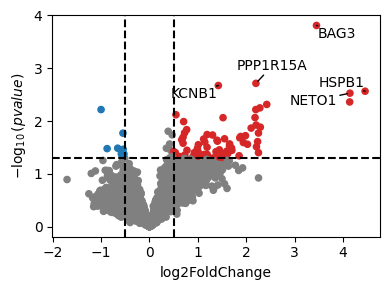

In [712]:
dc.pl.volcano(Pseudobulk_results_endpoint_df, x='log2FoldChange', y='pvalue')

In [713]:
Pseudobulk_results_df_sorted = Pseudobulk_results_endpoint_df.sort_values(by='stat', ascending=False)
Pseudobulk_gsea_ranked_input = Pseudobulk_results_df_sorted['stat']

# Run prerank GSEA
Pseudobulk_endpoint_pre_res = gp.prerank(
    rnk=Pseudobulk_gsea_ranked_input,
    gene_sets=[Hallmark_2023],
    organism='Human',
    seed=42,
    min_size=15,
    max_size=500,
    permutation_num=1000,
    no_plot=False,
    processes=4,
    verbose=True
)

# Inspect top results
Pseudobulk_endpoint_pre_res.res2d.head(10)

2025-12-12 09:24:36,433 [INFO] Parsing data files for GSEA.............................
2025-12-12 09:24:36,438 [INFO] 0007 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-12 09:24:36,439 [INFO] 0043 gene_sets used for further statistical testing.....
2025-12-12 09:24:36,439 [INFO] Start to run GSEA...Might take a while..................
2025-12-12 09:24:37,015 [INFO] Congratulations. GSEApy runs successfully................



,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,0__HALLMARK_P53_PATHWAY,0.556993,2.105383,0.0,0.0,0.0,24/47,24.08%,PPP1R15A;ATF3;PTPN14;UPP1;MXD4;IP6K2;BAIAP2;PV...
1,prerank,0__HALLMARK_TGF_BETA_SIGNALING,0.557108,2.043821,0.0,0.0,0.0,23/36,26.35%,PPP1R15A;SMAD7;SMURF1;SMAD3;WWTR1;SERPINE1;SKI...
2,prerank,0__HALLMARK_COAGULATION,0.58138,1.991002,0.0,0.001031,0.003,17/29,23.40%,ITGB3;PRSS23;WDR1;VWF;SERPINE1;GSN;RAPGEF3;PDG...
3,prerank,0__HALLMARK_HYPOXIA,0.492386,1.931236,0.0,0.001804,0.007,28/56,27.92%,PPP1R15A;ATF3;FOSL2;EGFR;AKAP12;SERPINE1;STC1;...
4,prerank,0__HALLMARK_KRAS_SIGNALING_UP,0.492079,1.914725,0.0,0.001855,0.009,22/53,23.88%,PPP1R15A;TSPAN13;ADAM17;AKAP12;MTMR10;CA2;ABCB...
5,prerank,0__HALLMARK_OXIDATIVE_PHOSPHORYLATION,-0.498821,-1.836063,0.011029,0.024269,0.028,12/18,23.04%,NDUFS4;ATP6V1H;NDUFS1;OGDH;DECR1;OPA1;UQCRC2;R...
6,prerank,0__HALLMARK_WNT_BETA_CATENIN_SIGNALING,0.616653,1.816408,0.001401,0.005669,0.033,10/15,24.06%,ADAM17;GNAI1;CTNNB1;LEF1;NOTCH4;NCOR2;PPARD;JA...
7,prerank,0__HALLMARK_ESTROGEN_RESPONSE_LATE,0.495042,1.814711,0.001236,0.005154,0.035,16/38,15.31%,MYOF;TSPAN13;ASS1;PRSS23;CA2;UNC13B;EMP2;RBBP8...
8,prerank,0__HALLMARK_TNFA_SIGNALING_VIA_NFKB,0.447659,1.783714,0.002309,0.007473,0.057,36/61,35.12%,PPP1R15A;ATF3;TNFAIP8;SPSB1;DUSP5;SMAD3;FOSL2;...
9,prerank,0__HALLMARK_XENOBIOTIC_METABOLISM,0.501683,1.767786,0.002561,0.008476,0.071,13/29,17.01%,UPP1;ATOH8;CA2;SERPINE1;CNDP2;ELOVL5;PAPSS2;IG...


In [714]:
# Make a copy of results
gsea_res = Pseudobulk_endpoint_pre_res.res2d.copy()

# Sort by NES (Normalized Enrichment Score)
gsea_res_sorted_pos = gsea_res.sort_values(by='NES', ascending=False)  # top positive
gsea_res_sorted_neg = gsea_res.sort_values(by='NES', ascending=True)   # top negative

# Display top 10 positively enriched gene sets
print("Top 10 positively enriched gene sets:")
print(gsea_res_sorted_pos.head(10))

# Display top 10 negatively enriched gene sets
print("\nTop 10 negatively enriched gene sets:")
print(gsea_res_sorted_neg.head(10))


Top 10 positively enriched gene sets:
       Name                                    Term        ES       NES  \
0   prerank                 0__HALLMARK_P53_PATHWAY  0.556993  2.105383   
1   prerank          0__HALLMARK_TGF_BETA_SIGNALING  0.557108  2.043821   
2   prerank                 0__HALLMARK_COAGULATION   0.58138  1.991002   
3   prerank                     0__HALLMARK_HYPOXIA  0.492386  1.931236   
4   prerank           0__HALLMARK_KRAS_SIGNALING_UP  0.492079  1.914725   
6   prerank  0__HALLMARK_WNT_BETA_CATENIN_SIGNALING  0.616653  1.816408   
7   prerank      0__HALLMARK_ESTROGEN_RESPONSE_LATE  0.495042  1.814711   
8   prerank     0__HALLMARK_TNFA_SIGNALING_VIA_NFKB  0.447659  1.783714   
9   prerank       0__HALLMARK_XENOBIOTIC_METABOLISM  0.501683  1.767786   
10  prerank         0__HALLMARK_IL2_STAT5_SIGNALING  0.429351  1.754726   

   NOM p-val FDR q-val FWER p-val  Tag %  Gene %  \
0        0.0       0.0        0.0  24/47  24.08%   
1        0.0       0.0        0.

In [715]:
# Save pseudobulk and GSEA results
Pseudobulk_results_endpoint_df.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_SeptumPTBP1pseudoBulkTop15perc_DGE.xlsx")
Pseudobulk_endpoint_pre_res.res2d.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_SeptumPTBP1pseudoBulkTop15perc_GSEA_prerank_results.xlsx")


### Create pseudobulk for biopsy samples and run analysis

In [716]:
# Filter cells in AnnData first
adata_filtered = adata_EC_subset[
#    (adata_EC_subset.obs['DiseaseStatus'] == 'CAV') &
    (adata_EC_subset.obs['SampleType'] == 'Biopsy') &
#    (adata_EC_subset.obs['GraftHost'] == 'Graft') &
    (adata_EC_subset.obs['Location'] == 'Septum')
].copy()
#adata_filtered = adata_EC_subset.copy()

pdata_filtered = dc.pp.pseudobulk(
    adata=adata_filtered,
    sample_col='StrippedDonor',  
    groups_col=['PTBP1_H3_group'],
    layer='raw_counts',
    mode='sum'
)

# Rename column
pdata_filtered.obs = pdata_filtered.obs.rename(columns={'PTBP1_H3_group': 'PTBP1toH3level'})
pdata_filtered.X = pdata_filtered.X.astype(int)

# Filter pseudobulks: keep only samples with ≥50 cells and ≥1000 counts
dc.pp.filter_samples(pdata_filtered, min_cells=50, min_counts=1000)


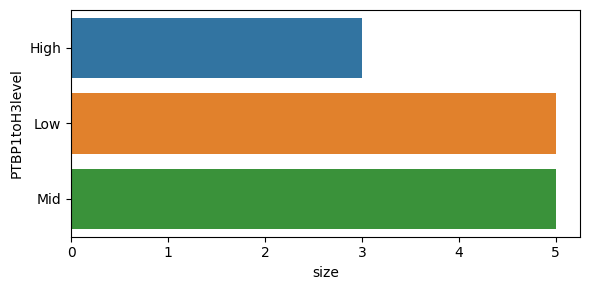

In [717]:
dc.pl.obsbar(
    adata=pdata_filtered,
    y='PTBP1toH3level',
    hue='PTBP1toH3level',
    figsize=(6, 3)
)

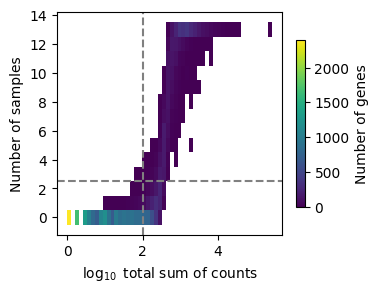

In [718]:
dc.pl.filter_by_expr(
    adata=pdata_filtered,
    group='PTBP1toH3level',
    min_count=10,
    min_total_count=100,
    large_n=10,
    min_prop=0.5,
)


In [719]:
# Step 1: Apply expression filter by group
dc.pp.filter_by_expr(
    adata=pdata_filtered,
    group='PTBP1toH3level',
    min_count=10,
    min_total_count=100,
    large_n=10,
    min_prop=0.5,
)

# Step 2: Apply global proportion filter
dc.pp.filter_by_prop(
    adata=pdata_filtered,
    min_prop=0.1,
    min_smpls=2,
)

In [720]:
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# -----------------------------
# 1️⃣ Filter for High and Low groups
# -----------------------------
adata_pseudo = pdata_filtered[pdata_filtered.obs['PTBP1toH3level'].isin(['High', 'Low'])].copy()

# Ensure .X is integer counts
adata_pseudo.X = adata_pseudo.X.astype(int)

# -----------------------------
# 2️⃣ Initialize DESeq2
# -----------------------------
inference = DefaultInference(n_cpus=8)

dds = DeseqDataSet(
    adata=adata_pseudo,
    design_factors=['PTBP1toH3level'],  # factor to test
    refit_cooks=True,
    inference=inference
)

# -----------------------------
# 3️⃣ Fit DESeq2 model
# -----------------------------
dds.deseq2()

# -----------------------------
# 4️⃣ Compute differential expression: High vs Low
# -----------------------------
stat_res = DeseqStats(
    dds,
    contrast=["PTBP1toH3level", 'High', 'Low'],
    inference=inference
)

results = stat_res.summary()


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 2.88 seconds.

Fitting dispersion trend curve...
... done in 0.70 seconds.

Fitting MAP dispersions...
... done in 3.07 seconds.

Fitting LFCs...
... done in 5.70 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.97 seconds.



Log2 fold change & Wald test p-value: PTBP1toH3level High vs Low
         baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
MMP28   13.909884       -0.132878  0.552140 -0.240661  0.809818  0.99997
POLR2A  35.906925        0.374235  0.356908  1.048547  0.294387  0.99997
CNDP2   20.539828       -0.335982  0.405934 -0.827675  0.407855  0.99997
STX18   28.440371        0.344289  0.490734  0.701579  0.482942  0.99997
TCAF1   19.215211        0.121150  0.449500  0.269522  0.787528  0.99997
...           ...             ...       ...       ...       ...      ...
KRBOX4  16.289886       -0.324435  0.456246 -0.711097  0.477024  0.99997
DTNA    24.741434        0.030596  0.798712  0.038306  0.969443  0.99997
MEAF6   14.330188       -0.395590  0.434284 -0.910901  0.362347  0.99997
CCDC7   60.680018       -0.196282  0.312349 -0.628407  0.529738  0.99997
IKBKB   61.223221       -0.345755  0.336476 -1.027576  0.304149  0.99997

[5623 rows x 6 columns]


In [721]:
# Extract results
Pseudobulk_results_biopsy_df = stat_res.results_df
Pseudobulk_results_biopsy_df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
MMP28,13.909884,-0.132878,0.552140,-0.240661,0.809818,0.99997
POLR2A,35.906925,0.374235,0.356908,1.048547,0.294387,0.99997
CNDP2,20.539828,-0.335982,0.405934,-0.827675,0.407855,0.99997
STX18,28.440371,0.344289,0.490734,0.701579,0.482942,0.99997
TCAF1,19.215211,0.121150,0.449500,0.269522,0.787528,0.99997
...,...,...,...,...,...,...
KRBOX4,16.289886,-0.324435,0.456246,-0.711097,0.477024,0.99997
DTNA,24.741434,0.030596,0.798712,0.038306,0.969443,0.99997
MEAF6,14.330188,-0.395590,0.434284,-0.910901,0.362347,0.99997
CCDC7,60.680018,-0.196282,0.312349,-0.628407,0.529738,0.99997


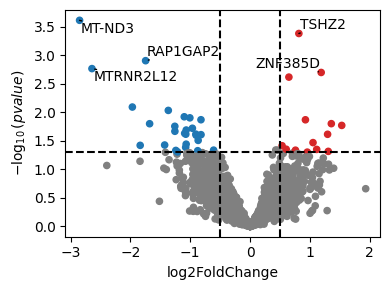

In [722]:
dc.pl.volcano(Pseudobulk_results_biopsy_df, x='log2FoldChange', y='pvalue')

In [723]:
Pseudobulk_results_df_sorted = Pseudobulk_results_biopsy_df.sort_values(by='stat', ascending=False)
Pseudobulk_gsea_ranked_input = Pseudobulk_results_df_sorted['stat']

# Run prerank GSEA
Pseudobulk_biopsy_pre_res = gp.prerank(
    rnk=Pseudobulk_gsea_ranked_input,
    gene_sets=[Kegg_2023, Hallmark_2023],
    organism='Human',
    seed=42,
    min_size=15,
    max_size=500,
    permutation_num=1000,
    no_plot=False,
    processes=4,
    verbose=True
)

# Inspect top results
Pseudobulk_biopsy_pre_res.res2d.head(10)

2025-12-12 09:25:19,027 [INFO] Parsing data files for GSEA.............................
2025-12-12 09:25:19,033 [INFO] 0092 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-12 09:25:19,034 [INFO] 0144 gene_sets used for further statistical testing.....
2025-12-12 09:25:19,035 [INFO] Start to run GSEA...Might take a while..................
2025-12-12 09:25:21,120 [INFO] Congratulations. GSEApy runs successfully................



,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,0__KEGG_RIBOSOME,0.747378,2.357325,0.0,0.0,0.0,15/19,16.73%,RPL10;RPL11;RPS12;RPL41;RPL34;RPL5;RPL13;RPS7;...
1,prerank,1__HALLMARK_INTERFERON_ALPHA_RESPONSE,-0.460812,-1.808409,0.001597,0.077899,0.109,33/65,29.02%,SLC25A28;HERC6;SAMD9;CSF1;PARP9;STAT2;IFI44;DD...
2,prerank,0__KEGG_VIRAL_MYOCARDITIS,0.476444,1.682156,0.009709,0.338358,0.3,18/31,27.87%,ACTB;HLA-DRA;HLA-DQB1;FYN;ABL1;ACTG1;EIF4G3;MY...
3,prerank,0__KEGG_ANTIGEN_PROCESSING_AND_PRESENTATION,0.465618,1.676814,0.009852,0.233515,0.308,17/33,26.62%,HLA-DRA;HLA-DQB1;CANX;CTSB;B2M;CALR;PDIA3;HSP9...
4,prerank,0__KEGG_ALZHEIMERS_DISEASE,0.419108,1.654042,0.004963,0.206509,0.353,19/46,21.27%,CALM2;GSK3B;CASP7;ADAM10;MAPK1;GAPDH;APP;PPP3R...
5,prerank,0__KEGG_MELANOGENESIS,0.417796,1.57296,0.013158,0.320884,0.565,12/36,10.97%,GNAS;CALM2;KRAS;GSK3B;KITLG;CTNNB1;GNAI1;MAPK1...
6,prerank,0__KEGG_PURINE_METABOLISM,-0.448789,-1.567374,0.018771,0.460283,0.716,18/38,25.45%,PDE3B;NPR1;POLR2J3;PDE9A;PRIM2;ADCY4;POLA2;PDE...
7,prerank,1__HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,0.493896,1.543292,0.038375,0.326973,0.624,2/17,1.67%,TXN;PFKP
8,prerank,0__KEGG_UBIQUITIN_MEDIATED_PROTEOLYSIS,0.342437,1.529738,0.007853,0.309991,0.658,49/89,35.75%,PIAS1;UBE2R2;NEDD4;ITCH;CBLB;ELOC;CDC27;UBE2Q2...
9,prerank,0__KEGG_PATHOGENIC_ESCHERICHIA_COLI_INFECTION,0.426536,1.507086,0.035264,0.314927,0.707,11/30,17.91%,ACTB;FYN;CTNNB1;TUBB6;ABL1;CDC42;WASL;ACTG1;TU...


In [724]:
# Make a copy of results
gsea_res = Pseudobulk_biopsy_pre_res.res2d.copy()

# Sort by NES (Normalized Enrichment Score)
gsea_res_sorted_pos = gsea_res.sort_values(by='NES', ascending=False)  # top positive
gsea_res_sorted_neg = gsea_res.sort_values(by='NES', ascending=True)   # top negative

# Display top 10 positively enriched gene sets
print("Top 10 positively enriched gene sets:")
print(gsea_res_sorted_pos.head(10))

# Display top 10 negatively enriched gene sets
print("\nTop 10 negatively enriched gene sets:")
print(gsea_res_sorted_neg.head(10))


Top 10 positively enriched gene sets:
       Name                                           Term        ES  \
0   prerank                               0__KEGG_RIBOSOME  0.747378   
2   prerank                      0__KEGG_VIRAL_MYOCARDITIS  0.476444   
3   prerank    0__KEGG_ANTIGEN_PROCESSING_AND_PRESENTATION  0.465618   
4   prerank                     0__KEGG_ALZHEIMERS_DISEASE  0.419108   
5   prerank                          0__KEGG_MELANOGENESIS  0.417796   
7   prerank    1__HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY  0.493896   
8   prerank         0__KEGG_UBIQUITIN_MEDIATED_PROTEOLYSIS  0.342437   
9   prerank  0__KEGG_PATHOGENIC_ESCHERICHIA_COLI_INFECTION  0.426536   
14  prerank                          0__KEGG_AXON_GUIDANCE  0.348884   
15  prerank                        1__HALLMARK_COAGULATION  0.381861   

         NES NOM p-val FDR q-val FWER p-val  Tag %  Gene %  \
0   2.357325       0.0       0.0        0.0  15/19  16.73%   
2   1.682156  0.009709  0.338358        0.3  

2025-12-12 09:25:22 | [INFO] maxp pruned
2025-12-12 09:25:22 | [INFO] cmap pruned
2025-12-12 09:25:22 | [INFO] kern dropped
2025-12-12 09:25:22 | [INFO] post pruned
2025-12-12 09:25:22 | [INFO] FFTM dropped
2025-12-12 09:25:22 | [INFO] GPOS pruned
2025-12-12 09:25:22 | [INFO] GSUB pruned
2025-12-12 09:25:22 | [INFO] name pruned
2025-12-12 09:25:22 | [INFO] glyf pruned
2025-12-12 09:25:22 | [INFO] Added gid0 to subset
2025-12-12 09:25:22 | [INFO] Added first four glyphs to subset
2025-12-12 09:25:22 | [INFO] Closing glyph list over 'GSUB': 20 glyphs before
2025-12-12 09:25:22 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G', 'R', 'S', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 'space', 't']
2025-12-12 09:25:22 | [INFO] Glyph IDs:   [0, 1, 2, 3, 40, 42, 53, 54, 68, 70, 71, 72, 75, 76, 78, 80, 81, 82, 85, 87]
2025-12-12 09:25:22 | [INFO] Closed glyph list over 'GSUB': 20 glyphs after
2025-12-12 09:25:22 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G'

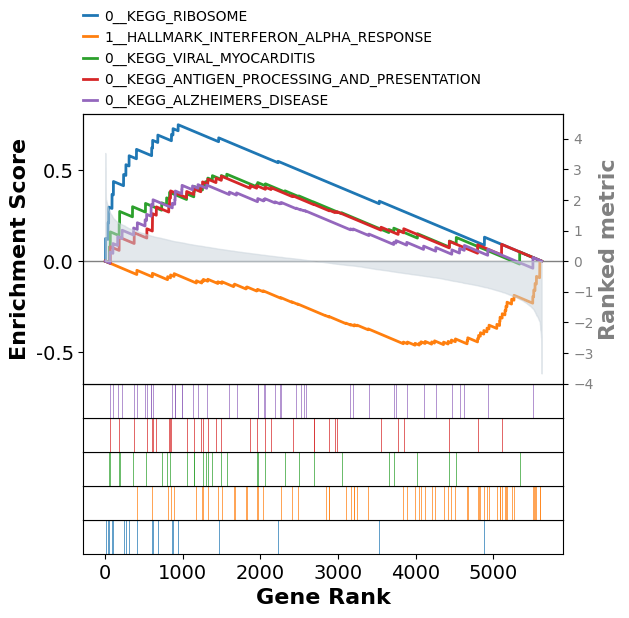

In [725]:
terms = Pseudobulk_biopsy_pre_res.res2d.Term
axs = Pseudobulk_biopsy_pre_res.plot(terms=terms[0:5],
                   #legend_kws={'loc': (1.2, 0)}, # set the legend loc
                   show_ranking=True, # whether to show the second yaxis
                   figsize=(3,4)
                  )

axs.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_Biopsy_pre_GSEA_terms_top5.pdf",
    bbox_inches="tight"
)

In [726]:
# Save pseudobulk and GSEA results
Pseudobulk_results_biopsy_df.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Biopsy_SeptumPTBP1pseudoBulkTop15perc_DGE.xlsx")
Pseudobulk_biopsy_pre_res.res2d.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Biopsy_SeptumPTBP1pseudoBulkTop15perc_GSEA_prerank_results.xlsx")


### Create pseudobulk for all samples (joining biopsy and explant) and run analysis

In [727]:
# Filter cells in AnnData first
adata_filtered = adata_EC_subset[
#    (adata_EC_subset.obs['DiseaseStatus'] == 'CAV') &
#    (adata_EC_subset.obs['SampleType'] == 'Biopsy') &
#    (adata_EC_subset.obs['GraftHost'] == 'Graft') &
    (adata_EC_subset.obs['Location'] == 'Septum')
    & (adata_EC_subset.obs['DiseaseStatus'] != 'LateRejection') 
].copy()
#adata_filtered = adata_EC_subset.copy()

pdata_filtered = dc.pp.pseudobulk(
    adata=adata_filtered,
    sample_col='StrippedDonor',  
    groups_col=['PTBP1_H3_group'],
    layer='raw_counts',
    mode='sum'
)

# Rename column
pdata_filtered.obs = pdata_filtered.obs.rename(columns={'PTBP1_H3_group': 'PTBP1toH3level'})
pdata_filtered.X = pdata_filtered.X.astype(int)

# Filter pseudobulks: keep only samples with ≥50 cells and ≥1000 counts
dc.pp.filter_samples(pdata_filtered, min_cells=50, min_counts=1000)


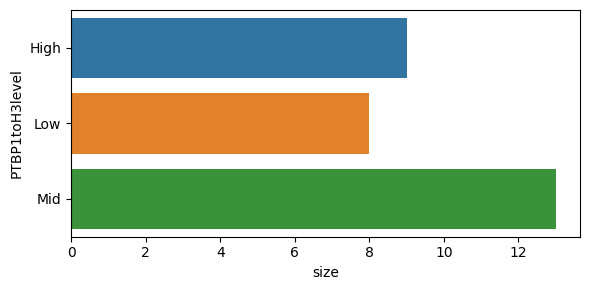

In [728]:
dc.pl.obsbar(
    adata=pdata_filtered,
    y='PTBP1toH3level',
    hue='PTBP1toH3level',
    figsize=(6, 3)
)

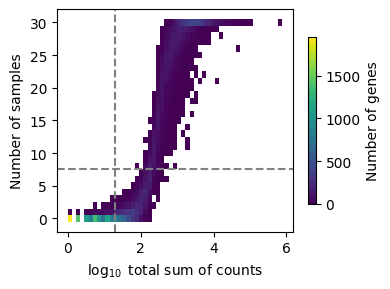

In [729]:
dc.pl.filter_by_expr(
    adata=pdata_filtered,
    group='PTBP1toH3level',
    min_count=5,
    min_total_count=20,
    large_n=10,
    min_prop=0.2,
)


In [730]:
# Step 1: Apply expression filter by group
dc.pp.filter_by_expr(
    adata=pdata_filtered,
    group='PTBP1toH3level',
    min_count=5,
    min_total_count=20,
    large_n=10,
    min_prop=0.2,
)

# Step 2: Apply global proportion filter
dc.pp.filter_by_prop(
    adata=pdata_filtered,
    min_prop=0.1,
    min_smpls=2,
)

In [731]:
# Surviving groups: groups with at least one cell remaining
surviving_groups = pdata_filtered.obs['PTBP1toH3level'].value_counts()
print("Surviving groups and cell counts after filtering:")
print(surviving_groups)

# Optionally, only show groups with >0 cells
surviving_groups = surviving_groups[surviving_groups > 0]
print("\nGroups that survived filtering:")
print(surviving_groups.index.tolist())


Surviving groups and cell counts after filtering:
PTBP1toH3level
Mid     13
High     9
Low      8
Name: count, dtype: int64

Groups that survived filtering:
['Mid', 'High', 'Low']


In [732]:
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# -----------------------------
# 1️⃣ Filter for High and Low groups
# -----------------------------
adata_pseudo = pdata_filtered[pdata_filtered.obs['PTBP1toH3level'].isin(['High', 'Low'])].copy()

# Ensure .X is integer counts
adata_pseudo.X = adata_pseudo.X.astype(int)

# -----------------------------
# 2️⃣ Initialize DESeq2
# -----------------------------
inference = DefaultInference(n_cpus=8)

dds = DeseqDataSet(
    adata=adata_pseudo,
    design_factors=['PTBP1toH3level'],  # factor to test
    refit_cooks=True,
    inference=inference
)

# -----------------------------
# 3️⃣ Fit DESeq2 model
# -----------------------------
dds.deseq2()

# -----------------------------
# 4️⃣ Compute differential expression: High vs Low
# -----------------------------
stat_res = DeseqStats(
    dds,
    contrast=["PTBP1toH3level", 'High', 'Low'],
    inference=inference
)

results = stat_res.summary()


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 4.39 seconds.

Fitting dispersion trend curve...
... done in 1.10 seconds.

Fitting MAP dispersions...
... done in 4.73 seconds.

Fitting LFCs...
... done in 2.77 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 30 outlier genes.

Fitting dispersions...
... done in 0.12 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting LFCs...
... done in 0.03 seconds.

Running Wald tests...
... done in 1.30 seconds.



Log2 fold change & Wald test p-value: PTBP1toH3level High vs Low
         baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
MMP28   17.373437        0.331263  0.370930  0.893061  0.371825  0.927648
POLR2A  53.688517        0.504783  0.257557  1.959885  0.050009  0.835374
CNDP2   25.299778        0.179242  0.269489  0.665118  0.505975  0.947522
STX18   44.968861        0.269722  0.239021  1.128442  0.259133  0.912477
TCAF1   19.671081       -0.285482  0.400127 -0.713478  0.475550  0.945864
...           ...             ...       ...       ...       ...       ...
DTNA    58.694865        0.565156  0.493840  1.144413  0.252452  0.912477
MEAF6   17.226158       -0.225588  0.206640 -1.091694  0.274968  0.912477
CCDC7   63.960974       -0.130629  0.234454 -0.557164  0.577416  0.957613
IKBKB   79.701572        0.128662  0.229846  0.559775  0.575633  0.957613
NMI     13.974718       -0.015328  0.288096 -0.053203  0.957570  0.997629

[7838 rows x 6 columns]


In [733]:
# Extract results
Pseudobulk_results_biopsy_and_hearttissue_df = stat_res.results_df
Pseudobulk_results_biopsy_and_hearttissue_df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
MMP28,17.373437,0.331263,0.370930,0.893061,0.371825,0.927648
POLR2A,53.688517,0.504783,0.257557,1.959885,0.050009,0.835374
CNDP2,25.299778,0.179242,0.269489,0.665118,0.505975,0.947522
STX18,44.968861,0.269722,0.239021,1.128442,0.259133,0.912477
TCAF1,19.671081,-0.285482,0.400127,-0.713478,0.475550,0.945864
...,...,...,...,...,...,...
DTNA,58.694865,0.565156,0.493840,1.144413,0.252452,0.912477
MEAF6,17.226158,-0.225588,0.206640,-1.091694,0.274968,0.912477
CCDC7,63.960974,-0.130629,0.234454,-0.557164,0.577416,0.957613
IKBKB,79.701572,0.128662,0.229846,0.559775,0.575633,0.957613


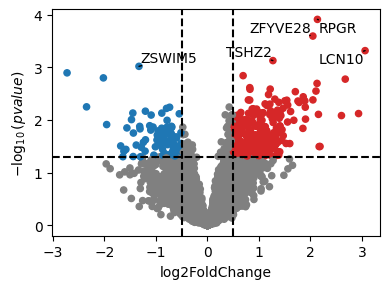

In [734]:
dc.pl.volcano(Pseudobulk_results_biopsy_and_hearttissue_df, x='log2FoldChange', y='pvalue')

In [735]:
Pseudobulk_results_df_sorted = Pseudobulk_results_biopsy_and_hearttissue_df.sort_values(by='stat', ascending=False)
Pseudobulk_gsea_ranked_input = Pseudobulk_results_df_sorted['stat']

# Run prerank GSEA
Pseudobulk_biopsy_and_hearttissue_pre_res = gp.prerank(
    rnk=Pseudobulk_gsea_ranked_input,
    gene_sets=[Hallmark_2023],
    organism='Human',
    seed=42,
    min_size=15,
    max_size=500,
    permutation_num=1000,
    no_plot=False,
    processes=4,
    verbose=True
)

# Inspect top results
Pseudobulk_biopsy_and_hearttissue_pre_res.res2d.head(10)

2025-12-12 09:26:21,205 [INFO] Parsing data files for GSEA.............................
2025-12-12 09:26:21,209 [INFO] 0001 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-12 09:26:21,210 [INFO] 0049 gene_sets used for further statistical testing.....
2025-12-12 09:26:21,211 [INFO] Start to run GSEA...Might take a while..................
2025-12-12 09:26:22,412 [INFO] Congratulations. GSEApy runs successfully................



,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,0__HALLMARK_ESTROGEN_RESPONSE_LATE,0.500498,2.011224,0.0,0.003197,0.003,23/65,13.66%,CA2;TSPAN13;UNC13B;FKBP5;DNAJC1;NCOR2;AFF1;ASS...
1,prerank,0__HALLMARK_OXIDATIVE_PHOSPHORYLATION,-0.415306,-1.97582,0.0,0.003509,0.004,61/97,39.00%,HSPA9;ATP6V1H;NDUFA9;OGDH;NQO2;VDAC2;AIFM1;NDU...
2,prerank,0__HALLMARK_HEDGEHOG_SIGNALING,0.646495,1.945542,0.0,0.005862,0.011,12/18,20.13%,MYH9;PML;NF1;HEY1;CDK6;OPHN1;TLE1;ADGRG1;NRP2;...
3,prerank,0__HALLMARK_TGF_BETA_SIGNALING,0.514999,1.911311,0.0,0.004618,0.013,14/44,8.97%,FKBP1A;CTNNB1;WWTR1;SPTBN1;SMAD6;BCAR3;NCOR2;S...
4,prerank,0__HALLMARK_ESTROGEN_RESPONSE_EARLY,0.458689,1.876089,0.0,0.004529,0.017,28/77,16.97%,NAV2;MED13L;SLC37A1;HES1;FKBP5;ABLIM1;NCOR2;AF...
5,prerank,0__HALLMARK_WNT_BETA_CATENIN_SIGNALING,0.564961,1.805111,0.001675,0.006821,0.032,7/22,8.87%,CTNNB1;GNAI1;LEF1;NCOR2;ADAM17;HEY1;NOTCH4
6,prerank,0__HALLMARK_MITOTIC_SPINDLE,0.392051,1.801134,0.0,0.006039,0.034,54/140,22.48%,PREX1;TBCD;RASAL2;TLK1;CAPZB;EPB41L2;SPTBN1;MY...
7,prerank,0__HALLMARK_COAGULATION,0.464633,1.797067,0.003067,0.005329,0.035,22/53,19.65%,TIMP3;PREP;FYN;WDR1;KLF7;VWF;PRSS23;F8;CRIP2;I...
8,prerank,0__HALLMARK_APICAL_JUNCTION,0.396718,1.737175,0.001538,0.008126,0.06,45/102,22.85%,BAIAP2;PTK2;EGFR;EPB41L2;GNAI1;PIK3R3;MYH9;ICA...
9,prerank,0__HALLMARK_E2F_TARGETS,-0.339215,-1.574074,0.005602,0.084225,0.165,31/83,22.66%,NUP205;RPA2;PPP1R8;NAP1L1;XPO1;RAD50;PAN2;PA2G...


In [736]:
# Make a copy of results
gsea_res = Pseudobulk_biopsy_and_hearttissue_pre_res.res2d.copy()

# Sort by NES (Normalized Enrichment Score)
gsea_res_sorted_pos = gsea_res.sort_values(by='NES', ascending=False)  # top positive
gsea_res_sorted_neg = gsea_res.sort_values(by='NES', ascending=True)   # top negative

# Display top 10 positively enriched gene sets
print("Top 10 positively enriched gene sets:")
print(gsea_res_sorted_pos.head(10))

# Display top 10 negatively enriched gene sets
print("\nTop 10 negatively enriched gene sets:")
print(gsea_res_sorted_neg.head(10))

Top 10 positively enriched gene sets:
       Name                                    Term        ES       NES  \
0   prerank      0__HALLMARK_ESTROGEN_RESPONSE_LATE  0.500498  2.011224   
2   prerank          0__HALLMARK_HEDGEHOG_SIGNALING  0.646495  1.945542   
3   prerank          0__HALLMARK_TGF_BETA_SIGNALING  0.514999  1.911311   
4   prerank     0__HALLMARK_ESTROGEN_RESPONSE_EARLY  0.458689  1.876089   
5   prerank  0__HALLMARK_WNT_BETA_CATENIN_SIGNALING  0.564961  1.805111   
6   prerank             0__HALLMARK_MITOTIC_SPINDLE  0.392051  1.801134   
7   prerank                 0__HALLMARK_COAGULATION  0.464633  1.797067   
8   prerank             0__HALLMARK_APICAL_JUNCTION  0.396718  1.737175   
10  prerank                0__HALLMARK_ANGIOGENESIS   0.50558  1.529733   
11  prerank                  0__HALLMARK_MYOGENESIS  0.368101  1.517527   

   NOM p-val FDR q-val FWER p-val   Tag %  Gene %  \
0        0.0  0.003197      0.003   23/65  13.66%   
2        0.0  0.005862      0.

2025-12-12 09:26:23 | [INFO] maxp pruned
2025-12-12 09:26:23 | [INFO] cmap pruned
2025-12-12 09:26:23 | [INFO] kern dropped
2025-12-12 09:26:23 | [INFO] post pruned
2025-12-12 09:26:23 | [INFO] FFTM dropped
2025-12-12 09:26:23 | [INFO] GPOS pruned
2025-12-12 09:26:23 | [INFO] GSUB pruned
2025-12-12 09:26:23 | [INFO] name pruned
2025-12-12 09:26:23 | [INFO] glyf pruned
2025-12-12 09:26:23 | [INFO] Added gid0 to subset
2025-12-12 09:26:23 | [INFO] Added first four glyphs to subset
2025-12-12 09:26:23 | [INFO] Closing glyph list over 'GSUB': 20 glyphs before
2025-12-12 09:26:23 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G', 'R', 'S', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 'space', 't']
2025-12-12 09:26:23 | [INFO] Glyph IDs:   [0, 1, 2, 3, 40, 42, 53, 54, 68, 70, 71, 72, 75, 76, 78, 80, 81, 82, 85, 87]
2025-12-12 09:26:23 | [INFO] Closed glyph list over 'GSUB': 20 glyphs after
2025-12-12 09:26:23 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G'

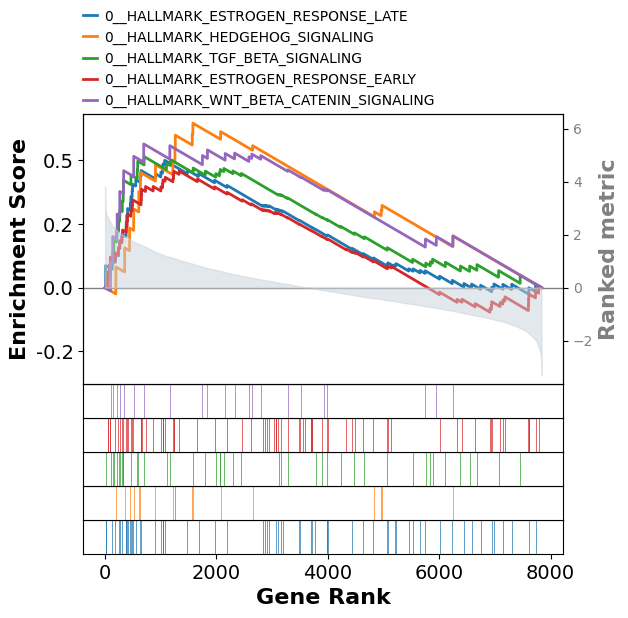

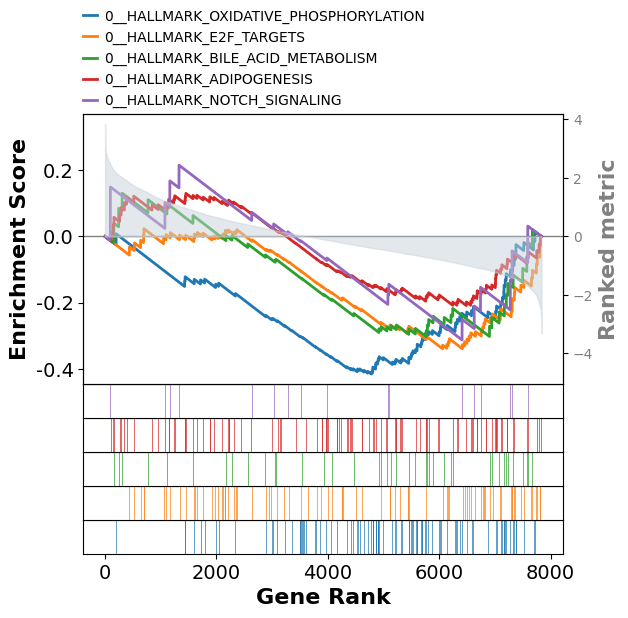

In [737]:
# Top 5 positive NES
top5_up_terms = gsea_res.sort_values(by='NES', ascending=False).head(5)['Term']

# Top 5 negative NES
top5_down_terms = gsea_res.sort_values(by='NES', ascending=True).head(5)['Term']

# Plot top 5 upregulated
axs_up = Pseudobulk_biopsy_and_hearttissue_pre_res.plot(
    terms=top5_up_terms,
    show_ranking=True,
    figsize=(3,4)
)
axs_up.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_BiopsyPlusTissue_pre_GSEA_terms_top5_up.pdf",
    bbox_inches="tight"
)

# Plot top 5 downregulated
axs_down = Pseudobulk_biopsy_and_hearttissue_pre_res.plot(
    terms=top5_down_terms,
    show_ranking=True,
    figsize=(3,4)
)
axs_down.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_BiopsyPlusTissue_pre_GSEA_terms_top5_down.pdf",
    bbox_inches="tight"
)

2025-12-12 09:26:29 | [INFO] maxp pruned
2025-12-12 09:26:29 | [INFO] cmap pruned
2025-12-12 09:26:29 | [INFO] kern dropped
2025-12-12 09:26:29 | [INFO] post pruned
2025-12-12 09:26:29 | [INFO] FFTM dropped
2025-12-12 09:26:29 | [INFO] GPOS pruned
2025-12-12 09:26:29 | [INFO] GSUB pruned
2025-12-12 09:26:29 | [INFO] name pruned
2025-12-12 09:26:29 | [INFO] glyf pruned
2025-12-12 09:26:29 | [INFO] Added gid0 to subset
2025-12-12 09:26:29 | [INFO] Added first four glyphs to subset
2025-12-12 09:26:29 | [INFO] Closing glyph list over 'GSUB': 20 glyphs before
2025-12-12 09:26:29 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G', 'R', 'S', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 'space', 't']
2025-12-12 09:26:29 | [INFO] Glyph IDs:   [0, 1, 2, 3, 40, 42, 53, 54, 68, 70, 71, 72, 75, 76, 78, 80, 81, 82, 85, 87]
2025-12-12 09:26:29 | [INFO] Closed glyph list over 'GSUB': 20 glyphs after
2025-12-12 09:26:29 | [INFO] Glyph names: ['.notdef', '.null', 'E', 'G'

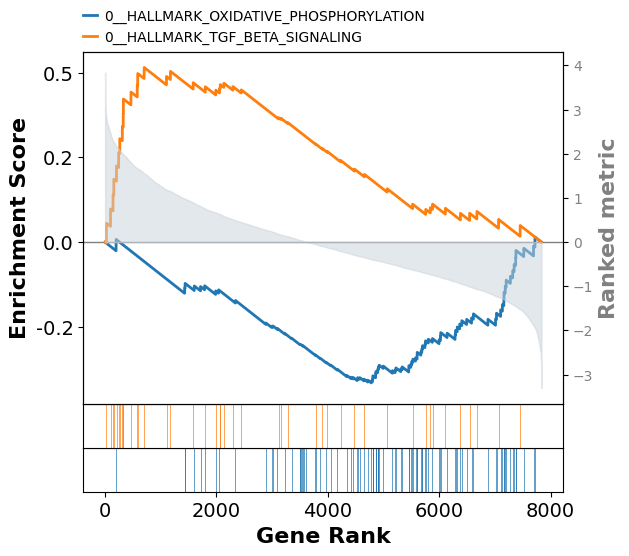

In [738]:
# Specify the pathways you want to plot
pathways_to_plot = [
    "0__HALLMARK_OXIDATIVE_PHOSPHORYLATION",
    "0__HALLMARK_TGF_BETA_SIGNALING"
]

# Plot
axs = Pseudobulk_biopsy_and_hearttissue_pre_res.plot(
    terms=pathways_to_plot,
    show_ranking=True,   # show ranking metric on secondary y-axis
    figsize=(3,4)
)

# Save to PDF
axs.figure.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_BiopsyPlusTissue_pre_GSEA_selected_pathways.pdf",
    bbox_inches="tight"
)


In [739]:
# Save pseudobulk and GSEA results
Pseudobulk_results_biopsy_and_hearttissue_df.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/BiopsyandHeartTissue_SeptumPTBP1pseudoBulkTop15perc_DGE.xlsx")
Pseudobulk_biopsy_and_hearttissue_pre_res.res2d.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/BiopsyandHeartTissue_SeptumPTBP1pseudoBulkTop15perc_GSEA_prerank_results.xlsx")


### Analysis on ventricle samples

In [809]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_endothelial.h5ad"
adata_EC_subset = sc.read_h5ad(output_path)


In [810]:
# Optional: check counts per group per sample
print(pd.crosstab(adata_EC_subset.obs['StrippedDonor'], adata_EC_subset.obs['Location']))

Location          LAD  LeftVentricle  Septum
StrippedDonor                               
BiopsyPatient1      0              0    1345
BiopsyPatient2      0              0     251
BiopsyPatient3      0              0     800
BiopsyPatient4      0              0     654
BiopsyPatient5      0              0    1350
CAV1                0           1050       0
CAV2                0            273       0
CAV3                0           3196    1580
CAV4                0           1077     197
CAV5                0           1917     812
CAV6                0           2059     188
CAV7                0           2427      27
CAV8                0           1294      42
CAV9                0           2118     137
CAV10             887              0    3279
Nontransplant1    513              0    4547
Nontransplant2    147              0    3588
SevereRejection1    0           1331    1192
SevereRejection2    0           1229    1882


In [811]:
# Filter for H3 >= 1 and Location == 'Ventricle'
adata_EC_subset = adata_EC_subset[
    (adata_EC_subset.obs['total_counts_H3'] >= 5)
    & (adata_EC_subset.obs['GraftHost'] == 'Graft')
    & (adata_EC_subset.obs['Location'] == 'LeftVentricle')
    & (adata_EC_subset.obs['DiseaseStatus'] != 'LateRejection')
    & (adata_EC_subset.obs['DiseaseStatus'] != 'Nontransplant')
].copy()

print(f"Number of cells after filtering: {adata_EC_subset.n_obs}")


Number of cells after filtering: 11377


In [812]:
# NOTE: use this version, allows true high and low signal differences, and groups are seen in both CAV and biopsy

# Copy obs for manipulation
obs = adata_EC_subset.obs.copy()

# Define a new column for PTBP1:H3 group
obs['PTBP1_H3_group'] = np.nan

# Compute global thresholds
all_values = obs['total_counts_PTBP1-1_norm_H3']
q_low_global = all_values.quantile(0.30)
q_high_global = all_values.quantile(0.70)

# Assign group labels based on global thresholds
obs['PTBP1_H3_group'] = pd.cut(
    all_values,
    bins=[-np.inf, q_low_global, q_high_global, np.inf],
    labels=['Low', 'Mid', 'High']
)

# Add grouping back to AnnData
adata_EC_subset.obs['PTBP1_H3_group'] = obs['PTBP1_H3_group']

# Optional: check counts per group per sample
print(pd.crosstab(adata_EC_subset.obs['10xRxn'], adata_EC_subset.obs['PTBP1_H3_group']))

PTBP1_H3_group    Low   Mid  High
10xRxn                           
May2025_RVDuke1  1826  1658   787
May2025_RVDuke2  1883  2619  2604


In [813]:
# Optional: check counts per group per sample
print(pd.crosstab(adata_EC_subset.obs['StrippedDonor'], adata_EC_subset.obs['PTBP1_H3_group']))


PTBP1_H3_group   Low   Mid  High
StrippedDonor                   
CAV1              20    19     6
CAV2             105    94    43
CAV3            1241  1164   566
CAV4             460   381   172
CAV5             395   611   741
CAV6             448   679   694
CAV7             650   829   723
CAV8             369   448   373
CAV9              21    52    73


2025-12-12 10:00:12 | [INFO] maxp pruned
2025-12-12 10:00:12 | [INFO] cmap pruned
2025-12-12 10:00:12 | [INFO] kern dropped
2025-12-12 10:00:12 | [INFO] post pruned
2025-12-12 10:00:12 | [INFO] FFTM dropped
2025-12-12 10:00:12 | [INFO] GPOS pruned
2025-12-12 10:00:12 | [INFO] GSUB pruned
2025-12-12 10:00:12 | [INFO] name pruned
2025-12-12 10:00:12 | [INFO] glyf pruned
2025-12-12 10:00:12 | [INFO] Added gid0 to subset
2025-12-12 10:00:12 | [INFO] Added first four glyphs to subset
2025-12-12 10:00:12 | [INFO] Closing glyph list over 'GSUB': 52 glyphs before
2025-12-12 10:00:12 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'G', 'H', 'L', 'M', 'N', 'P', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'underscore', 'w', 'y', 'z', 'zero']
2025-12-12 10:00:12 | [INFO] Glyph IDs:   

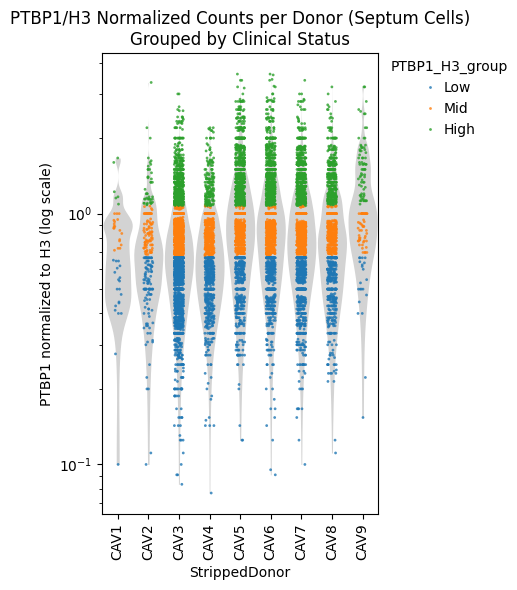

Saved PDF:
/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_PTBP1_Cutoffs_by_Sample_Ventricle.pdf


In [814]:

# -----------------------------
# Donor → Status mapping
# -----------------------------
donor_status_map = {
    "CAV1": "CAV",
    "CAV2": "CAV",
    "CAV3": "CAV",
    "CAV4": "CAV",
    "CAV5": "CAV",
    "CAV6": "CAV",
    "CAV7": "CAV",
    "CAV8": "CAV",
    "CAV9": "CAV",
    "CAV10": "CAV"
}

# -----------------------------
# Filter for Septum cells
# -----------------------------
adata_filtered = adata_EC_subset[
    adata_EC_subset.obs['Location'] == 'LeftVentricle'
].copy()

df = adata_filtered.obs[
    ['StrippedDonor', 'PTBP1_H3_group', 'total_counts_PTBP1-1_norm_H3']
].copy()
df["StrippedDonor"] = df["StrippedDonor"].astype(str)

# -----------------------------
# Add the donor status
# -----------------------------
df["Status"] = df["StrippedDonor"].map(donor_status_map)

# Drop donors not in your mapping
df = df.dropna(subset=["Status"])

# Reverse order compared to your current plot
status_order = ["CAV"]
df["Status"] = pd.Categorical(df["Status"], categories=status_order, ordered=True)

# Build donor order respecting reversed status order
donor_order = (
    df.groupby("Status")["StrippedDonor"]
    .unique()
    .reindex(status_order)       # ensures order follows reversed status_order
    .apply(lambda x: sorted(list(x)) if isinstance(x, list) or isinstance(x, np.ndarray) else [])
    .explode()
    .dropna()
    .tolist()
)

df["StrippedDonor"] = pd.Categorical(df["StrippedDonor"], categories=donor_order, ordered=True)

# -----------------------------
# Plot
# -----------------------------
plt.figure(figsize=(5,6))

# Base wide/tight violin
sns.violinplot(
    data=df,
    x="StrippedDonor",
    y="total_counts_PTBP1-1_norm_H3",
    color="lightgray",
    inner=None,
    cut=0,
    width=0.95,
    bw=0.2,
    scale="width",
    linewidth=0
)

# Overlay points colored by PTBP1_H3_group
sns.stripplot(
    data=df,
    x="StrippedDonor",
    y="total_counts_PTBP1-1_norm_H3",
    hue="PTBP1_H3_group",
    dodge=False,
    jitter=0.15,
    size=2,
    alpha=0.8
)

# Log scale
plt.yscale("log")

plt.xticks(rotation=90)
plt.ylabel("PTBP1 normalized to H3 (log scale)")
plt.xlabel("StrippedDonor")

plt.title("PTBP1/H3 Normalized Counts per Donor (Septum Cells)\nGrouped by Clinical Status")

# Improve legend
plt.legend(title="PTBP1_H3_group", bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()

# Save PDF
plt.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_PTBP1_Cutoffs_by_Sample_Ventricle.pdf",
    format="pdf",
    bbox_inches="tight"
)

plt.show()

print("Saved PDF:")
print("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PseudoBulk_PTBP1_Cutoffs_by_Sample_Ventricle.pdf")

In [815]:
# Filter cells in AnnData first
adata_filtered = adata_EC_subset[
#    (adata_EC_subset.obs['DiseaseStatus'] == 'CAV') &
    (adata_EC_subset.obs['SampleType'] == 'HeartTissue') 
    & (adata_EC_subset.obs['GraftHost'] == 'Graft')
    & (adata_EC_subset.obs['Location'] == 'LeftVentricle') 
    & (adata_EC_subset.obs['DiseaseStatus'] != 'LateRejection') 
    & (adata_EC_subset.obs['DiseaseStatus'] != 'Nontransplant')
].copy()
#adata_filtered = adata_EC_subset.copy()

pdata_filtered = dc.pp.pseudobulk(
    adata=adata_filtered,
    sample_col='StrippedDonor',  
    groups_col=['PTBP1_H3_group'],
    layer='raw_counts',
    mode='sum'
)

# Rename column
pdata_filtered.obs = pdata_filtered.obs.rename(columns={'PTBP1_H3_group': 'PTBP1toH3level'})
pdata_filtered.X = pdata_filtered.X.astype(int)

# Filter pseudobulks: keep only samples with ≥50 cells and ≥1000 counts
dc.pp.filter_samples(pdata_filtered, min_cells=50, min_counts=1000)

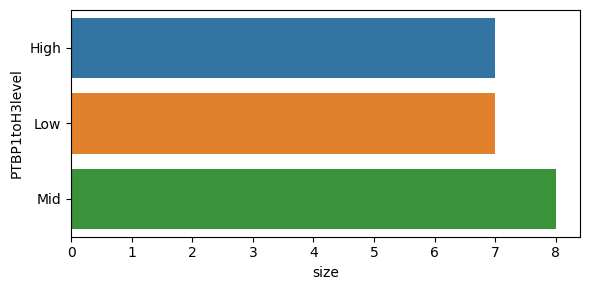

In [816]:
dc.pl.obsbar(
    adata=pdata_filtered,
    y='PTBP1toH3level',
    hue='PTBP1toH3level',
    figsize=(6, 3)
)

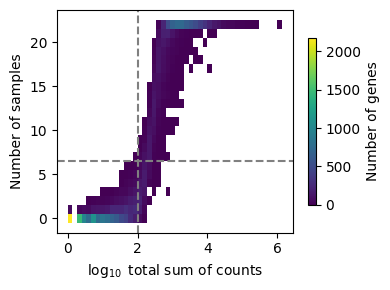

In [817]:
dc.pl.filter_by_expr(
    adata=pdata_filtered,
    group='PTBP1toH3level',
    min_count=10,
    min_total_count=100,
    large_n=10,
    min_prop=0.5,
)


In [818]:
# Step 1: Apply expression filter by group
dc.pp.filter_by_expr(
    adata=pdata_filtered,
    group='PTBP1toH3level',
    min_count=10,
    min_total_count=100,
    large_n=10,
    min_prop=0.5,
)

# Step 2: Apply global proportion filter
dc.pp.filter_by_prop(
    adata=pdata_filtered,
    min_prop=0.1,
    min_smpls=2,
)

In [819]:
# Surviving groups: groups with at least one cell remaining
surviving_groups = pdata_filtered.obs['PTBP1toH3level'].value_counts()
print("Surviving groups and cell counts after filtering:")
print(surviving_groups)

# Optionally, only show groups with >0 cells
surviving_groups = surviving_groups[surviving_groups > 0]
print("\nGroups that survived filtering:")
print(surviving_groups.index.tolist())

Surviving groups and cell counts after filtering:
PTBP1toH3level
Mid     8
High    7
Low     7
Name: count, dtype: int64

Groups that survived filtering:
['Mid', 'High', 'Low']


In [820]:
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# -----------------------------
# 1️⃣ Filter for High and Low groups
# -----------------------------
adata_pseudo = pdata_filtered[pdata_filtered.obs['PTBP1toH3level'].isin(['High', 'Low'])].copy()

# Ensure .X is integer counts
adata_pseudo.X = adata_pseudo.X.astype(int)

# -----------------------------
# 2️⃣ Initialize DESeq2
# -----------------------------
inference = DefaultInference(n_cpus=8)

dds = DeseqDataSet(
    adata=adata_pseudo,
    design_factors=['PTBP1toH3level'],  # factor to test
    refit_cooks=True,
    inference=inference
)

# -----------------------------
# 3️⃣ Fit DESeq2 model
# -----------------------------
dds.deseq2()

# -----------------------------
# 4️⃣ Compute differential expression: High vs Low
# -----------------------------
stat_res = DeseqStats(
    dds,
    contrast=["PTBP1toH3level", 'High', 'Low'],
    inference=inference
)

results = stat_res.summary()

# Extract results
Pseudobulk_results_endpoint_vent_df = stat_res.results_df
Pseudobulk_results_endpoint_vent_df

Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 3.67 seconds.

Fitting dispersion trend curve...
... done in 0.76 seconds.

Fitting MAP dispersions...
... done in 4.27 seconds.

Fitting LFCs...
... done in 2.05 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 7 outlier genes.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Running Wald tests...
... done in 1.11 seconds.



Log2 fold change & Wald test p-value: PTBP1toH3level High vs Low
          baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
MMP28    30.437753        0.248368  0.460442  0.539413  0.589602  0.99985
POLR2A  102.880418       -0.037345  0.314372 -0.118793  0.905439  0.99985
CNDP2    57.509107       -0.016305  0.184431 -0.088405  0.929555  0.99985
STX18   107.201365        0.011268  0.148387  0.075937  0.939470  0.99985
TCAF1    30.313768       -0.090444  0.418873 -0.215921  0.829049  0.99985
...            ...             ...       ...       ...       ...      ...
KRBOX4   46.030705        0.050984  0.249658  0.204214  0.838186  0.99985
DTNA    240.576962       -0.114442  0.565619 -0.202330  0.839659  0.99985
MEAF6    30.287690       -0.267580  0.231964 -1.153543  0.248687  0.99985
CCDC7    90.573802        0.281547  0.358207  0.785989  0.431874  0.99985
IKBKB   164.203302        0.132556  0.193414  0.685347  0.493125  0.99985

[6756 rows x 6 columns]


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
MMP28,30.437753,0.248368,0.460442,0.539413,0.589602,0.99985
POLR2A,102.880418,-0.037345,0.314372,-0.118793,0.905439,0.99985
CNDP2,57.509107,-0.016305,0.184431,-0.088405,0.929555,0.99985
STX18,107.201365,0.011268,0.148387,0.075937,0.939470,0.99985
TCAF1,30.313768,-0.090444,0.418873,-0.215921,0.829049,0.99985
...,...,...,...,...,...,...
KRBOX4,46.030705,0.050984,0.249658,0.204214,0.838186,0.99985
DTNA,240.576962,-0.114442,0.565619,-0.202330,0.839659,0.99985
MEAF6,30.287690,-0.267580,0.231964,-1.153543,0.248687,0.99985
CCDC7,90.573802,0.281547,0.358207,0.785989,0.431874,0.99985


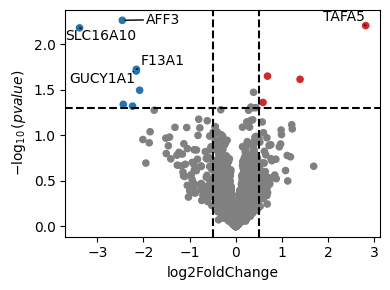

In [821]:
dc.pl.volcano(Pseudobulk_results_endpoint_vent_df, x='log2FoldChange', y='pvalue')


In [822]:
Pseudobulk_results_vent_df_sorted = Pseudobulk_results_endpoint_vent_df.sort_values(by='stat', ascending=False)
Pseudobulk_gsea_ranked_input = Pseudobulk_results_vent_df_sorted['stat']

# Run prerank GSEA
Pseudobulk_endpoint_Vent_pre_res = gp.prerank(
    rnk=Pseudobulk_gsea_ranked_input,
    gene_sets=[Hallmark_2023],
    organism='Human',
    seed=42,
    min_size=15,
    max_size=500,
    permutation_num=1000,
    no_plot=False,
    processes=4,
    verbose=True
)

# Inspect top results
Pseudobulk_endpoint_Vent_pre_res.res2d.head(10)

2025-12-12 10:00:41,580 [INFO] Parsing data files for GSEA.............................
2025-12-12 10:00:41,584 [INFO] 0001 gene_sets have been filtered out when max_size=500 and min_size=15
2025-12-12 10:00:41,585 [INFO] 0049 gene_sets used for further statistical testing.....
2025-12-12 10:00:41,586 [INFO] Start to run GSEA...Might take a while..................
2025-12-12 10:00:42,554 [INFO] Congratulations. GSEApy runs successfully................



,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,0__HALLMARK_OXIDATIVE_PHOSPHORYLATION,0.535927,2.31571,0.0,0.0,0.0,49/85,26.64%,MTX2;MRPS11;NDUFV1;VDAC1;ATP5PB;IDH3A;DLAT;ATP...
1,prerank,0__HALLMARK_MYC_TARGETS_V1,0.45303,2.070983,0.0,0.000321,0.001,58/122,24.67%,NPM1;NCBP1;PSMB2;KPNB1;TFDP1;PSMD7;VDAC1;EIF3J...
2,prerank,0__HALLMARK_CHOLESTEROL_HOMEOSTASIS,-0.483389,-1.58811,0.016227,0.340995,0.215,15/27,25.64%,ATXN2;ANXA5;GUSB;LGALS3;JAG1;LSS;PPARG;FABP5;C...
3,prerank,0__HALLMARK_PI3K_AKT_MTOR_SIGNALING,-0.401028,-1.567425,0.005576,0.209639,0.259,24/58,22.26%,MAP2K3;MAP3K7;EGFR;MAPKAP1;MAPK9;RIT1;TSC2;PTE...
4,prerank,0__HALLMARK_HEDGEHOG_SIGNALING,-0.531846,-1.515452,0.045175,0.225561,0.378,6/16,13.14%,UNC5C;ADGRG1;DPYSL2;HEY1;RASA1;VEGFA
5,prerank,0__HALLMARK_WNT_BETA_CATENIN_SIGNALING,-0.469883,-1.476121,0.053045,0.22921,0.486,7/22,14.37%,JAG2;HEY1;JAG1;TP53;NOTCH4;CSNK1E;PPARD
6,prerank,0__HALLMARK_ESTROGEN_RESPONSE_LATE,-0.367702,-1.447823,0.026052,0.227949,0.573,20/56,22.11%,RAB31;FARP1;METTL3;ID2;SGK1;ELOVL5;FABP5;BCL2;...
7,prerank,0__HALLMARK_UNFOLDED_PROTEIN_RESPONSE,0.351964,1.420257,0.027211,0.19016,0.585,34/60,36.49%,NPM1;PDIA6;HSP90B1;DNAJC3;EIF4G1;RPS14;HSPA9;E...
8,prerank,0__HALLMARK_ADIPOGENESIS,0.307329,1.316694,0.055238,0.302246,0.829,24/90,21.09%,ACOX1;RIOK3;ESYT1;IDH3A;DLAT;AK2;MYLK;UBQLN1;D...
9,prerank,0__HALLMARK_E2F_TARGETS,0.294556,1.241953,0.097107,0.391957,0.935,29/73,26.52%,LIG1;NUP153;TMPO;SMC6;AK2;SYNCRIP;HUS1;PA2G4;M...


In [823]:
# Make a copy of results
gsea_res = Pseudobulk_endpoint_Vent_pre_res.res2d.copy()

# Sort by NES (Normalized Enrichment Score)
gsea_res_sorted_pos = gsea_res.sort_values(by='NES', ascending=False)  # top positive
gsea_res_sorted_neg = gsea_res.sort_values(by='NES', ascending=True)   # top negative

# Display top 10 positively enriched gene sets
print("Top 10 positively enriched gene sets:")
print(gsea_res_sorted_pos.head(10))

# Display top 10 negatively enriched gene sets
print("\nTop 10 negatively enriched gene sets:")
print(gsea_res_sorted_neg.head(10))

Top 10 positively enriched gene sets:
       Name                                   Term        ES       NES  \
0   prerank  0__HALLMARK_OXIDATIVE_PHOSPHORYLATION  0.535927   2.31571   
1   prerank             0__HALLMARK_MYC_TARGETS_V1   0.45303  2.070983   
7   prerank  0__HALLMARK_UNFOLDED_PROTEIN_RESPONSE  0.351964  1.420257   
8   prerank               0__HALLMARK_ADIPOGENESIS  0.307329  1.316694   
9   prerank                0__HALLMARK_E2F_TARGETS  0.294556  1.241953   
10  prerank             0__HALLMARK_MYC_TARGETS_V2  0.369071  1.194256   
11  prerank             0__HALLMARK_G2M_CHECKPOINT  0.276537  1.181364   
12  prerank        0__HALLMARK_ALLOGRAFT_REJECTION  0.279656  1.166059   
15  prerank                 0__HALLMARK_GLYCOLYSIS  0.264421  1.105741   
24  prerank          0__HALLMARK_KRAS_SIGNALING_DN  0.313073  1.067714   

   NOM p-val FDR q-val FWER p-val   Tag %  Gene %  \
0        0.0       0.0        0.0   49/85  26.64%   
1        0.0  0.000321      0.001  58/122

In [824]:
# Save pseudobulk and GSEA results
Pseudobulk_results_endpoint_vent_df.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_VentricPTBP1pseudoBulkTop15perc_DGE.xlsx")
Pseudobulk_endpoint_Vent_pre_res.res2d.to_excel("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_VentricPTBP1pseudoBulkTop15perc_GSEA_prerank_results.xlsx")


# Make volcano plots for PTBP1:H3 high vs low pseudobulk data

In [825]:
# Import differential gene expression
biopsy_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Biopsy_SeptumPTBP1pseudoBulkTop15perc_DGE.xlsx"
endpoint_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_SeptumPTBP1pseudoBulkTop15perc_DGE.xlsx"
biopsy_endpoint_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/BiopsyandHeartTissue_SeptumPTBP1pseudoBulkTop15perc_DGE.xlsx"
endpoint_ventricle_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/Endpoint_VentricPTBP1pseudoBulkTop15perc_DGE.xlsx"

# Read them back in, setting the first column as the gene index
Pseudobulk_results_biopsy_df = pd.read_excel(biopsy_path, index_col=0)
Pseudobulk_results_endpoint_df = pd.read_excel(endpoint_path, index_col=0)
Pseudobulk_results_endpoint_ventricle_df = pd.read_excel(endpoint_ventricle_path, index_col=0)
Pseudobulk_results_biopsy_and_hearttissue_df = pd.read_excel(biopsy_endpoint_path, index_col=0)

# Ensure the index is named "Gene"
Pseudobulk_results_biopsy_df.index.name = "Gene"
Pseudobulk_results_endpoint_df.index.name = "Gene"
Pseudobulk_results_endpoint_ventricle_df.index.name = "Gene"
Pseudobulk_results_biopsy_and_hearttissue_df.index.name = "Gene"

In [826]:
#Pseudobulk_results_biopsy_df

In [827]:
# Load Kegg and hallmark pathways and lookups for mouse to human and vice versa gene conversion
Kegg_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/c2.cp.kegg_legacy.v2023.2.Hs.symbols.gmt")
Hallmark_2023 = read_gmt("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/h.all.v2023.2.Hs.symbols.gmt")

h2m_ENSEMBL = pd.read_csv("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/h2m_ENSEMBL.txt", sep='\t', index_col=0)
m2h_ENSEMBL = pd.read_csv("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/m2h_ENSEMBL.txt", sep='\t', index_col=0)

# Create a mapping dictionary
m2h_dict = m2h_ENSEMBL["HumanGeneName"].to_dict()
h2m_dict = h2m_ENSEMBL["MouseGeneName"].to_dict()


In [828]:
def plot_volcano_with_pathway(
    df, 
    label, 
    pathway_genes, 
    pathway_name,
    save_path=None
):

    # -----------------------------
    # Prepare DataFrame
    # -----------------------------
    df = df.copy()

    # Ensure index is Gene
    df.index.name = "Gene"

    # Rename your DESeq2 columns to match expected names
    df = df.rename(columns={
        "log2FoldChange": "Score",
        "pvalue": "pvalue"
    })

    # Drop rows missing needed values
    df["Score"] = pd.to_numeric(df["Score"], errors="coerce")
    df["pvalue"] = pd.to_numeric(df["pvalue"], errors="coerce")
    df = df.dropna(subset=["Score", "pvalue"])

    # -log10 p
    df["-log10(pvalue)"] = -np.log10(df["pvalue"])

    # Mark pathway genes
    df["in_pathway"] = df.index.isin(pathway_genes)

    # Top pathway genes (by significance)
    top_genes = df[df["in_pathway"]].nlargest(10, "-log10(pvalue)")

    # -----------------------------
    # PLOT
    # -----------------------------
    plt.figure(figsize=(6, 5))

    # All background genes
    plt.scatter(
        df.loc[~df["in_pathway"], "Score"],
        df.loc[~df["in_pathway"], "-log10(pvalue)"],
        color="lightgrey", s=10, alpha=0.5, edgecolor="none"
    )

    # Pathway genes highlighted
    plt.scatter(
        df.loc[df["in_pathway"], "Score"],
        df.loc[df["in_pathway"], "-log10(pvalue)"],
        color="red", s=20, alpha=0.9, edgecolor="none"
    )

    # Label top genes only
    for gene, row in top_genes.iterrows():
        plt.text(
            row["Score"],
            row["-log10(pvalue)"] + 0.2,
            gene,
            fontsize=8,
            color="red",
            ha="center"
        )

    # Axes and title
    plt.axvline(0, color="black", lw=0.8)
    plt.xlabel("log₂ Fold Change")
    plt.ylabel("-log₁₀(p-value)")
    plt.title(
        f"{label}\n({pathway_name.replace('HALLMARK_', '').replace('_',' ')} highlighted)"
        #f"{label}\n({pathway_name.replace('KEGG_', '').replace('_',' ')} highlighted)"
    )
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, format="pdf")
        print(f"Saved: {save_path}")

    plt.show()


2025-12-12 10:02:13 | [INFO] maxp pruned
2025-12-12 10:02:13 | [INFO] cmap pruned
2025-12-12 10:02:13 | [INFO] kern dropped
2025-12-12 10:02:13 | [INFO] post pruned
2025-12-12 10:02:13 | [INFO] FFTM dropped
2025-12-12 10:02:13 | [INFO] GPOS pruned
2025-12-12 10:02:13 | [INFO] GSUB pruned
2025-12-12 10:02:13 | [INFO] name pruned
2025-12-12 10:02:13 | [INFO] glyf pruned
2025-12-12 10:02:13 | [INFO] Added gid0 to subset
2025-12-12 10:02:13 | [INFO] Added first four glyphs to subset
2025-12-12 10:02:13 | [INFO] Closing glyph list over 'GSUB': 58 glyphs before
2025-12-12 10:02:13 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'X', 'Y', 'a', 'b', 'd', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'y', 'zero']
2

Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/GSEA_PlotsBiopsy_pseudobulk_volcano_score_HALLMARK_OXIDATIVE_PHOSPHORYLATION.pdf


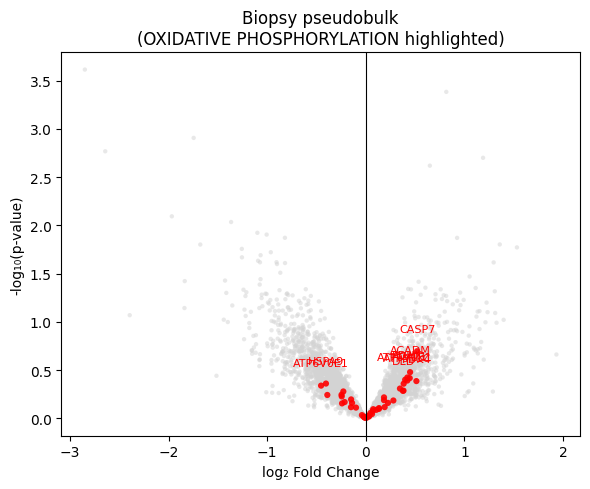

2025-12-12 10:02:14 | [INFO] maxp pruned
2025-12-12 10:02:14 | [INFO] cmap pruned
2025-12-12 10:02:14 | [INFO] kern dropped
2025-12-12 10:02:14 | [INFO] post pruned
2025-12-12 10:02:14 | [INFO] FFTM dropped
2025-12-12 10:02:14 | [INFO] GPOS pruned
2025-12-12 10:02:14 | [INFO] GSUB pruned
2025-12-12 10:02:14 | [INFO] name pruned
2025-12-12 10:02:15 | [INFO] glyf pruned
2025-12-12 10:02:15 | [INFO] Added gid0 to subset
2025-12-12 10:02:15 | [INFO] Added first four glyphs to subset
2025-12-12 10:02:15 | [INFO] Closing glyph list over 'GSUB': 55 glyphs before
2025-12-12 10:02:15 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'a', 'b', 'd', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 's', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'zero']
2025-12-12 10:02:15 | [

Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_PlotsEndpoint_pseudobulk_volcano_score_HALLMARK_OXIDATIVE_PHOSPHORYLATION.pdf


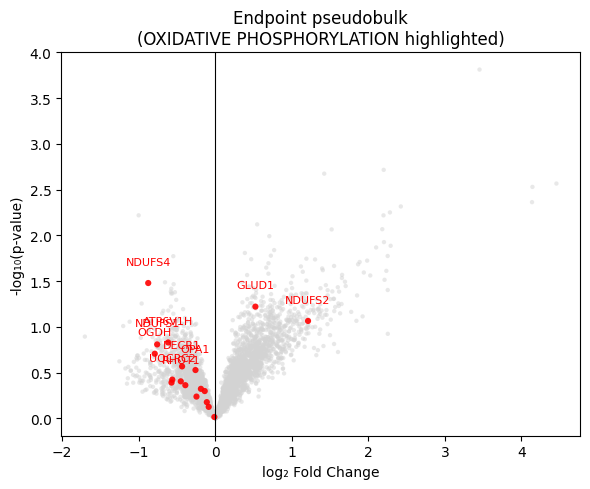

2025-12-12 10:02:16 | [INFO] maxp pruned
2025-12-12 10:02:16 | [INFO] cmap pruned
2025-12-12 10:02:16 | [INFO] kern dropped
2025-12-12 10:02:16 | [INFO] post pruned
2025-12-12 10:02:16 | [INFO] FFTM dropped
2025-12-12 10:02:16 | [INFO] GPOS pruned
2025-12-12 10:02:16 | [INFO] GSUB pruned
2025-12-12 10:02:16 | [INFO] name pruned
2025-12-12 10:02:16 | [INFO] glyf pruned
2025-12-12 10:02:16 | [INFO] Added gid0 to subset
2025-12-12 10:02:16 | [INFO] Added first four glyphs to subset
2025-12-12 10:02:16 | [INFO] Closing glyph list over 'GSUB': 59 glyphs before
2025-12-12 10:02:16 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'a', 'b', 'd', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 's', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'y', 'zero']


Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_PlotsBiopsyEndpoint_pseudobulk_volcano_score_HALLMARK_OXIDATIVE_PHOSPHORYLATION.pdf


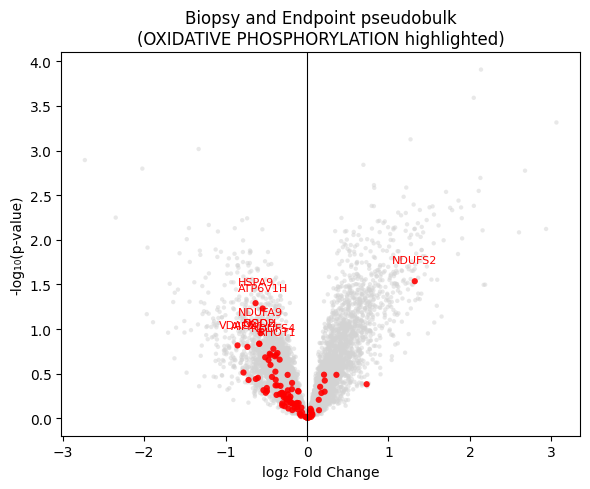

2025-12-12 10:02:17 | [INFO] maxp pruned
2025-12-12 10:02:18 | [INFO] cmap pruned
2025-12-12 10:02:18 | [INFO] kern dropped
2025-12-12 10:02:18 | [INFO] post pruned
2025-12-12 10:02:18 | [INFO] FFTM dropped
2025-12-12 10:02:18 | [INFO] GPOS pruned
2025-12-12 10:02:18 | [INFO] GSUB pruned
2025-12-12 10:02:18 | [INFO] name pruned
2025-12-12 10:02:18 | [INFO] glyf pruned
2025-12-12 10:02:18 | [INFO] Added gid0 to subset
2025-12-12 10:02:18 | [INFO] Added first four glyphs to subset
2025-12-12 10:02:18 | [INFO] Closing glyph list over 'GSUB': 56 glyphs before
2025-12-12 10:02:18 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'a', 'b', 'c', 'd', 'e', 'five', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'uni2080', 'uni2081', 'uni2082', 'v', 'zero']
2025-12-12 10:02:18 |

Saved: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_PlotsEndpointVentricle_pseudobulk_volcano_score_HALLMARK_OXIDATIVE_PHOSPHORYLATION.pdf


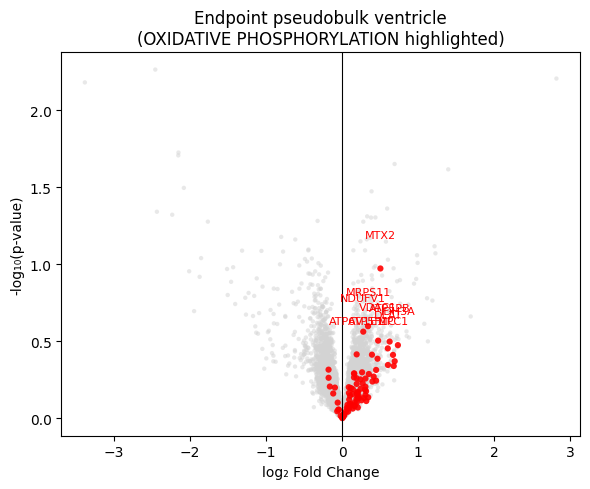

In [830]:
#pathway_name = "HALLMARK_TGF_BETA_SIGNALING"
#pathway_name = "HALLMARK_TNFA_SIGNALING_VIA_NFKB"
pathway_name = "HALLMARK_OXIDATIVE_PHOSPHORYLATION"
#pathway_name = "HALLMARK_INTERFERON_GAMMA_RESPONSE"
#pathway_name = "HALLMARK_HYPOXIA"
#pathway_name = "HALLMARK_COAGULATION"
#pathway_name = "HALLMARK_COMPLEMENT"
#pathway_name = "KEGG_ALLOGRAFT_REJECTION"

pathway_genes = set(Hallmark_2023[pathway_name])
#pathway_genes = set(Kegg_2023[pathway_name])

plot_volcano_with_pathway(
    Pseudobulk_results_biopsy_df,
    label="Biopsy pseudobulk",
    pathway_genes=pathway_genes,
    pathway_name=pathway_name,
    save_path=f"/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/GSEA_PlotsBiopsy_pseudobulk_volcano_score_{pathway_name}.pdf"
)

plot_volcano_with_pathway(
    Pseudobulk_results_endpoint_df,
    label="Endpoint pseudobulk",
    pathway_genes=pathway_genes,
    pathway_name=pathway_name,
    save_path=f"/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_PlotsEndpoint_pseudobulk_volcano_score_{pathway_name}.pdf"
)

plot_volcano_with_pathway(
    Pseudobulk_results_biopsy_and_hearttissue_df,
    label="Biopsy and Endpoint pseudobulk",
    pathway_genes=pathway_genes,
    pathway_name=pathway_name,
    save_path=f"/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_PlotsBiopsyEndpoint_pseudobulk_volcano_score_{pathway_name}.pdf"
)

plot_volcano_with_pathway(
    Pseudobulk_results_endpoint_ventricle_df,
    label="Endpoint pseudobulk ventricle",
    pathway_genes=pathway_genes,
    pathway_name=pathway_name,
    save_path=f"/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/GSEA_PlotsEndpointVentricle_pseudobulk_volcano_score_{pathway_name}.pdf"
)

### Examine consistent PTBP1 associated genes in both septum and ventricle - since responses differ

In [854]:
Pseudobulk_results_biopsy_and_hearttissue_df

,baseMean,log2fc,lfcSE,stat,pvalue,padj
Gene,,,,,,
MMP28,17.373437,0.331263,0.370930,0.893061,0.371825,0.927648
POLR2A,53.688517,0.504783,0.257557,1.959885,0.050009,0.835374
CNDP2,25.299778,0.179242,0.269489,0.665118,0.505975,0.947522
STX18,44.968861,0.269722,0.239021,1.128442,0.259133,0.912477
TCAF1,19.671081,-0.285482,0.400127,-0.713478,0.475550,0.945864
...,...,...,...,...,...,...
DTNA,58.694865,0.565156,0.493840,1.144413,0.252452,0.912477
MEAF6,17.226158,-0.225588,0.206640,-1.091694,0.274968,0.912477
CCDC7,63.960974,-0.130629,0.234454,-0.557164,0.577416,0.957613


In [855]:
# rename if needed
for df in [Pseudobulk_results_biopsy_and_hearttissue_df, Pseudobulk_results_endpoint_ventricle_df]:
    for col in df.columns:
        if "log2" in col.lower():
            df.rename(columns={col: "log2fc"}, inplace=True)


In [856]:
def get_up_down(df, lfc_col="log2fc", padj_col="pvalue", padj_thresh=0.2):
    sig = df[df[padj_col] < padj_thresh]
    up = sig[sig[lfc_col] > 0].index
    down = sig[sig[lfc_col] < 0].index

    print("Total passing threshold (padj < {:.2f}): {}".format(
        padj_thresh, sig.shape[0]
    ))
    print("   Upregulated:   {}".format(up.shape[0]))
    print("   Downregulated: {}".format(down.shape[0]))
    print("-" * 40)

    return set(up), set(down)


In [857]:
print("Biopsy + Heart Tissue:")
bio_up, bio_down = get_up_down(Pseudobulk_results_biopsy_and_hearttissue_df)

print("Endpoint Ventricle:")
vent_up, vent_down = get_up_down(Pseudobulk_results_endpoint_ventricle_df)

Biopsy + Heart Tissue:
Total passing threshold (padj < 0.20): 1680
   Upregulated:   986
   Downregulated: 694
----------------------------------------
Endpoint Ventricle:
Total passing threshold (padj < 0.20): 160
   Upregulated:   73
   Downregulated: 87
----------------------------------------


In [858]:
shared_up = bio_up & vent_up
shared_up

{'CCNYL1', 'CDC123', 'LYST', 'ZDHHC13'}

In [859]:
shared_down = bio_down & vent_down
shared_down

{'BMX', 'CEP63', 'MTHFR', 'PID1', 'UPRT', 'VTA1', 'ZNF302'}

In [860]:
opposite_direction = (bio_up & vent_down) | (bio_down & vent_up)
opposite_direction

{'ACOX1',
 'AL136962.1',
 'ATG4B',
 'BDP1',
 'FBXW8',
 'MPV17',
 'NNMT',
 'NPM1',
 'PPM1D',
 'ROBO1',
 'SRPK1',
 'THOC7',
 'ZXDC'}

# Plot single genes in endothelial cell data

#### Import data and pseudobulk (from above)

In [593]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_endothelial.h5ad"
adata_EC_subset = sc.read_h5ad(output_path)

In [594]:
# Filter for H3 >= 1 and Location == 'Septum'
adata_EC_subset = adata_EC_subset[
    (adata_EC_subset.obs['total_counts_H3'] >= 1) &
    (adata_EC_subset.obs['Location'] == 'Septum')
].copy()

print(f"Number of cells after filtering: {adata_EC_subset.n_obs}")

Number of cells after filtering: 19275


In [595]:
# Copy obs for manipulation
obs = adata_EC_subset.obs.copy()

# Define a new column for PTBP1:H3 group
obs['PTBP1_H3_group'] = np.nan

# Compute global thresholds
all_values = obs['total_counts_PTBP1-1_norm_H3']
q_low_global = all_values.quantile(0.30)
q_high_global = all_values.quantile(0.7)

# Assign group labels based on global thresholds
obs['PTBP1_H3_group'] = pd.cut(
    all_values,
    bins=[-np.inf, q_low_global, q_high_global, np.inf],
    labels=['Low', 'Mid', 'High']
)

# Add grouping back to AnnData
adata_EC_subset.obs['PTBP1_H3_group'] = obs['PTBP1_H3_group']

# Optional: check counts per group per sample
print(pd.crosstab(adata_EC_subset.obs['10xRxn'], adata_EC_subset.obs['PTBP1_H3_group']))


PTBP1_H3_group      Low   Mid  High
10xRxn                             
April2025_Sample1   296   215    60
April2025_Sample2   328   363   120
April2025_Sample3   413   245    56
May2025_IVSDuke1    208  1823  2432
May2025_IVSDuke2    374   990   222
May2025_RVLVUCLA   4217  4023  2890


In [596]:
# Filter cells in AnnData first
adata_filtered = adata_EC_subset[
#    (adata_EC_subset.obs['DiseaseStatus'] == 'CAV') &
#    (adata_EC_subset.obs['SampleType'] == 'Biopsy') &
#    (adata_EC_subset.obs['GraftHost'] == 'Graft') &
    (adata_EC_subset.obs['Location'] == 'Septum')
    & (adata_EC_subset.obs['DiseaseStatus'] != 'LateRejection') 
].copy()
#adata_filtered = adata_EC_subset.copy()

pdata_filtered = dc.pp.pseudobulk(
    adata=adata_filtered,
    sample_col='StrippedDonor',  
    groups_col=['PTBP1_H3_group'],
    layer='raw_counts',
    mode='sum'
)

# Rename column
pdata_filtered.obs = pdata_filtered.obs.rename(columns={'PTBP1_H3_group': 'PTBP1toH3level'})
pdata_filtered.X = pdata_filtered.X.astype(int)

# Filter pseudobulks: keep only samples with ≥50 cells and ≥1000 counts
dc.pp.filter_samples(pdata_filtered, min_cells=50, min_counts=1000)


In [597]:
from sklearn.preprocessing import quantile_transform

# -----------------------------
# Extract counts
# -----------------------------
counts_df = pd.DataFrame(
    pdata_filtered.X,
    index=pdata_filtered.obs_names,
    columns=pdata_filtered.var_names
)

# -----------------------------
# Compute CPM
# -----------------------------
library_sizes = counts_df.sum(axis=1)
cpm_df = counts_df.div(library_sizes, axis=0) * 1e6

# -----------------------------
# Log1p
# -----------------------------
log_cpm_df = np.log1p(cpm_df)

# -----------------------------
# Quantile normalization
# -----------------------------
qn_df = pd.DataFrame(
    quantile_transform(log_cpm_df, axis=0, copy=True),
    index=log_cpm_df.index,
    columns=log_cpm_df.columns
)

# -----------------------------
# Save back into the AnnData object
# -----------------------------
pdata_filtered_norm = pdata_filtered.copy()
pdata_filtered_norm.X = qn_df.values

# -----------------------------
# Save as h5ad
# -----------------------------
pdata_filtered_norm.write(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/2025_Dec_pseudobulk_PTBP1levels_all_ECs_log1p_cpm_qn.h5ad"
)

print("✅ Normalized pseudobulk saved as h5ad")

✅ Normalized pseudobulk saved as h5ad


In [598]:
pdata_filtered_norm

AnnData object with n_obs × n_vars = 30 × 31844
    obs: 'StrippedDonor', 'PTBP1toH3level', 'souporcell_status', 'souporcell_statusMerge', 'source', 'total_counts_CITESeq_FreeOligo_BC71', 'total_counts_CITESeq_FreeOligo_BC72', 'total_counts_CITESeq_FreeOligo_BC73', 'total_counts_CITESeq_FreeOligo_BC74', 'total_counts_CITESeq_FreeOligo_BC75', 'total_counts_CITESeq_FreeOligo_BC76', 'total_counts_CITESeq_FreeOligo_BC77', 'total_counts_CITESeq_FreeOligo_BC78', 'total_counts_CITESeq_FreeOligo_BC79', 'total_counts_CITESeq_FreeOligo_BC80', 'total_counts_CITESeq_FreeOligo_BC81', 'total_counts_CITESeq_FreeOligo_BC82', 'total_counts_CITESeq_FreeOligo_BC83', 'total_counts_CITESeq_FreeOligo_BC84', 'total_counts_CITESeq_FreeOligo_BC85', 'total_counts_CITESeq_FreeOligo_BC86', 'total_counts_CITESeq_FreeOligo_BC87', 'total_counts_CITESeq_FreeOligo_BC88', 'total_counts_CITESeq_FreeOligo_BC89', 'total_counts_CITESeq_FreeOligo_BC90', 'SampleType', 'BankSource', 'Location', 'ConfidenceOnHashing', 'Disease

In [372]:
# Path to your file
adata_path = "/labs/Murphy/DataForChris/2025May_CAV_10xDataAnalysis/2025_Nov5_pseudobulk_all_ECs_log1p_cpm_qn.h5ad"

# Load the AnnData object
pdata_filtered_norm = sc.read_h5ad(adata_path)

In [600]:
def plot_pseudobulk_boxplot(
    adata,
    gene: str,
    filters: dict = None,
    group_by: str = "PTBP1toH3level",
    log_transform: bool = True,
    figsize=(6, 4),
    save_pdf: bool = True,
    output_dir: str = "."
):
    """
    Plot pseudobulk expression for a single gene across groups,
    with optional filtering by metadata, and save as PDF.
    Boxes are ordered High → Mid → Low for PTBP1toH3level and points
    are colored by DiseaseStatus.

    Parameters
    ----------
    adata : AnnData
        Pseudobulk AnnData (e.g., from decoupler.pp.pseudobulk).
    gene : str
        Gene to plot (must exist in adata.var_names).
    filters : dict
        Dictionary of filters, e.g.:
        {'cell_type_general': 'Endothelial', 'Location': 'Septum'}
    group_by : str
        Column in .obs to use for grouping on the x-axis.
    log_transform : bool
        Apply log1p transform to expression values.
    figsize : tuple
        Figure size.
    save_pdf : bool
        Whether to save the plot as a PDF.
    output_dir : str
        Directory to save the PDF.
    """

    import os
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns

    # Custom colors for DiseaseStatus
    status_colors = {
        "CAV": "red",
        "Stable": "blue",
        "Nontransplant": "purple",
        "Rejection": "orange"   # assign a color to this new status
    }


    # ------------------------------
    # 1️⃣ Filter
    # ------------------------------
    adata_filt = adata.copy()
    if filters:
        for key, value in filters.items():
            if key not in adata_filt.obs.columns:
                raise ValueError(f"{key} not found in adata.obs columns.")
            if isinstance(value, (list, tuple, set)):
                adata_filt = adata_filt[adata_filt.obs[key].isin(value)]
            else:
                adata_filt = adata_filt[adata_filt.obs[key] == value]
        print(f"Filtered to {adata_filt.n_obs} samples.")

    # ------------------------------
    # 2️⃣ Gene check
    # ------------------------------
    if gene not in adata_filt.var_names:
        raise ValueError(f"Gene '{gene}' not found in adata.var_names")

    # ------------------------------
    # 3️⃣ Prepare DataFrame
    # ------------------------------
    expr = adata_filt[:, gene].X
    expr = np.array(expr).flatten()

    df_plot = pd.DataFrame({
        "Expression": expr,
        group_by: adata_filt.obs[group_by].values,
        "DiseaseStatus": adata_filt.obs["DiseaseStatus"].values
    })

    if log_transform:
        df_plot["Expression"] = np.log1p(df_plot["Expression"])

    # Ensure ordering: High → Mid → Low
    ptbp1_order = ['High', 'Mid', 'Low']
    df_plot[group_by] = pd.Categorical(df_plot[group_by], categories=ptbp1_order, ordered=True)

    # ------------------------------
    # 4️⃣ Plot
    # ------------------------------
    plt.figure(figsize=figsize)
    sns.boxplot(
        data=df_plot,
        x=group_by,
        y="Expression",
        color="white",
        fliersize=0,
        linewidth=1,
        order=ptbp1_order
    )

    sns.stripplot(
        data=df_plot,
        x=group_by,
        y="Expression",
        hue="DiseaseStatus",
        palette=status_colors,
        dodge=False,
        jitter=True,
        alpha=0.7,
        size=6,
        order=ptbp1_order
    )

    plt.title(f"{gene} expression by {group_by}")
    plt.ylabel("log₁₊(Pseudobulk counts)" if log_transform else "Pseudobulk counts")
    plt.xlabel(group_by)
    plt.legend(title="DiseaseStatus", bbox_to_anchor=(1, 1))
    plt.tight_layout()

    # ------------------------------
    # 5️⃣ Save PDF
    # ------------------------------
    if save_pdf:
        os.makedirs(output_dir, exist_ok=True)
        filename = os.path.join(output_dir, f"{gene}_pseudobulk_endo_boxplot.pdf")
        plt.savefig(filename)
        print(f"Saved plot to {filename}")

    plt.show()


In [524]:
pdata_filtered_norm

AnnData object with n_obs × n_vars = 28 × 31844
    obs: 'StrippedDonor', 'PTBP1toH3level', 'souporcell_status', 'souporcell_statusMerge', 'source', 'total_counts_CITESeq_FreeOligo_BC71', 'total_counts_CITESeq_FreeOligo_BC72', 'total_counts_CITESeq_FreeOligo_BC73', 'total_counts_CITESeq_FreeOligo_BC74', 'total_counts_CITESeq_FreeOligo_BC75', 'total_counts_CITESeq_FreeOligo_BC76', 'total_counts_CITESeq_FreeOligo_BC77', 'total_counts_CITESeq_FreeOligo_BC78', 'total_counts_CITESeq_FreeOligo_BC79', 'total_counts_CITESeq_FreeOligo_BC80', 'total_counts_CITESeq_FreeOligo_BC81', 'total_counts_CITESeq_FreeOligo_BC82', 'total_counts_CITESeq_FreeOligo_BC83', 'total_counts_CITESeq_FreeOligo_BC84', 'total_counts_CITESeq_FreeOligo_BC85', 'total_counts_CITESeq_FreeOligo_BC86', 'total_counts_CITESeq_FreeOligo_BC87', 'total_counts_CITESeq_FreeOligo_BC88', 'total_counts_CITESeq_FreeOligo_BC89', 'total_counts_CITESeq_FreeOligo_BC90', 'SampleType', 'BankSource', 'Location', 'ConfidenceOnHashing', 'Disease

Filtered to 30 samples.


2025-12-12 08:56:12 | [INFO] maxp pruned
2025-12-12 08:56:12 | [INFO] cmap pruned
2025-12-12 08:56:12 | [INFO] kern dropped
2025-12-12 08:56:12 | [INFO] post pruned
2025-12-12 08:56:12 | [INFO] FFTM dropped
2025-12-12 08:56:12 | [INFO] GPOS pruned
2025-12-12 08:56:12 | [INFO] GSUB pruned
2025-12-12 08:56:12 | [INFO] name pruned
2025-12-12 08:56:12 | [INFO] glyf pruned
2025-12-12 08:56:12 | [INFO] Added gid0 to subset
2025-12-12 08:56:12 | [INFO] Added first four glyphs to subset
2025-12-12 08:56:12 | [INFO] Closing glyph list over 'GSUB': 53 glyphs before
2025-12-12 08:56:12 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'H', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'five', 'four', 'g', 'h', 'i', 'j', 'k', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'uni2081', 'uni208A', 'v', 'w', 'x', 'y', 'zero']
2025-12-12 08:56:12 | [INFO] Glyph IDs:  

Saved plot to /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/GeneExpression_by_PTBP1_level_EC_plots/HSP90AA1_pseudobulk_endo_boxplot.pdf


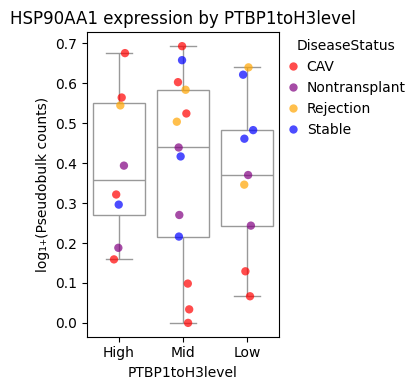

In [689]:
plot_pseudobulk_boxplot(
    pdata_filtered_norm,
    gene="HSP90AA1",
    filters={"Location": "Septum"},
    group_by="PTBP1toH3level",
    figsize=(4, 4),  # narrower width
    output_dir="/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/GeneExpression_by_PTBP1_level_EC_plots"
)

# Plot specific proteins on UMAP

In [97]:
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH_endothelial.h5ad"
adata_EC_subset = sc.read_h5ad(output_path)

In [98]:
# Optional: check how many cells remain
print(f"Number of cells before filtering: {adata_EC_subset.n_obs}")

Number of cells before filtering: 41430


In [8]:
adata_EC_subset

AnnData object with n_obs × n_vars = 41430 × 31844
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_coun

In [9]:
# Keep cells where total_counts_H3 >= 1
adata_EC_subset = adata_EC_subset[adata_EC_subset.obs['total_counts_H3'] >= 5].copy()

# Filter cells in AnnData first
adata_filtered = adata_EC_subset[
#    (adata_EC_subset.obs['DiseaseStatus'] == 'CAV') &
#    (adata_EC_subset.obs['SampleType'] == 'Biopsy') &
#    (adata_EC_subset.obs['GraftHost'] == 'Graft') &
#    (adata_EC_subset.obs['Location'] == 'Septum')
    (adata_EC_subset.obs['DiseaseStatus'] != 'LateRejection') 
].copy()
#adata_filtered = adata_EC_subset.copy()

# Optional: check how many cells remain
print(f"Number of cells after filtering: {adata_EC_subset.n_obs}")


Number of cells after filtering: 31805


In [10]:
adata_filtered.var["feature_types"].value_counts()


feature_types
Gene Expression    31844
Name: count, dtype: int64

In [11]:
sc.tl.pca(adata_filtered, svd_solver='arpack')


computing PCA
    with n_comps=50
    finished (0:00:06)


In [12]:
from harmony import harmonize


In [13]:
adata_filtered.obsm['X_harmony'] = harmonize(np.array(adata_filtered.obsm['X_pca']), 
                                    adata_filtered.obs, batch_key = ['StrippedDonor', '10xRxn'])

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).


In [14]:
sc.pp.neighbors(adata_filtered, use_rep='X_harmony', n_neighbors=30, n_pcs=40)
sc.tl.umap(adata_filtered, min_dist=0.5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:47)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:47)


In [15]:
sc.tl.leiden(adata_filtered)


running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:08)


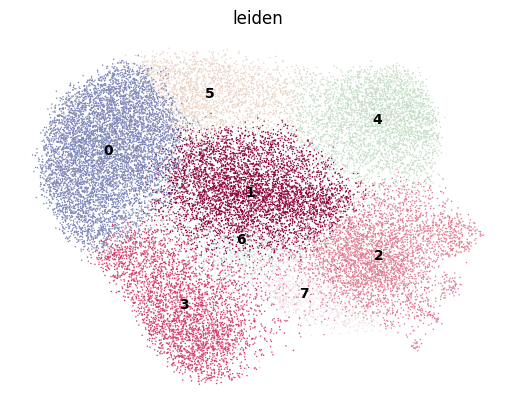

In [16]:
sc.pl.umap(adata_filtered, color='leiden', legend_loc='on data', frameon=False)


In [17]:
sc.tl.rank_genes_groups(adata_filtered, groupby='leiden', method='wilcoxon', use_raw=False)


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:52)


In [18]:
sc.tl.dendrogram(adata_filtered, groupby='leiden')


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


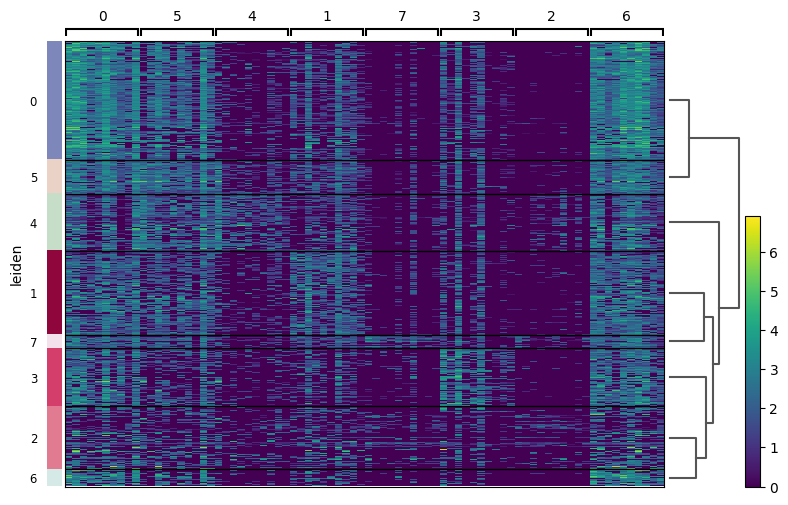

In [19]:
sc.pl.rank_genes_groups_heatmap(adata_filtered, n_genes=10, groupby='leiden')


In [29]:
top_n = 20
marker_genes = {}

groups = adata_filtered.obs['leiden'].cat.categories
ranked = adata_filtered.uns['rank_genes_groups']

for g in groups:
    genes = ranked['names'][g][:top_n]
    marker_genes[g] = genes


In [30]:
marker_genes

{'0': array(['FLT1', 'TACC1', 'PIK3R3', 'F8', 'ABLIM3', 'ST6GALNAC3', 'MCF2L',
        'BTNL9', 'EPB41L2', 'PITPNC1', 'SORBS1', 'TBCD', 'TIMP3', 'PLXNA2',
        'HIPK2', 'PLEKHG1', 'ABLIM1', 'ESYT2', 'CADPS2', 'WNK1'],
       dtype=object),
 '1': array(['CDH13', 'CD36', 'KIAA1217', 'EMCN', 'SPARCL1', 'PKD1L1', 'TCF4',
        'ITGA6', 'NRP1', 'ADGRL2', 'AFAP1L1', 'HECW2', 'SLC9C1', 'ETS1',
        'PRAG1', 'MAGI1', 'DOCK4', 'PLCB1', 'ARHGAP29', 'ITGA1'],
       dtype=object),
 '2': array(['PRKG1', 'PLA2G5', 'TFPI', 'MIR99AHG', 'PARD3', 'NR2F2-AS1',
        'LINC02147', 'MEIS2', 'FRMD4B', 'ARHGAP10', 'ZEB2', 'PKHD1L1',
        'EPS8', 'CDH11', 'KANK1', 'DAPK1', 'PCDH7', 'CACNA2D1', 'ITSN1',
        'CARMIL1'], dtype=object),
 '3': array(['ARL15', 'LINC00639', 'MECOM', 'PCSK5', 'SMAD6', 'UTRN', 'NEBL',
        'PRDM16', 'FUT8', 'LINC01695', 'DOCK9', 'EPAS1', 'MAP4', 'RFTN1',
        'MAST4', 'PDZD2', 'RNF144B', 'PTPRB', 'PDE4D', 'SH3PXD2B'],
       dtype=object),
 '4': array(['TSHZ2', 

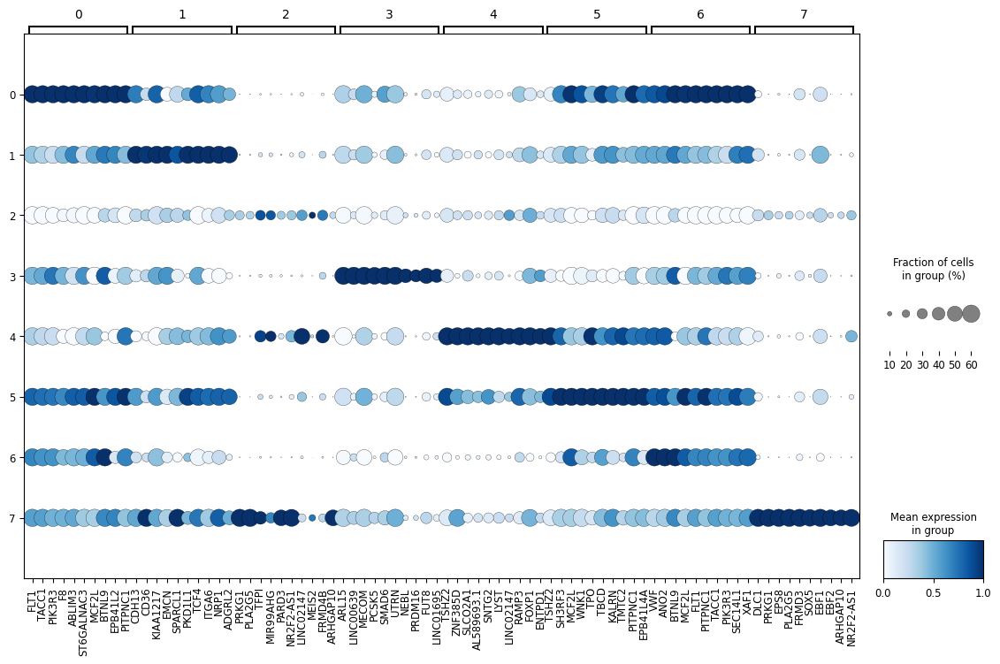

In [27]:
sc.pl.dotplot(
    adata_filtered,
    var_names=marker_genes,
    groupby='leiden',
    standard_scale='var',
    dot_max=0.6,
    color_map='Blues',
    figsize=(14, 8)
)


In [21]:
sc.tl.dendrogram(adata_filtered, groupby='leiden_with_counts')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_with_counts']`


categories: 0 (n=7062), 1 (n=4976), 2 (n=3738), etc.
var_group_labels: EC, Arterial, LargeArtery, etc.


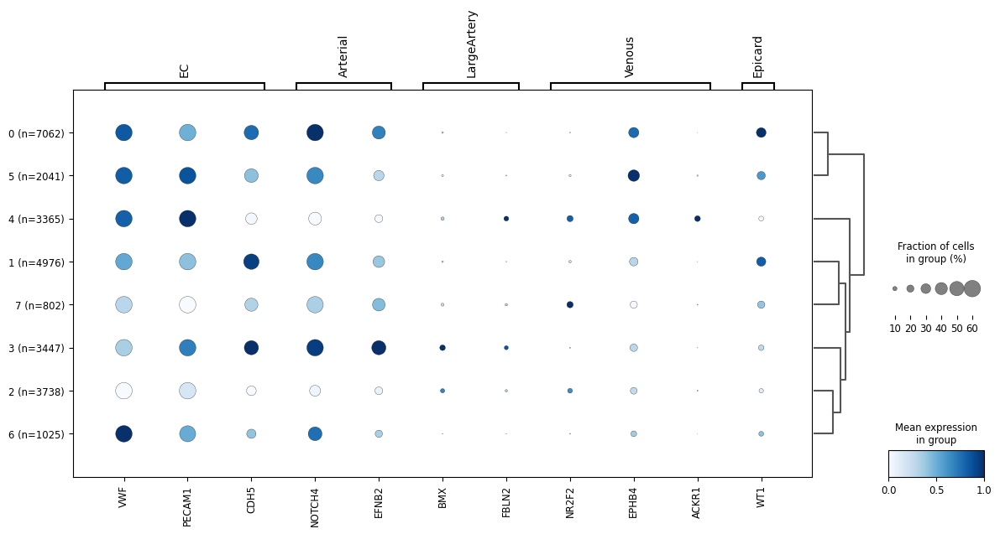

In [22]:
# Ensure Leiden clusters exist in adata.obs
cluster_key = 'leiden'

# Calculate cell counts per cluster
cluster_counts = adata_filtered.obs[cluster_key].value_counts().sort_index()

# Create new cluster labels with counts appended
cluster_labels_with_counts = [f"{cluster} (n={count})" for cluster, count in cluster_counts.items()]

# Create a mapping from original cluster to new label
cluster_label_map = dict(zip(cluster_counts.index.astype(str), cluster_labels_with_counts))

# Add new labels to adata.obs for plotting
adata_filtered.obs['leiden_with_counts'] = adata_filtered.obs[cluster_key].map(cluster_label_map)

# Define marker genes dictionary again for completeness
marker_genes_dict = {
#    'CM': ['MYH7', 'MYL2', 'FHL2'],
#    'FB': ['DCN', 'COL1A1', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5'],
    'Arterial': ['NOTCH4', 'EFNB2'],
    'LargeArtery': ['BMX', 'FBLN2'],
    'Venous': ['NR2F2', 'EPHB4', 'ACKR1'],
    'Epicard': ['WT1'],
#    'Peri': ['RGS5', 'KCNJ8', 'ANPEP'],
#    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
#    'Neuro': ['RELN', 'NRXN1', 'NRXN3'],
#    'Myeloid': ['CD14', 'C1QA', 'CD68'],
#    'Lymphoid': ['PTPRC', 'IL7R', 'CD3D'],
}

# Generate the dotplot grouped by the new cluster labels with counts
sc.pl.dotplot(
    adata_filtered,
    var_names=marker_genes_dict,
    groupby='leiden_with_counts',
    standard_scale='var',  # normalize per gene
    dot_max=0.6,
    color_map='Blues',
    figsize=(14, 6),
    dendrogram=True
)

# Save as PDF with proper text
plt.savefig("/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/MarkersAllCells_ECs.pdf", bbox_inches="tight")
plt.close()

<Figure size 1000x600 with 0 Axes>

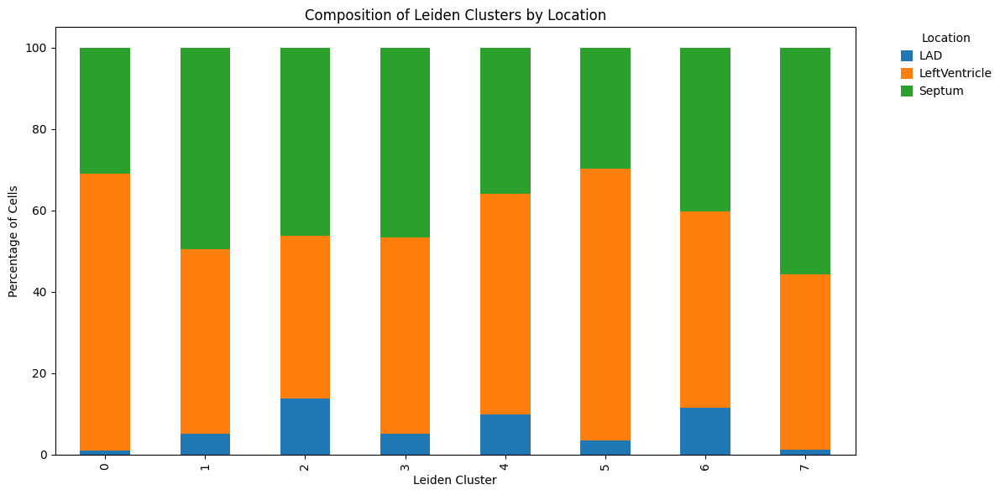

In [31]:
# Extract needed columns
df = adata_filtered.obs[['leiden', 'Location', 'DiseaseStatus']].copy()

# Count cells per leiden × Location
cluster_counts = pd.crosstab(df['leiden'], df['Location'])

# Convert to percentages if desired
cluster_pct = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

# --- Plot ---
plt.figure(figsize=(10, 6))
cluster_pct.plot(kind='bar', stacked=True, figsize=(12,6))

plt.title("Composition of Leiden Clusters by Location")
plt.ylabel("Percentage of Cells")
plt.xlabel("Leiden Cluster")
plt.legend(title="Location", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

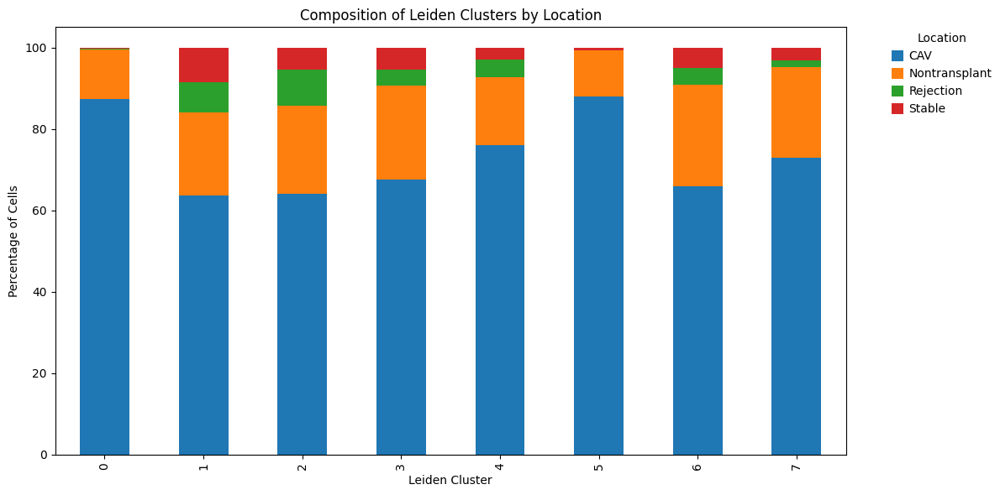

In [23]:
# Extract needed columns
df = adata_filtered.obs[['leiden', 'Location', 'DiseaseStatus']].copy()

# Count cells per leiden × Location
cluster_counts = pd.crosstab(df['leiden'], df['DiseaseStatus'])

# Convert to percentages if desired
cluster_pct = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100

# --- Plot ---
plt.figure(figsize=(10, 6))
cluster_pct.plot(kind='bar', stacked=True, figsize=(12,6))

plt.title("Composition of Leiden Clusters by Location")
plt.ylabel("Percentage of Cells")
plt.xlabel("Leiden Cluster")
plt.legend(title="Location", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### AV marker specification and organization

In [53]:
# Artery → Arteriole → Capillary → Venule → Vein
av_marker_genes = {
    "LargeArtery": ['BMX','FBLN2','GJA5'],
    "Arteriole":   ['EFNB2','DLL4','NOTCH4','HEY1'],
    "Capillary":   ['EMCN','CD36','NRP1','PRKG1'],
    "Venule":      ['PLA2G5','TFPI','PRKG1'],
    "LargeVein":   ['NR2F2','EPHB4','ACKR1','COUP-TFII']
}

# Flatten for heatmap
all_genes = [gene for group in av_marker_genes.values() for gene in group]

In [54]:
all_genes = [g for g in all_genes if g in adata_filtered.var_names]


In [55]:
# Optionally use raw counts if available
sc.pp.scale(adata_filtered, zero_center=True, max_value=10)

# Subset the data to these genes
adata_sub = adata_filtered[:, all_genes]


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [56]:
# Compute scores per AV layer
for name, genes in av_marker_genes.items():
    genes_present = [g for g in genes if g in adata_sub.var_names]
    if genes_present:
        sc.tl.score_genes(adata_sub, gene_list=genes_present, score_name=name+'_score')


computing score 'LargeArtery_score'
    finished: added
    'LargeArtery_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:02)
computing score 'Arteriole_score'
    finished: added
    'Arteriole_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'Capillary_score'
    finished: added
    'Capillary_score', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'Venule_score'
    finished: added
    'Venule_score', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'LargeVein_score'
    finished: added
    'LargeVein_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)


In [57]:
adata_sub.obs['av_index'] = (
    adata_sub.obs['LargeArtery_score']*2 +
    adata_sub.obs['Arteriole_score']*1 -
    adata_sub.obs['Venule_score']*1 -
    adata_sub.obs['LargeVein_score']*2
)

# Get expression matrix
expr = adata_sub.to_df()[all_genes]

# Order cells by av_index
expr['av_index'] = adata_sub.obs['av_index']
expr = expr.sort_values('av_index')
expr = expr.drop(columns=['av_index'])

# Add DiseaseStatus
disease_status = adata_sub.obs['DiseaseStatus']

In [85]:
# Define thresholds (adjust according to your data distribution)
# Example: manually define cutoffs from av_index
def assign_av_group(av_index):
    if av_index > 1.6:
        return "Artery"
    elif av_index > 0.6:
        return "Arteriole"
    elif av_index > -0.0:
        return "Capillary"
    elif av_index > -1:
        return "Venule"
    else:
        return "Vein"

adata_sub.obs['AV_group'] = adata_sub.obs['av_index'].apply(assign_av_group)


In [160]:
av_colors = {
    'Artery':   '#d62728',  # red
    'Arteriole': '#ff9896', # light red / pink
    'Capillary': '#f7f7f7', # neutral (optional)
    'Venule':   '#9ecae1',  # light blue
    'Vein':     '#1f77b4'   # blue
}



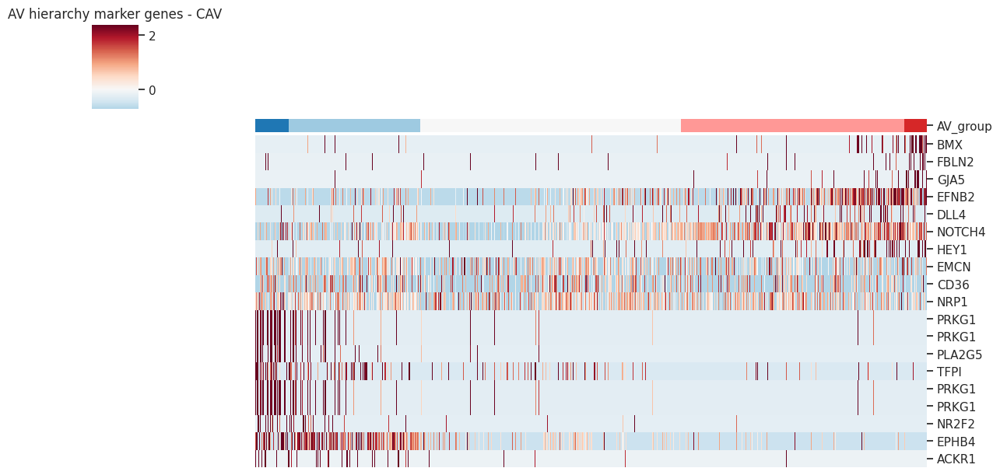

No cells found for DiseaseStatus=nan, skipping.


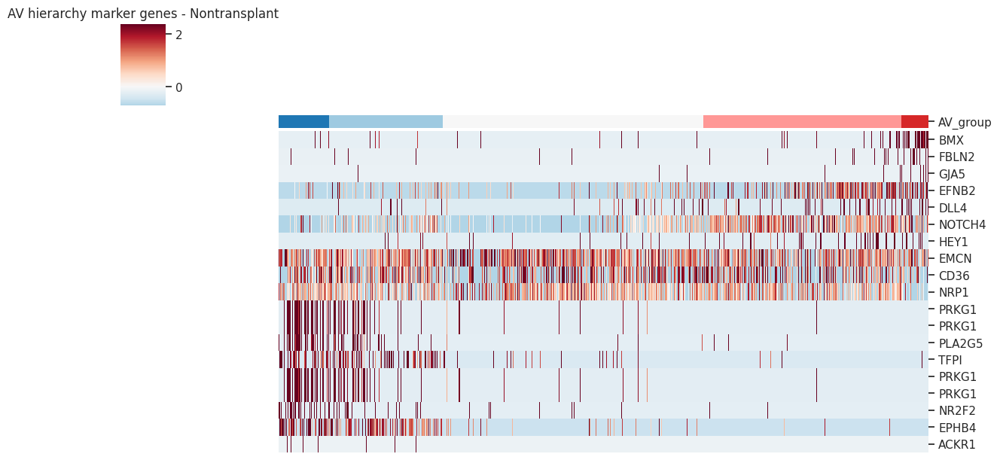

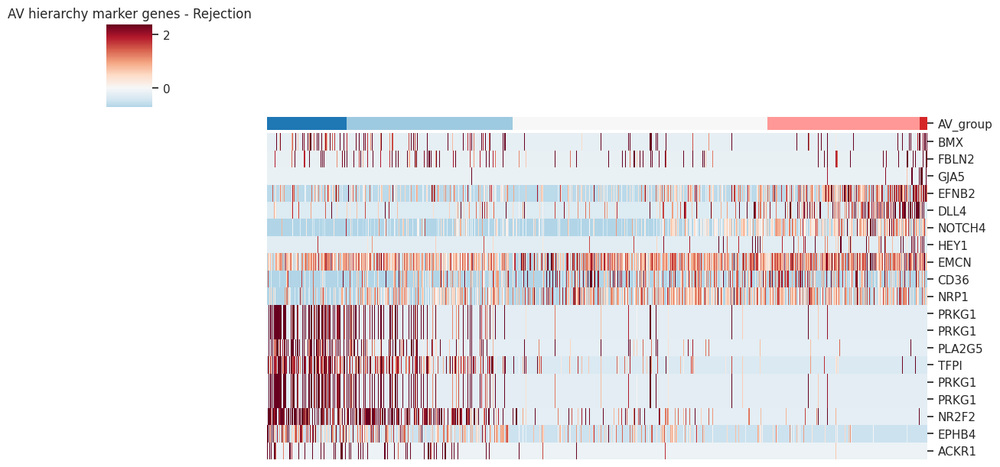

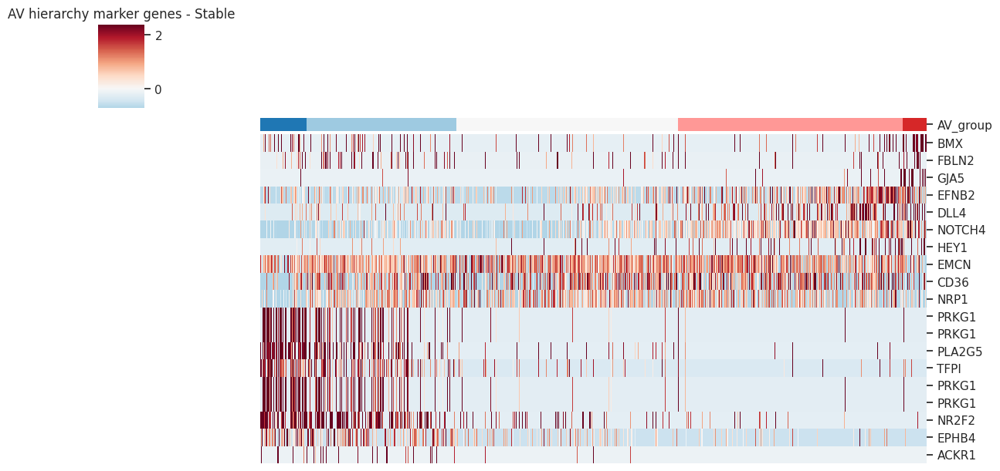

In [161]:
vmin, vmax = np.percentile(expr_sub.values, [5, 95])


for status in adata_sub.obs['DiseaseStatus'].unique():
    mask = adata_sub.obs['DiseaseStatus'] == status
    expr_sub = expr.loc[mask, :]  # subset expression matrix for this group
    
    if expr_sub.shape[0] == 0:
        print(f"No cells found for DiseaseStatus={status}, skipping.")
        continue
    
    # Map cells to AV colors
    col_colors = adata_sub.obs.loc[mask, 'AV_group'].map(av_colors)
    
    # Plot heatmap
    sns.clustermap(
        expr_sub.T,
        col_cluster=False,   # do not cluster cells
        row_cluster=False,   # keep AV gene order
        cmap='RdBu_r',
        center=0,
        figsize=(12,6),
        vmin=vmin,
        vmax=vmax,
        xticklabels=False,
        yticklabels=True,
        col_colors=col_colors
    )
    plt.title(f"AV hierarchy marker genes - {status}")
    plt.show()


2025-12-15 12:06:27 | [INFO] maxp pruned
2025-12-15 12:06:27 | [INFO] cmap pruned
2025-12-15 12:06:27 | [INFO] kern dropped
2025-12-15 12:06:27 | [INFO] post pruned
2025-12-15 12:06:27 | [INFO] FFTM dropped
2025-12-15 12:06:27 | [INFO] GPOS pruned
2025-12-15 12:06:27 | [INFO] GSUB pruned
2025-12-15 12:06:27 | [INFO] name pruned
2025-12-15 12:06:27 | [INFO] glyf pruned
2025-12-15 12:06:27 | [INFO] Added gid0 to subset
2025-12-15 12:06:27 | [INFO] Added first four glyphs to subset
2025-12-15 12:06:27 | [INFO] Closing glyph list over 'GSUB': 49 glyphs before
2025-12-15 12:06:27 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'T', 'V', 'X', 'Y', 'a', 'c', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-15 12:06:27 | [INFO] Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23, 24, 25, 3

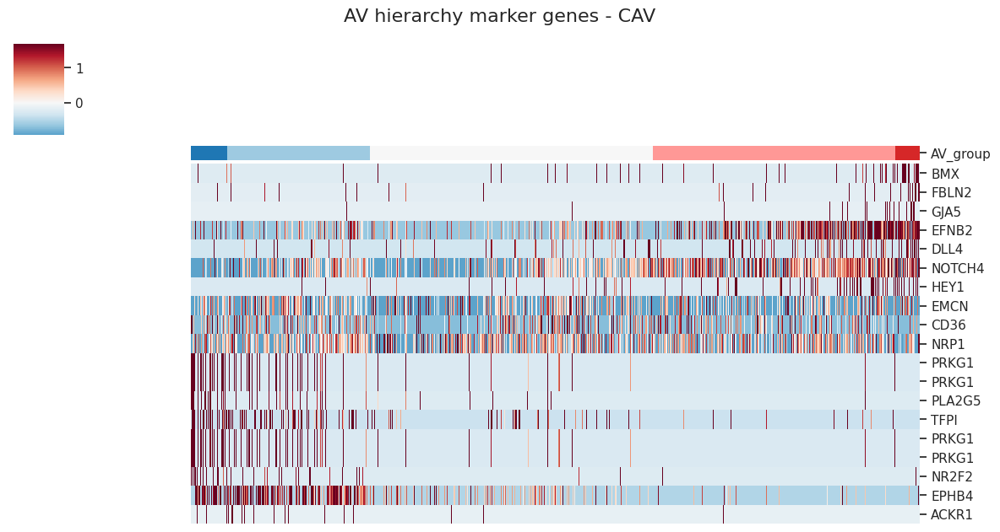

No cells found for DiseaseStatus=nan, skipping.


2025-12-15 12:06:45 | [INFO] maxp pruned
2025-12-15 12:06:45 | [INFO] cmap pruned
2025-12-15 12:06:45 | [INFO] kern dropped
2025-12-15 12:06:45 | [INFO] post pruned
2025-12-15 12:06:45 | [INFO] FFTM dropped
2025-12-15 12:06:45 | [INFO] GPOS pruned
2025-12-15 12:06:45 | [INFO] GSUB pruned
2025-12-15 12:06:45 | [INFO] name pruned
2025-12-15 12:06:45 | [INFO] glyf pruned
2025-12-15 12:06:45 | [INFO] Added gid0 to subset
2025-12-15 12:06:45 | [INFO] Added first four glyphs to subset
2025-12-15 12:06:45 | [INFO] Closing glyph list over 'GSUB': 51 glyphs before
2025-12-15 12:06:45 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'T', 'V', 'X', 'Y', 'a', 'c', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-15 12:06:45 | [INFO] Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23,

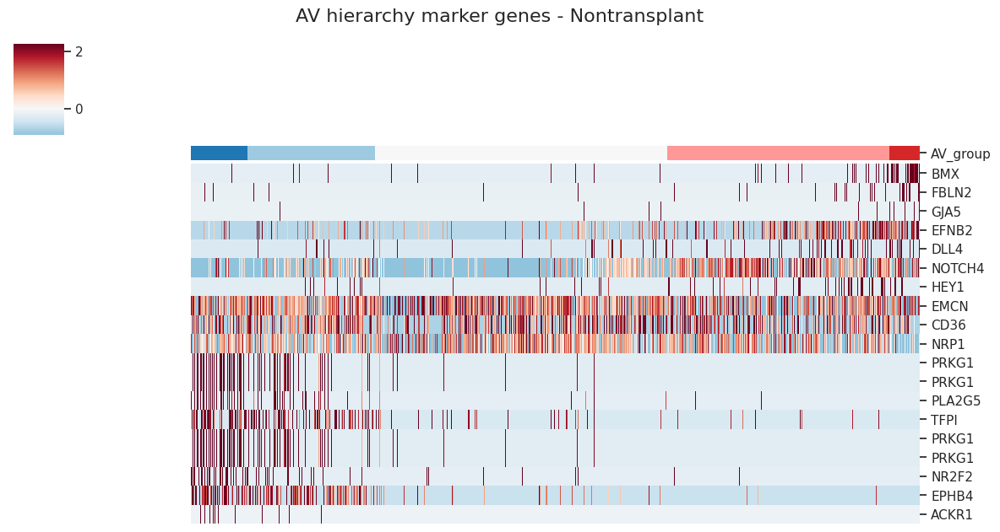

2025-12-15 12:06:50 | [INFO] maxp pruned
2025-12-15 12:06:50 | [INFO] cmap pruned
2025-12-15 12:06:50 | [INFO] kern dropped
2025-12-15 12:06:50 | [INFO] post pruned
2025-12-15 12:06:50 | [INFO] FFTM dropped
2025-12-15 12:06:50 | [INFO] GPOS pruned
2025-12-15 12:06:50 | [INFO] GSUB pruned
2025-12-15 12:06:50 | [INFO] name pruned
2025-12-15 12:06:50 | [INFO] glyf pruned
2025-12-15 12:06:50 | [INFO] Added gid0 to subset
2025-12-15 12:06:50 | [INFO] Added first four glyphs to subset
2025-12-15 12:06:50 | [INFO] Closing glyph list over 'GSUB': 51 glyphs before
2025-12-15 12:06:50 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'T', 'V', 'X', 'Y', 'a', 'c', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'j', 'k', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-15 12:06:50 | [INFO] Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23,

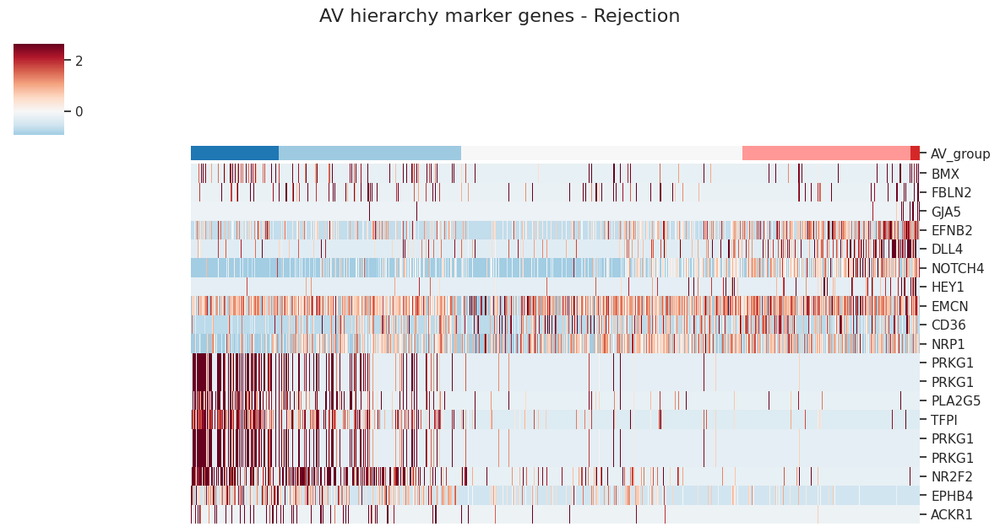

2025-12-15 12:06:55 | [INFO] maxp pruned
2025-12-15 12:06:55 | [INFO] cmap pruned
2025-12-15 12:06:55 | [INFO] kern dropped
2025-12-15 12:06:55 | [INFO] post pruned
2025-12-15 12:06:55 | [INFO] FFTM dropped
2025-12-15 12:06:55 | [INFO] GPOS pruned
2025-12-15 12:06:55 | [INFO] GSUB pruned
2025-12-15 12:06:55 | [INFO] name pruned
2025-12-15 12:06:55 | [INFO] glyf pruned
2025-12-15 12:06:55 | [INFO] Added gid0 to subset
2025-12-15 12:06:55 | [INFO] Added first four glyphs to subset
2025-12-15 12:06:55 | [INFO] Closing glyph list over 'GSUB': 53 glyphs before
2025-12-15 12:06:55 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'X', 'Y', 'a', 'b', 'c', 'e', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-15 12:06:55 | [INFO] Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 2

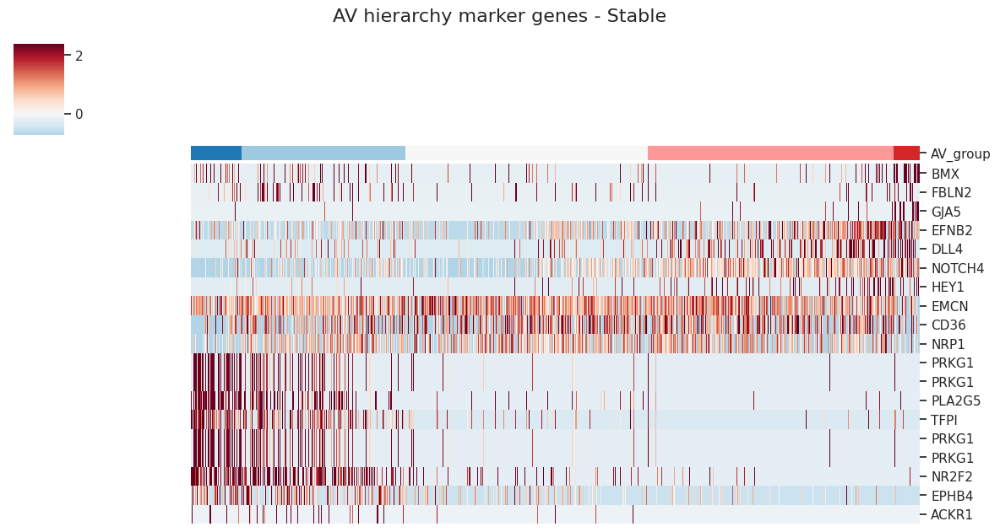

In [162]:
import matplotlib

# Loop over DiseaseStatus
for status in adata_sub.obs['DiseaseStatus'].unique():
    mask = adata_sub.obs['DiseaseStatus'] == status
    expr_sub = expr.loc[mask, :]  # subset expression matrix
    
    if expr_sub.shape[0] == 0:
        print(f"No cells found for DiseaseStatus={status}, skipping.")
        continue

    # Map cells to AV colors
    col_colors = adata_sub.obs.loc[mask, 'AV_group'].map(av_colors)

    # Determine max absolute value for stronger color contrast
    vmin, vmax = np.percentile(expr_sub.values, [5, 95])

    # Ensure DejaVu Sans is used and embedded
    matplotlib.rcParams['pdf.fonttype'] = 42  # TrueType fonts
    matplotlib.rcParams['ps.fonttype'] = 42   # TrueType fonts for EPS if needed
    plt.rcParams['font.family'] = 'DejaVu Sans'

    # Example clustermap (your loop here)
    g = sns.clustermap(
        expr_sub.T,
        col_cluster=False,
        row_cluster=False,
        cmap='RdBu_r',
        center=0,
        vmin=vmin,
        vmax=vmax,
        figsize=(12,6),
        xticklabels=False,
        yticklabels=True,
        col_colors=col_colors
    )

    g.fig.suptitle(f"AV hierarchy marker genes - {status}", y=1.05, fontsize=16)

    # Save PDF with TrueType fonts (letters as strings)
    output_file = f"/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/AV_hierarchy_{status}.pdf"
    g.savefig(output_file, format='pdf', bbox_inches='tight', dpi=300)
    plt.show()

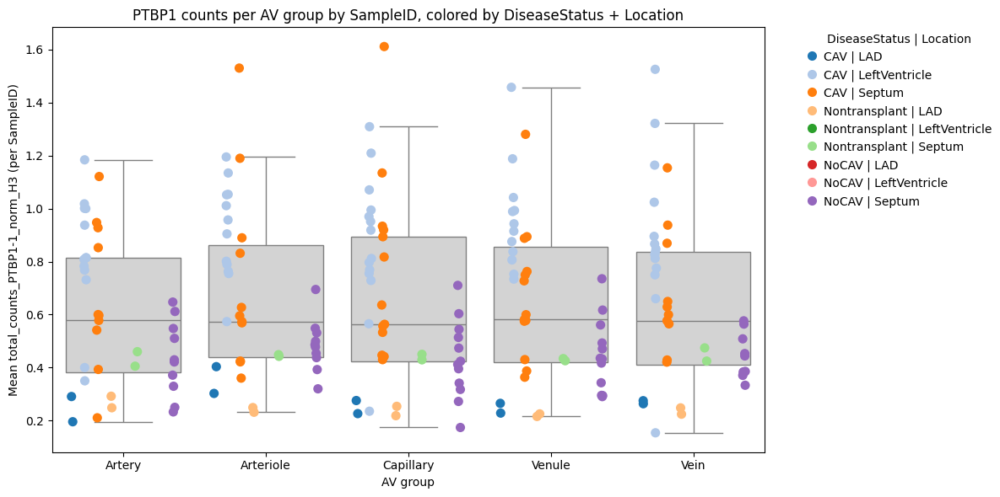

In [95]:
# Copy relevant obs
df = adata_sub.obs.copy()
df['total_counts_PTBP1-1_norm_H3'] = adata_sub.obs['total_counts_PTBP1-1_norm_H3']

# Combine DiseaseStatus
df['DiseaseStatus'] = df['DiseaseStatus'].replace({'Stable': 'NoCAV', 'Rejection': 'NoCAV'})

# Group by SampleID, AV_group, DiseaseStatus, and Location, take mean per SampleID
df_mean = df.groupby(['sampleID', 'AV_group', 'DiseaseStatus', 'Location'])['total_counts_PTBP1-1_norm_H3'].mean().reset_index()

# Convert categorical columns to strings to avoid TypeError
df_mean['DiseaseStatus'] = df_mean['DiseaseStatus'].astype(str)
df_mean['Location'] = df_mean['Location'].astype(str)

# Create combined column for coloring
df_mean['status_location'] = df_mean['DiseaseStatus'] + ' | ' + df_mean['Location']

# Ensure AV_group ordering
av_order = ['Artery', 'Arteriole', 'Capillary', 'Venule', 'Vein']
df_mean['AV_group'] = pd.Categorical(df_mean['AV_group'], categories=av_order, ordered=True)

# Set font for figure text (DejaVu Sans is default, but enforce)
plt.rcParams['font.family'] = 'DejaVu Sans'

# Plot
fig, ax = plt.subplots(figsize=(12,6))

# Boxplot background
sns.boxplot(
    x='AV_group',
    y='total_counts_PTBP1-1_norm_H3',
    data=df_mean,
    color='lightgray',
    fliersize=0,
    ax=ax
)

# Overlay points colored by DiseaseStatus + Location
sns.stripplot(
    x='AV_group',
    y='total_counts_PTBP1-1_norm_H3',
    data=df_mean,
    hue='status_location',
    dodge=True,
    jitter=True,
    size=8,
    palette='tab20',
    ax=ax
)

ax.set_ylabel('Mean total_counts_PTBP1-1_norm_H3 (per SampleID)')
ax.set_xlabel('AV group')
ax.set_title('PTBP1 counts per AV group by SampleID, colored by DiseaseStatus + Location')
ax.legend(title='DiseaseStatus | Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Export to PDF with embedded fonts for Illustrator
output_file = '/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PTBP1_AVgroup_DiseaseLocation.pdf'
fig.savefig(output_file, format='pdf', bbox_inches='tight')

plt.show()


2025-12-12 16:32:48 | [INFO] maxp pruned
2025-12-12 16:32:48 | [INFO] cmap pruned
2025-12-12 16:32:48 | [INFO] kern dropped
2025-12-12 16:32:48 | [INFO] post pruned
2025-12-12 16:32:48 | [INFO] FFTM dropped
2025-12-12 16:32:48 | [INFO] GPOS pruned
2025-12-12 16:32:48 | [INFO] GSUB pruned
2025-12-12 16:32:48 | [INFO] name pruned
2025-12-12 16:32:48 | [INFO] glyf pruned
2025-12-12 16:32:48 | [INFO] Added gid0 to subset
2025-12-12 16:32:48 | [INFO] Added first four glyphs to subset
2025-12-12 16:32:48 | [INFO] Closing glyph list over 'GSUB': 43 glyphs before
2025-12-12 16:32:48 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'H', 'M', 'N', 'P', 'S', 'T', 'V', 'a', 'b', 'c', 'e', 'eight', 'four', 'g', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-12 16:32:48 | [INFO] Glyph IDs:   [0, 1, 2, 3, 11, 12, 16, 17, 19, 20, 21, 22, 23, 25, 

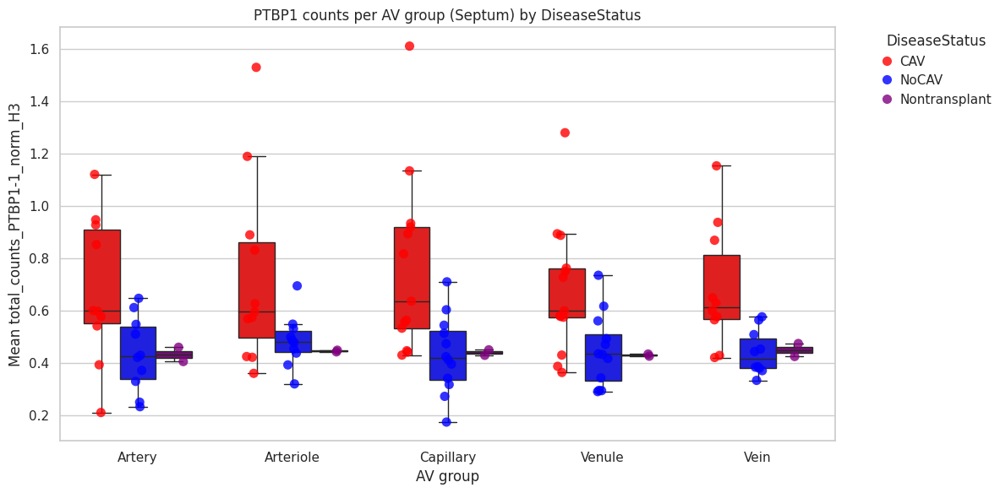

In [124]:
# Copy relevant obs
df = adata_sub.obs.copy()
df['total_counts_PTBP1-1_norm_H3'] = adata_sub.obs['total_counts_PTBP1-1_norm_H3']

# Combine DiseaseStatus
df['DiseaseStatus'] = df['DiseaseStatus'].replace({'Stable': 'NoCAV', 'Rejection': 'NoCAV'})

# Filter to Location = Septum
df = df[df['Location'] == 'Septum']

# Group by SampleID, AV_group, DiseaseStatus
df_mean = df.groupby(['sampleID', 'AV_group', 'DiseaseStatus'])['total_counts_PTBP1-1_norm_H3'].mean().reset_index()

# Ensure AV and Disease ordering
av_order = ['Artery', 'Arteriole', 'Capillary', 'Venule', 'Vein']
disease_order = ['CAV', 'NoCAV', 'Nontransplant']
df_mean['AV_group'] = pd.Categorical(df_mean['AV_group'], categories=av_order, ordered=True)
df_mean['DiseaseStatus'] = pd.Categorical(df_mean['DiseaseStatus'], categories=disease_order, ordered=True)

# Define colors
disease_colors = {
    "CAV": "red",
    "NoCAV": "blue",
    "Nontransplant": "purple"
}

# Plot
plt.figure(figsize=(12,6))
sns.set(style="whitegrid")

# Boxplot (light background)
sns.boxplot(
    x='AV_group',
    y='total_counts_PTBP1-1_norm_H3',
    hue='DiseaseStatus',
    data=df_mean,
    order=av_order,
    hue_order=disease_order,
    palette=disease_colors,
    fliersize=0,       # hide outliers (we'll show points separately)
    width=0.7
)

# Overlay individual SampleID points
sns.stripplot(
    x='AV_group',
    y='total_counts_PTBP1-1_norm_H3',
    hue='DiseaseStatus',
    data=df_mean,
    order=av_order,
    hue_order=disease_order,
    dodge=True,
    jitter=True,
    size=8,
    palette=disease_colors,
    alpha=0.8
)

# Labels and title
plt.xlabel('AV group')
plt.ylabel('Mean total_counts_PTBP1-1_norm_H3')
plt.title('PTBP1 counts per AV group (Septum) by DiseaseStatus')

# Adjust legend (only show once)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), title='DiseaseStatus', bbox_to_anchor=(1.05,1), loc='upper left')

plt.tight_layout()

# Save PDF with embedded fonts
plt.rcParams['pdf.fonttype'] = 42
output_file = '/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/PTBP1_AVgroup_DiseaseStatus_Septum_Boxplot.pdf'
plt.savefig(output_file, format='pdf', bbox_inches='tight', dpi=300)

plt.show()

2025-12-15 11:55:11 | [INFO] maxp pruned
2025-12-15 11:55:11 | [INFO] cmap pruned
2025-12-15 11:55:11 | [INFO] kern dropped
2025-12-15 11:55:11 | [INFO] post pruned
2025-12-15 11:55:11 | [INFO] FFTM dropped
2025-12-15 11:55:11 | [INFO] GPOS pruned
2025-12-15 11:55:11 | [INFO] GSUB pruned
2025-12-15 11:55:11 | [INFO] name pruned
2025-12-15 11:55:11 | [INFO] glyf pruned
2025-12-15 11:55:11 | [INFO] Added gid0 to subset
2025-12-15 11:55:11 | [INFO] Added first four glyphs to subset
2025-12-15 11:55:11 | [INFO] Closing glyph list over 'GSUB': 20 glyphs before
2025-12-15 11:55:11 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'V', 'a', 'e', 'g', 'i', 'l', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 'space', 't', 'u', 'underscore', 'y']
2025-12-15 11:55:11 | [INFO] Glyph IDs:   [0, 1, 2, 3, 36, 38, 57, 66, 68, 72, 74, 76, 79, 81, 82, 83, 85, 87, 88, 92]
2025-12-15 11:55:11 | [INFO] Closed glyph list over 'GSUB': 20 glyphs after
2025-12-15 11:55:11 | [INFO] Glyph names: ['.notdef', '.null',

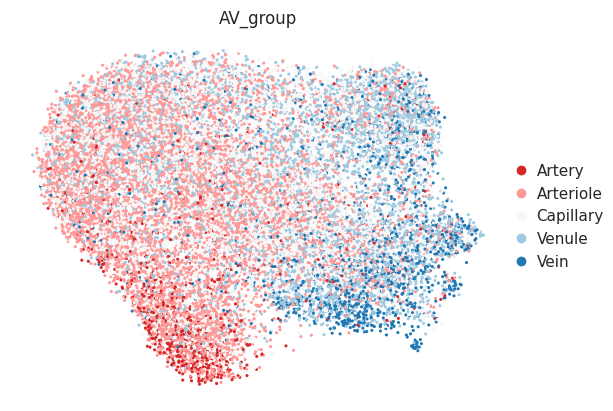

In [159]:
av_colors = {
    'Artery':   '#d62728',  # red
    'Arteriole': '#ff9896', # light red / pink
    'Capillary': '#f7f7f7', # neutral (optional)
    'Venule':   '#9ecae1',  # light blue
    'Vein':     '#1f77b4'   # blue
}


sc.pl.umap(
    adata_sub,
    color="AV_group",
    groups=list(av_colors.keys()),
    palette=av_colors,
    frameon=False,
    size=20,
    legend_loc="right margin",
    show=False
)

plt.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/"
    "UMAP_AV_group_colored.pdf",
    bbox_inches="tight"
)
plt.show()
plt.close()

In [131]:
samples10x = adata_filtered.obs['10xRxn'].value_counts()
print("Cell type counts:\n", samples10x)

Cell type counts:
 10xRxn
May2025_RVDuke2      9014
May2025_RVLVUCLA     5688
May2025_RVDuke1      5215
May2025_IVSDuke1     2528
May2025_LADUCLA      1545
April2025_Sample2     808
April2025_Sample3     712
April2025_Sample1     549
May2025_IVSDuke2      397
Name: count, dtype: int64


In [153]:
def generate_labels(protein_name, percentiles):
    """Generates label names based on protein name and percentiles."""
    labels = [f"{protein_name}_0to{int(percentiles[0] * 100)}"]
    for i in range(len(percentiles) - 1):
        labels.append(f"{protein_name}_{int(percentiles[i] * 100)}to{int(percentiles[i+1] * 100)}")
    labels.append(f"{protein_name}_{int(percentiles[-1] * 100)}to100")
    return labels

def categorize(val, quantiles, labels):
    """Categorize the value based on quantiles and assign a corresponding label."""
    for q, label in zip(quantiles, labels):
        if val <= q:
            return label
    return labels[-1]

def analyze_protein_expression(
    adata, protein_name, 
    percentiles=[0.3, 0.7],
    lower=0.01, upper=0.99
):
    import matplotlib.pyplot as plt
    import matplotlib as mpl
    mpl.rcParams['pdf.fonttype'] = 42
    mpl.rcParams['ps.fonttype'] = 42

    column_name = f'total_counts_{protein_name}'

    if column_name not in adata.obs.columns:
        raise ValueError(f"Column '{column_name}' not found in adata.obs.")

    # Step 1: Remove NaNs
    adata_valid = adata[~adata.obs[column_name].isna()].copy()

    # Step 2: Filter extreme values
    low, high = adata_valid.obs[column_name].quantile([lower, upper])
    adata_filtered = adata_valid[
        (adata_valid.obs[column_name] >= low) &
        (adata_valid.obs[column_name] <= high)
    ].copy()

    print(adata_filtered.obs[column_name].describe())

    # Step 3: Compute thresholds & labels
    thresholds = adata_filtered.obs[column_name].quantile(percentiles).values
    labels = generate_labels(protein_name, percentiles)

    # Step 4: Apply binning
    def _categorize(val):
        for i, q in enumerate(thresholds):
            if val <= q:
                return labels[i]
        return labels[-1]

    adata_filtered.obs[f'pct_{protein_name}'] = (
        adata_filtered.obs[column_name].apply(_categorize)
    )

    print(adata_filtered.obs[f'pct_{protein_name}'].value_counts())

    # Step 5: UMAP density plot
    sc.tl.embedding_density(
        adata_filtered,
        basis='umap',
        groupby=f'pct_{protein_name}',
        key_added=f'umap_density_pct_{protein_name}'
    )

    sc.pl.embedding_density(
        adata_filtered,
        basis='umap',
        key=f'umap_density_pct_{protein_name}',
        color_map='turbo',
        fg_dotsize=400,
        bg_dotsize=50,
        frameon=False,
        show=False
    )

    # Save PDF
    outpath = (
        "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/"
        f"UMAP_{protein_name}_expression_density.pdf"
    )

    plt.savefig(outpath, bbox_inches="tight")
    plt.close()



def plot_total_counts_boxplots_log(adata):
    """
    Plots log-scale boxplots of all total_counts columns, excluding nuclear/H3 normalization variants.
    """
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt

    import matplotlib as mpl
    mpl.rcParams['pdf.fonttype'] = 42
    mpl.rcParams['ps.fonttype'] = 42
    
    # Define substrings to exclude
    excluded_substrings = [
        "_norm_NuclearPore", 
        "_norm_H3", 
        "_nCLR_NuclearPore", 
        "_nCLR_H3"
    ]

    # Select relevant columns
    selected_columns = [
        col for col in adata.obs.columns
        if col.startswith("total_counts_") and not any(excl in col for excl in excluded_substrings)
    ]

    if not selected_columns:
        raise ValueError("No matching 'total_counts_' columns found after exclusions.")

    # Melt and log-transform
    df_long = adata.obs[selected_columns].copy().melt(var_name="Feature", value_name="Counts")
    df_long["LogCounts"] = np.log1p(df_long["Counts"])  # log(1 + counts)

    # Plot
    plt.figure(figsize=(len(selected_columns) * 0.7, 5))
    sns.boxplot(data=df_long, x="Feature", y="LogCounts", color="lightgray")
    plt.xticks(rotation=90)
    plt.ylabel("log(1 + counts)")
    plt.title("Total Counts Boxplot (log scale)")
    plt.tight_layout()
    
    plt.savefig(
        "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/"
        "TotalCounts_log_boxplots.pdf", 
        bbox_inches="tight"
    )
    plt.show()
    plt.close()


In [154]:
analyze_protein_expression(adata_filtered, "PTBP1-1_norm_H3")

... storing 'pct_PTBP1-1_norm_H3' as categorical


count    25980.000000
mean         0.737279
std          0.427291
min          0.111111
25%          0.400000
50%          0.666667
75%          1.000000
max          2.307692
Name: total_counts_PTBP1-1_norm_H3, dtype: float64
pct_PTBP1-1_norm_H3
PTBP1-1_norm_H3_30to70     10428
PTBP1-1_norm_H3_0to30       7865
PTBP1-1_norm_H3_70to100     7687
Name: count, dtype: int64
computing density on 'umap'
--> added
    'umap_density_pct_PTBP1-1_norm_H3', densities (adata.obs)
    'umap_density_pct_PTBP1-1_norm_H3_params', parameter (adata.uns)


2025-12-15 09:56:26 | [INFO] maxp pruned
2025-12-15 09:56:26 | [INFO] cmap pruned
2025-12-15 09:56:26 | [INFO] kern dropped
2025-12-15 09:56:26 | [INFO] post pruned
2025-12-15 09:56:26 | [INFO] FFTM dropped
2025-12-15 09:56:26 | [INFO] GPOS pruned
2025-12-15 09:56:26 | [INFO] GSUB pruned
2025-12-15 09:56:26 | [INFO] name pruned
2025-12-15 09:56:26 | [INFO] glyf pruned
2025-12-15 09:56:26 | [INFO] Added gid0 to subset
2025-12-15 09:56:26 | [INFO] Added first four glyphs to subset
2025-12-15 09:56:26 | [INFO] Closing glyph list over 'GSUB': 24 glyphs before
2025-12-15 09:56:26 | [INFO] Glyph names: ['.notdef', '.null', 'B', 'H', 'P', 'T', 'eight', 'four', 'hyphen', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'period', 'r', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'zero']
2025-12-15 09:56:26 | [INFO] Glyph IDs:   [0, 1, 2, 3, 16, 17, 19, 20, 21, 22, 23, 25, 26, 27, 37, 43, 51, 55, 66, 80, 81, 82, 85, 87]
2025-12-15 09:56:26 | [INFO] Closed glyph list over 'GSUB': 24 glyph

In [147]:
# Compute density per DiseaseStatus
sc.tl.embedding_density(
    adata_filtered,
    basis='umap',
    groupby='DiseaseStatus',
    key_added='umap_density_DiseaseStatus'
)


computing density on 'umap'
--> added
    'umap_density_DiseaseStatus', densities (adata.obs)
    'umap_density_DiseaseStatus_params', parameter (adata.uns)


2025-12-15 09:50:48 | [INFO] maxp pruned
2025-12-15 09:50:48 | [INFO] cmap pruned
2025-12-15 09:50:48 | [INFO] kern dropped
2025-12-15 09:50:48 | [INFO] post pruned
2025-12-15 09:50:48 | [INFO] FFTM dropped
2025-12-15 09:50:48 | [INFO] GPOS pruned
2025-12-15 09:50:48 | [INFO] GSUB pruned
2025-12-15 09:50:48 | [INFO] name pruned
2025-12-15 09:50:48 | [INFO] glyf pruned
2025-12-15 09:50:48 | [INFO] Added gid0 to subset
2025-12-15 09:50:48 | [INFO] Added first four glyphs to subset
2025-12-15 09:50:48 | [INFO] Closing glyph list over 'GSUB': 30 glyphs before
2025-12-15 09:50:48 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'N', 'R', 'S', 'V', 'a', 'b', 'c', 'e', 'eight', 'four', 'i', 'j', 'l', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'zero']
2025-12-15 09:50:48 | [INFO] Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 25, 27, 36, 38, 49, 53, 54, 57, 68, 69, 70, 72, 76, 77, 79, 81, 82, 83, 85, 86, 87]
2025-12-15 09:50:48 | [INFO] Closed 

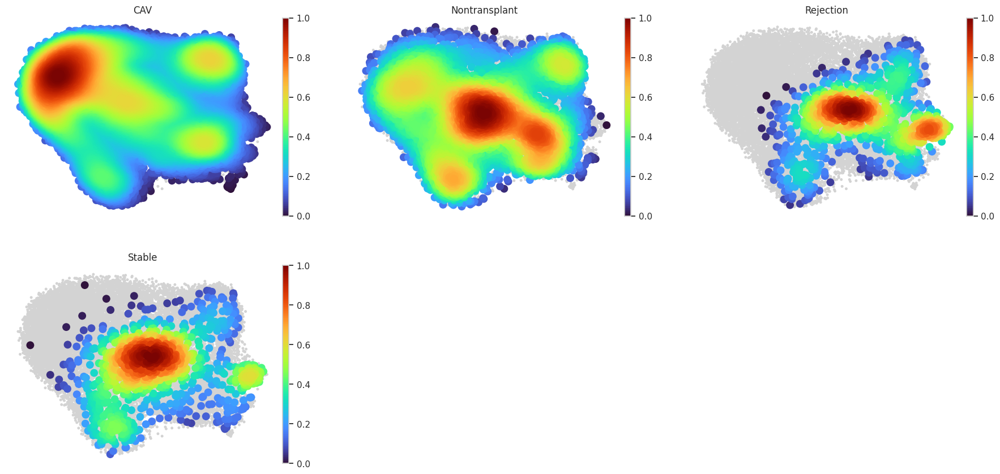

In [152]:
sc.pl.embedding_density(
    adata_filtered,
    basis='umap',
    key='umap_density_DiseaseStatus',
    color_map='turbo',
    fg_dotsize=400,
    bg_dotsize=50,
    frameon=False,
    ncols=3,
    show=False
)

plt.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/"
    "UMAP_DiseaseStatus_density.pdf",
    bbox_inches="tight"
)
plt.show()
plt.close()

In [155]:
# Make a copy
adata_tmp = adata_filtered.copy()

# Combine Stable + Rejection
adata_tmp.obs["DiseaseStatus_collapsed"] = (
    adata_tmp.obs["DiseaseStatus"]
    .replace({"Stable": "NoCAV", "Rejection": "NoCAV"})
)

# Recompute embedding density on collapsed labels
sc.tl.embedding_density(
    adata_tmp,
    basis="umap",
    groupby="DiseaseStatus_collapsed",
    key_added="umap_density_DiseaseStatus_collapsed"
)

# Plot
sc.pl.embedding_density(
    adata_tmp,
    basis="umap",
    key="umap_density_DiseaseStatus_collapsed",
    color_map="turbo",
    fg_dotsize=400,
    bg_dotsize=50,
    frameon=False,
    ncols=3,
    show=False
)

# Save
plt.savefig(
    "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/"
    "UMAP_DiseaseStatus_NoCAV_vs_CAV_density.pdf",
    bbox_inches="tight"
)

plt.close()

computing density on 'umap'
--> added
    'umap_density_DiseaseStatus_collapsed', densities (adata.obs)
    'umap_density_DiseaseStatus_collapsed_params', parameter (adata.uns)


2025-12-15 10:48:18 | [INFO] maxp pruned
2025-12-15 10:48:18 | [INFO] cmap pruned
2025-12-15 10:48:18 | [INFO] kern dropped
2025-12-15 10:48:18 | [INFO] post pruned
2025-12-15 10:48:18 | [INFO] FFTM dropped
2025-12-15 10:48:18 | [INFO] GPOS pruned
2025-12-15 10:48:18 | [INFO] GSUB pruned
2025-12-15 10:48:18 | [INFO] name pruned
2025-12-15 10:48:18 | [INFO] glyf pruned
2025-12-15 10:48:18 | [INFO] Added gid0 to subset
2025-12-15 10:48:18 | [INFO] Added first four glyphs to subset
2025-12-15 10:48:18 | [INFO] Closing glyph list over 'GSUB': 23 glyphs before
2025-12-15 10:48:18 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'N', 'V', 'a', 'eight', 'four', 'l', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'zero']
2025-12-15 10:48:18 | [INFO] Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 25, 27, 36, 38, 49, 57, 68, 79, 81, 82, 83, 85, 86, 87]
2025-12-15 10:48:18 | [INFO] Closed glyph list over 'GSUB': 23 glyphs after
2025-12-15 10:48:18 | [

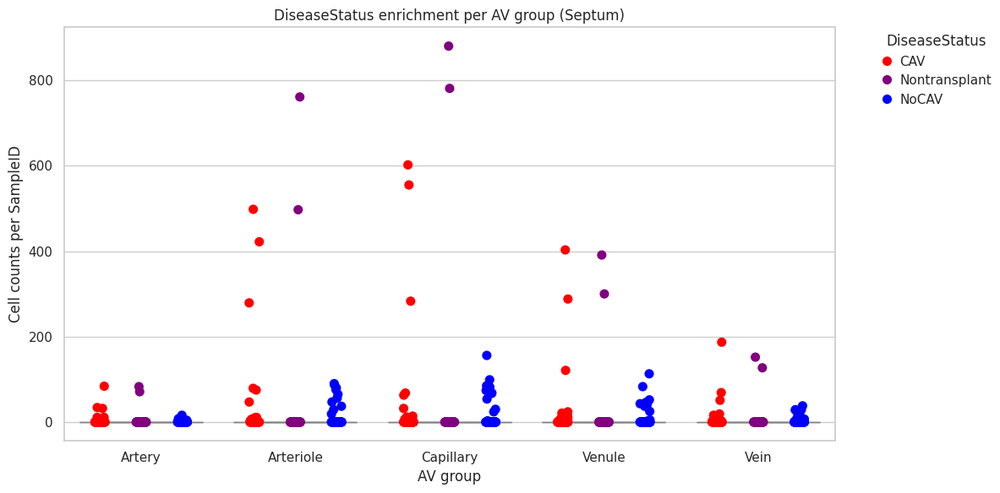

In [135]:
# Only show Septum
plot_diseasestatus_enrichment(adata_sub, location_filter='Septum')


# Export table of sample attributes

In [70]:
# This is with the addition of cellranger protein ids
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025_Dec_JoinedCAVsinglenuclei_singlets_norm_pca_scrub_harm_clust_subset_deID_cleanGvH.h5ad"
adata_filtered = sc.read_h5ad(output_path)

In [71]:
adata_filtered

AnnData object with n_obs × n_vars = 146525 × 31844
    obs: 'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 'souporcell_assignmentBatch', 'souporcell_statusMerge', 'souporcell_assignmentMerge', 'demux_type', 'assignment', 'hashtag_counts', 'demux_confidence', 'hto_assigned_vs_others_ratio', '10xRxn', 'source', 'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p', 'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43', 'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1', 'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1', 'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1', 'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1', 'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1', 'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1', 'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2', 'total_cou

In [75]:
# --- Columns to include ---
metadata_cols = [
    'souporcell_status', 'souporcell_assignment', 'souporcell_statusBatch', 
    'souporcell_assignmentBatch', 'souporcell_statusMerge', '10xRxn', 
    'BatchSouporcell', 'SampleType', 'BankSource', 'Location', 'StrippedDonor', 
    'Day', 'ConfidenceOnHashing', 'DiseaseStatus', 'TimePoint', 'GraftHost',
    'RA_mean', 'RV_systolic', 'RV_diastolic', 'PA_systolic', 'PA_diastolic',
    'PA_mean', 'PCW', 'AV_O2', 'CO', 'CI', 'PVR', 'EF_preop', 'LocationFine', 
    'acute_rejection_grade', 'AcuteCellularRejection', 'AntibodyMediatedRejection', 
    'pAMR', 'allograft_vasculopathy', 'max_stenosis_%', 'thrombosis', 'myocardial_infarct', 
    'fibrosis', 'other_key_findings', 
]

# --- Columns for rounding ---
round_cols = ['Day', 'RA_mean', 'RV_systolic', 'RV_diastolic', 'PA_systolic', 'PA_diastolic', 
              'PA_mean', 'PCW', 'AV_O2', 'CO', 'CI', 'PVR', 'EF_preop']

# --- Feature columns ---
feature_cols = [
    'total_counts_NFkB_p65', 'total_counts_LINE1_ORF1p', 'total_counts_LINE1_ORF2p',
    'total_counts_PTBP1-1', 'total_counts_SRSF7-1', 'total_counts_TDP43',
    'total_counts_HNRNPA1-1', 'total_counts_FNDC3B-1', 'total_counts_SMAD2-1',
    'total_counts_Histone_H3', 'total_counts_IgG', 'total_counts_YAP1-1',
    'total_counts_TAZ-1', 'total_counts_pSTAT3', 'total_counts_ATF3-1',
    'total_counts_HIF1a', 'total_counts_SRSF5-1', 'total_counts_ELAVL1-1',
    'total_counts_SMAD5-1', 'total_counts_Calreticulin', 'total_counts_IRF3-1',
    'total_counts_pSMAD2', 'total_counts_pSTAT1_1', 'total_counts_IRF1_1',
    'total_counts_RPS6-1', 'total_counts_BCL6-1', 'total_counts_pSTAT1_2',
    'total_counts_IRF1_2', 'total_counts_SAMD4A-1'
]

# --- Rounding function ---
def custom_round(x):
    if pd.isna(x):
        return x
    try:
        val = float(x)
    except ValueError:
        return x
    if val > 50:
        return round(val / 10) * 10
    elif 10 <= val <= 50:
        return round(val / 5) * 5
    else:
        return val

# --- Extract obs data ---
obs_df = adata_filtered.obs[metadata_cols + ['cell_type_general', 'total_counts', 'n_genes_by_counts']].copy()

# --- Apply rounding rules ---
for col in round_cols:
    if col in obs_df.columns:
        obs_df[col] = obs_df[col].apply(custom_round)

# --- Add feature counts ---
for col in feature_cols:
    if col in adata_filtered.obs.columns:
        obs_df[col] = adata_filtered.obs[col]
    else:
        print(f"⚠️ Missing: {col}")

# --- Main group summary (by BatchSouporcell) ---
summary_all = (
    obs_df.groupby('BatchSouporcell')
    .agg({
        **{col: 'first' for col in metadata_cols if col != 'BatchSouporcell'},
        'total_counts': 'mean',         # mean UMI per cell
        'n_genes_by_counts': 'mean',    # mean gene count per cell
        **{col: 'sum' for col in feature_cols}
    })
    .rename(columns={'total_counts': 'UMI_count', 'n_genes_by_counts': 'Gene_count'})
)

# --- Add cell count and mean feature count (per cell) ---
summary_all['cellcount'] = obs_df.groupby('BatchSouporcell').size()
summary_all['Feature_count'] = obs_df.groupby('BatchSouporcell')['n_genes_by_counts'].mean()  # mean per cell

# --- Endothelial subset stats ---
endo_df = obs_df[obs_df['cell_type_general'] == 'Endothelial']

if len(endo_df) > 0:
    endo_stats = (
        endo_df.groupby('BatchSouporcell')
        .agg(
            Endo_cellcount=('cell_type_general', 'size'),
            Endo_UMI_count=('total_counts', 'mean'),
            Endo_Gene_count=('n_genes_by_counts', 'mean'),
            Endo_Feature_count=('n_genes_by_counts', 'mean')  # mean per cell (same field as Gene_count)
        )
    )
else:
    endo_stats = pd.DataFrame(columns=['Endo_cellcount', 'Endo_UMI_count', 'Endo_Gene_count', 'Endo_Feature_count'])

# --- Merge overall + Endothelial summaries ---
summary = summary_all.merge(endo_stats, left_index=True, right_index=True, how='left')

# --- Column order ---
ordered_cols = (
    ['StrippedDonor', 'cellcount', 'UMI_count', 'Gene_count', 'Feature_count',
     'Endo_cellcount', 'Endo_UMI_count', 'Endo_Gene_count', 'Endo_Feature_count'] + 
    [col for col in metadata_cols if col != 'BatchSouporcell']
)
summary = summary[ordered_cols]

# --- Save to Excel ---
output_path = "/labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/SI_Table1.xlsx"
summary.to_excel(output_path, index=True)

print(f"✅ Excel summary saved to: {output_path}")
print(f"✅ Rows: {len(summary)}  |  Columns: {len(summary.columns)}")



✅ Excel summary saved to: /labs/Murphy/DataForChris/2025Dec_CAV_10xDataAnalysis/2025DecFigures2025/SI_Table1.xlsx
✅ Rows: 118  |  Columns: 46
